# Baseline   

Цель: предсказать для каждого пользователя взятие/ невзятие каждого из четырех продуктов **в течение месяца после отчетной даты**, исторические данные по ним находятся в targets

In [1]:
import numpy as np

import pandas as pd
from pandas.api.types import is_float_dtype, is_integer_dtype

from collections import Counter
from sklearn.utils import resample

from datetime import datetime
from dateutil.relativedelta import relativedelta

import gc
import glob
import pyarrow.parquet as pq
from tqdm import trange, tqdm

C:\Users\Profit77\AppData\Roaming\Python\Python311\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
from catboost import CatBoostClassifier
from catboost import Pool
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.utils.class_weight import compute_class_weight

In [3]:
from typing import List, Optional, Tuple

In [4]:
import warnings

warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=UserWarning, module='pandas')

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
# найтройки
# Убираем ограничение отображемых колонок
pd.set_option("display.max_columns", None)
# Устанавливаем тему по умолчанию
sb_dark = sns.dark_palette('skyblue', 8, reverse=True) # teal
sns.set(palette=sb_dark)

In [6]:
# Включаем tqdm для pandas, чтобы можно было запускать progress_apply() вместо простого apply()
tqdm.pandas() 
pd.options.display.max_columns = None
pd.options.display.max_rows = 200

In [7]:
eps = 1e-6

In [8]:
# Вывод графика feature importance
def plot_feature_importance(importance, names, model_name="", top_n=-1):
    """Функция вывода feature importance
        :importance - массив важности фичей, полученный от модели
        :names - массив названий фичей
        :model_name - название модели
        :top_n - кол-во выводимых фичей
        
        :return - fi_df - feature importance датафрейм
    """
    feature_importance = np.array(importance)
    feature_names = np.array(names)
    
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)
    
    plt.figure(figsize=(10,8))
    sns.barplot(x=fi_df['feature_importance'][:top_n], y=fi_df['feature_names'][:top_n])
    if top_n != -1:
        plt.title(f"{model_name} FEATURE IMPORTANCE (Top: {top_n})")
    else:
        plt.title(f"{model_name} FEATURE IMPORTANCE")
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')
    return fi_df

In [9]:
# Вывод графика ROC-AUC
def plot_roc_auc(y_true, y_pred):
    fpr, tpr, _ = roc_curve(y_true=y_true, y_score=y_pred)
    roc_auc = roc_auc_score(y_true=y_true, y_score=y_pred)

    plt.figure(figsize=(10, 3))
    plt.plot(fpr, tpr, color='darkorange',
             lw=2, label='ROC curve (area = %0.4f)' % roc_auc, alpha=0.5)

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', alpha=0.5)

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True)
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title('Receiver operating characteristic', fontsize=16)
    plt.legend(loc="lower right", fontsize=12)
    plt.show()
    return roc_auc

def calc_gini(auc_roc):
    gini = 2 * auc_roc - 1
    return gini

In [10]:
PATH = ''
PATH_DATASET = PATH + 'datasets/sber_source/'
PATH_DATASET_OUTPUT = PATH + 'datasets/'
PATH_DATASET_EMBEDDINGS = PATH + 'datasets/embeddings/'

PATH_DATASET_TARGET_TRAIN = PATH_DATASET + 'train_target.parquet/'
PATH_DATASET_TARGET_TEST = PATH_DATASET + 'test_target_b.parquet/'

# таргеты
train_target_files = glob.glob(PATH_DATASET_TARGET_TRAIN + '/*.parquet')
test_target_files = glob.glob(PATH_DATASET_TARGET_TEST + '/*.parquet')

len(train_target_files), len(test_target_files)

(11, 11)

In [312]:
# Загружаем список клиентов у которых нет ни одной транзакции. 
# По итогам анализа решено удалить таких пользователей и если такие встречаются в сабмите ставить 0
client_without_trx = pd.read_csv('client_without_trx.csv')['client_id'].unique()
client_without_geo = pd.read_csv('client_without_geo.csv')['client_id'].unique()
client_without_dlg = pd.read_csv('client_without_dlg.csv')['client_id'].unique()

len(client_without_trx), len(client_without_geo), len(client_without_dlg)

(358345, 650665, 1031488)

In [12]:
# del item_object
# gc.collect()

In [13]:
%%time
# Загружаем факты продаж продуктов по трейн клиентам
train_target_df = pq.read_table(PATH_DATASET_OUTPUT + 'compress_train_target_files_07_06_2024.parquet').to_pandas()
train_target_df = train_target_df.rename(columns={'mon': 'report_next_end'})
train_target_df = train_target_df.reset_index()
train_target_df = train_target_df[['client_id', 'report_next_end', 'target_1', 'target_2', 'target_3', 'target_4']]
train_target_df.shape

CPU times: total: 2.7 s
Wall time: 2.78 s


(10246704, 6)

In [14]:
%%time
# Загружаем факты продаж продуктов по ТЕСТ клиентам
test_target_df = pq.read_table(PATH_DATASET_OUTPUT + 'compress_test_target_files_08_06_2024.parquet').to_pandas()
test_target_df = test_target_df.drop_duplicates(subset=['mon', 'client_id'])
test_target_df = test_target_df.rename(columns={'mon': 'report_next_end'})
test_target_df = test_target_df[['client_id', 'report_next_end', 'target_1', 'target_2', 'target_3', 'target_4']]
test_target_df.shape

CPU times: total: 1.09 s
Wall time: 1.78 s


(1407671, 6)

In [15]:
# добавляем предсказательный столбец в тестовые данные, чтобы расчитать таргет-фичи для них. Это последний период + месяц
def add_submit_month(df:pd.DataFrame) -> pd.DataFrame:
    # ищем максимальную дату для каждого client_id
    max_dates = df.groupby('client_id')['report_next_end'].max().reset_index()
    # добавляем один месяц к максимальной дате
    max_dates['new_report_next_end'] = max_dates['report_next_end'] + pd.DateOffset(months=1)
    submit_df = max_dates[['client_id', 'new_report_next_end']].rename(columns={'new_report_next_end': 'report_next_end'})
    df = pd.concat([df, submit_df], ignore_index=True)
    df = df.sort_values(['client_id', 'report_next_end'])
    # возвращаем итоговый датафрейм с добавленой строкой следующего месяца и связку клиент+отчетный период для сабмита
    return df.fillna(0), submit_df

test_target_df, submit_df = add_submit_month(test_target_df)
test_target_df.shape, submit_df.shape

((1548159, 6), (140488, 2))

In [16]:
submit_df['report_next_end'].value_counts()

report_next_end
2023-01-31    48877
2022-11-30    46086
2022-12-30    45525
Name: count, dtype: int64

In [17]:
# submit_df['client_id'][:1].item()

In [18]:
%%time
# Рассчитываем факт приобретения клиентом когда-либо продукта 1 или 2/3/4
def get_group_targets(df:pd.DataFrame) -> pd.DataFrame:
    # Факт приобретения клиентом когда-либо продукта 1 или 2/3/4
    df['is_target'] = df[['target_1', 'target_2', 'target_3', 'target_4']].max(axis=1)
    
    # Расширеный факт приобретения клиентом когда-либо группы продуктов 
    df['is_target_1_2'] = df[['target_1', 'target_2']].max(axis=1)
    df['is_target_1_3'] = df[['target_1', 'target_3']].max(axis=1)
    df['is_target_1_4'] = df[['target_1', 'target_4']].max(axis=1)
    df['is_target_2_3'] = df[['target_2', 'target_3']].max(axis=1)
    df['is_target_2_4'] = df[['target_2', 'target_4']].max(axis=1)
    df['is_target_3_4'] = df[['target_3', 'target_4']].max(axis=1)
    
    df['is_target_123'] = df[['target_1', 'target_2', 'target_3']].max(axis=1)
    df['is_target_134'] = df[['target_1', 'target_3', 'target_4']].max(axis=1)
    df['is_target_124'] = df[['target_1', 'target_2', 'target_4']].max(axis=1)
    df['is_target_234'] = df[['target_2', 'target_3', 'target_4']].max(axis=1)
    
    # Второй расширеный факт приобретения клиентом когда-либо группы продуктов 
    df['is_target_1_and_2'] = np.where(df[['target_1', 'target_2']].sum(axis=1) == 2, 1,0)
    df['is_target_1_and_3'] = np.where(df[['target_1', 'target_3']].sum(axis=1) == 2, 1,0)
    df['is_target_1_and_4'] = np.where(df[['target_1', 'target_4']].sum(axis=1) == 2, 1,0)
    df['is_target_2_and_3'] = np.where(df[['target_2', 'target_3']].sum(axis=1) == 2, 1,0)
    df['is_target_2_and_4'] = np.where(df[['target_2', 'target_4']].sum(axis=1) == 2, 1,0)
    df['is_target_3_and_4'] = np.where(df[['target_3', 'target_4']].sum(axis=1) == 2, 1,0)
    
    # кол-во купленных продуктов
    df['is_target_cnt'] = df[['target_1', 'target_2', 'target_3', 'target_4']].sum(axis=1)

    return df

test_target_df = get_group_targets(test_target_df)
train_target_df = get_group_targets(train_target_df)

train_target_df.shape, test_target_df.shape

CPU times: total: 12.9 s
Wall time: 12.7 s


((10246704, 24), (1548159, 24))

In [19]:
target_columns = ['target_1', 'target_2', 'target_3', 'target_4',
                  'is_target', 'is_target_1_2', 'is_target_1_3',
                  'is_target_1_4', 'is_target_2_3', 'is_target_2_4', 'is_target_3_4',
                  'is_target_1_and_2', 'is_target_1_and_3', 'is_target_1_and_4',
                  'is_target_2_and_3', 'is_target_2_and_4', 'is_target_3_and_4',
                  'is_target_123', 'is_target_134', 'is_target_124', 'is_target_234',
                  'is_target_cnt']
len(target_columns)

22

In [20]:
%%time
# Надо определить для каждого месяца, покупал ли клиент ранее продукт или нет
def is_prebuy_product(df:pd.DataFrame, target_col:str) -> pd.DataFrame:
    # Сортируем по клиенту и отчетному периоду
    df = df.sort_values(['client_id', 'report_next_end'])

    # Создаем новую колонку c фактом предудыщей покупи
    df[f'prebuy_{target_col}'] = (df.groupby('client_id')[target_col]
                                   .cummax()
                                   .shift(1)
                                   .fillna(0)
                                   .astype(int))
    # Кол-во приобретенных продуктов
    df[f'cnt_prebuy_{target_col}'] = (df.groupby('client_id')[target_col]
                                           .cumsum()
                                           .shift(1)
                                           .fillna(0)
                                           .astype(int))    
    return df

for tar_col in tqdm(target_columns):
    test_target_df = is_prebuy_product(df=test_target_df, target_col=tar_col)
    train_target_df = is_prebuy_product(df=train_target_df, target_col=tar_col)
    
train_target_df.shape, test_target_df.shape

100%|██████████| 22/22 [02:47<00:00,  7.63s/it]

CPU times: total: 2min 50s
Wall time: 2min 47s


((10246704, 68), (1548159, 68))

In [21]:
%%time
# Уменьшение размера датафрейма, для таргетов, транзакцй и для фичей
def series_to_int(col_df:pd.Series):
    """
    Перевод в целочисленные типы
    """
    min_val = col_df.min()
    max_val = col_df.max()
    if min_val >= -128 and max_val <= 127:
        col_df = col_df.astype('int8')
    elif min_val >= -32768 and max_val <= 32767:
        col_df = col_df.astype('int16')
    elif min_val >= -2147483648 and max_val <= 2147483647:
        col_df = col_df.astype('int32')
    else:
        col_df = col_df.astype('int64')
    return col_df

def compression_df(df:pd.DataFrame(), datetime_cols:List[str]=[], category_cols:List[str]=[]):
    """
    Уменьшение размера датафрейма, для таргетов, транзакцй и для фичей
    """
    float64_cols = list(df.select_dtypes(include='float64'))  
    df[float64_cols] = df[float64_cols].astype('float32')
    for col in df.columns:
        if col in category_cols:
            df[col] = df[col].astype('category')
        elif col in datetime_cols:
            if df[col].dtypes == 'object':
                df[col] = pd.to_datetime(df[col])
                
#         Неподходит делать перед заполнением пропусков, т.к. перед переводом float в int приходится все NaN перевести в 0
#         # Если колонка содержит числа 
#         elif is_integer_dtype(df[col]):
#             if df[col].dtypes == 'int8':
#                 continue
#             else:
#                 df[col] = series_to_int(df[col])
#         elif is_float_dtype(df[col]):
#             # Возможно ли перевести в число
#             if np.array_equal(df[col].fillna(0), df[col].fillna(0).astype(int)):
#                 df[col] = df[col].fillna(0)
#                 df[col] = series_to_int(df[col])
    return df
test_target_df = compression_df(test_target_df, 
                            datetime_cols=['report_end' ,'report_next_end'],
                           )
test_target_df.shape

CPU times: total: 172 ms
Wall time: 177 ms


(1548159, 68)

In [22]:
train_target_df = train_target_df.rename(columns={'mon': 'report_next_end'})
train_target_df = train_target_df.set_index(['client_id','report_next_end'])
train_target_df.shape

(10246704, 66)

In [23]:
test_target_df = test_target_df.rename(columns={'mon': 'report_next_end'})
test_target_df = test_target_df.set_index(['client_id','report_next_end'])
test_target_df.shape

(1548159, 66)

In [24]:
submit_df = submit_df.rename(columns={'mon': 'report_next_end'})
submit_df = submit_df.set_index(['client_id','report_next_end'])
submit_df.shape

(140488, 0)

In [25]:
# Формируем тестовый датафрейм на базе сабмит фрейма
submit_test_df = submit_df.merge(test_target_df, left_index=True, right_index=True)
submit_test_df.shape

(140488, 66)

In [26]:
# Объединяем сабмит с остальной выборкой 

In [27]:
train_target_df.shape, submit_test_df.shape

((10246704, 66), (140488, 66))

## Фильтруем данные только по сэмплированным парам клиент-месяц

In [28]:
%%time
# загружаем сэмплерированные данные, для которых будем рассчитывать фичи
smpl_Client_Month_df = pq.read_table(PATH_DATASET_OUTPUT + 'result_sample_Client_Month_df_12_06_2024.parquet').to_pandas()
smpl_Client_Month_df = smpl_Client_Month_df.set_index(['client_id', 'report_next_end'])
smpl_Client_Month_df.shape

CPU times: total: 1.08 s
Wall time: 1.65 s


(747847, 1)

In [29]:
# Фильтруем трейн
train_target_df = train_target_df[train_target_df.index.isin(smpl_Client_Month_df.index)]
# Проверяем сабмит
assert len(submit_test_df[submit_test_df.index.isin(smpl_Client_Month_df.index)]) == len(submit_test_df), "В сэмплере отсутсвтуют данные по сабмиту"
assert len(submit_test_df[submit_test_df.index.isin(smpl_Client_Month_df[smpl_Client_Month_df['type'] == 'submit'].index)]) == len(submit_test_df), "В сэмплере отсутсвтуют данные по сабмиту"
train_target_df.shape, submit_test_df.shape

((607359, 66), (140488, 66))

In [30]:
# union_client_agg_df = train_target_df

## Загружаем фичи по диалогам

In [29]:
%%time
# Загружаем фичи-агрегаты по транзакциям
client_agg_dialog_df = pq.read_table(PATH_DATASET_OUTPUT + 'client_agg_dialog_09_06_2024.parquet').to_pandas()
client_agg_dialog_df = client_agg_dialog_df.reset_index().set_index(['client_id', 'report_next_end'])
client_agg_dialog_df.shape

CPU times: total: 1min 5s
Wall time: 2min 11s


(3589833, 18)

In [30]:
embedding_columns = ['mean_embedding', 'pca_embedding', 'fullt_mean_embedding', 'fullt_pca_embedding'] # 'embedding'
client_agg_dialog_df = client_agg_dialog_df.drop(columns=embedding_columns, errors='ignore')
client_agg_dialog_df.shape

(3589833, 14)

In [31]:
# union_client_agg_df.shape, submit_test_df.shape
# client_agg_dialog_df

In [32]:
# Объединяем фичи с данными трейна и сабмита
union_client_agg_df = union_client_agg_df.merge(client_agg_dialog_df, left_index=True, right_index=True, how='left')
submit_test_df = submit_test_df.merge(client_agg_dialog_df, left_index=True, right_index=True, how='left')
union_client_agg_df.shape, submit_test_df.shape

((607359, 80), (140488, 80))

In [33]:
del client_agg_dialog_df
gc.collect()

0

In [34]:
submit_test_df

,,target_1,target_2,target_3,target_4,is_target,is_target_1_2,is_target_1_3,is_target_1_4,is_target_2_3,is_target_2_4,is_target_3_4,is_target_123,is_target_134,is_target_124,is_target_234,is_target_1_and_2,is_target_1_and_3,is_target_1_and_4,is_target_2_and_3,is_target_2_and_4,is_target_3_and_4,is_target_cnt,prebuy_target_1,cnt_prebuy_target_1,prebuy_target_2,cnt_prebuy_target_2,prebuy_target_3,cnt_prebuy_target_3,prebuy_target_4,cnt_prebuy_target_4,prebuy_is_target,cnt_prebuy_is_target,prebuy_is_target_1_2,cnt_prebuy_is_target_1_2,prebuy_is_target_1_3,cnt_prebuy_is_target_1_3,prebuy_is_target_1_4,cnt_prebuy_is_target_1_4,prebuy_is_target_2_3,cnt_prebuy_is_target_2_3,prebuy_is_target_2_4,cnt_prebuy_is_target_2_4,prebuy_is_target_3_4,cnt_prebuy_is_target_3_4,prebuy_is_target_1_and_2,cnt_prebuy_is_target_1_and_2,prebuy_is_target_1_and_3,cnt_prebuy_is_target_1_and_3,prebuy_is_target_1_and_4,cnt_prebuy_is_target_1_and_4,prebuy_is_target_2_and_3,cnt_prebuy_is_target_2_and_3,prebuy_is_target_2_and_4,cnt_prebuy_is_target_2_and_4,prebuy_is_target_3_and_4,cnt_prebuy_is_target_3_and_4,prebuy_is_target_123,cnt_prebuy_is_target_123,prebuy_is_target_134,cnt_prebuy_is_target_134,prebuy_is_target_124,cnt_prebuy_is_target_124,prebuy_is_target_234,cnt_prebuy_is_target_234,prebuy_is_target_cnt,cnt_prebuy_is_target_cnt,sum_embedding,embedding_variance,min_embedding_distance,max_embedding_distance,mean_consecutive_distance,embedding_entropy,embedding_path_length,fullt_sum_embedding,fullt_embedding_variance,fullt_min_embedding_distance,fullt_max_embedding_distance,fullt_mean_consecutive_distance,fullt_embedding_entropy,fullt_embedding_path_length
client_id,report_next_end,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
00011c01bb22d8f62d9655f32d123dcca5ae55179f8266bdb8676e25321e8477,2023-01-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17.378586,0.000000,0.0,0.000000,NaN,NaN,0.000000,17.378586,0.000000,0.0,0.000000,NaN,NaN,0.000000
0001ac6446bf223a094d6514a6c890d82e9aa92104dee0a8afc28b2002b95dac,2023-01-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0,0,0,0,1,1,0,0,1,1,0,0,1,1,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,1,1,1,1,42.023727,0.004733,0.0,3.813296,3.813296,16.308987,3.813296,306.637787,0.015695,0.0,12.330898,4.345003,48.710587,73.865044
0001b878e81279fa43c4429616359b5b276eecc69ddc315f0125d0e289950911,2023-01-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0003304a0f65d675ddfbc0691e0c564d26a4c9e08edf67e1823e833e8b05fa99,2023-01-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,14.617382,0.000000,0.0,0.000000,NaN,NaN,0.000000
00037813e71deead5685649d494c9a412391942fe771e2699bcc33029bd5c7dd,2023-01-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,1,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,1,1,1,1,1,1,1,1,2,2,NaN,NaN,0.0,NaN,NaN,NaN,NaN,53.374283,0.009397,0.0,5.323211,4.251891,30.719791,8.503782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffe5f5ed982ea0afd11d42127fa4b04e8ced8097152d00f4ea528150fbc6729,2022-11-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

### Загружаем фичи по транзакциям

In [35]:
%%time
# Загружаем фичи-агрегаты по транзакциям
# compress_trx_df = pq.read_table(PATH_DATASET_OUTPUT + 'index_without_empty_compress_client_features_agg_trx_df_07_06_2024.parquet').to_pandas()
compress_trx_df = pq.read_table(PATH_DATASET_OUTPUT + 'sample_agg_trx_withNAN__12_06_2024.parquet').to_pandas()
compress_trx_df = compress_trx_df.set_index(['client_id', 'report_next_end'])
compress_trx_df.shape

CPU times: total: 17.4 s
Wall time: 7.22 s


(506443, 1472)

In [36]:
# Сжимаем данные
float64_cols = list(compress_trx_df.select_dtypes(include='float64'))  
compress_trx_df[float64_cols] = compress_trx_df[float64_cols].astype('float32')
compress_trx_df.shape

(506443, 1472)

In [37]:
# Определяем клиентов/период которых исключим из обучения.
# Исключаем пары клиент/дата если у них небыло транзакций
# compress_trx_df = compress_trx_df[compress_trx_df['agg_mon__len_amt'] > 0]
# compress_trx_df.shape

In [38]:
# %%time
# # Сохраняем в файл оптимизированный файл 
# compress_trx_df.to_parquet(PATH_DATASET_OUTPUT + 'index_without_empty_compress_client_features_agg_trx_df_07_06_2024.parquet')
# compress_trx_df.shape

In [39]:
# compress_trx_df = compress_trx_df.set_index(['client_id','report_next_end'])
# compress_trx_df.shape

In [40]:
# %%time
# # Сохраняем в файл оптимизированный файл 
# client_features_agg_trx_df.to_parquet(PATH_DATASET_OUTPUT + 'index_compress_client_features_agg_trx_df_07_06_2024.parquet')
# client_features_agg_trx_df.shape

In [41]:
# # train_agg_mon__len_amt_df = train_target_df.merge(compress_trx_df['agg_mon__len_amt'], left_index=True, right_index=True, how='left')
# # train_agg_mon__len_amt_df = train_agg_mon__len_amt_df.reset_index()
# # train_agg_mon__len_amt_df.shape

# train_agg_mon__len_amt_df = train_target_df.merge(compress_trx_df, left_index=True, right_index=True)
# # train_agg_mon__len_amt_df = train_agg_mon__len_amt_df.reset_index()
# train_agg_mon__len_amt_df.shape

In [42]:
# compress_trx_df.info()

In [43]:
# compress_trx_df

In [44]:
# compress_trx_df[['agg_src_type32_17__len_amt']].info()

In [45]:
# Формируем фичи для тестовых пользователей
submit_test_df = submit_test_df.merge(compress_trx_df, left_index=True, right_index=True, how='left')
# submit_test_df = submit_test_df.fillna(0)
submit_test_df.shape

(140488, 1552)

In [46]:
# compress_trx_df.reset_index()[['client_id', 'report_next_end']].info()

In [47]:
%%time
# Формируем фичи для Трейн пользователей.
union_client_agg_df = union_client_agg_df.merge(compress_trx_df, left_index=True, right_index=True, how='left')
# Удаляем из памяти транзакции
del compress_trx_df
gc.collect()
union_client_agg_df.shape

CPU times: total: 8.34 s
Wall time: 8.35 s


(607359, 1552)

In [48]:
%%time
# Заполняем пропуски медиаными значениями
# union_client_agg_df = union_client_agg_df.fillna(union_client_agg_df.median())
# submit_test_df = submit_test_df.fillna(submit_test_df.median())
# Заполняем пропуски нулями
union_client_agg_df = union_client_agg_df.fillna(0)
submit_test_df = submit_test_df.fillna(0)

union_client_agg_df.shape, submit_test_df.shape

CPU times: total: 3.83 s
Wall time: 3.83 s


((607359, 1552), (140488, 1552))

In [49]:
# submit_test_df[features_columns]

In [50]:
# del geohash_df
# gc.collect()

In [51]:
# submit_test_df

### Загружаем ГЕО фичи

In [52]:
# Добавляем геофичи
# geohash_df = pq.read_table(PATH_DATASET_OUTPUT + f'clients_top_geohash_4_df_10_06_2024_v2.parquet').to_pandas()
geohash_df = pq.read_table(PATH_DATASET_OUTPUT + f'geo_by_clients_df_13_06_2024.parquet').to_pandas()
geohash_df.shape

(435751, 58)

In [53]:
union_client_agg_df.shape, submit_test_df.shape

((607359, 1552), (140488, 1552))

In [54]:
%%time
# Мержим
submit_test_df = submit_test_df.merge(geohash_df, left_index=True, right_index=True, how='left')
union_client_agg_df = union_client_agg_df.merge(geohash_df, left_index=True, right_index=True, how='left')
# Сразу же удаляем из памяти
del geohash_df
gc.collect()
union_client_agg_df.shape, submit_test_df.shape

CPU times: total: 4.73 s
Wall time: 4.75 s


((607359, 1610), (140488, 1610))

In [55]:
# # Добавляем геофичи
# def add_geo_features(train_df:pd.DataFrame, test_df, resolution:int) -> Tuple[pd.DataFrame, pd.DataFrame]:
#     geohash_df = pq.read_table(PATH_DATASET_OUTPUT + f'compress_clients_top_geohash_{resolution}_df_06_06_2024.parquet').to_pandas()
#     geohash_df = geohash_df.set_index(['client_id','report_next_end'])
#     geohash_df = geohash_df.drop(columns='report_end', errors='ignore')
#     geohash_df = geohash_df.add_prefix(f'geo{resolution}_')
    
#     # Выбираем только те объекты клиент-отчет, которые есть в тренировочном сводном файле
#     # geohash_df = geohash_df[geohash_df.index.isin(compress_trx_df.index)]
#     geohash_df = geohash_df[
#                 (geohash_df.index.isin(test_df.index))|
#                 (geohash_df.index.isin(train_df.index))]
#     test_df = test_df.merge(geohash_df, left_index=True, right_index=True, how='left')
#     train_df = train_df.merge(geohash_df, left_index=True, right_index=True, how='left')

#     # Сразу же удаляем из памяти
#     del geohash_df
#     gc.collect()

#     return train_df, test_df

# # Добавляем геофичи
# for resolution in tqdm([4, 5, 6]):
#     union_client_agg_df, submit_test_df = add_geo_features(train_df=union_client_agg_df, test_df=submit_test_df, resolution=resolution)
    
# union_client_agg_df.shape, submit_test_df.shape

In [56]:
# del union_client_agg_df_tmp

## Загружаем фичи по таргетам (прошлым фактам покупок)

In [57]:
%%time
# Загружаем фичи-агрегаты по транзакциям
client_agg_target_df = pq.read_table(PATH_DATASET_OUTPUT + 'client_agg_target_09_06_2024.parquet').to_pandas()
client_agg_target_df = client_agg_target_df.add_prefix(f'ftrg_')
client_agg_target_df.shape

CPU times: total: 22.3 s
Wall time: 8.78 s


(15910080, 96)

In [58]:
client_agg_target_df = client_agg_target_df.drop(columns=['ftrg_agg_curmon_sum_target_1', 'ftrg_agg_curmon_sum_target_2', 'ftrg_agg_curmon_sum_target_3', 'ftrg_agg_curmon_sum_target_4', 'ftrg_agg_curmon_sum_is_target', 'ftrg_agg_curmon_sum_is_target_1_2', 'ftrg_agg_curmon_sum_is_target_1_3', 'ftrg_agg_curmon_sum_is_target_1_4', 'ftrg_agg_curmon_sum_is_target_2_3', 'ftrg_agg_curmon_sum_is_target_2_4', 'ftrg_agg_curmon_sum_is_target_3_4', 'ftrg_agg_curmon_sum_is_target_1_and_2', 'ftrg_agg_curmon_sum_is_target_1_and_3', 'ftrg_agg_curmon_sum_is_target_1_and_4', 'ftrg_agg_curmon_sum_is_target_2_and_3', 'ftrg_agg_curmon_sum_is_target_2_and_4', 'ftrg_agg_curmon_sum_is_target_3_and_4', 'ftrg_agg_curmon_sum_is_target_123', 'ftrg_agg_curmon_sum_is_target_134', 'ftrg_agg_curmon_sum_is_target_124', 'ftrg_agg_curmon_sum_is_target_234', 'ftrg_agg_curmon_sum_is_target_cnt', 'ftrg_agg_nxtmon_sum_target_1', 'ftrg_agg_nxtmon_sum_target_2', 'ftrg_agg_nxtmon_sum_target_3', 'ftrg_agg_nxtmon_sum_target_4', 'ftrg_agg_nxtmon_sum_is_target', 'ftrg_agg_nxtmon_sum_is_target_1_2', 'ftrg_agg_nxtmon_sum_is_target_1_3', 'ftrg_agg_nxtmon_sum_is_target_1_4', 'ftrg_agg_nxtmon_sum_is_target_2_3', 'ftrg_agg_nxtmon_sum_is_target_2_4', 'ftrg_agg_nxtmon_sum_is_target_3_4', 'ftrg_agg_nxtmon_sum_is_target_1_and_2', 'ftrg_agg_nxtmon_sum_is_target_1_and_3', 'ftrg_agg_nxtmon_sum_is_target_1_and_4', 'ftrg_agg_nxtmon_sum_is_target_2_and_3', 'ftrg_agg_nxtmon_sum_is_target_2_and_4', 'ftrg_agg_nxtmon_sum_is_target_3_and_4', 'ftrg_agg_nxtmon_sum_is_target_123', 'ftrg_agg_nxtmon_sum_is_target_134', 'ftrg_agg_nxtmon_sum_is_target_124', 'ftrg_agg_nxtmon_sum_is_target_234', 'ftrg_agg_nxtmon_sum_is_target_cnt'], errors='ignore')
client_agg_target_df.shape

(15910080, 96)

In [59]:
# union_client_agg_df = union_client_agg_df.drop(columns=client_agg_target_df.columns, errors='ignore')
# submit_test_df = submit_test_df.drop(columns=client_agg_target_df.columns, errors='ignore')
# union_client_agg_df.shape, submit_test_df.shape

In [60]:
# Объединяем фичи с данными трейна и сабмита
union_client_agg_df = union_client_agg_df.merge(client_agg_target_df, left_index=True, right_index=True, how='left')
submit_test_df = submit_test_df.merge(client_agg_target_df, left_index=True, right_index=True, how='left')
union_client_agg_df.shape, submit_test_df.shape

((607359, 1706), (140488, 1706))

In [61]:
del client_agg_target_df
gc.collect()

0

## Загружаем статистику по ксосинусной близости

In [62]:
%%time
# Загружаем статистику по косинусной близости
cos_dialogs_df = pq.read_table(PATH_DATASET_OUTPUT + f'cos_dialogs_by_clients_df_13_06_2024.parquet').to_pandas()
cos_dialogs_df.shape

CPU times: total: 656 ms
Wall time: 1.49 s


(71877, 540)

In [63]:
union_client_agg_df.shape, submit_test_df.shape

((607359, 1706), (140488, 1706))

In [64]:
%%time
# Мержим
submit_test_df = submit_test_df.merge(cos_dialogs_df, left_index=True, right_index=True, how='left')
union_client_agg_df = union_client_agg_df.merge(cos_dialogs_df, left_index=True, right_index=True, how='left')
# Сразу же удаляем из памяти
del cos_dialogs_df
gc.collect()
union_client_agg_df.shape, submit_test_df.shape

CPU times: total: 5.8 s
Wall time: 5.79 s


((607359, 2246), (140488, 2246))

In [65]:
%%time
# Загружаем статистику по косинусной близости
part_emb_dialogs_df = pq.read_table(PATH_DATASET_OUTPUT + f'part_embed_dialogs_by_clients_df_13_06_2024.parquet').to_pandas()
part_emb_dialogs_df.shape

CPU times: total: 1.86 s
Wall time: 2.14 s


(157883, 480)

In [66]:
union_client_agg_df.shape, submit_test_df.shape

((607359, 2246), (140488, 2246))

In [67]:
%%time
# Мержим
submit_test_df = submit_test_df.merge(part_emb_dialogs_df, left_index=True, right_index=True, how='left')
union_client_agg_df = union_client_agg_df.merge(part_emb_dialogs_df, left_index=True, right_index=True, how='left')
# Сразу же удаляем из памяти
del part_emb_dialogs_df
gc.collect()
union_client_agg_df.shape, submit_test_df.shape

CPU times: total: 7.34 s
Wall time: 7.34 s


((607359, 2726), (140488, 2726))

## Загружаем эмбеддинги диалогов

In [68]:
# %%time
# # Загружаем эмбеддинги диалогов
# train_emb_dial_v4_df = pq.read_table(PATH_DATASET_EMBEDDINGS + 'train_emb_dial_v4.parquet').to_pandas()
# test_emb_dial_v4_df = pq.read_table(PATH_DATASET_EMBEDDINGS + 'test_emb_dial_v4.parquet').to_pandas()
# train_emb_dial_v4_df.shape, test_emb_dial_v4_df.shape

In [69]:
# # pd.to_datetime((datetime(2022,1,1) + relativedelta(months=1) - relativedelta(days=1)).date())
# train_emb_dial_v4_df = train_emb_dial_v4_df.drop(columns=['year', 'month', 'target_1', 'target_2', 'target_3', 'target_4'], errors='ignore')
# test_emb_dial_v4_df = test_emb_dial_v4_df.drop(columns=['year', 'month', 'target_1', 'target_2', 'target_3', 'target_4'], errors='ignore')
# train_emb_dial_v4_df.shape, test_emb_dial_v4_df.shape

In [70]:
# train_emb_dial_v4_df = train_emb_dial_v4_df.rename(columns={'mon': 'report_next_end'})
# test_emb_dial_v4_df = test_emb_dial_v4_df.rename(columns={'mon': 'report_next_end'})
# train_emb_dial_v4_df = train_emb_dial_v4_df.set_index(['client_id', 'report_next_end'])
# test_emb_dial_v4_df = test_emb_dial_v4_df.set_index(['client_id', 'report_next_end'])
# train_emb_dial_v4_df.shape, test_emb_dial_v4_df.shape

In [71]:
# # Объединяем фичи с данными трейна и сабмита
# union_client_agg_df = union_client_agg_df.merge(train_emb_dial_v4_df, left_index=True, right_index=True, how='left')
# submit_test_df = submit_test_df.merge(test_emb_dial_v4_df, left_index=True, right_index=True, how='left')
# union_client_agg_df.shape, submit_test_df.shape
# # ((405640, 592), (140488, 592))

In [72]:
# submit_test_df

In [73]:
# union_client_agg_df = union_client_agg_df.drop(columns=client_agg_dialog_df.columns)
# submit_test_df = submit_test_df.drop(columns=client_agg_dialog_df.columns)
# union_client_agg_df.shape, submit_test_df.shape

In [74]:
# client_agg_dialog_df
# 'mean_embedding', 'pca_embedding', 'fullt_mean_embedding', 'fullt_pca_embedding'

In [75]:
# union_client_agg_df

In [76]:
# %%time
# compress_trx_df = compress_trx_df.merge(clients_top_geohash_4_df, left_index=True, right_index=True, how='left')
# compress_trx_df.shape

In [77]:
# del clients_top_geohash_4_df
# gc.collect()

In [78]:
# %%time
# clients_top_geohash_5_df = pq.read_table(PATH_DATASET_OUTPUT + 'compress_clients_top_geohash_5_df_06_06_2024.parquet').to_pandas()
# clients_top_geohash_5_df = clients_top_geohash_5_df.set_index(['client_id','report_next_end'])
# clients_top_geohash_5_df = clients_top_geohash_5_df.drop(columns='report_end', errors='ignore')
# clients_top_geohash_5_df = clients_top_geohash_5_df.add_prefix('geo5_')
# # ВЫбираем только те объекты клиент-отчет, которые есть в тренировочном сводном файле
# clients_top_geohash_5_df = clients_top_geohash_5_df[clients_top_geohash_5_df.index.isin(compress_trx_df.index)]
# clients_top_geohash_5_df.shape

In [79]:
# %%time
# submit_test_df = submit_test_df.merge(clients_top_geohash_5_df, left_index=True, right_index=True, how='left')
# submit_test_df.shape

In [80]:
# %%time
# compress_trx_df = compress_trx_df.merge(clients_top_geohash_5_df, left_index=True, right_index=True, how='left')
# compress_trx_df.shape

In [81]:
# del clients_top_geohash_5_df
# gc.collect()

In [82]:
# %%time
# clients_top_geohash_6_df = pq.read_table(PATH_DATASET_OUTPUT + 'compress_clients_top_geohash_6_df_06_06_2024.parquet').to_pandas()
# clients_top_geohash_6_df = clients_top_geohash_6_df.set_index(['client_id','report_next_end'])
# clients_top_geohash_6_df = clients_top_geohash_6_df.drop(columns='report_end', errors='ignore')
# clients_top_geohash_6_df = clients_top_geohash_6_df.add_prefix('geo6_')
# # ВЫбираем только те объекты клиент-отчет, которые есть в тренировочном сводном файле
# clients_top_geohash_6_df = clients_top_geohash_6_df[clients_top_geohash_6_df.index.isin(compress_trx_df.index)]
# clients_top_geohash_6_df.shape

In [83]:
# %%time
# submit_test_df = submit_test_df.merge(clients_top_geohash_6_df, left_index=True, right_index=True, how='left')
# submit_test_df.shape

In [84]:
# X_train

In [85]:
# %%time
# compress_trx_df = compress_trx_df.merge(clients_top_geohash_6_df, left_index=True, right_index=True, how='left')
# compress_trx_df.shape

In [86]:
# del clients_top_geohash_6_df
# gc.collect()

In [87]:
# compress_trx_df = compress_trx_df.reset_index()
# compress_trx_df = compress_trx_df.set_index(['client_id','report_next_end'])

In [88]:
# %%time
# from sklearn.model_selection import train_test_split
# # Разделение на трейн и тест будет производиться независимо для каждого таргета
# # Разделять будем по клиентам, т.е. важно чтобы в трейне и тесте клиенты не совпадали
# # Поэтому сначала схлопываем клиентов с признаком хотя бы раз покупал продукт в любом месяце
# # Далее делим клиентов стратификацией по факту приобретения продукта
# # Далее возвращаем все отчетные месяцы для клиентов train/test/val выборок
# def split_train_test_val(df:pd.DataFrame, target_column:str='target_1'):
#     client_any_one_target_df = df[[target_column, 'client_id']].groupby('client_id')[target_column].agg(lambda x: any(x)).reset_index()
#     X_train, X_test, _, y_test = train_test_split(client_any_one_target_df['client_id'], 
#                                                         client_any_one_target_df[target_column], 
#                                                         test_size=0.1, 
#                                                         stratify=client_any_one_target_df[target_column], 
#                                                         random_state=53)
#     X_test, X_val, _, _ = train_test_split(X_test, 
#                                            y_test, 
#                                            test_size=0.5, 
#                                            stratify=y_test, 
#                                            random_state=53)

#     X_train = df[df['client_id'].isin(X_train.values)]
#     X_val = df[df['client_id'].isin(X_val.values)]
#     X_test = df[df['client_id'].isin(X_test.values)]

#     assert len(set(X_train['client_id'].values)&set(X_test['client_id'].values)) == 0, 'Ошибка в разделение клиентов X_train и X_test'
#     assert len(set(X_test['client_id'].values)&set(X_val['client_id'].values)) == 0, 'Ошибка в разделение клиентов  X_val и X_test'
#     assert len(set(X_train['client_id'].values)&set(X_val['client_id'].values)) == 0, 'Ошибка в разделение клиентов X_train и X_val'
    
#     return X_train, X_val, X_test

# train_label_df, val_label_df, test_label_df = split_train_test_val(
#                             train_target_df.reset_index()
#                             )
# train_label_df.shape, val_label_df.shape, test_label_df.shape

In [89]:
# %%time
# train_label_df = train_label_df.set_index(['client_id','report_next_end'])
# val_label_df = val_label_df.set_index(['client_id','report_next_end'])
# test_label_df = test_label_df.set_index(['client_id','report_next_end'])
# train_label_df.shape, val_label_df.shape, test_label_df.shape

In [90]:
%%time
# Определяем лейблы для трейн/вал/тест
train_label_df = smpl_Client_Month_df[smpl_Client_Month_df['type'].isin(['random_0_class', 'any_1_class'])]
val_label_df = smpl_Client_Month_df[smpl_Client_Month_df['type'] == 'val']
test_label_df = smpl_Client_Month_df[smpl_Client_Month_df['type'] == 'test']
train_label_df.shape, val_label_df.shape, test_label_df.shape

CPU times: total: 78.1 ms
Wall time: 78 ms


((546741, 1), (30427, 1), (30191, 1))

In [91]:
# train_label_df
# smpl_Client_Month_dfsample_agg_trx_withNAN__12_06_2024

# smpl_Client_Month_df['type'].value_counts()

In [92]:
# # Зануляем NaN
# union_client_agg_df = union_client_agg_df.fillna(0)
# submit_test_df = submit_test_df.fillna(0)
# union_client_agg_df.shape, submit_test_df.shape

In [1809]:
# Создаем сабмит датафрейм для итоговых предсказаний 
result_submit_df = submit_test_df.reset_index()[['client_id']]
orig_result_submit_df = submit_test_df.reset_index()[['client_id']]
result_submit_df.shape, orig_result_submit_df.shape

((140488, 1), (140488, 1))

In [94]:
# test_target_df.drop(columns=target_columns).columns
embedding_columns = ['mean_embedding', 'pca_embedding', 'fullt_mean_embedding', 'fullt_pca_embedding', 'geohash_4_cat' ] # 'embedding'
submit_test_df = submit_test_df.drop(columns=embedding_columns, errors='ignore')
union_client_agg_df = union_client_agg_df.drop(columns=embedding_columns, errors='ignore')
union_client_agg_df.shape, submit_test_df.shape

((607359, 2726), (140488, 2726))

In [95]:
# union_client_agg_df = 
# union_client_agg_df.fillna(union_client_agg_df.median())
# submit_test_df
# cat_columns
# union_client_agg_df[features_columns] = union_client_agg_df[features_columns].fillna(union_client_agg_df[features_columns].median())
# submit_test_df[features_columns] = submit_test_df[features_columns].fillna(submit_test_df[features_columns].median())
# union_client_agg_df = union_client_agg_df.fillna(union_client_agg_df.median())
# submit_test_df = submit_test_df.fillna(submit_test_df.median())
# ['mean_embedding', 'pca_embedding', 'fullt_mean_embedding', 'fullt_pca_embedding']
# submit_test_df
# geohash_4_cat
# submit_test_df.drop
# features_columns.remove('fullt_pca_embedding')
# len(features_columns)

# Заполняем пропуски медиаными значениями
# union_client_agg_df = union_client_agg_df.fillna(union_client_agg_df.median())
# submit_test_df = submit_test_df.fillna(submit_test_df.median())
# Заполняем пропуски нулями
union_client_agg_df = union_client_agg_df.fillna(0)
submit_test_df = submit_test_df.fillna(0)

union_client_agg_df.shape, submit_test_df.shape

((607359, 2726), (140488, 2726))

In [96]:
# save_union_client_agg_df = union_client_agg_df.copy()
# save_submit_test_df = submit_test_df.copy()

# save_union_client_agg_df.shape, save_submit_test_df.shape

In [97]:
%%time
# Отклонение любой другой фичи за прошлый месяц относительного среднего значения за полгода
# Считается здесь, полтому что это легки операции лучше их делать непосредтсвенно перед обучением, 
# чтобы не гонять объем данных от фичей к агрегации:
def calc_diff_rel(df:pd.DataFrame):
    agg_cols = ['len_amt', 'sum_amt', 'median_amt', 'std_amt', 'min_amt', 'max_amt', 'len_amt_norm', 'sum_amt_norm', 'median_amt_norm', 'std_amt_norm', 'min_amt_norm', 'max_amt_norm', 'median_type21', 'median_type31', 'nunique_event_type', 'nunique_event_subtype', 'nunique_src_type11', 'nunique_src_type12', 'nunique_dst_type11', 'nunique_dst_type12', 'nunique_src_type22', 'nunique_src_type32', 'nunique_src_type21', 'nunique_src_type31', ]
    premon_prefix = 'agg_mon_trx__'
    fulltime_prefix = 'agg_ftime_trx__'
    for col in agg_cols:
        df[f'rel_mon_ftime__{col}'] = df[f'{premon_prefix}{col}'] / (df[f'{fulltime_prefix}{col}'] + eps)
        df[f'diff_mon_ftime__{col}'] = df[f'{premon_prefix}{col}'] - df[f'{fulltime_prefix}{col}']
        # Заполняем медианным значением
        # df[f'rel_mon_ftime__{col}'] = df[f'rel_mon_ftime__{col}'].fillna(df[f'rel_mon_ftime__{col}'].median())
        # df[f'diff_mon_ftime__{col}'] = df[f'diff_mon_ftime__{col}'].fillna(df[f'diff_mon_ftime__{col}'].median())
        # Заполняем 0
        df[f'rel_mon_ftime__{col}'] = df[f'rel_mon_ftime__{col}'].fillna(0)
        df[f'diff_mon_ftime__{col}'] = df[f'diff_mon_ftime__{col}'].fillna(0)
        # При делении на ноль могут быть inf
        df = df.replace([np.inf, -np.inf], 0)
    return df
union_client_agg_df = calc_diff_rel(union_client_agg_df)
submit_test_df = calc_diff_rel(submit_test_df)

union_client_agg_df.shape, submit_test_df.shape

CPU times: total: 6min 2s
Wall time: 6min 2s


((607359, 2750), (140488, 2750))

In [98]:
# При делении на ноль могут быть inf, на всякий случай везде обнуляем такие 
submit_test_df = submit_test_df.replace([np.inf, -np.inf], 0)
union_client_agg_df = union_client_agg_df.replace([np.inf, -np.inf], 0)

In [99]:
# assert 'mode_geohash_4'
# 'mode_geohash_4', 'mode_geohash_5', 'mode_geohash_6'
cat_columns = []
ignore_columns = ['report_end', 'report_next_end', 'client_id']
features_columns = list(union_client_agg_df.columns)
embedding_columns = ['mean_embedding', 'pca_embedding', 'fullt_mean_embedding', 'fullt_pca_embedding', ] # 'embedding'
# features_columns = list(X_train_df.columns)
# Удаляем не через множество, а через исключение из листа, чтобы не контролировать случайное смешание фичей при переводе их в множетсво
for del_col in target_columns + ignore_columns + cat_columns:
    if del_col in union_client_agg_df:
        features_columns.remove(del_col)
# for col in ['geo4_geohash_4', 'geo5_geohash_5', 'geo6_geohash_6']:
for col in ['ftime_geo_mode_geohash_4', 'ftime_geo_mode_geohash_5', 'ftime_geo_mode_geohash_6', 'mode_geohash_4', 'mode_geohash_5', 'mode_geohash_6', 
            'agg_mon_trx__nunique_src_type21', 'agg_mon_trx__nunique_event_type', 'agg_mon_trx__nunique_event_subtype', 'agg_mon_trx__nunique_src_type11', 'agg_mon_trx__nunique_src_type12', 'agg_mon_trx__nunique_dst_type11', 'agg_mon_trx__nunique_dst_type12', 'agg_mon_trx__nunique_src_type22', 'agg_mon_trx__nunique_src_type32', 'agg_mon_trx__nunique_src_type21', 'agg_mon_trx__nunique_src_type31', 'agg_ftime_trx__nunique_event_type', 'agg_ftime_trx__nunique_event_subtype', 'agg_ftime_trx__nunique_src_type11', 'agg_ftime_trx__nunique_src_type12', 'agg_ftime_trx__nunique_dst_type11', 'agg_ftime_trx__nunique_dst_type12', 'agg_ftime_trx__nunique_src_type22', 'agg_ftime_trx__nunique_src_type32', 'agg_ftime_trx__nunique_src_type21', 'agg_ftime_trx__nunique_src_type31', 
           ]:
    col_cat = f'{col}_cat'
    union_client_agg_df[col_cat] = union_client_agg_df[col].astype(str)
    submit_test_df[col_cat] = submit_test_df[col].astype(str)
    if col_cat in features_columns:
        features_columns.remove(col_cat)
    if col_cat not in cat_columns:
        cat_columns.append(col_cat)
features_columns += cat_columns
len(features_columns)

2754

In [33]:
import gc
gc.collect()

0

In [34]:
target_columns

['target_1',
 'target_2',
 'target_3',
 'target_4',
 'is_target',
 'is_target_1_2',
 'is_target_1_3',
 'is_target_1_4',
 'is_target_2_3',
 'is_target_2_4',
 'is_target_3_4',
 'is_target_1_and_2',
 'is_target_1_and_3',
 'is_target_1_and_4',
 'is_target_2_and_3',
 'is_target_2_and_4',
 'is_target_3_and_4',
 'is_target_123',
 'is_target_134',
 'is_target_124',
 'is_target_234',
 'is_target_cnt']

In [36]:
ptls_trx_embediings_cols = ['ptls_trx_ptls_embedding', 'ptls_trx_1_part_emb1_part_emb', 'ptls_trx_2_part_emb2_part_emb', 'ptls_trx_3_part_emb3_part_emb', 'ptls_trx_4_part_emb4_part_emb', 'ptls_trx_5_part_emb5_part_emb', 'ptls_trx_6_part_emb6_part_emb', 'ptls_trx_7_part_emb7_part_emb', 'ptls_trx_8_part_emb8_part_emb', 'ptls_trx_9_part_emb9_part_emb', 'ptls_trx_10_part_emb10_part_emb', 'ptls_trx_11_part_emb11_part_emb', 'ptls_trx_12_part_emb12_part_emb', 'ptls_trx_13_part_emb13_part_emb', 'ptls_trx_14_part_emb14_part_emb', 'ptls_trx_15_part_emb15_part_emb', 'ptls_trx_16_part_emb16_part_emb', ]
ptls_geo_embediings_cols = ['ptls_trx_ptls_embedding__geo', 'ptls_geo_1_part_emb1_part_emb__geo', 'ptls_geo_2_part_emb2_part_emb__geo', 'ptls_geo_3_part_emb3_part_emb__geo', 'ptls_geo_4_part_emb4_part_emb__geo', 'ptls_geo_5_part_emb5_part_emb__geo', 'ptls_geo_6_part_emb6_part_emb__geo', 'ptls_geo_7_part_emb7_part_emb__geo', 'ptls_geo_8_part_emb8_part_emb__geo', 'ptls_geo_9_part_emb9_part_emb__geo', 'ptls_geo_10_part_emb10_part_emb__geo', 'ptls_geo_11_part_emb11_part_emb__geo', 'ptls_geo_12_part_emb12_part_emb__geo', 'ptls_geo_13_part_emb13_part_emb__geo', 'ptls_geo_14_part_emb14_part_emb__geo', 'ptls_geo_15_part_emb15_part_emb__geo', 'ptls_geo_16_part_emb16_part_emb__geo', ]
embedding_columns = ptls_geo_embediings_cols + ptls_trx_embediings_cols
predict_columns_cv = [f'predict_{c}' for c in ['target_1', 'target_2', 'target_3', 'target_4', 'is_target_234', 'is_target_134', 'is_target_124', 'is_target_123']]

In [37]:
%%time
# Сохраняем/Загружаем предикты cross validation
# data_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'data_with_predict_v2_15_06_2024.parquet')
# submit_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'submit_with_predict_v2_15_06_2024.parquet')
data_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'data_with_predict_v2_15_06_2024.parquet').to_pandas()
submit_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'submit_with_predict_v2_15_06_2024.parquet').to_pandas()

# Все колонки кроме эмбеддингов заменяем на 0
# columns_fillna = data_with_predict.drop(columns=embedding_columns, errors='ignore').columns
# data_with_predict.drop()

# data_with_predict[columns_fillna] = data_with_predict[columns_fillna]#.fillna(0)
# submit_with_predict[columns_fillna] = submit_with_predict[columns_fillna]#.fillna(0)

data_with_predict.shape, submit_with_predict.shape

CPU times: total: 56.4 s
Wall time: 51.5 s


((607359, 3002), (140488, 3002))

In [56]:
# Также проставляем признак есть ли вообще данные по диалогам и гео
data_with_predict = data_with_predict.reset_index()
submit_with_predict = submit_with_predict.reset_index()

data_with_predict['is_exist_trx'] = np.where(data_with_predict['client_id'].isin(client_without_trx), 0, 1)
submit_with_predict['is_exist_trx'] = np.where(submit_with_predict['client_id'].isin(client_without_trx), 0, 1)
data_with_predict['is_exist_geo'] = np.where(data_with_predict['client_id'].isin(client_without_geo), 0, 1)
submit_with_predict['is_exist_geo'] = np.where(submit_with_predict['client_id'].isin(client_without_geo), 0, 1)
data_with_predict['is_exist_dlg'] = np.where(data_with_predict['client_id'].isin(client_without_dlg), 0, 1)
submit_with_predict['is_exist_dlg'] = np.where(submit_with_predict['client_id'].isin(client_without_dlg), 0, 1)

data_with_predict = data_with_predict.set_index(['client_id', 'report_next_end'])
submit_with_predict = submit_with_predict.set_index(['client_id', 'report_next_end'])

data_with_predict.shape, submit_with_predict.shape

((607359, 2983), (140488, 2983))

# Cross Validation Таргеов

In [47]:
# Удаляем старые предикты
data_with_predict = data_with_predict.drop(columns=['predict_is_target_234', 'predict_is_target_134', 'predict_is_target_124', 'predict_is_target_123', 'predict_target_1', 'predict_target_2', 'predict_target_3', 'predict_target_4', ], errors='ignore')
submit_with_predict = submit_with_predict.drop(columns=['predict_is_target_234', 'predict_is_target_134', 'predict_is_target_124', 'predict_is_target_123', 'predict_target_1', 'predict_target_2', 'predict_target_3', 'predict_target_4', ], errors='ignore')
data_with_predict = data_with_predict.drop(columns=embedding_columns, errors='ignore')
submit_with_predict = submit_with_predict.drop(columns=embedding_columns, errors='ignore')

data_with_predict.shape, submit_with_predict.shape

((607359, 2980), (140488, 2980))

In [58]:
# assert 'mode_geohash_4'
# 'mode_geohash_4', 'mode_geohash_5', 'mode_geohash_6'
cat_columns = []
ignore_columns = ['report_end', 'report_next_end', 'client_id']
features_columns = list(data_with_predict.columns)
# embedding_columns = ['mean_embedding', 'pca_embedding', 'fullt_mean_embedding', 'fullt_pca_embedding', ] # 'embedding'
# embedding_columns = ptls_geo_embediings_cols + ptls_trx_embediings_cols
# features_columns = list(X_train_df.columns)
# Удаляем не через множество, а через исключение из листа, чтобы не контролировать случайное смешание фичей при переводе их в множетсво
for del_col in target_columns + ignore_columns + cat_columns:
    if del_col in data_with_predict:
        features_columns.remove(del_col)
# for col in ['geo4_geohash_4', 'geo5_geohash_5', 'geo6_geohash_6']:
for col in ['ftime_geo_mode_geohash_4', 'ftime_geo_mode_geohash_5', 'ftime_geo_mode_geohash_6', 'mode_geohash_4', 'mode_geohash_5', 'mode_geohash_6', 
            'agg_mon_trx__nunique_src_type21', 'agg_mon_trx__nunique_event_type', 'agg_mon_trx__nunique_event_subtype', 'agg_mon_trx__nunique_src_type11', 'agg_mon_trx__nunique_src_type12', 'agg_mon_trx__nunique_dst_type11', 'agg_mon_trx__nunique_dst_type12', 'agg_mon_trx__nunique_src_type22', 'agg_mon_trx__nunique_src_type32', 'agg_mon_trx__nunique_src_type21', 'agg_mon_trx__nunique_src_type31', 'agg_ftime_trx__nunique_event_type', 'agg_ftime_trx__nunique_event_subtype', 'agg_ftime_trx__nunique_src_type11', 'agg_ftime_trx__nunique_src_type12', 'agg_ftime_trx__nunique_dst_type11', 'agg_ftime_trx__nunique_dst_type12', 'agg_ftime_trx__nunique_src_type22', 'agg_ftime_trx__nunique_src_type32', 'agg_ftime_trx__nunique_src_type21', 'agg_ftime_trx__nunique_src_type31', 
           ]:
    if col not in data_with_predict:
        continue
    col_cat = f'{col}_cat'
    data_with_predict[col_cat] = data_with_predict[col].astype(str)
    submit_with_predict[col_cat] = submit_with_predict[col].astype(str)
    if col_cat in features_columns:
        features_columns.remove(col_cat)
    if col_cat not in cat_columns:
        cat_columns.append(col_cat)
for pred_col in predict_columns_cv:
    if pred_col in features_columns:
        features_columns.remove(pred_col)
features_columns += cat_columns
len(features_columns)

2961

In [59]:
data_with_predict.shape, submit_with_predict.shape

((607359, 2983), (140488, 2983))

In [60]:
cv_targets = ['target_1', 'target_2', 'target_3', 'target_4']
# dict_models_cv = {'is_target_234': [],
#                 'is_target_134': [],
#                 'is_target_124': [],
#                 'is_target_123': [],}
cv_targets

['target_1', 'target_2', 'target_3', 'target_4']

In [61]:
# Создаем датафрейм с индексами относительно общих данных
cv_predictions = pd.DataFrame(index=data_with_predict.index)
cv_submit_predictions = pd.DataFrame(index=submit_with_predict.index)

cv_predictions.shape, cv_submit_predictions.shape

((607359, 0), (140488, 0))

In [75]:
target_col = 'target_4'
cv_y_train = data_with_predict[target_col]
cv_X_train = data_with_predict[features_columns]
cv_X_submit = submit_with_predict[features_columns]

cv_X_train.shape, cv_y_train.shape, cv_X_submit.shape

((607359, 2961), (607359,), (140488, 2961))

In [76]:
# predict_columns_cv = [f'predict_{c}' for c in list(cv_targets)]
# predict_columns_cv

In [77]:
%%time
# Кроссвалидация для обучения модели-регресс предсказания таргета time
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import mean_absolute_error
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split

kf = StratifiedKFold(n_splits=5, random_state=53, shuffle=True)


predict_column = f'predict_{target_col}'
cv_predictions[predict_column] = np.nan

print(f'target_col: {target_col}')
print(f'predict_column: {predict_column}')

for i, (train_index, test_index) in enumerate(kf.split(cv_X_train, cv_y_train)):
    print(f'fold: {i+1}')
    print(f'train_index: {len(train_index)}, test_index: {len(test_index)}')
    fold_X_train = cv_X_train.iloc[train_index]
    fold_y_train = cv_y_train.iloc[train_index]
    fold_X_train, fold_X_val, fold_y_train, fold_y_val = train_test_split(fold_X_train, fold_y_train, test_size = 0.05, random_state = 53)
    
    fold_X_test = cv_X_train.iloc[test_index]
    fold_y_test = cv_y_train.iloc[test_index]
    
    # fold_model_reg = CatBoostRegressor(eval_metric="RMSE", early_stopping_rounds=20, iterations=2000, random_state=53, cat_features=cat_features)
    # fold_model_reg = CatBoostRegressor(eval_metric="MAE", early_stopping_rounds=100, iterations=2000, random_state=53, cat_features=cat_features, ignored_features=['user_id'])
    # fold_model_reg.fit(fold_X_train, fold_y_train, eval_set=(fold_X_val, fold_y_val), plot=True, verbose=False)
    # Расчет дисбалнса классов
    classes = np.unique(fold_y_train)
    weights = compute_class_weight(class_weight='balanced', classes=classes, y=fold_y_train)
    cv_class_weights = dict(zip(classes, weights))
    
    fold_cv_model = CatBoostClassifier(
                            eval_metric="AUC", 
                            early_stopping_rounds=20, 
                            iterations=200,
                            random_state=53, 
                            cat_features=cat_columns, 
                            class_weights=cv_class_weights,
                    )    
    fold_cv_model.fit(fold_X_train, fold_y_train, eval_set=(fold_X_val, fold_y_val), plot=True, verbose=False)
    cv_predictions[predict_column].iloc[test_index] = fold_cv_model.predict_proba(fold_X_test)[:,1]

# Заполняем predict target для submit
print(f'train_submit')
classes = np.unique(cv_y_train)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=cv_y_train)
cv_class_weights = dict(zip(classes, weights))

fold_cv_model = CatBoostClassifier(
                        eval_metric="AUC", 
                        early_stopping_rounds=20, 
                        iterations=200,
                        random_state=53, 
                        cat_features=cat_columns, 
                        class_weights=cv_class_weights,
                )   
fold_cv_model.fit(cv_X_train[features_columns], cv_y_train, plot=True, verbose=False)

cv_submit_predictions[predict_column] = fold_cv_model.predict_proba(cv_X_submit)[:,1]

target_col: target_4
predict_column: predict_target_4
fold: 1
train_index: 485887, test_index: 121472


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

fold: 2
train_index: 485887, test_index: 121472


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

fold: 3
train_index: 485887, test_index: 121472


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

fold: 4
train_index: 485887, test_index: 121472


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

fold: 5
train_index: 485888, test_index: 121471


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

train_submit


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

CPU times: total: 3h 3min
Wall time: 20min 41s


In [78]:
cv_predictions

predict_target_1  \
client_id                                          report_next_end                     
000006265d27d1166ed67506682be7380007a5bead4362f... 2022-07-31               0.663758   
                                                   2022-11-30               0.534084   
                                                   2022-12-31               0.505876   
00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c... 2022-10-31               0.118294   
000030a4067420da425d21ea72d5e647d26cf279e551796... 2022-07-31               0.685324   
...                                                                              ...   
ffff431c8364cba291fed6481f9b736cf34cdf7d3506b9c... 2022-03-31               0.677647   
ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cbb... 2022-07-31               0.414427   
ffffab5f6ae1c8d04d83ef12e2ad803298737992698079e... 2022-02-28               0.693199   
                                                   2022-10-31               0.447103   
ffffda41a92ae10c8ae3920828129ef09c1517ba7c74cbe... 2022-11-30               0.174752   

                                                                    predict_target_2  \
client_id                                          report_next_end                     
000006265d27d1166ed67506682be7380007a5bead4362f... 2022-07-31               0.673727   
                                                   2022-11-30               0.650736   
                                                   2022-12-31               0.493812   
00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c... 2022-10-31               0.679433   
000030a4067420da425d21ea72d5e647d26cf279e551796... 2022-07-31               0.217491   
...                                                                              ...   
ffff431c8364cba291fed6481f9b736cf34cdf7d3506b9c... 2022-03-31               0.351793   
ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cbb... 2022-07-31               0.054518   
ffffab5f6ae1c8d04d83ef12e2ad803298737992698079e... 2022-02-28               0.195219   
                                                   2022-10-31               0.330876   
ffffda41a92ae10c8ae3920828129ef09c1517ba7c74cbe... 2022-11-30               0.582221   

                                                                    predict_target_3  \
client_id                                          report_next_end                     
000006265d27d1166ed67506682be7380007a5bead4362f... 2022-07-31               0.615327   
                                                   2022-11-30               0.755571   
                                                   2022-12-31               0.508043   
00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c... 2022-10-31               0.463398   
000030a4067420da425d21ea72d5e647d26cf279e551796... 2022-07-31               0.352886   
...                                                                              ...   
ffff431c8364cba291fed6481f9b736cf34cdf7d3506b9c... 2022-03-31               0.746019   
ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cbb... 2022-07-31               0.525987   
ffffab5f6ae1c8d04d83ef12e2ad803298737992698079e... 2022-02-28               0.619880   
                                                   2022-10-31               0.290340   
ffffda41a92ae10c8ae3920828129ef09c1517ba7c74cbe... 2022-11-30               0.261467   

                                                                    predict_target_4  
client_id                                          report_next_end                    
000006265d27d1166ed67506682be7380007a5bead4362f... 2022-07-31               0.387753  
                                                   2022-11-30               0.332682  
                                                   2022-12-31               0.344515  
00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c... 2022-10-31               0.304259  
000030a4067420da425d21ea72d5e647d26cf279e551796... 2022-07-31               0.184750  
...                     

In [81]:
# submit_with_predict.merge(cv_submit_predictions, left_index=True, right_index=True)

target_1  \
client_id                                          report_next_end             
00011c01bb22d8f62d9655f32d123dcca5ae55179f8266b... 2023-01-31            0.0   
0001ac6446bf223a094d6514a6c890d82e9aa92104dee0a... 2023-01-31            0.0   
0001b878e81279fa43c4429616359b5b276eecc69ddc315... 2023-01-31            0.0   
0003304a0f65d675ddfbc0691e0c564d26a4c9e08edf67e... 2023-01-31            0.0   
00037813e71deead5685649d494c9a412391942fe771e26... 2023-01-31            0.0   
...                                                                      ...   
fffe5f5ed982ea0afd11d42127fa4b04e8ced8097152d00... 2022-11-30            0.0   
fffe8ed2b0c1cdf0992f01cdd4d071edfa2cdf60279dcbf... 2022-12-30            0.0   
fffee74dcdcef5ef70419e38c6d1b20f807bf706431f545... 2022-12-30            0.0   
ffff1857a22013bb97fd2aa05813430fed9b9d4b2b775d5... 2022-12-30            0.0   
ffff37c9c3131629980f2a223f92a375f94b47238e589f9... 2022-12-30            0.0   

                                                                    target_2  \
client_id                                          report_next_end             
00011c01bb22d8f62d9655f32d123dcca5ae55179f8266b... 2023-01-31            0.0   
0001ac6446bf223a094d6514a6c890d82e9aa92104dee0a... 2023-01-31            0.0   
0001b878e81279fa43c4429616359b5b276eecc69ddc315... 2023-01-31            0.0   
0003304a0f65d675ddfbc0691e0c564d26a4c9e08edf67e... 2023-01-31            0.0   
00037813e71deead5685649d494c9a412391942fe771e26... 2023-01-31            0.0   
...                                                                      ...   
fffe5f5ed982ea0afd11d42127fa4b04e8ced8097152d00... 2022-11-30            0.0   
fffe8ed2b0c1cdf0992f01cdd4d071edfa2cdf60279dcbf... 2022-12-30            0.0   
fffee74dcdcef5ef70419e38c6d1b20f807bf706431f545... 2022-12-30            0.0   
ffff1857a22013bb97fd2aa05813430fed9b9d4b2b775d5... 2022-12-30            0.0   
ffff37c9c3131629980f2a223f92a375f94b47238e589f9... 2022-12-30            0.0   

                                                                    target_3  \
client_id                                          report_next_end             
00011c01bb22d8f62d9655f32d123dcca5ae55179f8266b... 2023-01-31            0.0   
0001ac6446bf223a094d6514a6c890d82e9aa92104dee0a... 2023-01-31            0.0   
0001b878e81279fa43c4429616359b5b276eecc69ddc315... 2023-01-31            0.0   
0003304a0f65d675ddfbc0691e0c564d26a4c9e08edf67e... 2023-01-31            0.0   
00037813e71deead5685649d494c9a412391942fe771e26... 2023-01-31            0.0   
...                                                                      ...   
fffe5f5ed982ea0afd11d42127fa4b04e8ced8097152d00... 2022-11-30            0.0   
fffe8ed2b0c1cdf0992f01cdd4d071edfa2cdf60279dcbf... 2022-12-30            0.0   
fffee74dcdcef5ef70419e38c6d1b20f807bf706431f545... 2022-12-30            0.0   
ffff1857a22013bb97fd2aa05813430fed9b9d4b2b775d5... 2022-12-30            0.0   
ffff37c9c3131629980f2a223f92a375f94b47238e589f9... 2022-12-30            0.0   

                                                                    target_4  \
client_id                                          report_next_end             
00011c01bb22d8f62d9655f32d123dcca5ae55179f8266b... 2023-01-31            0.0   
0001ac6446bf223a094d6514a6c890d82e9aa92104dee0a... 2023-01-31            0.0   
0001b878e81279fa43c4429616359b5b276eecc69ddc315... 2023-01-31            0.0   
0003304a0f65d675ddfbc0691e0c564d26a4c9e08edf67e... 2023-01-31            0.0   
00037813e71deead5685649d494c9a412391942fe771e26... 2023-01-31            0.0   
...                                                                      ...   
fffe5f5ed982ea0afd11d42127fa4b04e8ced8097152d00... 2022-11-30            0.0   
fffe8ed2b0c1cdf0992f01cdd4d071edfa2cdf60279dcbf... 2022-12-30            0.0   
fffee74dcdcef5ef70419e38c6d1b20f807bf706431f545... 2022-12-30            0.0   
ffff1857a22013bb97fd2aa05813430fed9b9d4b2b775d5... 2022-12-30    

In [82]:
%%time
# Добавляем предикты в данные
data_with_predict = data_with_predict.merge(cv_predictions, left_index=True, right_index=True)
submit_with_predict = submit_with_predict.merge(cv_submit_predictions, left_index=True, right_index=True)

data_with_predict.shape, submit_with_predict.shape

CPU times: total: 11.5 s
Wall time: 11.5 s


((607359, 2987), (140488, 2987))

In [83]:
# %%time
# # Сохраняем предикты cross validation
# data_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'data_with_predict_v3_15_06_2024.parquet')
# submit_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'submit_with_predict_v3_15_06_2024.parquet')

CPU times: total: 1min 14s
Wall time: 1min 11s


In [130]:
gc.collect()

0

In [85]:
# # %%time
# # Загружаем предикты cross validation
# data_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'data_with_predict_14_06_2024.parquet').to_pandas()
# submit_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'submit_with_predict_14_06_2024.parquet').to_pandas()

# data_with_predict.shape, submit_with_predict.shape

In [86]:
data_with_predict

target_1  \
client_id                                          report_next_end             
000006265d27d1166ed67506682be7380007a5bead4362f... 2022-07-31              0   
                                                   2022-11-30              0   
                                                   2022-12-31              0   
00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c... 2022-10-31              0   
000030a4067420da425d21ea72d5e647d26cf279e551796... 2022-07-31              0   
...                                                                      ...   
ffff431c8364cba291fed6481f9b736cf34cdf7d3506b9c... 2022-03-31              0   
ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cbb... 2022-07-31              0   
ffffab5f6ae1c8d04d83ef12e2ad803298737992698079e... 2022-02-28              1   
                                                   2022-10-31              1   
ffffda41a92ae10c8ae3920828129ef09c1517ba7c74cbe... 2022-11-30              0   

                                                                    target_2  \
client_id                                          report_next_end             
000006265d27d1166ed67506682be7380007a5bead4362f... 2022-07-31              0   
                                                   2022-11-30              0   
                                                   2022-12-31              0   
00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c... 2022-10-31              0   
000030a4067420da425d21ea72d5e647d26cf279e551796... 2022-07-31              0   
...                                                                      ...   
ffff431c8364cba291fed6481f9b736cf34cdf7d3506b9c... 2022-03-31              0   
ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cbb... 2022-07-31              0   
ffffab5f6ae1c8d04d83ef12e2ad803298737992698079e... 2022-02-28              0   
                                                   2022-10-31              0   
ffffda41a92ae10c8ae3920828129ef09c1517ba7c74cbe... 2022-11-30              0   

                                                                    target_3  \
client_id                                          report_next_end             
000006265d27d1166ed67506682be7380007a5bead4362f... 2022-07-31              0   
                                                   2022-11-30              1   
                                                   2022-12-31              0   
00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c... 2022-10-31              0   
000030a4067420da425d21ea72d5e647d26cf279e551796... 2022-07-31              0   
...                                                                      ...   
ffff431c8364cba291fed6481f9b736cf34cdf7d3506b9c... 2022-03-31              0   
ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cbb... 2022-07-31              0   
ffffab5f6ae1c8d04d83ef12e2ad803298737992698079e... 2022-02-28              0   
                                                   2022-10-31              0   
ffffda41a92ae10c8ae3920828129ef09c1517ba7c74cbe... 2022-11-30              0   

                                                                    target_4  \
client_id                                          report_next_end             
000006265d27d1166ed67506682be7380007a5bead4362f... 2022-07-31              0   
                                                   2022-11-30              0   
                                                   2022-12-31              0   
00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c... 2022-10-31              0   
000030a4067420da425d21ea72d5e647d26cf279e551796... 2022-07-31              0   
...                                                                      ...   
ffff431c8364cba291fed6481f9b736cf34cdf7d3506b9c... 2022-03-31              0   
ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cbb... 2022-07-31              1   
ffffab5f6ae1c8d04d83ef12e2ad803298737992698079e... 2022-02-28              0   
                                                   2022-10-31    

In [87]:
# %%time
# # Сохраняем предикты cross validation
# data_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'data_with_predict_15_06_2024.parquet')
# submit_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'submit_with_predict_15_06_2024.parquet')

In [88]:
# # Формируем датасеты с данными с предсказаниями
# data_with_predict = pd.concat([data_with_predict, cv_predictions], axis=1)
# submit_with_predict = pd.concat([submit_with_predict, cv_submit_predictions], axis=1)

# data_with_predict.shape, submit_with_predict.shape

# Cross Validation групп Таргетов

In [89]:
dict_targets = {'target_1': 'is_target_234',
                'target_2': 'is_target_134',
                'target_3': 'is_target_124',
                'target_4': 'is_target_123',}
# dict_models_cv = {'is_target_234': [],
#                 'is_target_134': [],
#                 'is_target_124': [],
#                 'is_target_123': [],}

In [92]:
# # union_cv_train = pd.concat([X_train_df, X_test_df, X_val_df])
# submit_with_predict
# data_with_predict

In [93]:
# Создаем датафрейм с индексами относительно общих данных
cv_predictions = pd.DataFrame(index=data_with_predict.index)
cv_submit_predictions = pd.DataFrame(index=submit_with_predict.index)

cv_predictions.shape, cv_submit_predictions.shape

((607359, 0), (140488, 0))

In [109]:
target_col = 'target_4'
cv_target_column = dict_targets[target_col]
cv_y_train = data_with_predict[cv_target_column]
cv_train_target = data_with_predict[target_col]
cv_X_train = data_with_predict[features_columns]

cv_X_submit = submit_with_predict[features_columns]

cv_X_train.shape, cv_y_train.shape, cv_X_submit.shape, cv_train_target.shape

((607359, 2961), (607359,), (140488, 2961), (607359,))

In [110]:
# predict_columns_cv = [f'predict_{c}' for c in list(dict_targets.values())]
predict_columns_cv = [f'predict_{c}' for c in ['target_1', 'target_2', 'target_3', 'target_4', 'is_target_234', 'is_target_134', 'is_target_124', 'is_target_123']]
# predict_columns_cv.remove(f'predict_{dict_targets[target_col]}')
# predict_columns_cv
predict_columns_cv

['predict_target_1',
 'predict_target_2',
 'predict_target_3',
 'predict_target_4',
 'predict_is_target_234',
 'predict_is_target_134',
 'predict_is_target_124',
 'predict_is_target_123']

In [111]:
%%time
# Кроссвалидация для обучения модели-регресс предсказания таргета time
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import mean_absolute_error
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split

kf = StratifiedKFold(n_splits=5, random_state=53, shuffle=True)


predict_column = f'predict_{cv_target_column}'
cv_predictions[predict_column] = np.nan

print(f'target_col: {target_col}')
print(f'predict_column: {predict_column}')

for i, (train_index, test_index) in enumerate(kf.split(cv_X_train, cv_train_target)):
    print(f'fold: {i+1}')
    print(f'train_index: {len(train_index)}, test_index: {len(test_index)}')
    fold_X_train = cv_X_train.iloc[train_index]
    fold_y_train = cv_y_train.iloc[train_index]
    fold_X_train, fold_X_val, fold_y_train, fold_y_val = train_test_split(fold_X_train, fold_y_train, test_size = 0.05, random_state = 53)
    
    fold_X_test = cv_X_train.iloc[test_index]
    fold_y_test = cv_y_train.iloc[test_index]
    
    # fold_model_reg = CatBoostRegressor(eval_metric="RMSE", early_stopping_rounds=20, iterations=2000, random_state=53, cat_features=cat_features)
    # fold_model_reg = CatBoostRegressor(eval_metric="MAE", early_stopping_rounds=100, iterations=2000, random_state=53, cat_features=cat_features, ignored_features=['user_id'])
    # fold_model_reg.fit(fold_X_train, fold_y_train, eval_set=(fold_X_val, fold_y_val), plot=True, verbose=False)
    # Расчет дисбалнса классов
    classes = np.unique(fold_y_train)
    weights = compute_class_weight(class_weight='balanced', classes=classes, y=fold_y_train)
    cv_class_weights = dict(zip(classes, weights))
    
    fold_cv_model = CatBoostClassifier(
                            eval_metric="AUC", 
                            early_stopping_rounds=20, 
                            iterations=100,
                            random_state=53, 
                            cat_features=cat_columns, 
                            class_weights=cv_class_weights,
                    )    
    fold_cv_model.fit(fold_X_train, fold_y_train, eval_set=(fold_X_val, fold_y_val), plot=True, verbose=False)
    cv_predictions[predict_column].iloc[test_index] = fold_cv_model.predict_proba(fold_X_test)[:,1]

# Заполняем predict target для submit
print(f'train_submit')
classes = np.unique(cv_y_train)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=cv_y_train)
cv_class_weights = dict(zip(classes, weights))

fold_cv_model = CatBoostClassifier(
                        eval_metric="AUC", 
                        early_stopping_rounds=20, 
                        iterations=100,
                        random_state=53, 
                        cat_features=cat_columns, 
                        class_weights=cv_class_weights,
                )   
fold_cv_model.fit(cv_X_train[features_columns], cv_y_train, plot=True, verbose=False)

cv_submit_predictions[predict_column] = fold_cv_model.predict_proba(cv_X_submit)[:,1]

target_col: target_4
predict_column: predict_is_target_123
fold: 1
train_index: 485887, test_index: 121472


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

fold: 2
train_index: 485887, test_index: 121472


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

fold: 3
train_index: 485887, test_index: 121472


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

fold: 4
train_index: 485887, test_index: 121472


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

fold: 5
train_index: 485888, test_index: 121471


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

train_submit


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

CPU times: total: 1h 29min 10s
Wall time: 10min 27s


In [112]:
cv_submit_predictions

,,predict_is_target_234,predict_is_target_134,predict_is_target_124,predict_is_target_123
client_id,report_next_end,,,,
00011c01bb22d8f62d9655f32d123dcca5ae55179f8266bdb8676e25321e8477,2023-01-31,0.710265,0.829666,0.622130,0.695032
0001ac6446bf223a094d6514a6c890d82e9aa92104dee0a8afc28b2002b95dac,2023-01-31,0.840966,0.650470,0.727724,0.638374
0001b878e81279fa43c4429616359b5b276eecc69ddc315f0125d0e289950911,2023-01-31,0.191077,0.230247,0.233824,0.358534
0003304a0f65d675ddfbc0691e0c564d26a4c9e08edf67e1823e833e8b05fa99,2023-01-31,0.627791,0.504838,0.526681,0.659891
00037813e71deead5685649d494c9a412391942fe771e2699bcc33029bd5c7dd,2023-01-31,0.420382,0.435801,0.327257,0.231194
...,...,...,...,...,...
fffe5f5ed982ea0afd11d42127fa4b04e8ced8097152d00f4ea528150fbc6729,2022-11-30,0.007501,0.003883,0.004409,0.003187
fffe8ed2b0c1cdf0992f01cdd4d071edfa2cdf60279dcbf71729b29dfc5eae6f,2022-12-30,0.336996,0.565356,0.630854,0.602592
fffee74dcdcef5ef70419e38c6d1b20f807bf706431f5457a056e95186ba77af,2022-12-30,0.336996,0.565356,0.630854,0.602592


In [114]:
data_with_predict.shape, submit_with_predict.shape

((607359, 2987), (140488, 2987))

In [115]:
%%time
# Добавляем предикты в данные
data_with_predict = data_with_predict.merge(cv_predictions, left_index=True, right_index=True)
submit_with_predict = submit_with_predict.merge(cv_submit_predictions, left_index=True, right_index=True)

data_with_predict.shape, submit_with_predict.shape

CPU times: total: 3.42 s
Wall time: 3.43 s


((607359, 2991), (140488, 2991))

In [116]:
# %%time
# # Сохраняем предикты cross validation
# data_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'data_with_predict_v4_15_06_2024.parquet')
# submit_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'submit_with_predict_v4_15_06_2024.parquet')
# data_with_predict.shape, submit_with_predict.shape

CPU times: total: 1min 12s
Wall time: 1min 8s


((607359, 2991), (140488, 2991))

In [113]:
# cv_predictions['predict_is_target_234'].isna().sum()
# cv_predictions

In [150]:
# del cv_y_train
# del cv_X_train
# del cv_X_submit
# gc.collect()

487

In [117]:
# # Формируем датасеты с данными с предсказаниями
# data_with_predict = pd.concat([union_client_agg_df, cv_predictions], axis=1)
# submit_with_predict = pd.concat([submit_test_df, cv_submit_predictions], axis=1)

# data_with_predict.shape, submit_with_predict.shape

In [118]:
# %%time
# Сохраняем предикты cross validation
# data_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'data_with_predict_14_06_2024.parquet')
# submit_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'submit_with_predict_14_06_2024.parquet')

In [635]:
# # %%time
# # Загружаем предикты cross validation
# # data_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'data_with_predict_14_06_2024.parquet')
# # submit_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'submit_with_predict_14_06_2024.parquet')
# data_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'data_with_predict_15_06_2024.parquet').to_pandas()
# submit_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'submit_with_predict_15_06_2024.parquet').to_pandas()

# data_with_predict.shape, submit_with_predict.shape

((607359, 2764), (140488, 2764))

In [636]:
data_with_predict.shape, submit_with_predict.shape

((607359, 2764), (140488, 2764))

### Объединяем фичи по PTLS эмбеддингам транзакций 

In [637]:
# %%time
# # Сохраняем фичи по эмбеддингам ptls
# union_ptls_trx_agg_df.to_parquet(PATH_DATASET_OUTPUT + 'ptls_trx_agg_15_06_2024.parquet')
trx_emb_PTLS_df = pd.read_parquet(PATH_DATASET_OUTPUT + 'ptls_trx_agg_15_06_2024__15_26.parquet')
trx_emb_PTLS_df.shape

(452614, 119)

In [37]:
ptls_trx_embediings_cols = ['ptls_trx_ptls_embedding', 'ptls_trx_1_part_emb1_part_emb', 'ptls_trx_2_part_emb2_part_emb', 'ptls_trx_3_part_emb3_part_emb', 'ptls_trx_4_part_emb4_part_emb', 'ptls_trx_5_part_emb5_part_emb', 'ptls_trx_6_part_emb6_part_emb', 'ptls_trx_7_part_emb7_part_emb', 'ptls_trx_8_part_emb8_part_emb', 'ptls_trx_9_part_emb9_part_emb', 'ptls_trx_10_part_emb10_part_emb', 'ptls_trx_11_part_emb11_part_emb', 'ptls_trx_12_part_emb12_part_emb', 'ptls_trx_13_part_emb13_part_emb', 'ptls_trx_14_part_emb14_part_emb', 'ptls_trx_15_part_emb15_part_emb', 'ptls_trx_16_part_emb16_part_emb', ]

In [639]:
%%time
# Мержим
data_with_predict = data_with_predict.merge(trx_emb_PTLS_df, left_index=True, right_index=True, how='left')
submit_with_predict = submit_with_predict.merge(trx_emb_PTLS_df, left_index=True, right_index=True, how='left')

# Сразу же удаляем из памяти
del trx_emb_PTLS_df
gc.collect()

data_with_predict.shape, submit_with_predict.shape

CPU times: total: 5.31 s
Wall time: 5.6 s


((607359, 2883), (140488, 2883))

### Объединяем фичи по PTLS эмбеддингам гео 

In [640]:
# %%time
# # Сохраняем фичи по эмбеддингам ptls
# union_ptls_trx_agg_df.to_parquet(PATH_DATASET_OUTPUT + 'ptls_trx_agg_15_06_2024.parquet')
geo_emb_PTLS_df = pd.read_parquet(PATH_DATASET_OUTPUT + 'ptls_geo_agg_15_06_2024__16_36.parquet')
geo_emb_PTLS_df = geo_emb_PTLS_df.add_suffix('__geo')
geo_emb_PTLS_df.shape

(377469, 119)

In [644]:
gc.collect()

3683

In [ ]:
ptls_geo_embediings_cols = ['ptls_trx_ptls_embedding__geo', 'ptls_geo_1_part_emb1_part_emb__geo', 'ptls_geo_2_part_emb2_part_emb__geo', 'ptls_geo_3_part_emb3_part_emb__geo', 'ptls_geo_4_part_emb4_part_emb__geo', 'ptls_geo_5_part_emb5_part_emb__geo', 'ptls_geo_6_part_emb6_part_emb__geo', 'ptls_geo_7_part_emb7_part_emb__geo', 'ptls_geo_8_part_emb8_part_emb__geo', 'ptls_geo_9_part_emb9_part_emb__geo', 'ptls_geo_10_part_emb10_part_emb__geo', 'ptls_geo_11_part_emb11_part_emb__geo', 'ptls_geo_12_part_emb12_part_emb__geo', 'ptls_geo_13_part_emb13_part_emb__geo', 'ptls_geo_14_part_emb14_part_emb__geo', 'ptls_geo_15_part_emb15_part_emb__geo', 'ptls_geo_16_part_emb16_part_emb__geo', ]

In [645]:
%%time
# Мержим
data_with_predict = data_with_predict.merge(geo_emb_PTLS_df, left_index=True, right_index=True, how='left')
submit_with_predict = submit_with_predict.merge(geo_emb_PTLS_df, left_index=True, right_index=True, how='left')

# Сразу же удаляем из памяти
del geo_emb_PTLS_df
gc.collect()

data_with_predict.shape, submit_with_predict.shape

CPU times: total: 26.8 s
Wall time: 30.9 s


((607359, 3002), (140488, 3002))

In [51]:
ptls_trx_embediings_cols = ['ptls_trx_ptls_embedding', 'ptls_trx_1_part_emb1_part_emb', 'ptls_trx_2_part_emb2_part_emb', 'ptls_trx_3_part_emb3_part_emb', 'ptls_trx_4_part_emb4_part_emb', 'ptls_trx_5_part_emb5_part_emb', 'ptls_trx_6_part_emb6_part_emb', 'ptls_trx_7_part_emb7_part_emb', 'ptls_trx_8_part_emb8_part_emb', 'ptls_trx_9_part_emb9_part_emb', 'ptls_trx_10_part_emb10_part_emb', 'ptls_trx_11_part_emb11_part_emb', 'ptls_trx_12_part_emb12_part_emb', 'ptls_trx_13_part_emb13_part_emb', 'ptls_trx_14_part_emb14_part_emb', 'ptls_trx_15_part_emb15_part_emb', 'ptls_trx_16_part_emb16_part_emb', ]
ptls_geo_embediings_cols = ['ptls_trx_ptls_embedding__geo', 'ptls_geo_1_part_emb1_part_emb__geo', 'ptls_geo_2_part_emb2_part_emb__geo', 'ptls_geo_3_part_emb3_part_emb__geo', 'ptls_geo_4_part_emb4_part_emb__geo', 'ptls_geo_5_part_emb5_part_emb__geo', 'ptls_geo_6_part_emb6_part_emb__geo', 'ptls_geo_7_part_emb7_part_emb__geo', 'ptls_geo_8_part_emb8_part_emb__geo', 'ptls_geo_9_part_emb9_part_emb__geo', 'ptls_geo_10_part_emb10_part_emb__geo', 'ptls_geo_11_part_emb11_part_emb__geo', 'ptls_geo_12_part_emb12_part_emb__geo', 'ptls_geo_13_part_emb13_part_emb__geo', 'ptls_geo_14_part_emb14_part_emb__geo', 'ptls_geo_15_part_emb15_part_emb__geo', 'ptls_geo_16_part_emb16_part_emb__geo', ]
embedding_columns = ptls_geo_embediings_cols + ptls_trx_embediings_cols
predict_columns_cv = [f'predict_{c}' for c in ['target_1', 'target_2', 'target_3', 'target_4', 'is_target_234', 'is_target_134', 'is_target_124', 'is_target_123']]

In [35]:
%%time
# Сохраняем/Загружаем предикты cross validation
# data_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'data_with_predict_v2_15_06_2024.parquet')
# submit_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'submit_with_predict_v2_15_06_2024.parquet')
data_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'data_with_predict_v4_15_06_2024.parquet').to_pandas()
submit_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'submit_with_predict_v4_15_06_2024.parquet').to_pandas()

# Все колонки кроме эмбеддингов заменяем на 0
columns_fillna = data_with_predict.drop(columns=embedding_columns, errors='ignore').columns

# data_with_predict[columns_fillna] = data_with_predict[columns_fillna]#.fillna(0)
# submit_with_predict[columns_fillna] = submit_with_predict[columns_fillna]#.fillna(0)

data_with_predict.shape, submit_with_predict.shape

NameError: name 'embedding_columns' is not defined

In [36]:
data_with_predict.shape, submit_with_predict.shape

((607359, 2991), (140488, 2991))

# Мержим с данными "плохими"/"хорошими" объектами

In [37]:
%%time
dialogs_target_df = pq.read_table(PATH_DATASET_OUTPUT + 'good_bad_dialogs_target_df_16_06_2024.parquet').to_pandas()
dialogs_target_df.shape

CPU times: total: 828 ms
Wall time: 1.21 s


(707519, 21)

In [38]:
%%time
# Мержим
data_with_predict = data_with_predict.merge(dialogs_target_df, left_index=True, right_index=True, how='left')
submit_with_predict = submit_with_predict.merge(dialogs_target_df, left_index=True, right_index=True, how='left')

# Сразу же удаляем из памяти
del dialogs_target_df
gc.collect()

data_with_predict.shape, submit_with_predict.shape

CPU times: total: 8 s
Wall time: 8 s


((638509, 3012), (140488, 3012))

In [39]:
%%time
trx_emb_select_1_df = pq.read_table(PATH_DATASET_OUTPUT + 'good_bad_trx_target_df_16_06_2024.parquet').to_pandas()
trx_emb_select_1_df.shape

CPU times: total: 828 ms
Wall time: 482 ms


(406142, 46)

In [41]:
%%time
# Мержим
data_with_predict = data_with_predict.merge(trx_emb_select_1_df, left_index=True, right_index=True, how='left')
submit_with_predict = submit_with_predict.merge(trx_emb_select_1_df, left_index=True, right_index=True, how='left')

# Сразу же удаляем из памяти
del trx_emb_select_1_df
gc.collect()

data_with_predict.shape, submit_with_predict.shape

CPU times: total: 10.4 s
Wall time: 10.4 s


((638509, 3058), (140488, 3058))

In [43]:
%%time
geo_emb_select_1_df = pq.read_table(PATH_DATASET_OUTPUT + 'good_bad_geo_target_df_16_06_2024.parquet').to_pandas()
geo_emb_select_1_df.shape

CPU times: total: 516 ms
Wall time: 374 ms


(341673, 46)

In [44]:
%%time
# Мержим
data_with_predict = data_with_predict.merge(geo_emb_select_1_df, left_index=True, right_index=True, how='left')
submit_with_predict = submit_with_predict.merge(geo_emb_select_1_df, left_index=True, right_index=True, how='left')

# Сразу же удаляем из памяти
del geo_emb_select_1_df
gc.collect()

data_with_predict.shape, submit_with_predict.shape

CPU times: total: 10.8 s
Wall time: 10.8 s


((638509, 3104), (140488, 3104))

In [1577]:
%%time
emb_dial_select_1_df = pq.read_table(PATH_DATASET_OUTPUT + 'good_bad_dialog_target_df_v2_16_06_2024.parquet').to_pandas()
emb_dial_select_1_df.shape

CPU times: total: 219 ms
Wall time: 252 ms


(258578, 25)

In [1578]:
%%time
# Мержим
data_with_predict = data_with_predict.merge(emb_dial_select_1_df, left_index=True, right_index=True, how='left')
submit_with_predict = submit_with_predict.merge(emb_dial_select_1_df, left_index=True, right_index=True, how='left')

# Сразу же удаляем из памяти
del emb_dial_select_1_df
gc.collect()

data_with_predict.shape, submit_with_predict.shape

CPU times: total: 9.84 s
Wall time: 10.3 s


((638509, 3129), (140488, 3129))

In [45]:
%%time
# Сохраняем/Загружаем предикты cross validation
# data_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'data_with_predict_v7_15_06_2024.parquet')
# submit_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'submit_with_predict_v7_15_06_2024.parquet')
# data_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'data_with_predict_v4_15_06_2024.parquet').to_pandas()
# submit_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'submit_with_predict_v4_15_06_2024.parquet').to_pandas()

# # Все колонки кроме эмбеддингов заменяем на 0
# columns_fillna = data_with_predict.drop(columns=embedding_columns, errors='ignore').columns

# # data_with_predict[columns_fillna] = data_with_predict[columns_fillna]#.fillna(0)
# # submit_with_predict[columns_fillna] = submit_with_predict[columns_fillna]#.fillna(0)

data_with_predict.shape, submit_with_predict.shape

CPU times: total: 1min 17s
Wall time: 1min 10s


((638509, 3104), (140488, 3104))

# Загружаем итоговые Данные для моделирования 

In [ ]:
ptls_trx_embediings_cols = ['ptls_trx_ptls_embedding', 'ptls_trx_1_part_emb1_part_emb', 'ptls_trx_2_part_emb2_part_emb', 'ptls_trx_3_part_emb3_part_emb', 'ptls_trx_4_part_emb4_part_emb', 'ptls_trx_5_part_emb5_part_emb', 'ptls_trx_6_part_emb6_part_emb', 'ptls_trx_7_part_emb7_part_emb', 'ptls_trx_8_part_emb8_part_emb', 'ptls_trx_9_part_emb9_part_emb', 'ptls_trx_10_part_emb10_part_emb', 'ptls_trx_11_part_emb11_part_emb', 'ptls_trx_12_part_emb12_part_emb', 'ptls_trx_13_part_emb13_part_emb', 'ptls_trx_14_part_emb14_part_emb', 'ptls_trx_15_part_emb15_part_emb', 'ptls_trx_16_part_emb16_part_emb', ]
ptls_geo_embediings_cols = ['ptls_trx_ptls_embedding__geo', 'ptls_geo_1_part_emb1_part_emb__geo', 'ptls_geo_2_part_emb2_part_emb__geo', 'ptls_geo_3_part_emb3_part_emb__geo', 'ptls_geo_4_part_emb4_part_emb__geo', 'ptls_geo_5_part_emb5_part_emb__geo', 'ptls_geo_6_part_emb6_part_emb__geo', 'ptls_geo_7_part_emb7_part_emb__geo', 'ptls_geo_8_part_emb8_part_emb__geo', 'ptls_geo_9_part_emb9_part_emb__geo', 'ptls_geo_10_part_emb10_part_emb__geo', 'ptls_geo_11_part_emb11_part_emb__geo', 'ptls_geo_12_part_emb12_part_emb__geo', 'ptls_geo_13_part_emb13_part_emb__geo', 'ptls_geo_14_part_emb14_part_emb__geo', 'ptls_geo_15_part_emb15_part_emb__geo', 'ptls_geo_16_part_emb16_part_emb__geo', ]
embedding_columns = ptls_geo_embediings_cols + ptls_trx_embediings_cols
predict_columns_cv = [f'predict_{c}' for c in ['target_1', 'target_2', 'target_3', 'target_4', 'is_target_234', 'is_target_134', 'is_target_124', 'is_target_123']]

In [1579]:
%%time
# Сохраняем/Загружаем предикты cross validation
# data_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'data_with_predict_v7_1_16_06_2024.parquet')
# submit_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'submit_with_predict_v7_1_16_06_2024.parquet')
data_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'data_with_predict_v7_1_16_06_2024.parquet').to_pandas()
submit_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'submit_with_predict_v7_1_16_06_2024.parquet').to_pandas()

# # Все колонки кроме эмбеддингов заменяем на 0
# columns_fillna = data_with_predict.drop(columns=embedding_columns, errors='ignore').columns

# # data_with_predict[columns_fillna] = data_with_predict[columns_fillna]#.fillna(0)
# # submit_with_predict[columns_fillna] = submit_with_predict[columns_fillna]#.fillna(0)

data_with_predict.shape, submit_with_predict.shape

CPU times: total: 1min 23s
Wall time: 1min 36s


((638509, 3129), (140488, 3129))

In [1580]:
data_with_predict.shape, submit_with_predict.shape

((638509, 3129), (140488, 3129))

In [343]:
# %%time
# # Сохраняем/Загружаем предикты cross validation
# # data_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'data_with_predict_v6_15_06_2024.parquet')
# # submit_with_predict.to_parquet(PATH_DATASET_OUTPUT + 'submit_with_predict_v6_15_06_2024.parquet')
# # data_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'data_with_predict_v5_15_06_2024.parquet').to_pandas()
# # submit_with_predict = pq.read_table(PATH_DATASET_OUTPUT + 'submit_with_predict_v5_15_06_2024.parquet').to_pandas()

# # data_with_predict.shape, submit_with_predict.shape

In [1581]:
# Исключаем из данных клиентов у которых нет ни одной транзакции. 
# По итогам анализа решено удалить таких пользователей и если такие встречаются в сабмите ставить 0
# client_without_trx - Список клиентов которые надо исключить
data_with_predict = data_with_predict.reset_index()
data_with_predict = data_with_predict[~data_with_predict['client_id'].isin(client_without_trx)]
data_with_predict = data_with_predict.set_index(['client_id', 'report_next_end'])
data_with_predict.shape, submit_with_predict.shape

((524174, 3129), (140488, 3129))

In [345]:
# len(set(data_with_predict.reset_index()['client_id'].unique()) & set(client_without_trx))


In [325]:
gc.collect()

0

In [346]:
# # Также проставляем признак есть ли вообще данные по диалогам и гео
# data_with_predict = data_with_predict.reset_index()
# submit_with_predict = submit_with_predict.reset_index()

# data_with_predict['is_exist_trx'] = np.where(data_with_predict['client_id'].isin(client_without_trx), 0, 1)
# submit_with_predict['is_exist_trx'] = np.where(submit_with_predict['client_id'].isin(client_without_trx), 0, 1)
# data_with_predict['is_exist_geo'] = np.where(data_with_predict['client_id'].isin(client_without_geo), 0, 1)
# submit_with_predict['is_exist_geo'] = np.where(submit_with_predict['client_id'].isin(client_without_geo), 0, 1)
# data_with_predict['is_exist_dlg'] = np.where(data_with_predict['client_id'].isin(client_without_dlg), 0, 1)
# submit_with_predict['is_exist_dlg'] = np.where(submit_with_predict['client_id'].isin(client_without_dlg), 0, 1)

# data_with_predict = data_with_predict.set_index(['client_id', 'report_next_end'])
# submit_with_predict = submit_with_predict.set_index(['client_id', 'report_next_end'])

# data_with_predict.shape, submit_with_predict.shape

In [48]:
# data_with_predict = data_with_predict.drop(columns = embedding_columns, errors='ignore')
# submit_with_predict = submit_with_predict.drop(columns = embedding_columns, errors='ignore')
# data_with_predict.shape, submit_with_predict.shape

In [49]:
# %%time
# data_with_predict = pd.concat([data_with_predict, data_with_predict['ptls_trx_ptls_embedding'].apply(lambda x: pd.Series(x)).add_prefix('ptls_trx_emb_____')], axis=1)
# submit_with_predict = pd.concat([submit_with_predict, submit_with_predict['ptls_trx_ptls_embedding'].apply(lambda x: pd.Series(x)).add_prefix('ptls_trx_emb_____')], axis=1)

# data_with_predict = pd.concat([data_with_predict, data_with_predict['ptls_trx_ptls_embedding__geo'].apply(lambda x: pd.Series(x)).add_prefix('ptls_geo_emb_____')], axis=1)
# submit_with_predict = pd.concat([submit_with_predict, submit_with_predict['ptls_trx_ptls_embedding__geo'].apply(lambda x: pd.Series(x)).add_prefix('ptls_geo_emb_____')], axis=1)

# data_with_predict.shape, submit_with_predict.shape

In [807]:
# tmp_X_test = X_test.copy()
# tmp_X_test = pd.concat([tmp_X_test, tmp_X_test['ptls_trx_ptls_embedding'].apply(lambda x: pd.Series(x)).add_prefix('ptls_trx_emb_____')], axis=1)
# tmp_X_test.shape
# tmp_X_test['ptls_trx_ptls_embedding__geo'].apply(lambda x: pd.Series(x)).add_prefix('ptls_geo_emb_____')

### Опредлеяем грамотное сэмплирование 

In [808]:
# # Сохраняем в файл оптимизированный файл 
# X_train_df = pq.read_table('features/' + f'14____X_train_df__14_06_2024__22_02.parquet').to_pandas()
# X_test_df = pq.read_table('features/' + f'14____X_test_df__14_06_2024__22_03.parquet').to_pandas()
# X_val_df = pq.read_table('features/' + f'14____X_val_df__14_06_2024__22_03.parquet').to_pandas()
# submit_with_predict = pq.read_table('features/' + f'14____submit_test_df__14_06_2024__22_05.parquet').to_pandas()

# X_train_df.shape, X_test_df.shape, X_val_df.shape, submit_with_predict.shape

In [326]:
drop_list = ['ftime_dlg_mean_pos_bank_app_emb', 'agg_src_type21_25721__nunique_src_type11', 'dlg_max__min_12_part_emb', 'agg_src_type32_26__nunique_src_type11', 'ftime_dlg_std_posneg_deposits_emb', 'agg_src_type32_25__std_amt', 'rel_mon_ftime__max_amt_norm', 'agg_dst_type12_22652__nunique_src_type11', 'dlg_std_neg_car_loans_emb', 'agg_src_type21_8099__median_type21', 'ftime_dlg_sum_pos_credit_cards_emb', 'ftime_dlg_mean__sum_9_part_emb', 'agg_src_type31_1235__nunique_dst_type11', 'dlg_min__max_9_part_emb', 'agg_src_type21_8099__sum_type21', 'ftime_dlg_mean_posneg_mean_current_acc_emb', 'ftime_dlg_std_pos_car_loans_emb', 'agg_src_type21_6272__median_type31', 'dlg_std_neg_credits_emb', 'agg_src_type21_32995__nunique_dst_type12', 'ftime_dlg_sum__std_10_part_emb', 'dlg_min_posneg_mean_salary_emb', 'ftime_dlg_sum__sum_1_part_emb', 'dlg_max_neg_payments_emb', 'agg_src_type31_500__nunique_src_type32', 'ftime_dlg_min_neg_car_loans_emb', 'ftime_dlg_min__std_2_part_emb', 'agg_src_type21_13013__median_type21', 'dlg_max_posneg_mean_car_loans_emb', 'dlg_min_pos_current_acc_emb', 'dlg_min_posneg_mean_credits_emb', 'agg_event_type_38__sum_type31', 'dlg_min__min_6_part_emb', 'ftime_dlg_min__mean_9_part_emb', 'ftime_dlg_sum_neg_investments_emb', 'ftime_dlg_sum__mean_5_part_emb', 'ftime_dlg_std_posneg_mean_deposits_emb', 'agg_src_type22_87__std_amt', 'agg_src_type31_1323__nunique_event_subtype', 'agg_src_type31_148__len_amt', 'ftime_dlg_mean_pos_deposits_emb', 'agg_src_type21_32995__nunique_src_type21', 'dlg_max_pos_deposits_emb', 'ftime_dlg_sum__sum_5_part_emb', 'ftime_dlg_sum__min_5_part_emb', 'dlg_max__min_8_part_emb', 'dlg_min__mean_11_part_emb', 'ftime_dlg_sum_posneg_car_loans_emb', 'dlg_mean_positive_emb', 'ftime_dlg_max_neg_credit_cards_emb', 'agg_src_type21_13013__nunique_src_type11', 'dlg_min__std_8_part_emb', 'ftime_dlg_std_posneg_salary_emb', 'dlg_sum__sum_8_part_emb', 'agg_src_type21_25721__sum_type21', 'ftime_dlg_max__sum_5_part_emb', 'dlg_sum_pos_investments_emb', 'dlg_sum__mean_8_part_emb', 'agg_dst_type11_988__nunique_src_type31', 'agg_src_type21_42507__max_amt', 'agg_src_type22_20__nunique_src_type22', 'ftime_dlg_min__max_12_part_emb', 'dlg_min_posneg_mean_payments_emb', 'dlg_sum__max_3_part_emb', 'agg_src_type31_2486__nunique_dst_type12', 'dlg_mean_neg_credit_cards_emb', 'agg_src_type21_42507__median_type21', 'dlg_max_posneg_salary_emb', 'agg_src_type12_370__nunique_src_type12', 'ftime_dlg_min__sum_1_part_emb', 'dlg_sum_negative_emb', 'agg_src_type12_682__len_amt', 'agg_src_type21_42507__nunique_src_type11', 'ftime_dlg_sum_pos_car_loans_emb', 'agg_src_type31_1323__nunique_event_type', 'dlg_max__max_7_part_emb', 'rel_mon_ftime__median_type31', 'agg_src_type11_122__sum_type21', 'dlg_sum__sum_1_part_emb', 'dlg_min_posneg_mean_debit_cards_emb', 'embedding_entropy', 'agg_src_type22_20__nunique_event_subtype', 'dlg_min__max_8_part_emb', 'agg_src_type11_70__nunique_dst_type12', 'agg_src_type22_41__median_type21', 'dlg_sum_posneg_mean_car_loans_emb', 'ftime_dlg_min_neg_debit_cards_emb', 'ftime_dlg_std_posneg_bank_app_emb', 'dlg_mean_pos_debit_cards_emb', 'agg_src_type11_122__nunique_src_type31', 'dlg_max_positive_emb', 'agg_src_type12_201__nunique_src_type21', 'agg_dst_type11_1302__nunique_dst_type12', 'agg_src_type12_370__nunique_event_type', 'ftime_dlg_min_neg_current_acc_emb', 'dlg_std_posneg_investments_emb', 'agg_dst_type11_988__median_type31', 'agg_src_type11_149__max_amt', 'ftime_dlg_sum__mean_1_part_emb', 'agg_src_type12_201__sum_amt', 'ftime_dlg_std_posneg_payments_emb', 'dlg_min_posneg_mean_cashback_emb', 'dlg_min__min_5_part_emb', 'agg_src_type31_1235__median_type31', 'ftime_dlg_mean__sum_5_part_emb', 'ftime_dlg_max_posneg_mean_salary_emb', 'ftime_dlg_min_posneg_mean_current_acc_emb', 'agg_src_type12_201__std_amt', 'agg_dst_type11_433__median_type21', 'agg_src_type21_13013__min_amt', 'agg_src_type31_500__nunique_dst_type12', 'agg_src_type22_41__nunique_dst_type12', 'dlg_max__mean_9_part_emb', 'dlg_max__sum_7_part_emb', 'agg_src_type31_1553__nunique_event_subtype', 'dlg_min__std_12_part_emb', 'dlg_mean__std_1_part_emb', 'agg_src_type21_13013__std_amt', 'dlg_max_posneg_garant_emb', 'dlg_mean_neg_salary_emb', 'dlg_mean_posneg_mean_payments_emb', 'dlg_mean__min_7_part_emb', 'agg_src_type31_1553__max_amt', 'agg_src_type31_2128__median_type21', 'dlg_mean__mean_1_part_emb', 'dlg_min__min_12_part_emb', 'agg_src_type12_201__nunique_event_type', 'agg_src_type11_1__nunique_src_type32', 'ftime_dlg_sum_posneg_mean_debit_cards_emb', 'agg_src_type11_72__nunique_src_type22', 'agg_src_type31_1553__nunique_src_type11', 'agg_src_type31_2128__nunique_src_type11', 'dlg_std_posneg_cashback_emb', 'dlg_sum__std_9_part_emb', 'agg_event_type_56__nunique_src_type11', 'dlg_mean_posneg_cashback_emb', 'agg_src_type21_6272__nunique_event_subtype', 'agg_src_type31_1323__nunique_src_type31', 'dlg_sum_pos_current_acc_emb', 'dlg_sum__mean_2_part_emb', 'ftime_dlg_min__sum_9_part_emb', 'agg_event_type_51__nunique_src_type11', 'dlg_min_posneg_bank_app_emb', 'ftime_dlg_std_neg_payments_emb', 'ftime_dlg_std_negative_emb', 'ftime_dlg_max__min_6_part_emb', 'agg_src_type31_2486__len_amt', 'ftime_dlg_max__mean_1_part_emb', 'agg_src_type21_6272__nunique_dst_type12', 'dlg_sum__min_2_part_emb', 'ftime_dlg_std_posneg_cashback_emb', 'agg_src_type21_13013__nunique_src_type12', 'dlg_mean_posneg_bank_app_emb', 'ftime_dlg_min_posneg_car_loans_emb', 'cnt_prebuy_is_target_1_4', 'agg_src_type12_1081__median_amt', 'agg_src_type22_48__median_type31', 'dlg_std_posneg_mean_car_loans_emb', 'dlg_sum_posneg_mean_investments_emb', 'agg_src_type32_67__nunique_src_type12', 'ftime_dlg_min_pos_current_acc_emb', 'agg_src_type31_148__nunique_src_type12', 'dlg_mean_pos_car_loans_emb', 'agg_src_type32_25__max_amt', 'agg_src_type22_56__nunique_src_type11', 'ftrg_sum_target_4_by_2_mon', 'agg_event_subtype_9__nunique_src_type12', 'agg_src_type32_25__median_type21', 'dlg_sum_neg_colect_serv_emb', 'agg_src_type12_1081__nunique_dst_type12', 'ftime_dlg_mean__min_8_part_emb', 'agg_src_type21_13013__max_amt', 'dlg_sum__std_4_part_emb', 'ftime_dlg_min__max_4_part_emb', 'ftime_dlg_max__sum_7_part_emb', 'agg_src_type31_2486__median_type31', 'agg_src_type11_122__max_amt', 'dlg_min__mean_8_part_emb', 'dlg_sum__sum_9_part_emb', 'dlg_mean__sum_9_part_emb', 'ftime_dlg_sum_neg_colect_serv_emb', 'dlg_max__std_10_part_emb', 'dlg_sum_posneg_colect_serv_emb', 'ftime_dlg_mean_posneg_mean_garant_emb', 'agg_src_type21_8099__len_amt', 'agg_src_type21_32995__nunique_src_type31', 'agg_src_type11_70__nunique_src_type11', 'ftrg_sum_target_3_by_2_mon', 'agg_src_type31_500__sum_type21', 'dlg_mean_posneg_investments_emb', 'ftime_dlg_min_pos_cashback_emb', 'dlg_min__min_10_part_emb', 'dlg_max_pos_debit_cards_emb', 'agg_src_type11_70__nunique_event_type', 'agg_src_type21_32995__sum_type31', 'agg_src_type12_201__nunique_src_type12', 'ftime_dlg_mean_posneg_mean_deposits_emb', 'agg_src_type31_1235__nunique_src_type31', 'agg_src_type32_81__nunique_src_type32', 'agg_src_type22_20__nunique_src_type21', 'agg_dst_type11_869__max_amt', 'dlg_max_posneg_current_acc_emb', 'agg_dst_type12_22652__median_type21', 'agg_src_type12_201__median_type31', 'agg_src_type11_122__median_type21', 'ftime_dlg_sum_pos_bank_app_emb', 'ftime_dlg_min__sum_6_part_emb', 'dlg_mean_neg_cashback_emb', 'agg_src_type32_26__nunique_dst_type11', 'agg_dst_type11_988__nunique_event_subtype', 'agg_src_type21_6272__median_type21', 'agg_src_type12_1081__nunique_event_type', 'ftime_dlg_max__sum_11_part_emb', 'ftime_dlg_mean_pos_credit_cards_emb', 'ftime_dlg_sum__std_4_part_emb', 'ftime_dlg_mean_posneg_cashback_emb', 'agg_src_type12_344__nunique_src_type21', 'agg_src_type31_1323__min_amt', 'agg_event_type_37__median_type21', 'agg_src_type21_25721__max_amt', 'dlg_mean__max_12_part_emb', 'ftime_dlg_min_posneg_current_acc_emb', 'ftime_dlg_max_posneg_mean_deposits_emb', 'agg_src_type31_500__nunique_src_type31', 'agg_src_type21_8099__median_amt', 'agg_src_type21_13013__sum_type21', 'agg_src_type31_1553__nunique_dst_type12', 'dlg_mean__std_12_part_emb', 'agg_src_type31_2128__median_amt', 'ftrg_sum_target_4_by_1_mon', 'ftime_dlg_min__std_12_part_emb', 'dlg_std_posneg_credit_cards_emb', 'ftime_dlg_sum__sum_6_part_emb', 'dlg_sum_pos_bank_app_emb', 'ftime_dlg_max_posneg_mean_colect_serv_emb', 'ftime_dlg_min__mean_11_part_emb', 'dlg_sum_posneg_salary_emb', 'dlg_sum_posneg_mean_salary_emb', 'agg_src_type31_1553__sum_type21', 'ftime_dlg_mean__std_1_part_emb', 'agg_event_type_51__nunique_event_type', 'dlg_mean_negative_emb', 'agg_src_type21_6272__nunique_event_type', 'agg_src_type32_25__nunique_event_type', 'dlg_mean_posneg_mean_credit_cards_emb', 'ftime_dlg_sum__max_10_part_emb', 'dlg_sum_neg_current_acc_emb', 'ftime_dlg_sum_posneg_mean_credit_cards_emb', 'agg_src_type12_902__nunique_dst_type12', 'ftime_dlg_sum__mean_9_part_emb', 'agg_src_type12_45__nunique_event_subtype', 'ftime_dlg_max_posneg_credit_cards_emb', 'agg_src_type31_2486__nunique_event_subtype', 'prebuy_is_target_1_3', 'ftime_dlg_min_positive_emb', 'dlg_max__sum_4_part_emb', 'dlg_min_neg_credits_emb', 'dlg_mean__sum_2_part_emb', 'dlg_max__min_6_part_emb', 'mean_consecutive_distance', 'agg_src_type31_1323__sum_amt', 'ftime_dlg_max_posneg_mean_credits_emb', 'agg_dst_type12_22548__sum_type21', 'ftime_dlg_std_pos_credits_emb', 'ftime_dlg_mean__std_12_part_emb', 'dlg_max__mean_3_part_emb', 'agg_src_type21_32995__median_type21', 'agg_src_type21_32995__median_type31', 'agg_src_type32_25__nunique_src_type21', 'dlg_sum_neg_credit_cards_emb', 'agg_dst_type11_1302__nunique_src_type21', 'ftime_dlg_mean_posneg_car_loans_emb', 'agg_dst_type11_364__median_type21', 'dlg_sum_posneg_mean_current_acc_emb', 'agg_src_type31_2486__nunique_src_type31', 'agg_dst_type12_31488__nunique_event_type', 'dlg_mean__std_7_part_emb', 'agg_src_type21_19370__nunique_src_type22', 'ftime_dlg_min__min_12_part_emb', 'agg_src_type32_81__median_type21', 'agg_src_type21_25721__nunique_src_type32', 'dlg_std_posneg_mean_cashback_emb', 'dlg_mean_posneg_current_acc_emb', 'agg_src_type11_1__nunique_event_subtype', 'agg_event_type_40__nunique_src_type31', 'agg_dst_type12_10049__nunique_dst_type11', 'ftime_dlg_mean_neg_bank_app_emb', 'ftime_dlg_sum_posneg_payments_emb', 'agg_src_type12_45__nunique_src_type31', 'agg_src_type32_67__nunique_src_type32', 'dlg_min_posneg_colect_serv_emb', 'agg_src_type22_87__nunique_dst_type12', 'dlg_mean__max_6_part_emb', 'dlg_sum_posneg_mean_garant_emb', 'agg_src_type12_45__median_amt', 'ftime_dlg_std_posneg_mean_current_acc_emb', 'ftime_dlg_std_pos_credit_cards_emb', 'dlg_max_pos_cashback_emb', 'agg_src_type21_8099__nunique_dst_type11', 'ftime_dlg_std_pos_bank_app_emb', 'ftime_dlg_mean_pos_cashback_emb', 'dlg_std_pos_credits_emb', 'agg_src_type21_42507__median_type31', 'ftime_dlg_std_posneg_debit_cards_emb', 'dlg_min__mean_10_part_emb', 'dlg_max_posneg_mean_credit_cards_emb', 'ftime_dlg_sum_posneg_credit_cards_emb', 'agg_src_type32_25__nunique_dst_type12', 'dlg_mean__std_8_part_emb', 'ftime_dlg_max_posneg_mean_payments_emb', 'ftime_dlg_min__sum_3_part_emb', 'ftime_dlg_std_neg_credit_cards_emb', 'dlg_sum__std_2_part_emb', 'agg_src_type21_42507__nunique_src_type31', 'agg_src_type22_85__nunique_src_type22', 'ftime_dlg_max_pos_credit_cards_emb', 'agg_src_type21_6272__nunique_src_type22', 'agg_src_type22_56__max_amt', 'dlg_std_pos_colect_serv_emb', 'ftime_dlg_max_posneg_debit_cards_emb', 'agg_src_type12_370__sum_type21', 'dlg_min__mean_2_part_emb', 'agg_src_type32_25__nunique_src_type32', 'ftime_dlg_mean_neg_garant_emb', 'agg_event_type_51__median_type21', 'dlg_min_neg_car_loans_emb', 'ftime_dlg_sum_pos_salary_emb', 'cnt_prebuy_is_target_1_and_2', 'dlg_min__max_1_part_emb', 'dlg_min__mean_12_part_emb', 'dlg_sum__mean_6_part_emb', 'ftime_dlg_min_neg_deposits_emb', 'ftime_dlg_std_posneg_current_acc_emb', 'agg_src_type32_26__sum_type21', 'ftime_dlg_max__max_2_part_emb', 'agg_src_type11_128__nunique_src_type31', 'dlg_max__max_4_part_emb', 'agg_src_type12_370__nunique_dst_type11', 'dlg_mean__min_6_part_emb', 'agg_src_type11_70__min_amt', 'agg_event_subtype_29__nunique_event_subtype', 'dlg_max_posneg_mean_bank_app_emb', 'dlg_sum_posneg_mean_cashback_emb', 'agg_src_type21_19370__nunique_src_type12', 'agg_src_type22_56__len_amt', 'ftime_dlg_sum_posneg_credits_emb', 'agg_event_type_54__nunique_event_type', 'agg_event_type_54__nunique_src_type11', 'dlg_mean__min_3_part_emb', 'dlg_min__mean_1_part_emb', 'agg_src_type31_148__nunique_src_type11', 'ftime_dlg_max__std_2_part_emb', 'ftime_dlg_max_posneg_mean_cashback_emb', 'dlg_max_neg_credits_emb', 'dlg_mean__max_11_part_emb', 'rel_mon_ftime__nunique_src_type22', 'ftime_dlg_sum_posneg_mean_deposits_emb', 'agg_event_type_40__nunique_event_type', 'ftime_dlg_sum_pos_payments_emb', 'agg_src_type12_902__median_amt', 'dlg_max_posneg_debit_cards_emb', 'dlg_mean__max_7_part_emb', 'agg_src_type31_1553__nunique_src_type32', 'ftime_dlg_max_posneg_colect_serv_emb', 'agg_src_type11_70__sum_amt', 'agg_src_type11_122__median_type31', 'ftime_dlg_mean__mean_12_part_emb', 'dlg_mean_posneg_colect_serv_emb', 'agg_src_type11_1__median_type31', 'agg_src_type21_32995__nunique_event_subtype', 'agg_src_type31_1323__max_amt', 'dlg_min_posneg_credits_emb', 'dlg_std_pos_car_loans_emb', 'agg_src_type22_87__nunique_src_type22', 'agg_dst_type12_31488__nunique_event_subtype', 'agg_src_type11_72__nunique_src_type11', 'dlg_std_neg_current_acc_emb', 'dlg_sum__mean_1_part_emb', 'ftime_dlg_std_pos_investments_emb', 'agg_dst_type12_31488__nunique_dst_type11', 'prebuy_target_3', 'agg_dst_type12_31488__median_type21', 'dlg_sum__min_7_part_emb', 'ftime_dlg_std_neg_garant_emb', 'agg_src_type21_6272__max_amt', 'dlg_min__max_6_part_emb', 'dlg_sum__sum_3_part_emb', 'dlg_min_posneg_mean_investments_emb', 'ftime_dlg_max_posneg_bank_app_emb', 'agg_src_type12_201__nunique_event_subtype', 'cnt_prebuy_is_target', 'ftime_dlg_min_neg_bank_app_emb', 'ftime_dlg_mean__max_2_part_emb', 'agg_src_type11_70__sum_type31', 'dlg_max__max_6_part_emb', 'ftime_dlg_std_pos_payments_emb', 'ftime_dlg_min__sum_7_part_emb', 'agg_src_type31_500__nunique_event_subtype', 'dlg_min_neg_bank_app_emb', 'ftime_dlg_sum_posneg_debit_cards_emb', 'ftime_dlg_min_negative_emb', 'dlg_mean_pos_credit_cards_emb', 'ftime_dlg_max__sum_4_part_emb', 'dlg_mean_posneg_mean_garant_emb', 'agg_src_type21_6272__sum_type31', 'agg_src_type21_13013__nunique_dst_type11', 'agg_src_type31_1323__len_amt', 'ftime_dlg_std_posneg_mean_car_loans_emb', 'ftime_dlg_sum_positive_emb', 'ftime_dlg_mean__mean_11_part_emb', 'ftime_dlg_sum_neg_credit_cards_emb', 'agg_src_type11_72__median_type31', 'diff_mon_ftime__nunique_src_type21', 'agg_event_type_40__nunique_src_type21', 'agg_src_type32_25__nunique_src_type31', 'agg_src_type12_45__sum_type21', 'ftime_dlg_std_posneg_mean_cashback_emb', 'ftime_dlg_min__sum_5_part_emb', 'agg_src_type32_25__nunique_dst_type11', 'agg_src_type32_77__nunique_event_type', 'agg_src_type31_1323__median_type31', 'agg_src_type32_26__nunique_event_subtype', 'agg_dst_type12_22548__nunique_dst_type11', 'agg_src_type21_19370__nunique_dst_type11', 'ftime_dlg_max_negative_emb', 'agg_event_type_25__sum_type31', 'ftime_dlg_max__min_12_part_emb', 'agg_src_type21_42507__nunique_src_type21', 'agg_src_type11_122__len_amt', 'dlg_sum_pos_colect_serv_emb', 'agg_src_type31_148__nunique_src_type32', 'dlg_mean__mean_10_part_emb', 'dlg_mean__min_10_part_emb', 'prebuy_is_target_1_and_3', 'agg_src_type11_128__nunique_dst_type12', 'dlg_mean__std_3_part_emb', 'dlg_sum_posneg_debit_cards_emb', 'ftime_dlg_std_posneg_credits_emb', 'rel_mon_ftime__nunique_src_type21', 'agg_src_type11_1__nunique_src_type12', 'agg_src_type31_1323__nunique_dst_type12', 'ftime_dlg_max_pos_salary_emb', 'agg_src_type11_128__nunique_event_type', 'dlg_sum__max_7_part_emb', 'agg_event_subtype_51__nunique_src_type21', 'dlg_mean__mean_2_part_emb', 'dlg_min__min_2_part_emb', 'dlg_max_neg_current_acc_emb', 'ftime_dlg_std_neg_current_acc_emb', 'agg_src_type22_87__sum_type21', 'dlg_max__std_1_part_emb', 'ftime_dlg_mean__max_10_part_emb', 'ftime_dlg_sum_pos_investments_emb', 'dlg_mean_neg_debit_cards_emb', 'ftime_dlg_sum_posneg_garant_emb', 'agg_event_subtype_47__median_type21', 'ftime_dlg_min__sum_2_part_emb', 'ftime_dlg_mean_posneg_mean_credits_emb', 'min_embedding_distance', 'agg_src_type31_1323__median_amt', 'agg_src_type11_1__nunique_event_type', 'agg_src_type32_77__min_amt', 'agg_src_type22_48__nunique_src_type22', 'agg_src_type32_81__nunique_event_subtype', 'agg_src_type12_370__nunique_dst_type12', 'agg_event_subtype_51__median_amt', 'agg_src_type11_149__median_type21', 'dlg_sum__mean_5_part_emb', 'dlg_max__std_3_part_emb', 'agg_dst_type11_433__nunique_src_type21', 'dlg_sum__mean_4_part_emb', 'agg_dst_type11_1166__nunique_src_type31', 'dlg_mean_posneg_mean_debit_cards_emb', 'dlg_std_neg_garant_emb', 'agg_src_type21_8099__nunique_src_type31', 'ftime_dlg_max_neg_cashback_emb', 'ftime_dlg_max__min_10_part_emb', 'agg_dst_type11_1166__nunique_dst_type11', 'dlg_min__sum_6_part_emb', 'ftime_dlg_mean_pos_salary_emb', 'dlg_std_posneg_car_loans_emb', 'dlg_sum__sum_6_part_emb', 'agg_src_type21_25721__len_amt', 'ftime_dlg_std_pos_cashback_emb', 'agg_src_type31_1323__sum_type31', 'ftime_dlg_min__mean_8_part_emb', 'dlg_mean_pos_investments_emb', 'agg_src_type31_2128__nunique_dst_type11', 'dlg_std_pos_deposits_emb', 'dlg_mean_pos_current_acc_emb', 'ftime_dlg_mean__mean_1_part_emb', 'dlg_std_posneg_mean_payments_emb', 'dlg_sum_positive_emb', 'dlg_sum_posneg_investments_emb', 'agg_src_type12_902__nunique_src_type12', 'dlg_min_posneg_mean_garant_emb', 'agg_dst_type11_988__nunique_src_type11', 'dlg_min__std_7_part_emb', 'agg_src_type31_1323__nunique_src_type22', 'agg_src_type31_1323__nunique_src_type32', 'ftime_dlg_max_neg_salary_emb', 'dlg_mean__mean_5_part_emb', 'agg_src_type32_26__nunique_event_type', 'agg_src_type22_41__nunique_src_type21', 'dlg_max__mean_11_part_emb', 'ftime_dlg_min__std_4_part_emb', 'ftime_dlg_sum_posneg_mean_cashback_emb', 'dlg_mean_posneg_mean_deposits_emb', 'prebuy_is_target_2_and_3', 'dlg_sum__std_7_part_emb', 'agg_src_type21_6272__std_amt', 'dlg_max__min_7_part_emb', 'agg_event_type_51__nunique_event_subtype', 'agg_src_type22_87__len_amt', 'dlg_mean_neg_investments_emb', 'ftime_dlg_sum__mean_7_part_emb', 'agg_event_subtype_18__nunique_src_type31', 'agg_src_type21_32995__nunique_src_type12', 'agg_src_type21_8099__nunique_src_type11', 'agg_src_type22_48__nunique_dst_type11', 'agg_src_type31_1235__median_type21', 'ftime_dlg_max_neg_payments_emb', 'agg_event_subtype_49__nunique_src_type21', 'ftime_dlg_mean__min_12_part_emb', 'agg_src_type11_122__nunique_src_type22', 'agg_src_type31_2486__nunique_dst_type11', 'dlg_mean_posneg_car_loans_emb', 'ftime_dlg_mean_posneg_bank_app_emb', 'ftime_dlg_mean_neg_payments_emb', 'ftime_dlg_sum__min_12_part_emb', 'dlg_mean_neg_credits_emb', 'ftime_dlg_sum__min_11_part_emb', 'dlg_sum__min_8_part_emb', 'agg_src_type12_902__nunique_src_type21', 'agg_event_type_51__nunique_src_type21', 'ftime_dlg_min_neg_salary_emb', 'ftime_dlg_max_posneg_mean_investments_emb', 'agg_dst_type11_869__median_type21', 'dlg_sum__max_4_part_emb', 'agg_src_type21_25721__nunique_event_subtype', 'dlg_max_posneg_mean_debit_cards_emb', 'dlg_min_pos_cashback_emb', 'ftime_dlg_std_posneg_mean_debit_cards_emb', 'agg_src_type31_1553__nunique_dst_type11', 'agg_src_type32_77__nunique_src_type11', 'dlg_min__max_3_part_emb', 'ftime_dlg_max__sum_3_part_emb', 'agg_src_type12_201__sum_type31', 'agg_event_subtype_51__nunique_src_type31', 'embedding_variance', 'ftime_dlg_min_posneg_salary_emb', 'ftime_dlg_max__min_7_part_emb', 'ftime_dlg_min_posneg_investments_emb', 'agg_event_type_56__nunique_event_type', 'agg_src_type11_122__nunique_dst_type11', 'ftime_dlg_sum__max_12_part_emb', 'dlg_max__max_2_part_emb', 'cnt_prebuy_is_target_2_and_4', 'agg_src_type11_70__nunique_src_type31', 'agg_event_type_54__nunique_dst_type11', 'ftime_dlg_mean_pos_payments_emb', 'dlg_max__mean_1_part_emb', 'dlg_sum_posneg_payments_emb', 'agg_src_type31_2128__nunique_src_type22', 'ftime_dlg_max_pos_investments_emb', 'dlg_mean__min_8_part_emb', 'ftime_dlg_max_neg_garant_emb', 'ftime_dlg_std_neg_investments_emb', 'ftime_dlg_mean_positive_emb', 'dlg_mean_posneg_mean_current_acc_emb', 'dlg_max_neg_credit_cards_emb', 'dlg_sum_pos_car_loans_emb', 'dlg_min_pos_colect_serv_emb', 'dlg_mean_neg_colect_serv_emb', 'agg_src_type22_41__sum_type21', 'agg_src_type32_67__nunique_src_type11', 'dlg_min_posneg_debit_cards_emb', 'agg_src_type12_201__median_type21', 'ftime_dlg_sum__mean_10_part_emb', 'dlg_min__std_1_part_emb', 'agg_src_type21_19370__median_type21', 'dlg_mean__std_6_part_emb', 'dlg_min__std_5_part_emb', 'agg_event_subtype_55__nunique_dst_type11', 'agg_src_type31_1235__sum_type31', 'ftime_dlg_min_posneg_credits_emb', 'ftime_dlg_min_posneg_mean_payments_emb', 'dlg_mean__std_10_part_emb', 'agg_event_subtype_9__median_type31', 'ftime_dlg_std_posneg_mean_colect_serv_emb', 'dlg_max_neg_investments_emb', 'ftime_dlg_mean_neg_credit_cards_emb', 'dlg_max_neg_garant_emb', 'ftime_dlg_sum__max_5_part_emb', 'agg_src_type21_8099__nunique_src_type22', 'agg_src_type22_87__sum_type31', 'agg_src_type11_122__median_amt', 'agg_event_subtype_18__nunique_dst_type11', 'agg_src_type11_72__nunique_src_type21', 'agg_src_type31_500__median_type31', 'dlg_mean__max_3_part_emb', 'dlg_min_posneg_investments_emb', 'agg_src_type32_17__sum_amt', 'dlg_max_posneg_credits_emb', 'dlg_mean__mean_6_part_emb', 'agg_src_type21_42507__len_amt', 'dlg_std_neg_cashback_emb', 'agg_src_type21_13013__sum_amt', 'agg_src_type21_42507__std_amt', 'ftime_dlg_min_neg_cashback_emb', 'agg_src_type31_1323__sum_type21', 'agg_src_type21_32995__nunique_src_type11', 'ftime_dlg_mean_neg_deposits_emb', 'agg_src_type21_25721__sum_amt', 'ftime_dlg_max_neg_bank_app_emb', 'dlg_sum_neg_payments_emb', 'agg_dst_type12_17340__nunique_dst_type12', 'ftime_dlg_mean__max_11_part_emb', 'dlg_mean__sum_7_part_emb', 'dlg_min_pos_credit_cards_emb', 'agg_src_type11_128__nunique_dst_type11', 'diff_mon_ftime__median_type21', 'dlg_sum_posneg_mean_credit_cards_emb', 'dlg_sum_neg_garant_emb', 'agg_dst_type12_17340__nunique_event_type', 'prebuy_is_target_124', 'dlg_mean_neg_current_acc_emb', 'dlg_max_pos_credits_emb', 'agg_dst_type12_30836__nunique_dst_type12', 'agg_dst_type12_31488__std_amt', 'ftime_dlg_mean_posneg_colect_serv_emb', 'dlg_max__mean_12_part_emb', 'ftime_dlg_sum_neg_deposits_emb', 'dlg_sum_posneg_car_loans_emb', 'dlg_min__max_10_part_emb', 'agg_src_type11_128__median_type31', 'dlg_min__min_4_part_emb', 'agg_src_type12_45__sum_type31', 'dlg_max_posneg_mean_current_acc_emb', 'agg_src_type12_45__nunique_dst_type11', 'agg_src_type21_8099__min_amt', 'agg_src_type11_149__len_amt', 'ftime_dlg_min_posneg_mean_car_loans_emb', 'ftime_dlg_sum__sum_9_part_emb', 'ftime_dlg_sum__std_7_part_emb', 'ftime_dlg_min_neg_credits_emb', 'agg_src_type12_201__min_amt', 'ftrg_sum_target_2_by_6_mon', 'agg_event_subtype_29__nunique_src_type11', 'agg_src_type11_149__sum_type31', 'agg_src_type31_2128__nunique_dst_type12', 'agg_src_type22_20__nunique_src_type31', 'agg_src_type21_32995__sum_type21', 'agg_src_type31_2128__nunique_src_type31', 'ftime_dlg_std_pos_colect_serv_emb', 'dlg_sum_pos_credits_emb', 'ftrg_agg_prepremon_sum_is_target_123', 'ftime_dlg_std_posneg_mean_credits_emb', 'ftime_dlg_mean__min_5_part_emb', 'dlg_sum__sum_4_part_emb', 'agg_event_type_56__nunique_dst_type11', 'ftime_dlg_sum__std_1_part_emb', 'ftime_dlg_max__max_6_part_emb', 'dlg_std_posneg_current_acc_emb', 'ftime_dlg_max__sum_2_part_emb', 'ftime_dlg_max_posneg_salary_emb', 'agg_src_type31_500__max_amt', 'ftime_dlg_mean_pos_credits_emb', 'agg_event_subtype_9__nunique_event_type', 'ftime_dlg_mean_neg_credits_emb', 'dlg_min_posneg_mean_bank_app_emb', 'ftime_dlg_sum__mean_3_part_emb', 'ftime_dlg_sum__max_9_part_emb', 'agg_event_subtype_29__median_type31', 'dlg_min__sum_11_part_emb', 'agg_src_type11_19__nunique_dst_type11', 'ftime_dlg_mean__min_6_part_emb', 'dlg_sum__mean_11_part_emb', 'ftime_dlg_max__std_11_part_emb', 'agg_src_type12_45__nunique_src_type22', 'agg_event_subtype_51__nunique_event_subtype', 'prebuy_is_target_2_3', 'agg_event_type_25__nunique_dst_type11', 'dlg_std_pos_bank_app_emb', 'agg_event_type_56__nunique_src_type12', 'agg_src_type31_1323__nunique_src_type21', 'ftime_dlg_mean_posneg_mean_payments_emb', 'agg_src_type31_2486__nunique_src_type32', 'ftime_dlg_std_positive_emb', 'agg_src_type11_70__nunique_event_subtype', 'agg_src_type32_25__nunique_src_type22', 'ftime_dlg_max_posneg_cashback_emb', 'ftime_dlg_sum_posneg_salary_emb', 'ftime_geo_cnt_mode_geohash_5', 'agg_src_type21_6272__median_amt', 'dlg_min__sum_5_part_emb', 'agg_src_type11_128__nunique_src_type21', 'agg_src_type12_370__max_amt', 'agg_src_type31_1553__median_amt', 'agg_src_type11_122__sum_amt', 'agg_src_type12_902__nunique_src_type11', 'dlg_max_posneg_mean_colect_serv_emb', 'agg_src_type22_20__sum_type31', 'ftime_dlg_max_posneg_garant_emb', 'ftime_dlg_max_neg_deposits_emb', 'ftime_dlg_sum__min_4_part_emb', 'agg_src_type11_149__median_amt', 'agg_src_type31_1235__nunique_src_type11', 'agg_src_type11_70__nunique_src_type12', 'ftime_dlg_max__sum_8_part_emb', 'ftime_dlg_mean_pos_colect_serv_emb', 'ftime_dlg_sum__std_3_part_emb', 'agg_src_type12_201__nunique_src_type11', 'dlg_mean__std_5_part_emb', 'dlg_std_pos_cashback_emb', 'agg_event_subtype_9__median_amt', 'agg_src_type11_122__nunique_dst_type12', 'ftime_dlg_min_posneg_payments_emb', 'agg_event_type_25__nunique_event_subtype', 'agg_src_type12_344__nunique_src_type12', 'ftime_dlg_mean__max_8_part_emb', 'agg_src_type21_25721__nunique_event_type', 'agg_src_type22_87__nunique_src_type32', 'ftime_dlg_mean__mean_8_part_emb', 'ftime_dlg_std_posneg_mean_investments_emb', 'dlg_std_posneg_mean_current_acc_emb', 'agg_event_subtype_9__nunique_dst_type11', 'agg_src_type21_42507__nunique_event_type', 'agg_src_type11_122__nunique_event_subtype', 'dlg_std_posneg_mean_colect_serv_emb', 'dlg_max_neg_colect_serv_emb', 'ftime_dlg_sum_posneg_mean_bank_app_emb', 'dlg_mean__max_4_part_emb', 'ftime_dlg_mean_posneg_payments_emb', 'dlg_max_posneg_mean_cashback_emb', 'agg_src_type21_42507__sum_type21', 'dlg_mean_pos_cashback_emb', 'dlg_mean__mean_3_part_emb', 'agg_src_type21_8099__nunique_src_type12', 'agg_src_type22_87__nunique_event_subtype', 'agg_src_type21_32995__max_amt', 'ftime_dlg_std_neg_credits_emb', 'ftime_dlg_mean_negative_emb', 'dlg_max__std_8_part_emb', 'ftime_dlg_min__std_11_part_emb', 'dlg_std_neg_bank_app_emb', 'dlg_mean_neg_garant_emb', 'ftime_dlg_max_posneg_mean_bank_app_emb', 'ftime_dlg_sum_neg_current_acc_emb', 'ftime_dlg_std_pos_debit_cards_emb', 'dlg_max__sum_11_part_emb', 'dlg_min_neg_investments_emb', 'agg_src_type31_2128__std_amt', 'dlg_mean_neg_payments_emb', 'dlg_mean_pos_colect_serv_emb', 'dlg_sum__mean_12_part_emb', 'ftime_dlg_min__mean_6_part_emb', 'agg_dst_type12_22652__nunique_dst_type11', 'rel_mon_ftime__nunique_src_type12', 'agg_src_type11_72__nunique_src_type31', 'agg_dst_type12_22652__nunique_dst_type12', 'ftime_dlg_max__mean_9_part_emb', 'agg_src_type22_48__nunique_src_type31', 'agg_src_type21_8099__nunique_src_type32', 'agg_src_type12_370__sum_type31', 'dlg_mean_neg_bank_app_emb', 'ftime_dlg_sum_pos_garant_emb', 'agg_event_type_40__nunique_dst_type11', 'agg_src_type12_370__min_amt', 'agg_event_subtype_47__nunique_src_type12', 'agg_event_type_56__nunique_src_type31', 'dlg_max__std_9_part_emb', 'dlg_mean_posneg_garant_emb', 'dlg_min__min_3_part_emb', 'agg_dst_type12_22548__nunique_src_type31', 'agg_src_type21_19370__sum_amt', 'ftime_dlg_std_posneg_mean_salary_emb', 'agg_src_type12_682__nunique_src_type11', 'ftime_dlg_mean_posneg_mean_colect_serv_emb', 'ftime_dlg_sum_posneg_mean_payments_emb', 'agg_event_type_25__nunique_src_type21', 'agg_src_type31_1235__len_amt', 'agg_src_type21_13013__nunique_src_type32', 'dlg_sum_posneg_mean_credits_emb', 'dlg_sum__std_5_part_emb', 'dlg_max__mean_5_part_emb', 'ftime_dlg_sum_posneg_mean_salary_emb', 'dlg_min_neg_colect_serv_emb', 'ftime_dlg_sum_posneg_current_acc_emb', 'dlg_sum__std_10_part_emb', 'agg_src_type32_4__nunique_dst_type12', 'agg_src_type21_13013__median_type31', 'dlg_mean__sum_12_part_emb', 'ftime_dlg_std_pos_salary_emb', 'agg_src_type11_1__nunique_src_type31', 'agg_event_type_25__median_type31', 'dlg_max_pos_car_loans_emb', 'agg_src_type12_45__nunique_src_type12', 'ftime_dlg_mean_posneg_mean_credit_cards_emb', 'agg_src_type12_1081__nunique_src_type12', 'ftime_dlg_mean__sum_12_part_emb', 'agg_src_type32_67__nunique_event_type', 'dlg_std_pos_salary_emb', 'ftime_dlg_mean__mean_2_part_emb', 'ftime_dlg_sum__mean_6_part_emb', 'ftime_dlg_max__min_9_part_emb', 'ftime_dlg_sum_posneg_mean_credits_emb', 'agg_src_type31_500__std_amt', 'ftime_dlg_min_posneg_mean_cashback_emb', 'dlg_std_posneg_bank_app_emb', 'ftime_dlg_sum__min_3_part_emb', 'dlg_min__max_7_part_emb', 'dlg_max_posneg_mean_deposits_emb', 'ftime_dlg_min_posneg_mean_credit_cards_emb', 'dlg_max__std_11_part_emb', 'agg_src_type11_122__nunique_src_type32', 'dlg_min__sum_1_part_emb', 'agg_src_type12_45__nunique_src_type21', 'agg_event_subtype_29__nunique_event_type', 'agg_src_type21_6272__nunique_src_type21', 'agg_src_type32_67__nunique_event_subtype', 'agg_src_type11_70__std_amt', 'agg_src_type11_128__nunique_src_type22', 'ftime_dlg_mean__min_7_part_emb', 'dlg_std_pos_debit_cards_emb', 'ftime_dlg_max_posneg_deposits_emb', 'agg_src_type21_8099__std_amt', 'ftime_dlg_max_positive_emb', 'ftime_dlg_mean__std_7_part_emb', 'agg_src_type22_48__max_amt', 'agg_src_type12_682__median_type21', 'agg_src_type21_19370__nunique_src_type21', 'dlg_mean_posneg_deposits_emb', 'ftime_dlg_min_pos_deposits_emb', 'agg_event_type_56__nunique_src_type32', 'ftime_dlg_mean__min_10_part_emb', 'agg_dst_type11_1302__len_amt', 'dlg_std_pos_credit_cards_emb', 'dlg_max__min_2_part_emb', 'ftime_dlg_min_posneg_colect_serv_emb', 'dlg_min__std_3_part_emb', 'dlg_max_posneg_colect_serv_emb', 'dlg_mean_posneg_mean_car_loans_emb', 'dlg_max_posneg_payments_emb', 'agg_dst_type12_22548__median_type31', 'ftime_dlg_max_pos_bank_app_emb', 'ftime_dlg_mean_posneg_credit_cards_emb', 'agg_src_type31_1553__median_type31', 'agg_src_type21_6272__len_amt', 'agg_src_type31_2486__max_amt', 'agg_event_type_25__nunique_src_type11', 'agg_src_type22_20__nunique_dst_type11', 'agg_src_type21_32995__nunique_src_type32', 'rel_mon_ftime__median_type21', 'agg_src_type22_48__median_type21', 'agg_src_type31_2486__nunique_src_type21', 'dlg_max_pos_credit_cards_emb', 'dlg_sum__min_9_part_emb', 'agg_src_type32_77__len_amt', 'agg_dst_type11_1302__nunique_dst_type11', 'dlg_max_posneg_deposits_emb', 'ftime_dlg_mean_posneg_credits_emb', 'agg_src_type31_148__nunique_dst_type11', 'ftime_dlg_max__min_2_part_emb', 'cnt_prebuy_is_target_124', 'dlg_min__max_5_part_emb', 'ftime_dlg_max__mean_11_part_emb', 'agg_src_type21_19370__nunique_src_type11', 'dlg_max_pos_colect_serv_emb', 'dlg_sum__max_11_part_emb', 'prebuy_is_target_1_2', 'dlg_min_posneg_credit_cards_emb', 'agg_src_type21_19370__sum_type21', 'dlg_sum_neg_car_loans_emb', 'agg_event_type_51__nunique_src_type32', 'agg_src_type12_201__nunique_dst_type11', 'agg_src_type32_17__sum_type21', 'agg_src_type31_1553__len_amt', 'ftime_dlg_mean_neg_debit_cards_emb', 'ftime_dlg_min__std_7_part_emb', 'dlg_min_pos_deposits_emb', 'dlg_sum__std_3_part_emb', 'agg_src_type21_13013__median_amt', 'ftime_dlg_std_posneg_mean_payments_emb', 'dlg_min_posneg_current_acc_emb', 'agg_src_type32_17__nunique_src_type32', 'dlg_mean__sum_4_part_emb', 'dlg_max_posneg_credit_cards_emb', 'agg_dst_type11_1302__median_type21', 'agg_src_type21_42507__min_amt', 'ftime_dlg_max__mean_7_part_emb', 'ftime_dlg_sum__sum_3_part_emb', 'agg_src_type12_45__nunique_src_type11', 'ftime_dlg_min_posneg_mean_deposits_emb', 'ftime_dlg_sum_pos_colect_serv_emb', 'dlg_min_pos_credits_emb', 'agg_dst_type12_22548__nunique_event_subtype', 'dlg_mean_pos_payments_emb', 'agg_src_type21_13013__nunique_src_type22', 'ftrg_agg_premon_sum_is_target_2_and_4', 'dlg_min__sum_10_part_emb', 'dlg_min_neg_cashback_emb', 'dlg_mean__sum_3_part_emb', 'agg_src_type21_6272__nunique_src_type12', 'dlg_sum_neg_bank_app_emb', 'ftrg_sum_target_1_by_1_mon', 'dlg_max__std_7_part_emb', 'dlg_mean_neg_car_loans_emb', 'ftime_dlg_mean__sum_10_part_emb', 'ftime_dlg_max__sum_1_part_emb', 'agg_dst_type12_14606__std_amt', 'agg_src_type31_148__nunique_event_type', 'agg_src_type12_45__nunique_event_type', 'ftime_dlg_mean__max_1_part_emb', 'ftime_dlg_max_posneg_mean_debit_cards_emb', 'prebuy_is_target_3_and_4', 'dlg_sum_neg_investments_emb', 'ftime_dlg_min_posneg_deposits_emb', 'dlg_min__max_2_part_emb', 'dlg_min__std_11_part_emb', 'agg_event_subtype_47__nunique_event_type', 'dlg_min_positive_emb', 'prebuy_is_target_1_and_2', 'dlg_mean__mean_7_part_emb', 'agg_src_type21_32995__sum_amt', 'agg_src_type12_45__median_type21', 'agg_src_type31_2128__nunique_src_type12', 'dlg_sum_pos_credit_cards_emb', 'ftime_dlg_mean_posneg_debit_cards_emb', 'ftime_dlg_sum__std_2_part_emb', 'ftime_dlg_min_neg_credit_cards_emb', 'agg_src_type21_25721__nunique_src_type12', 'dlg_mean__std_4_part_emb', 'agg_event_type_51__sum_type31', 'ftime_dlg_min__min_1_part_emb', 'agg_src_type12_201__nunique_src_type32', 'dlg_std_posneg_mean_bank_app_emb', 'agg_src_type11_122__sum_type31', 'ftime_dlg_sum_posneg_mean_car_loans_emb', 'ftrg_days_first_buy_target_2', 'agg_src_type31_2486__nunique_src_type12', 'dlg_max_posneg_bank_app_emb', 'agg_src_type21_25721__median_type21', 'dlg_min__min_7_part_emb', 'agg_event_subtype_49__nunique_event_subtype', 'ftime_dlg_min__min_7_part_emb', 'dlg_std_neg_deposits_emb', 'ftime_dlg_mean_neg_cashback_emb', 'ftime_dlg_mean_posneg_garant_emb', 'dlg_min_posneg_mean_credit_cards_emb', 'agg_src_type21_32995__nunique_event_type', 'agg_src_type31_1323__nunique_src_type12', 'agg_src_type21_42507__nunique_src_type32', 'ftime_dlg_mean__mean_9_part_emb', 'dlg_std_neg_colect_serv_emb', 'dlg_std_posneg_salary_emb', 'ftime_dlg_mean_neg_investments_emb', 'agg_src_type21_13013__nunique_event_type', 'agg_src_type22_41__nunique_src_type12', 'dlg_mean_neg_deposits_emb', 'ftime_dlg_std_neg_bank_app_emb', 'ftime_dlg_sum_neg_garant_emb', 'dlg_std_posneg_mean_credits_emb', 'dlg_max_neg_bank_app_emb', 'dlg_max_posneg_mean_garant_emb', 'ftime_dlg_min__min_11_part_emb', 'dlg_max__sum_10_part_emb', 'ftime_dlg_min_pos_colect_serv_emb', 'dlg_min_posneg_cashback_emb', 'agg_src_type22_41__nunique_src_type22', 'agg_src_type32_77__sum_type31', 'agg_src_type22_48__nunique_src_type11', 'dlg_mean__mean_4_part_emb', 'ftime_dlg_min__std_6_part_emb', 'agg_src_type21_42507__nunique_event_subtype', 'agg_src_type21_25721__median_amt', 'ftime_dlg_min_pos_bank_app_emb', 'dlg_max_neg_cashback_emb', 'ftime_dlg_std_posneg_mean_bank_app_emb', 'agg_event_subtype_55__nunique_src_type11', 'agg_src_type31_1553__nunique_event_type', 'ftime_dlg_min__max_6_part_emb', 'ftime_dlg_min__std_10_part_emb', 'ftime_dlg_mean_posneg_mean_bank_app_emb', 'dlg_mean__std_2_part_emb', 'agg_src_type21_25721__median_type31', 'ftime_dlg_mean__mean_10_part_emb', 'agg_src_type22_20__max_amt', 'dlg_max__min_9_part_emb', 'dlg_mean__mean_12_part_emb', 'agg_src_type31_1323__nunique_dst_type11', 'agg_src_type32_67__nunique_dst_type11', 'dlg_std_pos_investments_emb', 'dlg_min_neg_salary_emb', 'rel_mon_ftime__nunique_src_type32', 'dlg_std_posneg_garant_emb', 'ftime_dlg_min_pos_investments_emb', 'ftime_dlg_mean__sum_4_part_emb', 'dlg_mean__sum_1_part_emb', 'agg_src_type11_122__nunique_src_type11', 'dlg_std_neg_debit_cards_emb', 'dlg_std_posneg_payments_emb', 'agg_src_type12_201__len_amt', 'agg_src_type11_1__nunique_src_type21', 'dlg_sum__max_12_part_emb', 'dlg_std_negative_emb', 'agg_src_type12_1081__nunique_src_type32', 'dlg_max_pos_salary_emb', 'agg_src_type32_67__len_amt', 'agg_src_type11_1__nunique_src_type11', 'ftime_dlg_min__mean_2_part_emb', 'agg_src_type12_201__max_amt', 'dlg_max_posneg_mean_salary_emb', 'dlg_min_neg_deposits_emb', 'agg_event_subtype_18__nunique_event_type', 'agg_dst_type12_30836__len_amt', 'agg_src_type12_201__sum_type21', 'agg_src_type21_6272__nunique_src_type11', 'ftime_dlg_min__mean_10_part_emb', 'agg_src_type32_77__nunique_dst_type11', 'agg_event_subtype_47__nunique_dst_type12', 'ftime_dlg_min_posneg_mean_colect_serv_emb', 'agg_event_subtype_9__median_type21', 'dlg_max_posneg_mean_credits_emb', 'dlg_max__mean_2_part_emb', 'ftime_dlg_min__max_10_part_emb', 'agg_src_type21_42507__nunique_dst_type12', 'agg_event_type_56__nunique_event_subtype', 'ftime_dlg_sum__mean_2_part_emb', 'agg_src_type21_8099__nunique_event_subtype', 'agg_event_type_56__median_type21', 'agg_src_type21_25721__nunique_dst_type11', 'agg_src_type31_2128__median_type31', 'ftime_dlg_max_pos_current_acc_emb', 'agg_src_type11_128__nunique_src_type11', 'ftime_dlg_sum_posneg_deposits_emb', 'ftime_dlg_min_posneg_garant_emb', 'dlg_std_posneg_debit_cards_emb', 'ftime_dlg_std_posneg_investments_emb', 'agg_src_type11_122__min_amt', 'ftime_dlg_min__max_3_part_emb', 'dlg_min_posneg_mean_deposits_emb', 'agg_src_type31_500__nunique_event_type', 'agg_src_type12_682__nunique_event_type', 'agg_src_type32_67__sum_type21', 'agg_src_type11_122__nunique_src_type12', 'ftime_dlg_sum__std_5_part_emb', 'dlg_mean__sum_5_part_emb', 'agg_dst_type11_869__nunique_src_type31', 'agg_src_type31_148__min_amt', 'dlg_max_pos_payments_emb', 'agg_src_type32_77__nunique_src_type12', 'dlg_max_neg_debit_cards_emb', 'dlg_sum__min_10_part_emb', 'agg_src_type21_19370__sum_type31', 'dlg_min_pos_garant_emb', 'ftime_dlg_max__std_5_part_emb', 'agg_event_subtype_55__nunique_src_type12', 'ftime_dlg_std_pos_current_acc_emb', 'agg_dst_type11_1302__nunique_src_type31', 'dlg_min_posneg_deposits_emb', 'agg_src_type21_32995__len_amt', 'ftime_dlg_std_neg_debit_cards_emb', 'agg_src_type12_370__nunique_src_type21', 'agg_src_type11_70__max_amt', 'ftime_dlg_mean__mean_4_part_emb', 'agg_src_type21_25721__nunique_src_type21', 'ftime_dlg_std_neg_salary_emb', 'agg_src_type12_201__median_amt', 'ftime_dlg_mean_neg_current_acc_emb', 'ftime_dlg_max_posneg_mean_credit_cards_emb', 'dlg_sum_pos_cashback_emb', 'agg_src_type21_13013__nunique_src_type21', 'ftime_dlg_min_posneg_bank_app_emb', 'dlg_max__sum_12_part_emb', 'agg_src_type12_1081__sum_type31', 'agg_src_type31_148__sum_type21', 'ftime_dlg_mean_posneg_investments_emb', 'agg_src_type31_500__sum_amt', 'agg_src_type21_6272__sum_type21', 'dlg_mean_posneg_salary_emb', 'agg_src_type21_13013__len_amt', 'ftime_dlg_mean_posneg_current_acc_emb', 'dlg_max_neg_salary_emb', 'ftime_dlg_mean__min_2_part_emb', 'dlg_mean__sum_11_part_emb', 'agg_src_type12_370__nunique_src_type11', 'ftime_dlg_min_neg_colect_serv_emb', 'dlg_min__std_2_part_emb', 'agg_src_type21_19370__std_amt', 'agg_src_type11_1__nunique_dst_type11', 'agg_src_type31_148__nunique_event_subtype', 'agg_src_type11_1__median_amt', 'ftime_dlg_mean__std_2_part_emb', 'ftime_dlg_mean_pos_current_acc_emb', 'ftime_dlg_min__sum_4_part_emb', 'dlg_std_posneg_mean_deposits_emb', 'agg_dst_type11_1166__nunique_src_type21', 'agg_event_type_40__sum_type31', 'ftime_dlg_std_posneg_colect_serv_emb', 'agg_src_type31_2128__nunique_event_type', 'dlg_sum__sum_10_part_emb', 'agg_dst_type12_17340__nunique_dst_type11', 'dlg_std_neg_payments_emb', 'agg_src_type32_81__nunique_src_type12', 'ftime_dlg_sum_posneg_mean_colect_serv_emb', 'ftime_dlg_min_pos_garant_emb', 'agg_src_type12_682__nunique_dst_type12', 'agg_src_type32_25__len_amt', 'agg_src_type22_87__nunique_dst_type11', 'dlg_max_pos_investments_emb', 'ftime_dlg_std_posneg_credit_cards_emb', 'ftime_dlg_mean_pos_car_loans_emb', 'fullt_min_embedding_distance', 'agg_event_type_56__nunique_src_type22', 'dlg_max_posneg_cashback_emb', 'dlg_mean__mean_9_part_emb', 'ftime_dlg_mean_posneg_mean_cashback_emb', 'ftime_dlg_min__min_3_part_emb', 'agg_src_type12_370__std_amt', 'agg_dst_type11_433__nunique_dst_type11', 'ftime_dlg_sum_posneg_investments_emb', 'agg_dst_type12_31488__nunique_src_type12', 'agg_src_type22_48__median_amt', 'agg_src_type21_42507__median_amt', 'dlg_max_neg_deposits_emb', 'agg_event_type_38__nunique_event_type', 'dlg_std_posneg_credits_emb', 'dlg_min_posneg_car_loans_emb', 'agg_dst_type12_30836__nunique_event_type', 'agg_src_type11_70__sum_type21', 'ftime_dlg_std_pos_deposits_emb', 'agg_src_type31_2128__nunique_src_type32', 'agg_src_type32_77__nunique_src_type32', 'ftime_dlg_min__sum_8_part_emb', 'ftime_dlg_min_posneg_mean_debit_cards_emb', 'agg_src_type32_25__nunique_src_type11', 'agg_event_subtype_9__nunique_src_type11', 'agg_src_type21_25721__nunique_src_type22', 'dlg_sum__std_11_part_emb', 'dlg_sum__max_6_part_emb', 'ftime_dlg_mean__sum_2_part_emb', 'dlg_min_posneg_mean_car_loans_emb', 'agg_src_type21_6272__min_amt', 'ftime_dlg_sum_neg_car_loans_emb', 'dlg_min__mean_9_part_emb', 'dlg_min_posneg_salary_emb', 'ftrg_sum_target_3_by_3_mon', 'cnt_prebuy_is_target_1_and_4', 'dlg_max__sum_3_part_emb', 'agg_src_type31_148__median_type31', 'agg_src_type21_19370__max_amt', 'agg_event_subtype_55__nunique_event_type', 'ftime_dlg_min_posneg_mean_credits_emb', 'ftime_dlg_max_pos_payments_emb', 'agg_event_type_40__nunique_src_type22', 'agg_src_type12_201__nunique_dst_type12', 'ftime_dlg_sum_neg_credits_emb', 'ftime_dlg_sum_neg_bank_app_emb', 'agg_event_subtype_55__nunique_event_subtype', 'agg_src_type21_42507__nunique_src_type12', 'ftime_dlg_std_neg_cashback_emb', 'dlg_std_posneg_mean_debit_cards_emb', 'ftime_dlg_max_pos_debit_cards_emb', 'dlg_min_pos_bank_app_emb', 'ftime_dlg_sum_neg_debit_cards_emb', 'dlg_max__min_4_part_emb', 'dlg_max__std_6_part_emb', 'ftime_dlg_max_posneg_car_loans_emb', 'agg_src_type22_85__nunique_src_type11', 'agg_src_type21_6272__nunique_src_type31', 'agg_event_subtype_9__std_amt', 'rel_mon_ftime__nunique_src_type31', 'ftime_dlg_sum_pos_debit_cards_emb', 'agg_src_type32_81__std_amt', 'agg_dst_type11_988__max_amt', 'agg_src_type32_26__nunique_src_type32', 'agg_event_type_54__nunique_dst_type12', 'dlg_min__min_1_part_emb', 'agg_src_type31_1323__nunique_src_type11', 'ftime_dlg_mean_posneg_mean_salary_emb', 'dlg_mean__sum_10_part_emb', 'agg_src_type21_42507__nunique_src_type22', 'agg_src_type12_45__nunique_src_type32', 'agg_event_subtype_47__nunique_src_type11', 'dlg_sum_posneg_bank_app_emb', 'dlg_max__mean_7_part_emb', 'ftime_dlg_min__mean_7_part_emb', 'ftime_dlg_sum_neg_cashback_emb', 'agg_src_type11_70__nunique_src_type22', 'agg_event_type_51__nunique_src_type12', 'ftime_dlg_min_neg_payments_emb', 'agg_src_type31_2128__len_amt', 'agg_dst_type12_17340__nunique_src_type31', 'agg_src_type32_81__max_amt', 'dlg_max__std_12_part_emb', 'agg_dst_type12_22548__sum_type31', 'ftime_dlg_std_posneg_garant_emb', 'agg_src_type11_19__nunique_src_type11', 'agg_event_subtype_49__median_type31', 'dlg_sum_posneg_mean_debit_cards_emb', 'agg_src_type12_201__nunique_src_type22', 'agg_dst_type12_22548__median_type21', 'ftime_dlg_max_neg_current_acc_emb', 'dlg_mean_posneg_mean_colect_serv_emb', 'ftime_dlg_std_neg_colect_serv_emb', 'ftime_dlg_max__mean_12_part_emb', 'ftime_dlg_max__min_3_part_emb', 'ftime_dlg_sum_neg_salary_emb', 'embedding_path_length', 'agg_src_type21_25721__nunique_dst_type12', 'ftime_dlg_max_pos_cashback_emb', 'ftime_dlg_min_pos_car_loans_emb', 'prebuy_is_target_1_and_4', 'agg_src_type11_70__nunique_dst_type11', 'agg_src_type21_6272__sum_amt', 'dlg_max__mean_10_part_emb', 'agg_src_type31_1323__std_amt', 'ftime_dlg_std_pos_garant_emb', 'ftime_dlg_min_posneg_mean_investments_emb', 'ftime_dlg_std_posneg_mean_credit_cards_emb', 'dlg_std_posneg_mean_salary_emb', 'agg_src_type11_1__std_amt', 'agg_src_type21_32995__std_amt', 'dlg_sum_posneg_mean_payments_emb', 'dlg_sum__max_8_part_emb', 'agg_src_type12_1081__nunique_src_type11', 'dlg_mean_pos_deposits_emb', 'ftime_dlg_max_pos_colect_serv_emb', 'agg_src_type21_8099__nunique_event_type', 'dlg_mean_posneg_credit_cards_emb', 'agg_event_subtype_9__nunique_dst_type12', 'agg_src_type21_25721__sum_type31', 'dlg_sum_posneg_current_acc_emb', 'agg_src_type21_8099__sum_type31', 'dlg_mean__max_9_part_emb', 'agg_src_type21_25721__nunique_src_type31', 'dlg_std_pos_garant_emb', 'ftime_dlg_max_pos_credits_emb', 'dlg_mean__std_11_part_emb', 'agg_src_type12_201__nunique_src_type31', 'agg_src_type31_148__nunique_src_type31', 'agg_src_type12_1081__nunique_src_type21', 'agg_src_type21_8099__nunique_src_type21', 'ftime_dlg_min__std_8_part_emb', 'dlg_sum__sum_5_part_emb', 'dlg_sum_pos_salary_emb', 'ftime_dlg_min_pos_credits_emb', 'dlg_mean_posneg_debit_cards_emb', 'agg_src_type22_85__nunique_event_type', 'dlg_sum_neg_debit_cards_emb', 'dlg_mean_pos_bank_app_emb', 'agg_src_type32_17__nunique_event_type', 'agg_src_type21_8099__nunique_dst_type12', 'dlg_std_pos_current_acc_emb', 'dlg_mean_pos_garant_emb', 'ftime_dlg_sum_posneg_bank_app_emb', 'ftime_dlg_min_posneg_mean_salary_emb', 'agg_src_type21_32995__nunique_src_type22', 'dlg_min_neg_payments_emb', 'agg_src_type11_122__std_amt', 'dlg_max__sum_1_part_emb', 'dlg_mean_posneg_payments_emb', 'agg_src_type21_25721__std_amt', 'dlg_min_posneg_payments_emb', 'agg_src_type21_32995__nunique_dst_type11', 'agg_dst_type11_364__median_type31', 'dlg_std_positive_emb', 'ftime_dlg_std_posneg_mean_garant_emb', 'ftime_dlg_min__max_2_part_emb', 'dlg_std_pos_payments_emb', 'ftime_dlg_sum_posneg_colect_serv_emb', 'agg_src_type31_2128__nunique_src_type21', 'ftime_dlg_sum__sum_2_part_emb', 'agg_src_type31_500__nunique_src_type22', 'ftime_dlg_sum__sum_10_part_emb', 'dlg_sum_neg_deposits_emb', 'ftime_dlg_max__std_7_part_emb', 'ftime_dlg_min_posneg_debit_cards_emb', 'ftime_dlg_max_posneg_credits_emb', 'agg_dst_type12_14606__nunique_dst_type12', 'agg_src_type31_2128__sum_type31', 'dlg_max__std_2_part_emb', 'agg_src_type21_13013__nunique_event_subtype', 'agg_src_type21_6272__nunique_dst_type11', 'dlg_min__mean_5_part_emb', 'agg_event_subtype_49__min_amt', 'agg_src_type11_122__nunique_event_type', 'ftime_dlg_min_pos_debit_cards_emb', 'dlg_max_posneg_mean_investments_emb', 'agg_src_type11_122__nunique_src_type21', 'agg_src_type32_81__nunique_event_type', 'dlg_min__max_4_part_emb', 'agg_src_type31_1323__median_type21', 'agg_dst_type12_31488__nunique_dst_type12', 'ftime_dlg_max_posneg_investments_emb', 'dlg_std_posneg_colect_serv_emb', 'dlg_sum_posneg_garant_emb', 'dlg_mean__min_5_part_emb', 'agg_dst_type12_22548__nunique_dst_type12', 'dlg_mean_pos_salary_emb', 'ftime_dlg_sum_posneg_mean_investments_emb', 'dlg_max_posneg_car_loans_emb', 'dlg_sum_posneg_credits_emb', 'dlg_max__sum_8_part_emb', 'ftime_dlg_max_pos_car_loans_emb', 'ftime_dlg_max_neg_colect_serv_emb', 'ftime_dlg_min__max_8_part_emb', 'dlg_sum_neg_cashback_emb', 'dlg_sum_posneg_mean_bank_app_emb', 'ftime_dlg_sum_posneg_cashback_emb', 'dlg_max_posneg_mean_payments_emb', 'prebuy_is_target_2_and_4', 'dlg_min__mean_4_part_emb', 'dlg_min_neg_garant_emb', 'agg_src_type31_1553__nunique_src_type31', 'ftime_dlg_min__std_5_part_emb', 'ftime_dlg_sum_posneg_mean_current_acc_emb', 'agg_src_type32_67__nunique_dst_type12', 'dlg_sum_pos_garant_emb', 'ftime_dlg_min__mean_4_part_emb', 'dlg_sum_pos_payments_emb', 'agg_src_type11_70__len_amt', 'dlg_sum__mean_10_part_emb', 'ftime_dlg_mean__std_11_part_emb', 'dlg_sum__mean_3_part_emb', 'dlg_max_pos_bank_app_emb', 'dlg_max__min_3_part_emb', 'ftime_dlg_sum_pos_deposits_emb', 'ftime_dlg_mean_pos_debit_cards_emb', 'ftime_dlg_sum_negative_emb', 'ftime_dlg_max_posneg_mean_garant_emb', 'dlg_max__std_4_part_emb', 'ftrg_min_period_noactive_target', 'dlg_max__max_11_part_emb', 'cnt_prebuy_is_target_2_and_3', 'agg_dst_type12_22548__sum_amt', 'dlg_sum__sum_11_part_emb',]
drop_list += ['agg_mon_trx__nunique_src_type22',  'ftime_dlg_max__max_1_part_emb',  'agg_src_type22_20__len_amt',  'agg_src_type12_1081__min_amt',  'agg_src_type12_370__median_amt',  'agg_dst_type11_433__median_amt',  'ptls_trx_10_part_embstd_10_part_emb',  'ptls_trx_5_part_embstd_5_part_emb',  'ftime_dlg_mean__max_9_part_emb',  'agg_src_type32_4__nunique_dst_type11',  'ftime_dlg_sum__sum_7_part_emb',  'agg_event_type_37__nunique_dst_type12',  'agg_dst_type11_1302__nunique_event_type',  'dlg_min__mean_7_part_emb',  'agg_src_type11_1__max_amt',  'agg_src_type22_41__nunique_event_type',  'ptls_geo_1_part_embmax_1_part_emb__geo',  'agg_dst_type12_31488__sum_type21',  'agg_src_type22_56__median_type31',  'agg_event_subtype_29__sum_type21',  'agg_src_type22_56__sum_type21',  'agg_event_type_37__nunique_event_subtype',  'agg_src_type12_1081__sum_amt',  'agg_src_type32_17__max_amt',  'pre_mon_cur_sum_target_1',  'dlg_max_negative_emb',  'agg_dst_type11_869__nunique_dst_type11',  'agg_event_type_51__sum_type21',  'dlg_sum_posneg_credit_cards_emb',  'agg_dst_type11_852__nunique_src_type21',  'agg_dst_type11_988__median_type21',  'agg_src_type11_19__nunique_event_type',  'agg_src_type31_1553__sum_amt',  'ftime_dlg_max_posneg_mean_current_acc_emb',  'ptls_geo_13_part_embmin_13_part_emb__geo',  'diff_mon_ftime__min_amt',  'ptls_geo_1_part_embmean_1_part_emb__geo',  'agg_src_type11_19__nunique_src_type32',  'dlg_mean__min_11_part_emb',  'agg_event_type_25__nunique_dst_type12',  'dlg_mean_posneg_mean_investments_emb',  'agg_src_type32_4__sum_type21',  'ftime_dlg_sum__max_6_part_emb',  'ftime_dlg_mean_neg_car_loans_emb',  'agg_src_type32_67__nunique_src_type31',  'dlg_sum__min_12_part_emb',  'agg_src_type32_67__median_type21',  'agg_event_type_56__sum_type31',  'agg_src_type22_56__nunique_src_type12',  'ptls_geo_11_part_embmin_11_part_emb__geo',  'dlg_max_posneg_investments_emb',  'agg_src_type31_1235__median_amt',  'agg_src_type22_70__nunique_src_type21',  'agg_src_type32_4__nunique_src_type22',  'agg_event_type_54__median_type21',  'agg_event_type_38__nunique_dst_type12',  'ftime_dlg_mean__max_5_part_emb',  'agg_src_type22_85__sum_type21',  'agg_event_subtype_51__std_amt',  'agg_src_type22_87__median_type31',  'agg_src_type22_41__nunique_src_type32',  'agg_dst_type12_17340__nunique_src_type32',  'agg_dst_type11_1166__max_amt',  'ptls_trx_12_part_embstd_12_part_emb',  'agg_dst_type12_30836__nunique_src_type31',  'agg_src_type11_149__nunique_src_type32',  'ftime_dlg_std_posneg_car_loans_emb',  'agg_dst_type11_852__nunique_src_type22',  'ftime_dlg_mean__mean_7_part_emb',  'ptls_geo_3_part_embmin_3_part_emb__geo',  'dlg_sum__max_9_part_emb',  'agg_src_type22_85__median_type31',  'dlg_min_pos_investments_emb',  'agg_event_type_38__len_amt',  'dlg_min__sum_2_part_emb',  'agg_event_subtype_47__median_amt',  'ptls_trx_3_part_embmin_3_part_emb',  'agg_dst_type12_31488__nunique_src_type21',  'ptls_geo_7_part_embstd_7_part_emb__geo',  'agg_src_type22_20__sum_amt',  'ftime_dlg_mean__sum_1_part_emb',  'agg_dst_type11_1302__median_type31',  'agg_dst_type12_10049__median_amt',  'agg_src_type11_72__median_type21',  'agg_event_subtype_55__nunique_src_type21',  'agg_dst_type11_1302__nunique_src_type11',  'agg_event_subtype_55__nunique_dst_type12',  'agg_src_type11_72__median_amt',  'agg_event_subtype_51__nunique_src_type32',  'agg_dst_type11_852__sum_type21',  'agg_dst_type12_10049__sum_type31',  'cnt_mode_geohash_4',  'agg_event_subtype_29__median_amt',  'ptls_trx_11_part_embmean_11_part_emb',  'agg_dst_type11_852__sum_type31',  'rel_mon_ftime__max_amt',  'dlg_std_neg_investments_emb',  'ftime_dlg_max__sum_9_part_emb',  'agg_src_type31_2128__min_amt',  'agg_src_type32_26__min_amt',  'agg_src_type31_1553__nunique_src_type21',  'agg_src_type31_1235__nunique_event_type',  'ftime_dlg_mean__std_6_part_emb',  'ftrg_sum_target_1_by_all_period',  'agg_dst_type11_988__nunique_src_type21',  'ftime_dlg_max__mean_10_part_emb',  'ftime_dlg_mean_pos_investments_emb',  'agg_src_type22_56__median_type21',  'ptls_trx_min_ptls_embedding__geo',  'ptls_geo_16_part_embmedian_16_part_emb__geo',  'agg_mon_trx__nunique_dst_type12',  'agg_event_type_38__nunique_src_type12',  'ftime_dlg_sum__max_8_part_emb',  'dlg_max_neg_car_loans_emb',  'agg_dst_type11_852__max_amt',  'ptls_geo_2_part_embmin_2_part_emb__geo',  'agg_src_type11_19__sum_amt',  'dlg_mean__min_12_part_emb',  'agg_src_type32_26__sum_type31',  'dlg_min_pos_debit_cards_emb',  'ftime_dlg_sum_pos_current_acc_emb',  'agg_event_subtype_47__median_type31',  'agg_src_type31_1235__min_amt',  'agg_src_type21_19370__nunique_event_subtype',  'ptls_trx_8_part_embmin_8_part_emb',  'ptls_trx_4_part_embstd_4_part_emb',  'agg_dst_type12_30836__min_amt',  'agg_src_type32_17__median_amt',  'agg_event_subtype_18__max_amt',  'agg_src_type22_70__sum_type21',  'ftime_dlg_max__sum_12_part_emb',  'agg_src_type12_902__median_type31',  'ftime_dlg_mean_neg_colect_serv_emb',  'ftime_dlg_sum__mean_4_part_emb',  'agg_src_type12_45__len_amt',  'agg_dst_type11_364__sum_type21',  'dlg_mean__min_2_part_emb',  'dlg_min__mean_6_part_emb',  'agg_src_type32_17__len_amt',  'agg_src_type32_26__median_type31',  'agg_src_type12_370__median_type21',  'ftime_dlg_min__min_10_part_emb',  'agg_dst_type12_14606__nunique_src_type22',  'ftime_geo_sum_geohash_4',  'agg_src_type22_70__len_amt',  'dlg_sum_posneg_mean_colect_serv_emb',  'agg_dst_type12_17340__nunique_src_type12',  'agg_src_type32_17__nunique_src_type12',  'ptls_trx_10_part_embmean_10_part_emb',  'ptls_geo_13_part_embmax_13_part_emb__geo',  'ftrg_agg_prepremon_sum_is_target_134',  'dlg_min_neg_debit_cards_emb',  'agg_src_type32_4__nunique_src_type11',  'ptls_trx_14_part_embstd_14_part_emb',  'agg_src_type32_81__nunique_dst_type11',  'agg_event_type_51__median_amt',  'dlg_mean_posneg_mean_cashback_emb',  'agg_dst_type11_1166__median_type31',  'dlg_sum__std_6_part_emb',  'ptls_geo_4_part_embmax_4_part_emb__geo',  'dlg_mean_posneg_mean_salary_emb',  'agg_event_subtype_29__nunique_src_type32',  'dlg_min__std_10_part_emb',  'agg_src_type22_48__nunique_event_type',  'dlg_sum_posneg_cashback_emb',  'ptls_trx_14_part_embmedian_14_part_emb',  'agg_dst_type11_1166__nunique_src_type32',  'agg_event_type_51__nunique_dst_type11',  'agg_dst_type11_433__nunique_src_type31',  'agg_event_subtype_29__nunique_src_type22',  'agg_dst_type12_14606__nunique_src_type21',  'agg_dst_type12_14606__median_amt',  'agg_src_type12_370__nunique_src_type31',  'ftime_dlg_mean__max_4_part_emb',  'agg_event_type_25__min_amt',  'agg_event_type_56__nunique_dst_type12',  'mode_geohash_4',  'agg_event_type_54__nunique_src_type31',  'ftrg_sum_target_3_by_6_mon',  'agg_src_type21_6272__nunique_src_type32',  'agg_src_type32_26__nunique_src_type22',  'dlg_max__min_11_part_emb',  'agg_src_type12_1081__len_amt',  'agg_event_type_25__nunique_event_type',  'agg_src_type22_41__nunique_src_type11',  'agg_src_type22_87__max_amt',  'agg_src_type31_2486__min_amt',  'dlg_mean_posneg_credits_emb',  'prebuy_target_2',  'agg_dst_type11_1302__sum_type21',  'agg_src_type31_1553__nunique_src_type12',  'agg_src_type32_17__nunique_event_subtype',  'agg_src_type11_1__sum_type31',  'ptls_trx_mean_ptls_embedding',  'cnt_mode_geohash_5',  'agg_src_type32_17__std_amt',  'ftime_dlg_sum__min_9_part_emb',  'agg_event_type_25__max_amt',  'ptls_geo_5_part_embmin_5_part_emb__geo',  'dlg_sum__mean_9_part_emb',  'ptls_trx_10_part_embmax_10_part_emb',  'agg_src_type22_48__min_amt',  'ptls_trx_6_part_embmedian_6_part_emb',  'ptls_geo_6_part_embmin_6_part_emb__geo',  'dlg_min_neg_credit_cards_emb',  'agg_src_type32_4__len_amt',  'agg_event_subtype_9__nunique_src_type22',  'agg_src_type32_25__median_amt',  'agg_src_type31_1235__sum_amt',  'dlg_mean__max_5_part_emb',  'agg_src_type32_81__sum_amt',  'ftime_dlg_max__std_12_part_emb',  'ftime_dlg_sum__max_3_part_emb',  'agg_event_type_56__sum_type21',  'agg_event_subtype_29__sum_type31',  'agg_event_subtype_29__len_amt',  'agg_src_type31_2486__nunique_src_type11',  'ftrg_sum_target_2_by_4_mon',  'agg_src_type22_70__nunique_src_type11',  'ftime_dlg_max_posneg_payments_emb',  'ptls_geo_4_part_embstd_4_part_emb__geo',  'agg_src_type32_81__nunique_dst_type12',  'agg_src_type31_2486__median_type21',  'agg_src_type22_20__nunique_src_type32',  'agg_src_type32_67__median_type31',  'agg_dst_type11_852__median_type31',  'nunique_geohash_5',  'agg_dst_type11_1302__nunique_src_type12',  'ftime_dlg_mean__max_6_part_emb',  'agg_src_type11_19__nunique_src_type21',  'dlg_max__mean_4_part_emb',  'dlg_mean__max_2_part_emb',  'agg_event_subtype_18__sum_type21',  'ptls_geo_10_part_embmax_10_part_emb__geo',  'dlg_sum__sum_2_part_emb',  'agg_src_type22_87__nunique_src_type11',  'agg_dst_type12_10049__nunique_event_type',  'ftime_dlg_min_posneg_cashback_emb',  'agg_src_type12_45__sum_amt',  'ptls_trx_std_ptls_embedding__geo',  'agg_src_type31_2486__std_amt',  'agg_event_subtype_51__max_amt',  'ptls_trx_2_part_embmedian_2_part_emb',  'cnt_prebuy_is_target_1_and_3',  'agg_src_type12_344__nunique_dst_type11',  'dlg_max__max_5_part_emb',  'agg_src_type32_81__len_amt',  'agg_dst_type12_31488__nunique_src_type32',  'agg_dst_type11_364__len_amt',  'agg_dst_type11_852__nunique_src_type32',  'agg_src_type22_56__nunique_src_type31',  'agg_src_type22_20__median_type31',  'sum_geohash_6',  'agg_src_type22_70__sum_type31',  'agg_src_type12_370__nunique_src_type22',  'ftime_dlg_sum__mean_12_part_emb',  'ftime_dlg_min_pos_salary_emb',  'agg_dst_type12_22548__nunique_src_type21',  'dlg_sum_posneg_mean_deposits_emb',  'agg_dst_type12_17340__nunique_src_type11',  'agg_event_type_56__nunique_src_type21',  'agg_src_type22_87__median_amt',  'agg_event_type_54__min_amt',  'agg_src_type12_344__nunique_src_type11',  'ptls_geo_14_part_embmedian_14_part_emb__geo',  'ftime_dlg_mean_posneg_mean_debit_cards_emb',  'agg_dst_type11_988__nunique_dst_type11',  'ftime_geo_mode_geohash_6',  'ftime_dlg_min_pos_payments_emb',  'ptls_trx_11_part_embstd_11_part_emb',  'ptls_geo_10_part_embstd_10_part_emb__geo',  'ptls_trx_10_part_embmin_10_part_emb',  'agg_event_subtype_49__nunique_dst_type12',  'agg_event_subtype_9__nunique_src_type32',  'mode_geohash_6_cat',  'ptls_geo_16_part_embmin_16_part_emb__geo',  'ptls_geo_5_part_embmax_5_part_emb__geo',  'agg_src_type12_45__median_type31',  'ptls_geo_10_part_embmean_10_part_emb__geo',  'dlg_sum__max_1_part_emb',  'agg_src_type31_2128__max_amt',  'agg_src_type12_1081__median_type21',  'agg_dst_type12_14606__nunique_src_type32',  'agg_src_type21_25721__min_amt',  'agg_src_type11_149__nunique_dst_type11',  'dlg_sum__max_10_part_emb',  'dlg_min__min_9_part_emb',  'ptls_geo_16_part_embstd_16_part_emb__geo',  'agg_mon_trx__nunique_dst_type11',  'ftime_dlg_sum__mean_11_part_emb',  'agg_dst_type12_17340__sum_type21',  'agg_src_type32_81__nunique_src_type21',  'ptls_trx_6_part_embmin_6_part_emb',  'agg_src_type22_85__len_amt',  'agg_src_type11_19__nunique_src_type12',  'ftime_dlg_max__max_9_part_emb',  'ptls_trx_10_part_embmedian_10_part_emb',  'agg_src_type11_149__nunique_src_type12',  'nunique_geohash_6',  'dlg_sum__min_4_part_emb',  'agg_src_type11_70__median_amt',  'agg_dst_type12_22548__nunique_src_type22',  'ftime_dlg_sum__min_7_part_emb',  'ftime_dlg_max__max_12_part_emb',  'agg_event_type_56__sum_amt',  'agg_src_type32_4__median_type31',  'agg_event_type_54__sum_type31',  'agg_src_type22_85__nunique_src_type21',  'agg_src_type11_128__min_amt',  'agg_event_type_54__sum_amt',  'agg_src_type22_20__nunique_src_type12',  'agg_event_type_56__median_amt',  'ftime_dlg_max_neg_investments_emb',  'agg_src_type22_48__len_amt',  'dlg_mean__min_4_part_emb',  'agg_src_type32_25__nunique_event_subtype',  'dlg_max__mean_8_part_emb',  'agg_mon_trx__median_type21',  'agg_src_type12_370__median_type31',  'agg_event_subtype_18__sum_amt',  'ftime_dlg_sum__min_2_part_emb',  'ptls_trx_6_part_embmax_6_part_emb',  'agg_src_type31_148__sum_type31',  'agg_dst_type11_433__sum_type21',  'ftime_dlg_min__min_2_part_emb',  'ftrg_sum_target_3_by_4_mon',  'ptls_trx_6_part_embsum_6_part_emb',  'sum_geohash_4',  'agg_src_type12_902__min_amt',  'ftime_dlg_std_neg_deposits_emb',  'agg_event_type_37__nunique_event_type',  'agg_event_subtype_29__median_type21',  'agg_src_type31_500__sum_type31',  'ftime_dlg_max__min_4_part_emb',  'agg_src_type11_128__nunique_src_type32',  'agg_src_type32_25__sum_type21',  'agg_dst_type12_17340__sum_type31',  'ptls_geo_3_part_embmean_3_part_emb__geo',  'agg_src_type11_1__sum_amt',  'agg_event_type_25__std_amt',  'ptls_geo_7_part_embsum_7_part_emb__geo',  'agg_event_type_54__nunique_src_type22',  'agg_dst_type12_14606__nunique_event_type',  'agg_src_type12_902__nunique_src_type22',  'agg_dst_type12_14606__nunique_src_type12',  'dlg_mean_pos_credits_emb',  'agg_event_type_38__median_type21',  'agg_event_type_40__nunique_src_type32',  'ftime_dlg_max_neg_debit_cards_emb',  'agg_event_type_56__median_type31',  'ftime_dlg_sum__sum_12_part_emb',  'agg_event_subtype_47__max_amt',  'agg_event_subtype_49__sum_type31',  'ftime_dlg_max_pos_deposits_emb',  'agg_src_type11_128__len_amt',  'agg_src_type22_41__nunique_event_subtype',  'agg_src_type22_70__max_amt',  'agg_src_type32_17__nunique_src_type21',  'agg_src_type31_2486__sum_type21',  'agg_event_type_54__std_amt',  'agg_event_type_56__std_amt',  'agg_src_type22_48__sum_type21',  'agg_src_type31_2486__sum_amt',  'agg_src_type31_2128__nunique_event_subtype',  'agg_src_type11_19__nunique_src_type22',  'agg_event_subtype_18__nunique_src_type12',  'dlg_mean__min_1_part_emb',  'ptls_trx_mean_ptls_embedding__geo',  'ptls_geo_9_part_embsum_9_part_emb__geo',  'agg_src_type32_4__nunique_src_type31',  'agg_event_subtype_18__nunique_dst_type12',  'agg_dst_type11_433__nunique_src_type11',  'agg_src_type11_128__median_amt',  'agg_dst_type12_17340__median_amt',  'dlg_min__sum_8_part_emb',  'agg_event_subtype_49__nunique_dst_type11',  'agg_src_type11_128__nunique_src_type12',  'agg_src_type32_4__nunique_src_type32',  'ftime_dlg_mean__min_9_part_emb',  'agg_src_type11_19__sum_type21',  'dlg_min_pos_salary_emb',  'agg_src_type32_67__sum_type31',  'ftime_dlg_min__min_5_part_emb',  'ftime_dlg_sum__mean_8_part_emb',  'agg_mon_trx__sum_amt',  'agg_src_type22_85__nunique_src_type31',  'agg_src_type32_4__nunique_event_subtype',  'agg_dst_type12_22548__nunique_src_type12',  'agg_src_type11_72__nunique_dst_type11',  'ftime_dlg_min_posneg_mean_bank_app_emb',  'agg_src_type31_1235__nunique_src_type32',  'ftrg_agg_prepremon_sum_is_target_124',  'agg_dst_type12_22652__nunique_src_type21',  'agg_event_subtype_29__nunique_src_type31',  'agg_src_type21_8099__median_type31',  'agg_dst_type12_10049__nunique_src_type22',  'ftime_dlg_max__max_7_part_emb',  'agg_dst_type12_14606__median_type21',  'ptls_trx_3_part_embmax_3_part_emb',  'agg_src_type12_682__max_amt',  'agg_src_type22_87__nunique_src_type21',  'agg_src_type22_70__nunique_src_type22',  'agg_event_subtype_47__nunique_event_subtype',  'ftrg_mean_all_target_by_per_mon',  'ptls_geo_5_part_embmedian_5_part_emb__geo',  'ptls_trx_8_part_embmean_8_part_emb',  'ftime_dlg_max__sum_6_part_emb',  'agg_event_subtype_47__sum_amt',  'agg_src_type11_128__sum_amt',  'agg_src_type11_128__median_type21',  'agg_dst_type12_17340__std_amt',  'ptls_geo_1_part_embmedian_1_part_emb__geo',  'ptls_geo_2_part_embsum_2_part_emb__geo',  'agg_src_type11_70__median_type31',  'agg_event_type_51__max_amt',  'ftime_dlg_sum__sum_4_part_emb',  'agg_src_type21_19370__nunique_event_type',  'ptls_trx_15_part_embmean_15_part_emb',  'agg_dst_type12_10049__len_amt',  'agg_event_type_54__median_type31',  'agg_dst_type12_22548__nunique_event_type',  'agg_src_type32_77__nunique_event_subtype',  'agg_src_type11_1__len_amt',  'agg_src_type32_17__nunique_dst_type11',  'agg_src_type12_344__sum_type21',  'dlg_min_posneg_garant_emb',  'ptls_geo_4_part_embsum_4_part_emb__geo',  'agg_src_type22_20__sum_type21',  'agg_src_type32_17__min_amt',  'diff_mon_ftime__nunique_src_type22',  'prebuy_is_target_3_4',  'agg_dst_type11_433__nunique_event_subtype',  'agg_dst_type12_17340__max_amt',  'agg_src_type11_70__nunique_src_type32',  'ptls_trx_2_part_embmax_2_part_emb',  'agg_src_type32_81__nunique_src_type11',  'agg_src_type31_500__nunique_src_type11',  'agg_dst_type11_988__sum_type21',  'ftime_dlg_min_pos_credit_cards_emb',  'agg_dst_type11_988__sum_type31',  'ptls_trx_11_part_embmax_11_part_emb',  'agg_src_type22_48__nunique_src_type12',  'agg_src_type32_81__nunique_src_type31',  'agg_src_type12_45__std_amt',  'agg_src_type22_41__median_type31',  'agg_src_type21_42507__sum_type31',  'cnt_mode_geohash_6',  'ftime_dlg_mean__sum_3_part_emb',  'agg_dst_type12_31488__sum_amt',  'agg_src_type12_902__nunique_event_type',  'ftime_dlg_min__mean_1_part_emb',  'ptls_trx_14_part_embmean_14_part_emb',  'agg_dst_type11_364__median_amt',  'agg_event_subtype_29__nunique_src_type21',  'agg_dst_type12_10049__std_amt',  'agg_mon_trx__sum_amt_norm',  'agg_event_type_51__nunique_src_type31',  'agg_event_subtype_9__min_amt',  'agg_dst_type12_22652__max_amt',  'ftime_dlg_min__std_9_part_emb',  'agg_src_type32_77__nunique_src_type31',  'ftime_dlg_min__max_9_part_emb',  'ptls_geo_4_part_embmin_4_part_emb__geo',  'ptls_trx_1_part_embmean_1_part_emb',  'ptls_geo_6_part_embsum_6_part_emb__geo',  'agg_mon_trx__nunique_src_type31',  'agg_event_type_25__nunique_src_type12',  'dlg_sum__std_12_part_emb',  'ptls_trx_9_part_embstd_9_part_emb',  'rel_mon_ftime__min_amt_norm',  'ftime_dlg_sum__sum_11_part_emb',  'agg_src_type12_45__max_amt',  'ptls_geo_16_part_embmax_16_part_emb__geo',  'agg_src_type32_81__nunique_src_type22',  'agg_src_type32_77__std_amt',  'ptls_trx_7_part_embmax_7_part_emb',  'agg_dst_type12_30836__sum_amt',  'ptls_trx_11_part_embmedian_11_part_emb',  'agg_dst_type11_988__len_amt',  'agg_event_subtype_55__median_type21',  'ftrg_sum_target_2_by_1_mon',  'ptls_trx_16_part_embmedian_16_part_emb',  'agg_dst_type12_22548__nunique_src_type11',  'agg_src_type22_70__nunique_src_type12',  'agg_event_type_51__len_amt',  'rel_mon_ftime__nunique_src_type11',  'agg_src_type11_19__nunique_src_type31',  'agg_src_type32_26__nunique_src_type31',  'agg_src_type32_4__std_amt',  'ptls_geo_11_part_embmedian_11_part_emb__geo',  'ptls_geo_3_part_embmedian_3_part_emb__geo',  'dlg_sum__min_11_part_emb',  'agg_src_type12_1081__nunique_dst_type11',  'agg_event_type_37__sum_type21',  'ftime_dlg_sum__std_11_part_emb',  'agg_dst_type12_10049__sum_type21',  'dlg_sum_neg_credits_emb',  'agg_src_type31_500__min_amt',  'dlg_max__max_1_part_emb',  'ptls_geo_11_part_embmean_11_part_emb__geo',  'pre_mon_cur_uniq_clients',  'ftrg_agg_prepremon_sum_is_target_3_4',  'ftime_dlg_min__max_1_part_emb',  'ptls_geo_8_part_embsum_8_part_emb__geo',  'ptls_geo_13_part_embmedian_13_part_emb__geo',  'ptls_trx_max_ptls_embedding',  'ptls_geo_8_part_embstd_8_part_emb__geo',  'agg_event_type_40__nunique_dst_type12',  'agg_dst_type12_22548__max_amt',  'agg_dst_type11_988__median_amt',  'agg_dst_type11_988__sum_amt',  'agg_dst_type11_364__nunique_src_type22',  'agg_dst_type12_14606__sum_type21',  'agg_src_type22_85__nunique_dst_type11',  'cnt_prebuy_is_target_3_and_4',  'ptls_geo_6_part_embmedian_6_part_emb__geo',  'agg_src_type31_148__nunique_src_type21',  'agg_src_type31_500__len_amt',  'prebuy_is_target_cnt',  'agg_src_type31_148__sum_amt',  'agg_src_type11_72__nunique_src_type32',  'agg_event_subtype_51__nunique_dst_type11',  'agg_dst_type12_30836__median_type31',  'agg_dst_type11_433__nunique_dst_type12',  'agg_src_type12_344__nunique_event_subtype',  'ftime_dlg_sum__min_10_part_emb',  'agg_src_type12_344__sum_amt',  'agg_src_type32_25__nunique_src_type12',  'agg_event_subtype_29__nunique_dst_type11',  'agg_src_type11_128__max_amt',  'agg_src_type22_56__nunique_dst_type12',  'agg_dst_type11_852__nunique_dst_type11',  'ptls_geo_5_part_embsum_5_part_emb__geo',  'agg_dst_type11_1166__median_type21',  'agg_mon_trx__nunique_src_type21',  'ptls_geo_12_part_embmean_12_part_emb__geo',  'ftime_dlg_mean_posneg_salary_emb',  'ptls_geo_2_part_embmean_2_part_emb__geo',  'dlg_std_posneg_mean_garant_emb',  'agg_ftime_trx__nunique_src_type12',  'agg_event_subtype_51__sum_type31',  'agg_src_type22_87__nunique_event_type',  'dlg_mean__max_10_part_emb',  'agg_src_type32_81__sum_type31',  'agg_dst_type12_31488__max_amt',  'agg_ftime_trx__nunique_src_type11',  'mode_geohash_5_cat',  'ftime_geo_mode_geohash_5',  'agg_event_type_56__min_amt',  'agg_src_type32_77__median_amt',  'agg_dst_type12_10049__max_amt',  'agg_src_type22_85__median_amt',  'ftrg_sum_target_4_by_4_mon',  'agg_src_type21_19370__nunique_src_type32',  'agg_src_type12_682__nunique_dst_type11',  'agg_src_type12_1081__sum_type21',  'ptls_geo_1_part_embsum_1_part_emb__geo',  'ptls_geo_15_part_embsum_15_part_emb__geo',  'agg_ftime_trx__nunique_src_type21',  'agg_src_type22_87__min_amt',  'ptls_trx_13_part_embmean_13_part_emb',  'ptls_trx_4_part_embmedian_4_part_emb',  'agg_src_type11_149__sum_amt',  'agg_event_type_40__len_amt',  'fullt_embedding_entropy',  'dlg_min_negative_emb',  'dlg_max__max_12_part_emb',  'dlg_mean__mean_11_part_emb',  'agg_src_type32_67__median_amt',  'agg_src_type32_25__sum_amt',  'agg_event_type_51__nunique_dst_type12',  'agg_src_type32_26__nunique_src_type21',  'agg_dst_type11_1302__sum_type31',  'dlg_sum__min_1_part_emb',  'cnt_prebuy_is_target_3_4',  'agg_event_subtype_55__min_amt',  'prc_visit_geohash_4',  'agg_dst_type11_988__nunique_src_type22',  'agg_src_type11_72__sum_type21',  'ftime_dlg_min__max_11_part_emb',  'agg_event_subtype_18__len_amt',  'agg_src_type31_500__median_amt',  'agg_dst_type12_17340__nunique_src_type21',  'agg_dst_type12_22652__median_type31',  'dlg_mean__sum_6_part_emb',  'agg_event_subtype_29__nunique_dst_type12',  'ftime_dlg_min__std_1_part_emb',  'agg_dst_type12_31488__nunique_src_type31',  'agg_src_type12_1081__std_amt',  'agg_src_type11_128__std_amt',  'ptls_trx_10_part_embsum_10_part_emb',  'diff_mon_ftime__nunique_event_subtype',  'ptls_trx_4_part_embmean_4_part_emb',  'agg_src_type31_2128__sum_type21',  'agg_event_subtype_49__std_amt',  'ftime_dlg_mean_posneg_deposits_emb',  'ptls_geo_13_part_embmean_13_part_emb__geo',  'agg_event_subtype_49__sum_type21',  'ptls_trx_sum_ptls_embedding__geo',  'cnt_prebuy_is_target_1_2',  'ptls_geo_11_part_embstd_11_part_emb__geo',  'agg_event_subtype_55__median_type31',  'agg_dst_type11_1302__std_amt',  'agg_src_type32_26__len_amt',  'agg_dst_type11_364__nunique_src_type32',  'agg_event_type_25__median_amt',  'ftime_dlg_mean__mean_6_part_emb',  'ftime_dlg_min__max_5_part_emb',  'agg_event_subtype_55__len_amt',  'ptls_geo_8_part_embmax_8_part_emb__geo',  'agg_src_type12_344__len_amt',  'agg_src_type12_682__nunique_event_subtype',  'ptls_geo_9_part_embmin_9_part_emb__geo',  'ptls_geo_2_part_embmax_2_part_emb__geo',  'agg_dst_type12_30836__nunique_dst_type11',  'ftime_dlg_mean_neg_salary_emb',  'nunique_geohash_4',  'dlg_max_pos_current_acc_emb',  'agg_src_type22_20__nunique_src_type11',  'agg_src_type21_42507__nunique_dst_type11',  'agg_dst_type11_988__nunique_src_type32',  'agg_src_type32_4__nunique_event_type',  'agg_mon_trx__std_amt',  'dlg_sum__mean_7_part_emb',  'agg_event_subtype_9__sum_type31',  'agg_event_subtype_9__len_amt',  'cnt_geohash_4',  'ftime_dlg_sum__min_6_part_emb',  'dlg_max__min_5_part_emb',  'ftime_dlg_min__min_9_part_emb',  'ftrg_max_period_noactive_target',  'dlg_min__std_6_part_emb',  'dlg_max_pos_garant_emb',  'agg_dst_type11_364__std_amt',  'agg_src_type22_87__median_type21',  'agg_src_type11_1__median_type21',  'ptls_trx_11_part_embsum_11_part_emb',  'agg_src_type32_77__max_amt',  'ptls_geo_7_part_embmedian_7_part_emb__geo',  'dlg_sum_pos_deposits_emb',  'dlg_mean__max_8_part_emb',  'ftime_geo_mode_geohash_4',  'ftime_dlg_sum__std_9_part_emb',  'agg_src_type21_19370__min_amt',  'agg_event_type_40__min_amt',  'ftrg_agg_prepremon_sum_is_target',  'agg_src_type32_77__sum_amt',  'agg_src_type22_56__nunique_src_type22',  'ftime_dlg_max__std_1_part_emb',  'agg_src_type12_344__nunique_dst_type12',  'dlg_min_pos_payments_emb',  'agg_event_type_38__sum_type21',  'ptls_trx_sum_ptls_embedding',  'ptls_trx_9_part_embmax_9_part_emb',  'agg_src_type32_4__nunique_src_type21',  'agg_src_type22_85__nunique_src_type32',  'agg_dst_type12_30836__nunique_src_type12',  'agg_src_type11_19__median_type31',  'ptls_trx_2_part_embmean_2_part_emb',  'ftime_dlg_mean__max_3_part_emb',  'ftime_dlg_min__mean_3_part_emb',  'agg_src_type11_19__median_amt',  'agg_src_type22_70__nunique_src_type31',  'agg_src_type31_1553__sum_type31',  'agg_event_subtype_51__median_type21',  'agg_src_type12_1081__nunique_src_type22',  'agg_dst_type11_364__nunique_dst_type11',  'agg_src_type32_26__std_amt',  'agg_event_subtype_9__nunique_event_subtype',  'ftime_dlg_max__std_6_part_emb',  'cnt_prebuy_target_2',  'pre_ftime_cur_sum_target_2',  'agg_src_type22_70__nunique_event_type',  'agg_src_type21_42507__sum_amt',  'ptls_geo_12_part_embmin_12_part_emb__geo',  'cnt_prebuy_target_3',  'ftime_dlg_mean_posneg_mean_car_loans_emb',  'agg_event_type_40__max_amt',  'agg_src_type21_8099__sum_amt',  'agg_src_type31_148__nunique_dst_type12',  'agg_dst_type11_852__nunique_src_type31',  'ftime_dlg_max__max_4_part_emb',  'agg_src_type22_41__std_amt',  'ptls_trx_7_part_embmin_7_part_emb',  'agg_event_subtype_55__nunique_src_type31',  'dlg_sum_posneg_deposits_emb',  'ptls_geo_2_part_embmedian_2_part_emb__geo',  'dlg_max__sum_9_part_emb',  'agg_event_type_38__nunique_src_type11',  'ftime_dlg_max__min_5_part_emb',  'ptls_trx_15_part_embsum_15_part_emb',  'ptls_trx_14_part_embmin_14_part_emb',  'prebuy_is_target_2_4',  'dlg_min__mean_3_part_emb',  'ptls_geo_12_part_embstd_12_part_emb__geo',  'agg_src_type32_17__nunique_src_type22',  'agg_src_type22_56__std_amt',  'agg_src_type22_41__max_amt',  'ptls_geo_8_part_embmean_8_part_emb__geo',  'agg_src_type12_1081__nunique_src_type31',  'ptls_trx_3_part_embmean_3_part_emb',  'agg_dst_type12_22548__median_amt',  'agg_src_type22_48__nunique_src_type32',  'agg_src_type32_17__nunique_src_type31',  'ptls_geo_14_part_embmean_14_part_emb__geo',  'agg_dst_type12_10049__nunique_src_type11',  'ftime_dlg_min__mean_5_part_emb',  'ftime_dlg_max__max_8_part_emb',  'ftime_dlg_mean__max_7_part_emb',  'pre_ftime_cur_sum_target_3',  'ftime_dlg_max__std_10_part_emb',  'agg_src_type32_81__sum_type21',  'agg_event_subtype_51__len_amt',  'ftime_dlg_sum_neg_payments_emb',  'agg_mon_trx__nunique_src_type11',  'agg_dst_type11_1302__min_amt',  'agg_dst_type12_17340__sum_amt',  'ptls_geo_9_part_embstd_9_part_emb__geo',  'agg_event_type_37__sum_amt',  'dlg_sum__max_5_part_emb',  'agg_src_type32_17__nunique_dst_type12',  'ptls_geo_6_part_embmax_6_part_emb__geo',  'agg_event_type_25__median_type21',  'agg_src_type11_149__nunique_src_type11',  'ptls_geo_3_part_embmax_3_part_emb__geo',  'agg_event_subtype_51__nunique_src_type22',  'agg_event_subtype_47__min_amt',  'agg_src_type12_45__min_amt',  'agg_src_type32_77__nunique_dst_type12',  'ptls_trx_3_part_embsum_3_part_emb',  'agg_event_type_38__max_amt',  'ftime_dlg_min__min_6_part_emb',  'agg_event_type_54__median_amt',  'agg_src_type12_344__min_amt',  'ptls_geo_11_part_embsum_11_part_emb__geo',  'ftime_dlg_mean__sum_6_part_emb',  'agg_dst_type12_10049__nunique_event_subtype',  'dlg_min_pos_car_loans_emb',  'ftime_dlg_max__std_4_part_emb',  'agg_src_type12_902__std_amt',  'agg_src_type12_45__nunique_dst_type12',  'agg_event_subtype_9__nunique_src_type21',  'agg_event_type_56__len_amt',  'diff_mon_ftime__nunique_src_type11',  'agg_dst_type12_17340__median_type31',  'ftrg_agg_premon_sum_is_target_123',  'ptls_trx_14_part_embsum_14_part_emb',  'ftime_dlg_sum__min_1_part_emb',  'agg_dst_type12_22548__std_amt',  'ptls_geo_14_part_embmin_14_part_emb__geo',  'agg_dst_type12_22652__nunique_src_type22',  'agg_dst_type12_22652__sum_type21',  'agg_dst_type12_31488__median_type31',  'ptls_geo_16_part_embsum_16_part_emb__geo',  'agg_src_type31_1235__nunique_dst_type12',  'agg_dst_type11_869__nunique_src_type11',  'agg_src_type22_48__nunique_src_type21',  'dlg_max__min_10_part_emb',  'agg_src_type22_56__nunique_event_subtype',  'pre_ftime_cur_sum_target_1',  'agg_src_type22_85__nunique_dst_type12',  'agg_event_subtype_29__nunique_src_type12',  'agg_dst_type12_14606__median_type31',  'dlg_max__mean_6_part_emb',  'agg_event_subtype_47__std_amt',  'agg_src_type31_2128__sum_amt',  'agg_event_subtype_51__sum_type21',  'agg_src_type22_70__nunique_dst_type12',  'agg_event_type_38__sum_amt',  'dlg_min__sum_4_part_emb',  'agg_event_subtype_18__min_amt',  'agg_event_type_51__min_amt',  'ftime_dlg_sum_pos_credits_emb',  'dlg_mean__sum_8_part_emb',  'ftime_dlg_max_neg_credits_emb',  'agg_src_type31_1553__std_amt',  'agg_dst_type12_22652__nunique_event_subtype',  'ptls_geo_6_part_embmean_6_part_emb__geo',  'ftime_dlg_max_posneg_current_acc_emb',  'agg_event_subtype_47__len_amt',  'ftime_dlg_sum_posneg_mean_garant_emb',  'agg_src_type31_2486__sum_type31',  'agg_dst_type11_364__sum_type31',  'agg_src_type22_56__nunique_dst_type11',  'agg_src_type22_41__median_amt',  'ptls_geo_11_part_embmax_11_part_emb__geo',  'agg_src_type32_77__median_type21',  'ftime_dlg_min_neg_investments_emb',  'ptls_trx_16_part_embstd_16_part_emb',  'agg_dst_type12_17340__median_type21',  'agg_dst_type11_364__nunique_event_subtype',  'agg_src_type12_902__sum_type21',  'ptls_trx_median_ptls_embedding__geo',  'agg_event_type_25__nunique_src_type32',  'agg_src_type11_149__median_type31',  'agg_event_type_25__nunique_src_type22',  'rel_mon_ftime__nunique_dst_type11',  'agg_src_type12_682__median_type31',  'agg_dst_type12_22652__len_amt',  'agg_dst_type11_988__min_amt',  'agg_event_type_38__nunique_src_type22',  'agg_dst_type11_852__nunique_src_type12',  'agg_mon_trx__nunique_dst_type12_cat',  'agg_event_subtype_55__sum_amt',  'ptls_geo_14_part_embsum_14_part_emb__geo',  'agg_src_type22_85__sum_amt',  'agg_dst_type11_852__len_amt',  'dlg_sum_pos_debit_cards_emb',  'dlg_sum_neg_salary_emb',  'pre_mon_cur_sum_target_3__by_clients',  'agg_src_type12_682__nunique_src_type21',  'agg_src_type11_72__min_amt',  'dlg_mean_posneg_mean_bank_app_emb',  'ftime_dlg_mean__min_4_part_emb',  'dlg_max__max_9_part_emb',  'ftrg_sum_target_1_by_6_mon',  'ptls_geo_15_part_embstd_15_part_emb__geo',  'agg_src_type11_72__nunique_dst_type12',  'dlg_max__min_1_part_emb',  'agg_src_type31_148__max_amt',  'pre_ftime_cur_sum_target_1__by_clients',  'agg_src_type32_67__nunique_src_type21',  'agg_src_type11_128__sum_type21',  'ftime_dlg_min_posneg_credit_cards_emb',  'agg_src_type32_67__min_amt',  'ptls_geo_7_part_embmax_7_part_emb__geo',  'agg_src_type12_1081__nunique_event_subtype',  'agg_event_subtype_47__nunique_src_type32',  'ftime_dlg_max_posneg_mean_car_loans_emb',  'ptls_trx_12_part_embmin_12_part_emb',  'agg_src_type32_4__max_amt',  'agg_src_type32_67__std_amt',  'agg_event_subtype_18__nunique_src_type21',  'agg_src_type11_149__nunique_event_type',  'diff_mon_ftime__median_type31',  'agg_src_type12_902__nunique_src_type32',  'ftime_dlg_sum__std_12_part_emb',  'ftime_dlg_min_posneg_mean_garant_emb',  'ptls_trx_15_part_embmin_15_part_emb',  'agg_dst_type12_10049__median_type31',  'ptls_trx_8_part_embsum_8_part_emb',  'agg_dst_type12_31488__sum_type31',  'agg_src_type11_1__nunique_src_type22',  'agg_src_type31_1553__median_type21',  'agg_dst_type12_30836__nunique_src_type22',  'agg_src_type11_149__min_amt',  'dlg_std_neg_credit_cards_emb',  'agg_dst_type11_869__sum_type21',  'agg_dst_type12_22652__median_amt',  'agg_event_subtype_18__nunique_src_type11',  'ptls_trx_8_part_embmedian_8_part_emb',  'agg_dst_type11_852__min_amt',  'agg_dst_type11_433__min_amt',  'agg_src_type31_500__nunique_src_type12',  'agg_dst_type12_17340__nunique_event_subtype',  'agg_src_type22_56__nunique_src_type21',  'ptls_trx_2_part_embsum_2_part_emb',  'agg_dst_type11_988__std_amt',  'prebuy_target_4',  'agg_event_type_54__max_amt',  'agg_dst_type12_17340__nunique_src_type22',  'agg_event_type_38__nunique_event_subtype',  'ptls_trx_4_part_embmax_4_part_emb',  'ptls_geo_5_part_embstd_5_part_emb__geo',  'agg_src_type22_85__max_amt',  'ptls_geo_4_part_embmean_4_part_emb__geo',  'agg_dst_type11_433__std_amt',  'dlg_sum__min_3_part_emb',  'agg_dst_type11_869__nunique_src_type32',  'agg_src_type12_682__median_amt',  'agg_src_type31_1235__nunique_event_subtype',  'agg_event_subtype_9__sum_type21',  'ptls_geo_14_part_embmax_14_part_emb__geo',  'agg_dst_type12_30836__nunique_event_subtype',  'ptls_trx_15_part_embmax_15_part_emb',  'agg_src_type32_17__nunique_src_type11',  'ftrg_days_last_buy_target_1',  'ftrg_agg_premon_sum_is_target',  'agg_src_type32_4__nunique_src_type12',  'agg_dst_type11_1302__sum_amt',  'agg_dst_type12_22548__len_amt',  'ftime_dlg_min__min_8_part_emb',  'agg_dst_type11_433__nunique_src_type32',  'diff_mon_ftime__max_amt_norm',  'agg_src_type32_67__nunique_src_type22',  'ftime_dlg_mean__mean_3_part_emb',  'agg_src_type12_344__median_type31',  'ptls_trx_9_part_embsum_9_part_emb',  'agg_src_type32_25__median_type31',  'ptls_trx_16_part_embmin_16_part_emb',  'agg_dst_type11_988__nunique_event_type',  'dlg_std_posneg_deposits_emb',  'agg_src_type22_56__sum_amt',  'agg_event_type_25__nunique_src_type31',  'ftime_dlg_mean_posneg_mean_investments_emb',  'dlg_mean__min_9_part_emb',  'agg_src_type32_4__median_amt',  'agg_dst_type11_869__nunique_event_type',  'agg_dst_type11_1166__sum_type21',  'agg_event_type_37__nunique_src_type21',  'agg_src_type22_48__nunique_dst_type12',  'agg_event_subtype_51__nunique_src_type11',  'agg_src_type22_87__sum_amt',  'ptls_geo_1_part_embstd_1_part_emb__geo',  'agg_src_type11_128__nunique_event_subtype',  'agg_src_type21_13013__nunique_dst_type12',  'agg_src_type31_1235__max_amt',  'agg_dst_type11_1166__min_amt',  'dlg_mean__mean_8_part_emb',  'agg_src_type21_19370__median_amt',  'ftime_dlg_mean__sum_7_part_emb',  'ftime_dlg_sum__min_8_part_emb',  'agg_src_type32_77__nunique_src_type22',  'agg_src_type32_81__median_amt',  'agg_src_type11_19__median_type21',  'ftime_dlg_min__sum_12_part_emb',  'pre_mon_cur_sum_target_3',  'agg_dst_type11_364__nunique_src_type11',  'cnt_prebuy_is_target_2_3',  'agg_src_type32_77__nunique_src_type21',  'agg_src_type32_77__median_type31',  'agg_src_type31_2486__nunique_event_type',  'agg_src_type31_1235__nunique_src_type12',  'cnt_geohash_5',  'agg_src_type32_77__sum_type21',  'agg_src_type21_19370__nunique_src_type31',  'agg_src_type12_682__nunique_src_type22',  'agg_event_subtype_29__std_amt',  'agg_src_type12_370__nunique_event_subtype',  'agg_event_type_51__sum_amt',  'agg_src_type12_344__nunique_event_type',  'dlg_sum__std_1_part_emb',  'agg_src_type11_149__nunique_dst_type12',  'ftime_dlg_min__max_7_part_emb',  'ptls_geo_1_part_embmin_1_part_emb__geo',  'agg_event_type_38__nunique_src_type31',  'agg_src_type22_41__sum_amt',  'agg_dst_type11_852__median_type21',  'agg_src_type32_67__sum_amt',  'ftrg_sum_target_2_by_3_mon',  'agg_src_type12_1081__median_type31',  'agg_src_type21_8099__max_amt',  'agg_src_type31_2486__median_amt',  'agg_src_type11_1__sum_type21',  'ftrg_agg_premon_sum_is_target_2_3',  'agg_src_type31_1553__min_amt',  'agg_dst_type11_364__nunique_event_type',  'agg_event_subtype_51__nunique_dst_type12',  'ftime_dlg_min_neg_garant_emb',  'ftime_dlg_mean__std_9_part_emb',  'ftime_dlg_mean__std_10_part_emb',  'agg_dst_type11_988__nunique_src_type12',  'ftime_dlg_sum_pos_cashback_emb',  'ptls_trx_std_ptls_embedding',  'dlg_mean__std_9_part_emb',  'agg_src_type12_682__nunique_src_type12',  'agg_src_type32_17__median_type31',  'agg_dst_type12_14606__max_amt',  'pre_mon_cur_sum_target_4',  'agg_event_subtype_49__nunique_src_type31',  'ptls_trx_16_part_embsum_16_part_emb',  'agg_event_type_37__median_type31',  'agg_src_type32_4__median_type21',  'agg_src_type21_13013__sum_type31',  'agg_event_type_54__sum_type21',  'ftime_geo_cnt_mode_geohash_4',  'max_embedding_distance',  'agg_dst_type12_30836__sum_type31',  'agg_src_type31_500__nunique_dst_type11',  'agg_src_type22_20__nunique_event_type',  'ftime_dlg_max_pos_garant_emb',  'ftime_dlg_sum__max_11_part_emb',  'ftrg_mean_target_2_by_per_mon',  'agg_event_subtype_47__nunique_src_type31',  'agg_event_type_37__nunique_src_type11',  'dlg_std_neg_salary_emb',  'agg_event_type_38__nunique_src_type21',  'agg_src_type22_20__median_type21',  'agg_dst_type11_869__median_type31',  'dlg_sum__std_8_part_emb',  'ftrg_agg_prepremon_sum_is_target_2_and_4',  'agg_src_type12_902__nunique_event_subtype',  'ptls_trx_16_part_embmax_16_part_emb',  'ptls_geo_4_part_embmedian_4_part_emb__geo',  'agg_src_type31_148__median_amt',  'dlg_min_posneg_mean_current_acc_emb',  'rel_mon_ftime__nunique_dst_type12',  'ftime_dlg_mean__min_3_part_emb',  'agg_src_type11_70__nunique_src_type21',  'agg_dst_type12_10049__nunique_src_type12',  'agg_src_type22_20__min_amt',  'ptls_geo_9_part_embmean_9_part_emb__geo',  'agg_src_type31_500__median_type21',  'agg_src_type12_902__median_type21',  'agg_src_type12_370__len_amt',  'ftime_dlg_max__max_11_part_emb',  'ftime_dlg_max__mean_2_part_emb',  'ftime_dlg_sum__std_8_part_emb',  'agg_src_type11_1__nunique_dst_type12',  'agg_src_type11_1__min_amt',  'agg_src_type32_17__median_type21',  'agg_src_type22_85__nunique_event_subtype',  'ftime_dlg_mean__max_12_part_emb',  'ftime_dlg_sum__std_6_part_emb',  'dlg_min__sum_9_part_emb',  'agg_src_type31_1235__nunique_src_type22',  'agg_mon_trx__nunique_event_subtype',  'pre_ftime_uniq_clients',  'dlg_sum__sum_12_part_emb',  'ptls_trx_max_ptls_embedding__geo',  'agg_event_subtype_55__median_amt',  'agg_src_type22_20__std_amt',  'agg_src_type22_70__median_type21',  'rel_mon_ftime__std_amt',  'dlg_min__min_8_part_emb',  'dlg_min__sum_12_part_emb',  'ftime_dlg_max_neg_car_loans_emb',  'ptls_trx_1_part_embmedian_1_part_emb',  'agg_event_type_38__nunique_src_type32',  'dlg_min_posneg_mean_colect_serv_emb',  'agg_src_type31_1553__nunique_src_type22',  'cnt_geohash_6',  'agg_dst_type12_30836__sum_type21',  'agg_event_type_51__std_amt',  'agg_dst_type11_1166__sum_amt',  'agg_dst_type11_869__median_amt',  'ftime_dlg_max__std_8_part_emb',  'dlg_min__sum_3_part_emb',  'prebuy_target_1',  'agg_dst_type11_364__nunique_src_type31',  'agg_src_type22_41__nunique_src_type31',  'dlg_std_posneg_mean_credit_cards_emb',  'ptls_trx_7_part_embsum_7_part_emb',  'dlg_max__max_10_part_emb',  'ptls_geo_5_part_embmean_5_part_emb__geo',  'agg_event_type_38__median_type31',  'agg_dst_type12_31488__nunique_src_type11',  'agg_src_type21_19370__nunique_dst_type12',  'agg_src_type22_85__std_amt',  'agg_src_type22_20__median_amt',  'agg_src_type22_56__nunique_src_type32',  'agg_src_type31_148__std_amt',  'agg_mon_trx__median_amt',  'agg_src_type22_41__len_amt',  'agg_src_type12_344__nunique_src_type31',  'agg_dst_type11_869__nunique_src_type22',  'agg_event_subtype_49__median_type21',  'agg_src_type22_41__nunique_dst_type11',  'agg_src_type31_2486__nunique_src_type22',  'agg_dst_type12_14606__nunique_dst_type11',  'agg_src_type31_1235__std_amt',  'agg_src_type22_41__sum_type31',  'agg_src_type22_70__nunique_dst_type11',  'agg_src_type22_70__std_amt',  'agg_ftime_trx__median_type31',  'dlg_max__sum_6_part_emb',  'agg_src_type22_48__nunique_event_subtype',  'agg_src_type12_682__sum_type31',  'agg_event_type_51__nunique_src_type22',  'agg_dst_type11_869__nunique_dst_type12',  'agg_src_type21_32995__median_amt',  'agg_src_type12_902__max_amt',  'ftime_dlg_max__max_5_part_emb',  'agg_event_subtype_51__median_type31',  'agg_src_type11_19__nunique_dst_type12',  'agg_mon_trx__std_amt_norm',  'ftime_dlg_mean__sum_11_part_emb',  'agg_src_type11_70__median_type21',  'agg_dst_type11_1166__nunique_event_type',  'diff_mon_ftime__nunique_dst_type12',  'agg_src_type32_67__max_amt',  'agg_src_type21_32995__min_amt',  'agg_event_type_54__nunique_src_type32',  'agg_dst_type12_30836__median_type21',  'ftime_dlg_std_neg_car_loans_emb',  'agg_event_type_51__median_type31',  'agg_dst_type12_10049__sum_amt',  'agg_event_type_54__nunique_src_type21',  'ftrg_sum_target_2_by_2_mon',  'agg_dst_type12_22652__nunique_src_type31',  'ptls_trx_15_part_embmedian_15_part_emb',  'agg_event_subtype_18__nunique_event_subtype',  'agg_src_type21_13013__nunique_src_type31',  'agg_event_type_37__std_amt',  'agg_event_type_25__sum_amt',  'ptls_trx_9_part_embmin_9_part_emb',  'ftime_dlg_min__mean_12_part_emb',  'agg_dst_type11_364__nunique_dst_type12',  'agg_dst_type12_10049__nunique_dst_type12',  'ftrg_sum_target_3_by_1_mon',  'ptls_geo_9_part_embmax_9_part_emb__geo',  'agg_dst_type12_10049__nunique_src_type31',  'agg_src_type32_26__median_type21',  'agg_dst_type12_22652__nunique_event_type',  'agg_event_subtype_47__sum_type21',  'agg_dst_type12_10049__nunique_src_type32',  'agg_src_type32_26__nunique_dst_type12',  'diff_mon_ftime__nunique_src_type31',  'agg_dst_type12_22652__nunique_src_type12',  'dlg_mean_posneg_mean_credits_emb',  'agg_event_subtype_47__nunique_src_type21',  'agg_src_type32_25__sum_type31',  'agg_src_type22_85__min_amt',  'agg_src_type22_48__std_amt',  'dlg_sum__sum_7_part_emb',  'agg_event_subtype_9__nunique_src_type31',  'agg_event_type_56__max_amt',  'rel_mon_ftime__std_amt_norm', 'ptls_trx_14_part_embmax_14_part_emb',]
# drop_list += ['agg_ftime_trx__len_amt', 'agg_ftime_trx__sum_amt', 'agg_ftime_trx__median_amt', 'agg_ftime_trx__std_amt', 'agg_ftime_trx__min_amt', 'agg_ftime_trx__max_amt', 'agg_ftime_trx__len_amt_norm', 'agg_ftime_trx__sum_amt_norm', 'agg_ftime_trx__median_amt_norm', 'agg_ftime_trx__std_amt_norm', 'agg_ftime_trx__min_amt_norm', 'agg_ftime_trx__max_amt_norm', 'agg_ftime_trx__median_type21', 'agg_ftime_trx__median_type31', 'agg_ftime_trx__nunique_event_type', 'agg_ftime_trx__nunique_event_subtype', 'agg_ftime_trx__nunique_src_type11', 'agg_ftime_trx__nunique_src_type12', 'agg_ftime_trx__nunique_dst_type11', 'agg_ftime_trx__nunique_dst_type12', 'agg_ftime_trx__nunique_src_type22', 'agg_ftime_trx__nunique_src_type32', 'agg_ftime_trx__nunique_src_type21', 'agg_ftime_trx__nunique_src_type31', 'diff_mon_ftime__len_amt', 'diff_mon_ftime__sum_amt', 'diff_mon_ftime__median_amt', 'diff_mon_ftime__std_amt', 'diff_mon_ftime__min_amt', 'diff_mon_ftime__max_amt', 'diff_mon_ftime__len_amt_norm', 'diff_mon_ftime__sum_amt_norm', 'diff_mon_ftime__median_amt_norm', 'diff_mon_ftime__std_amt_norm', 'diff_mon_ftime__min_amt_norm', 'diff_mon_ftime__max_amt_norm', 'diff_mon_ftime__median_type31', 'diff_mon_ftime__nunique_event_type', 'diff_mon_ftime__nunique_event_subtype', 'diff_mon_ftime__nunique_src_type11', 'diff_mon_ftime__nunique_src_type12', 'diff_mon_ftime__nunique_dst_type11', 'diff_mon_ftime__nunique_dst_type12', 'diff_mon_ftime__nunique_src_type22', 'diff_mon_ftime__nunique_src_type32', 'diff_mon_ftime__nunique_src_type31', 'fullt_sum_embedding', 'fullt_embedding_variance', 'fullt_max_embedding_distance', 'fullt_mean_consecutive_distance', 'fullt_embedding_entropy', 'fullt_embedding_path_length', 'ftime_geo_cnt_geohash_4', 'ftime_geo_sum_geohash_4', 'ftime_geo_mode_geohash_4', 'ftime_geo_nunique_geohash_4', 'ftime_geo_cnt_geohash_5', 'ftime_geo_sum_geohash_5', 'ftime_geo_mode_geohash_5', 'ftime_geo_nunique_geohash_5', 'ftime_geo_cnt_geohash_6', 'ftime_geo_sum_geohash_6', 'ftime_geo_mode_geohash_6', 'ftime_geo_nunique_geohash_6', 'ftime_geo_cnt_mode_geohash_4', 'ftime_geo_prc_visit_geohash_4', 'ftime_geo_prc_visit_geohash_5', 'ftime_geo_cnt_mode_geohash_6', 'ftime_geo_prc_visit_geohash_6', 'pre_ftime_count_trx', 'pre_ftime_uniq_clients', 'pre_ftime_cur_sum_target_1', 'pre_ftime_cur_sum_target_2', 'pre_ftime_cur_sum_target_3', 'pre_ftime_cur_sum_target_4', 'pre_ftime_cur_uniq_clients', 'pre_ftime_cur_sum_target_1__by_clients', 'pre_ftime_cur_sum_target_2__by_clients', 'pre_ftime_cur_sum_target_3__by_clients', 'pre_ftime_cur_sum_target_4__by_clients', 'ftime_dlg_sum_pos_current_acc_emb', 'ftime_dlg_sum_pos_credits_emb', 'ftime_dlg_sum_neg_payments_emb', 'ftime_dlg_sum_posneg_mean_garant_emb', 'ftime_dlg_sum_pos_cashback_emb', 'ftime_dlg_mean_posneg_deposits_emb', 'ftime_dlg_mean_posneg_mean_debit_cards_emb', 'ftime_dlg_mean_pos_investments_emb', 'ftime_dlg_mean_posneg_mean_investments_emb', 'ftime_dlg_mean_pos_garant_emb', 'ftime_dlg_mean_neg_colect_serv_emb', 'ftime_dlg_mean_neg_salary_emb', 'ftime_dlg_mean_posneg_salary_emb', 'ftime_dlg_mean_neg_car_loans_emb', 'ftime_dlg_mean_posneg_mean_car_loans_emb', 'ftime_dlg_min_pos_credit_cards_emb', 'ftime_dlg_min_posneg_credit_cards_emb', 'ftime_dlg_min_pos_payments_emb', 'ftime_dlg_min_neg_investments_emb', 'ftime_dlg_min_neg_garant_emb', 'ftime_dlg_min_posneg_mean_garant_emb', 'ftime_dlg_min_pos_salary_emb', 'ftime_dlg_min_posneg_mean_bank_app_emb', 'ftime_dlg_min_posneg_cashback_emb', 'ftime_dlg_max_posneg_current_acc_emb', 'ftime_dlg_max_posneg_mean_current_acc_emb', 'ftime_dlg_max_pos_deposits_emb', 'ftime_dlg_max_neg_credits_emb', 'ftime_dlg_max_neg_debit_cards_emb', 'ftime_dlg_max_posneg_payments_emb', 'ftime_dlg_max_neg_investments_emb', 'ftime_dlg_max_pos_garant_emb', 'ftime_dlg_max_neg_car_loans_emb', 'ftime_dlg_max_posneg_mean_car_loans_emb', 'ftime_dlg_std_neg_deposits_emb', 'ftime_dlg_std_neg_car_loans_emb', 'ftime_dlg_std_posneg_car_loans_emb', 'ftime_dlg_min__max_1_part_emb', 'ftime_dlg_min__std_1_part_emb', 'ftime_dlg_min__mean_1_part_emb', 'ftime_dlg_min__min_2_part_emb', 'ftime_dlg_min__std_3_part_emb', 'ftime_dlg_min__mean_3_part_emb', 'ftime_dlg_min__min_4_part_emb', 'ftime_dlg_min__min_5_part_emb', 'ftime_dlg_min__max_5_part_emb', 'ftime_dlg_min__mean_5_part_emb', 'ftime_dlg_min__min_6_part_emb', 'ftime_dlg_min__max_7_part_emb', 'ftime_dlg_min__min_8_part_emb', 'ftime_dlg_min__min_9_part_emb', 'ftime_dlg_min__max_9_part_emb', 'ftime_dlg_min__std_9_part_emb', 'ftime_dlg_min__min_10_part_emb', 'ftime_dlg_min__sum_10_part_emb', 'ftime_dlg_min__max_11_part_emb', 'ftime_dlg_min__sum_11_part_emb', 'ftime_dlg_min__sum_12_part_emb', 'ftime_dlg_min__mean_12_part_emb', 'ftime_dlg_max__min_1_part_emb', 'ftime_dlg_max__max_1_part_emb', 'ftime_dlg_max__std_1_part_emb', 'ftime_dlg_max__mean_2_part_emb', 'ftime_dlg_max__max_3_part_emb', 'ftime_dlg_max__std_3_part_emb', 'ftime_dlg_max__mean_3_part_emb', 'ftime_dlg_max__min_4_part_emb', 'ftime_dlg_max__max_4_part_emb', 'ftime_dlg_max__std_4_part_emb', 'ftime_dlg_max__mean_4_part_emb', 'ftime_dlg_max__min_5_part_emb', 'ftime_dlg_max__max_5_part_emb', 'ftime_dlg_max__mean_5_part_emb', 'ftime_dlg_max__sum_6_part_emb', 'ftime_dlg_max__std_6_part_emb', 'ftime_dlg_max__mean_6_part_emb', 'ftime_dlg_max__max_7_part_emb', 'ftime_dlg_max__min_8_part_emb', 'ftime_dlg_max__max_8_part_emb', 'ftime_dlg_max__std_8_part_emb', 'ftime_dlg_max__mean_8_part_emb', 'ftime_dlg_max__max_9_part_emb', 'ftime_dlg_max__sum_9_part_emb', 'ftime_dlg_max__std_9_part_emb', 'ftime_dlg_max__max_10_part_emb', 'ftime_dlg_max__sum_10_part_emb', 'ftime_dlg_max__std_10_part_emb', 'ftime_dlg_max__mean_10_part_emb', 'ftime_dlg_max__min_11_part_emb', 'ftime_dlg_max__max_11_part_emb', 'ftime_dlg_max__max_12_part_emb', 'ftime_dlg_max__sum_12_part_emb', 'ftime_dlg_max__std_12_part_emb', 'ftime_dlg_mean__min_1_part_emb', 'ftime_dlg_mean__sum_1_part_emb', 'ftime_dlg_mean__min_3_part_emb', 'ftime_dlg_mean__max_3_part_emb', 'ftime_dlg_mean__sum_3_part_emb', 'ftime_dlg_mean__std_3_part_emb', 'ftime_dlg_mean__mean_3_part_emb', 'ftime_dlg_mean__min_4_part_emb', 'ftime_dlg_mean__max_4_part_emb', 'ftime_dlg_mean__std_4_part_emb', 'ftime_dlg_mean__max_5_part_emb', 'ftime_dlg_mean__std_5_part_emb', 'ftime_dlg_mean__mean_5_part_emb', 'ftime_dlg_mean__max_6_part_emb', 'ftime_dlg_mean__sum_6_part_emb', 'ftime_dlg_mean__std_6_part_emb', 'ftime_dlg_mean__mean_6_part_emb', 'ftime_dlg_mean__max_7_part_emb', 'ftime_dlg_mean__sum_7_part_emb', 'ftime_dlg_mean__mean_7_part_emb', 'ftime_dlg_mean__sum_8_part_emb', 'ftime_dlg_mean__std_8_part_emb', 'ftime_dlg_mean__min_9_part_emb', 'ftime_dlg_mean__max_9_part_emb', 'ftime_dlg_mean__std_9_part_emb', 'ftime_dlg_mean__std_10_part_emb', 'ftime_dlg_mean__min_11_part_emb', 'ftime_dlg_mean__sum_11_part_emb', 'ftime_dlg_mean__max_12_part_emb', 'ftime_dlg_sum__min_1_part_emb', 'ftime_dlg_sum__max_1_part_emb', 'ftime_dlg_sum__min_2_part_emb', 'ftime_dlg_sum__max_2_part_emb', 'ftime_dlg_sum__max_3_part_emb', 'ftime_dlg_sum__max_4_part_emb', 'ftime_dlg_sum__sum_4_part_emb', 'ftime_dlg_sum__mean_4_part_emb', 'ftime_dlg_sum__min_6_part_emb', 'ftime_dlg_sum__max_6_part_emb', 'ftime_dlg_sum__std_6_part_emb', 'ftime_dlg_sum__min_7_part_emb', 'ftime_dlg_sum__max_7_part_emb', 'ftime_dlg_sum__sum_7_part_emb', 'ftime_dlg_sum__min_8_part_emb', 'ftime_dlg_sum__max_8_part_emb', 'ftime_dlg_sum__sum_8_part_emb', 'ftime_dlg_sum__std_8_part_emb', 'ftime_dlg_sum__mean_8_part_emb', 'ftime_dlg_sum__min_9_part_emb', 'ftime_dlg_sum__std_9_part_emb', 'ftime_dlg_sum__min_10_part_emb', 'ftime_dlg_sum__max_11_part_emb', 'ftime_dlg_sum__sum_11_part_emb', 'ftime_dlg_sum__std_11_part_emb', 'ftime_dlg_sum__mean_11_part_emb', 'ftime_dlg_sum__sum_12_part_emb', 'ftime_dlg_sum__std_12_part_emb', 'ftime_dlg_sum__mean_12_part_emb', 'rel_mon_ftime__len_amt', 'rel_mon_ftime__sum_amt', 'rel_mon_ftime__median_amt', 'rel_mon_ftime__std_amt', 'rel_mon_ftime__min_amt', 'rel_mon_ftime__max_amt', 'rel_mon_ftime__len_amt_norm', 'rel_mon_ftime__sum_amt_norm', 'rel_mon_ftime__median_amt_norm', 'rel_mon_ftime__std_amt_norm', 'rel_mon_ftime__min_amt_norm', 'rel_mon_ftime__nunique_event_type', 'rel_mon_ftime__nunique_event_subtype', 'rel_mon_ftime__nunique_src_type11', 'rel_mon_ftime__nunique_dst_type11', 'rel_mon_ftime__nunique_dst_type12', 'ftime_geo_mode_geohash_4_cat', 'ftime_geo_mode_geohash_5_cat', 'ftime_geo_mode_geohash_6_cat', 'agg_ftime_trx__nunique_event_type_cat', 'agg_ftime_trx__nunique_event_subtype_cat', 'agg_ftime_trx__nunique_src_type11_cat', 'agg_ftime_trx__nunique_src_type12_cat', 'agg_ftime_trx__nunique_dst_type11_cat', 'agg_ftime_trx__nunique_dst_type12_cat', 'agg_ftime_trx__nunique_src_type22_cat', 'agg_ftime_trx__nunique_src_type32_cat', 'agg_ftime_trx__nunique_src_type21_cat', 'agg_ftime_trx__nunique_src_type31_cat', 'ftrg_days_first_buy_target_1', 'ftrg_days_last_buy_target_1', 'ftrg_days_last_buy_target_2', 'ftrg_days_first_buy_target_3', 'ftrg_days_last_buy_target_3', 'ftrg_days_first_buy_target_4', 'ftrg_days_last_buy_target_4', 'ftrg_days_first_buy_is_target', 'ftrg_days_last_buy_is_target', 'ftrg_sum_target_1_by_all_period', 'ftrg_sum_target_2_by_all_period', 'ftrg_sum_target_3_by_all_period', 'ftrg_sum_target_4_by_all_period', 'ftrg_sum_all_target_by_all_period', 'ftrg_prc_target_1by_all_trgs', 'ftrg_prc_target_2by_all_trgs', 'ftrg_prc_target_3by_all_trgs', 'ftrg_prc_target_4by_all_trgs', 'ftrg_mean_all_target_by_per_mon', 'ftrg_mean_target_1_by_per_mon', 'ftrg_mean_target_2_by_per_mon', 'ftrg_mean_target_3_by_per_mon', 'ftrg_mean_target_4_by_per_mon', 'ftrg_sum_target_2_by_1_mon', 'ftrg_sum_target_3_by_1_mon', 'ftrg_sum_target_1_by_2_mon', 'ftrg_sum_target_2_by_2_mon', 'ftrg_sum_target_1_by_3_mon', 'ftrg_sum_target_2_by_3_mon', 'ftrg_sum_target_4_by_3_mon', 'ftrg_sum_target_1_by_4_mon', 'ftrg_sum_target_2_by_4_mon', 'ftrg_sum_target_3_by_4_mon', 'ftrg_sum_target_4_by_4_mon', 'ftrg_sum_target_1_by_5_mon', 'ftrg_sum_target_2_by_5_mon', 'ftrg_sum_target_3_by_5_mon', 'ftrg_sum_target_4_by_5_mon', 'ftrg_sum_target_1_by_6_mon', 'ftrg_sum_target_3_by_6_mon', 'ftrg_sum_target_4_by_6_mon', 'ftrg_max_period_noactive_target', 'ftrg_avg_period_noactive_target', 'ftrg_median_period_noactive_target', 'ftrg_agg_premon_sum_target_1', 'ftrg_agg_premon_sum_target_2', 'ftrg_agg_premon_sum_target_3', 'ftrg_agg_premon_sum_target_4', 'ftrg_agg_premon_sum_is_target', 'ftrg_agg_premon_sum_is_target_1_2', 'ftrg_agg_premon_sum_is_target_1_3', 'ftrg_agg_premon_sum_is_target_1_4', 'ftrg_agg_premon_sum_is_target_2_3', 'ftrg_agg_premon_sum_is_target_2_4', 'ftrg_agg_premon_sum_is_target_3_4', 'ftrg_agg_premon_sum_is_target_1_and_2', 'ftrg_agg_premon_sum_is_target_1_and_3', 'ftrg_agg_premon_sum_is_target_1_and_4', 'ftrg_agg_premon_sum_is_target_2_and_3', 'ftrg_agg_premon_sum_is_target_3_and_4', 'ftrg_agg_premon_sum_is_target_123', 'ftrg_agg_premon_sum_is_target_134', 'ftrg_agg_premon_sum_is_target_124', 'ftrg_agg_premon_sum_is_target_234', 'ftrg_agg_premon_sum_is_target_cnt', 'ftrg_agg_prepremon_sum_target_1', 'ftrg_agg_prepremon_sum_target_2', 'ftrg_agg_prepremon_sum_target_3', 'ftrg_agg_prepremon_sum_target_4', 'ftrg_agg_prepremon_sum_is_target', 'ftrg_agg_prepremon_sum_is_target_1_2', 'ftrg_agg_prepremon_sum_is_target_1_3', 'ftrg_agg_prepremon_sum_is_target_1_4', 'ftrg_agg_prepremon_sum_is_target_2_3', 'ftrg_agg_prepremon_sum_is_target_2_4', 'ftrg_agg_prepremon_sum_is_target_3_4', 'ftrg_agg_prepremon_sum_is_target_1_and_2', 'ftrg_agg_prepremon_sum_is_target_1_and_3', 'ftrg_agg_prepremon_sum_is_target_1_and_4', 'ftrg_agg_prepremon_sum_is_target_2_and_3', 'ftrg_agg_prepremon_sum_is_target_2_and_4', 'ftrg_agg_prepremon_sum_is_target_3_and_4', 'ftrg_agg_prepremon_sum_is_target_134', 'ftrg_agg_prepremon_sum_is_target_124', 'ftrg_agg_prepremon_sum_is_target_234', 'ftrg_agg_prepremon_sum_is_target_cnt', ]
len(drop_list)

2447

In [327]:
# X_train_df = X_train_df.drop(columns=drop_list, errors='ignore')
# X_test_df = X_test_df.drop(columns=drop_list, errors='ignore')
# X_val_df = X_val_df.drop(columns=drop_list, errors='ignore')
# submit_with_predict = submit_with_predict.drop(columns=drop_list, errors='ignore')

# X_train_df.shape, X_test_df.shape, X_val_df.shape, submit_with_predict.shape

In [328]:
# X_train_df

In [329]:
# cat_columns = ['ftime_geo_mode_geohash_4_cat',  'ftime_geo_mode_geohash_5_cat',  'ftime_geo_mode_geohash_6_cat',  'mode_geohash_4_cat',  'mode_geohash_5_cat',  'mode_geohash_6_cat',  'agg_mon_trx__nunique_src_type21_cat',  'agg_mon_trx__nunique_event_type_cat',  'agg_mon_trx__nunique_event_subtype_cat',  'agg_mon_trx__nunique_src_type11_cat',  'agg_mon_trx__nunique_src_type12_cat',  'agg_mon_trx__nunique_dst_type11_cat',  'agg_mon_trx__nunique_dst_type12_cat',  'agg_mon_trx__nunique_src_type22_cat',  'agg_mon_trx__nunique_src_type32_cat',  'agg_mon_trx__nunique_src_type31_cat',  'agg_ftime_trx__nunique_event_type_cat',  'agg_ftime_trx__nunique_event_subtype_cat',  'agg_ftime_trx__nunique_src_type11_cat',  'agg_ftime_trx__nunique_src_type12_cat',  'agg_ftime_trx__nunique_dst_type11_cat',  'agg_ftime_trx__nunique_dst_type12_cat',  'agg_ftime_trx__nunique_src_type22_cat',  'agg_ftime_trx__nunique_src_type32_cat',  'agg_ftime_trx__nunique_src_type21_cat',  'agg_ftime_trx__nunique_src_type31_cat'] 
# set(X_train_df.columns)&set(cat_columns)

In [330]:
# copy_smpl_Client_Month_df = smpl_Client_Month_df.reset_index()
# copy_smpl_Client_Month_df.shape

In [331]:
# X_train_df['mode_geohash_6']

In [332]:
cat_columns = ['agg_mon_trx__nunique_dst_type11_cat',  'agg_mon_trx__nunique_dst_type12_cat',  'agg_mon_trx__nunique_event_subtype_cat',  'agg_mon_trx__nunique_event_type_cat',  'agg_mon_trx__nunique_src_type11_cat',  'agg_mon_trx__nunique_src_type12_cat',  'agg_mon_trx__nunique_src_type21_cat',  'agg_mon_trx__nunique_src_type22_cat',  'agg_mon_trx__nunique_src_type31_cat',  'agg_mon_trx__nunique_src_type32_cat',  'mode_geohash_4_cat',  'mode_geohash_5_cat' ]

In [333]:
# copy_smpl_Client_Month_df['report_next_end'].min()

In [334]:
# # Определяем лейблы для трейн/вал/тест
# train_label_df = smpl_Client_Month_df[smpl_Client_Month_df['type'].isin(['random_0_class', 'any_1_class'])]
# val_label_df = smpl_Client_Month_df[smpl_Client_Month_df['type'] == 'val']
# test_label_df = smpl_Client_Month_df[smpl_Client_Month_df['type'] == 'test']
# train_label_df.shape, val_label_df.shape, test_label_df.shape
# smpl_Client_Month_df

In [335]:
# list(X_train_df.columns)[1000:]

In [339]:
# data_with_predict = data_with_predict.drop(columns=drop_list, errors='ignore')
# submit_with_predict = submit_with_predict.drop(columns=drop_list, errors='ignore')
# data_with_predict.shape, submit_with_predict.shape

In [337]:
# 'mode_geohash_6_cat' in X_train_df 
# # 'mode_geohash_6_cat' in data_with_predict 
# # 'mode_geohash_6_cat' in features_columns
# 'ftime_dlg_mean_pos_bank_app_emb' in X_train
# 'predict_is_target_234' in data_with_predict

In [2123]:
# assert 'mode_geohash_4'
# 'mode_geohash_4', 'mode_geohash_5', 'mode_geohash_6'
cat_columns = []
ignore_columns = ['report_end', 'report_next_end', 'client_id']
features_columns = list(data_with_predict.columns)
# embedding_columns = ['mean_embedding', 'pca_embedding', 'fullt_mean_embedding', 'fullt_pca_embedding', ] # 'embedding'
# embedding_columns = ptls_geo_embediings_cols + ptls_trx_embediings_cols
# features_columns = list(X_train_df.columns)
# Удаляем не через множество, а через исключение из листа, чтобы не контролировать случайное смешание фичей при переводе их в множетсво
for del_col in target_columns + ignore_columns + cat_columns:
    if del_col in data_with_predict:
        features_columns.remove(del_col)
# for col in ['geo4_geohash_4', 'geo5_geohash_5', 'geo6_geohash_6']:
for col in ['ftime_geo_mode_geohash_4', 'ftime_geo_mode_geohash_5', 'ftime_geo_mode_geohash_6', 'mode_geohash_4', 'mode_geohash_5', 'mode_geohash_6', 
            'agg_mon_trx__nunique_src_type21', 'agg_mon_trx__nunique_event_type', 'agg_mon_trx__nunique_event_subtype', 'agg_mon_trx__nunique_src_type11', 'agg_mon_trx__nunique_src_type12', 'agg_mon_trx__nunique_dst_type11', 'agg_mon_trx__nunique_dst_type12', 'agg_mon_trx__nunique_src_type22', 'agg_mon_trx__nunique_src_type32', 'agg_mon_trx__nunique_src_type21', 'agg_mon_trx__nunique_src_type31', 'agg_ftime_trx__nunique_event_type', 'agg_ftime_trx__nunique_event_subtype', 'agg_ftime_trx__nunique_src_type11', 'agg_ftime_trx__nunique_src_type12', 'agg_ftime_trx__nunique_dst_type11', 'agg_ftime_trx__nunique_dst_type12', 'agg_ftime_trx__nunique_src_type22', 'agg_ftime_trx__nunique_src_type32', 'agg_ftime_trx__nunique_src_type21', 'agg_ftime_trx__nunique_src_type31', 
           ]:
    if col not in data_with_predict:
        continue
    col_cat = f'{col}_cat'
    data_with_predict[col_cat] = data_with_predict[col].astype(str)
    submit_with_predict[col_cat] = submit_with_predict[col].astype(str)
    if col_cat in features_columns:
        features_columns.remove(col_cat)
    if col_cat not in cat_columns:
        cat_columns.append(col_cat)
for pred_col in predict_columns_cv:
    features_columns.remove(pred_col)
features_columns += cat_columns
len(features_columns)

3099

In [2124]:
# %%time
# # Обогащаем данные трейна/теста/валидации фичами
# # X_train_df = union_client_agg_df[union_client_agg_df.index.isin(train_label_df.index)]
# # X_test_df = union_client_agg_df[union_client_agg_df.index.isin(test_label_df.index)]
# # X_val_df = union_client_agg_df[union_client_agg_df.index.isin(val_label_df.index)]

# X_train_df = data_with_predict[data_with_predict.index.isin(train_label_df.index)]
# X_test_df = data_with_predict[data_with_predict.index.isin(test_label_df.index)]
# X_val_df = data_with_predict[data_with_predict.index.isin(val_label_df.index)]

# X_train_df = X_train_df.reset_index()
# X_test_df = X_test_df.reset_index()
# X_val_df = X_val_df.reset_index()
# # submit_with_predict = submit_with_predict.reset_index()

# assert len(set(X_train_df['client_id'].values)&set(X_test_df['client_id'].values)) == 0, 'Ошибка в разделение клиентов X_train и X_test'
# assert len(set(X_test_df['client_id'].values)&set(X_val_df['client_id'].values)) == 0, 'Ошибка в разделение клиентов  X_val и X_test'
# assert len(set(X_train_df['client_id'].values)&set(X_val_df['client_id'].values)) == 0, 'Ошибка в разделение клиентов X_train и X_val'

# X_train_df.shape, X_test_df.shape, X_val_df.shape, submit_with_predict.shape
# # ((546741, 2758), (30191, 2758), (30427, 2758))

In [2125]:
# X_train_df = X_train_df.drop(columns=drop_list, errors='ignore')
# X_test_df = X_test_df.drop(columns=drop_list, errors='ignore')
# X_val_df = X_val_df.drop(columns=drop_list, errors='ignore')
# submit_with_predict = submit_with_predict.drop(columns=drop_list, errors='ignore')


# X_train_df.shape, X_test_df.shape, X_val_df.shape, submit_with_predict.shape

In [2126]:
# # smpl_Client_Month_df.reset_index()
# # smpl_Client_Month_df[smpl_Client_Month_df['type']== 'any_1_class'] .shape
# all_targets_any_1_class_df = data_with_predict[data_with_predict.index.isin(smpl_Client_Month_df[smpl_Client_Month_df['type']== 'any_1_class'].index)]
# all_targets_any_1_clas\s_df.shape
gc.collect()

0

In [2127]:
# from sklearn.model_selection import train_test_split
# all_pair_cl_mon_df = data_with_predict[data_with_predict.index.isin(smpl_Client_Month_df.index)]
# all_pair_cl_mon_df = all_pair_cl_mon_df.reset_index()
# result_df = pd.DataFrame()
# train_sample_df =  pd.DataFrame()
# val_sample_df =  pd.DataFrame()
# test_sample_df =  pd.DataFrame()

# for i, mon in enumerate(sorted(all_pair_cl_mon_df['report_next_end'].unique())):
#     print(mon)
#     sub_pair_cl_mon_df = all_pair_cl_mon_df[all_pair_cl_mon_df['report_next_end'] == mon]
#     #sub_pair_cl_mon_df = sub_smpl_Client_Month_df.set_index(['client_id', 'report_next_end'])
# #     sub_smpl_Client_Month_df = sub_smpl_Client_Month_df[sub_smpl_Client_Month_df['type']== 'any_1_class']
# #     all_targets_any_1_class_df = data_with_predict[data_with_predict.index.isin(sub_smpl_Client_Month_df.index)]
#     count_1_class = max(sub_pair_cl_mon_df['target_1'].sum(), sub_pair_cl_mon_df['target_2'].sum(), sub_pair_cl_mon_df['target_3'].sum(), sub_pair_cl_mon_df['target_4'].sum())
#     # print(sub_pair_cl_mon_df['target_1'].sum(), sub_pair_cl_mon_df['target_2'].sum(), sub_pair_cl_mon_df['target_3'].sum(), sub_pair_cl_mon_df['target_4'].sum())
#     one_class = sub_pair_cl_mon_df[sub_pair_cl_mon_df['is_target'] == 1]
#     zero_calss = sub_pair_cl_mon_df[sub_pair_cl_mon_df['is_target'] == 0].sample(count_1_class, random_state=53)
#     join_class = pd.concat([one_class, zero_calss])
#     if mon >= datetime(2022,12,30):
#         join_class['weights'] = 2
#         train_split, test_split = train_test_split(join_class, test_size=0.5)
#         val_split, test_split = train_test_split(test_split, test_size=0.1)
# #         train_sample_df = pd.concat([train_sample_df, train_split[train_split['is_target'] == 1]])
# #         train_sample_df = pd.concat([train_sample_df, train_split[train_split['is_target'] == 1]])
#     else:
#         join_class['weights'] = 1
#         train_split, test_split = train_test_split(join_class, test_size=0.1)
#         val_split, test_split = train_test_split(test_split, test_size=0.7)
        
#     result_df = pd.concat([result_df, join_class])
    
#     train_sample_df = pd.concat([train_sample_df, train_split])
#     val_sample_df = pd.concat([val_sample_df, val_split])
#     test_sample_df = pd.concat([test_sample_df, test_split])
    
#     #print(count_1_class)
#     print(result_df.shape)
# result_df.shape, train_sample_df.shape, val_sample_df.shape, test_sample_df.shape 

In [2128]:
# result_df = result_df.set_index(['client_id', 'report_next_end'])
# result_df
gc.collect()

0

In [2129]:
# all_pair_cl_mon_df.shape

In [2130]:
# %%time
# # Обогащаем данные трейна/теста/валидации фичами
# # X_train_df = union_client_agg_df[union_client_agg_df.index.isin(train_label_df.index)]
# # X_test_df = union_client_agg_df[union_client_agg_df.index.isin(test_label_df.index)]
# # X_val_df = union_client_agg_df[union_client_agg_df.index.isin(val_label_df.index)]

# X_train_df = result_df[result_df.index.isin(train_label_df.index)]
# X_test_df = result_df[result_df.index.isin(test_label_df.index)]
# X_val_df = result_df[result_df.index.isin(val_label_df.index)]

# X_train_df = X_train_df.reset_index()
# X_test_df = X_test_df.reset_index()
# X_val_df = X_val_df.reset_index()
# # submit_with_predict = submit_with_predict.reset_index()

# assert len(set(X_train_df['client_id'].values)&set(X_test_df['client_id'].values)) == 0, 'Ошибка в разделение клиентов X_train и X_test'
# assert len(set(X_test_df['client_id'].values)&set(X_val_df['client_id'].values)) == 0, 'Ошибка в разделение клиентов  X_val и X_test'
# assert len(set(X_train_df['client_id'].values)&set(X_val_df['client_id'].values)) == 0, 'Ошибка в разделение клиентов X_train и X_val'

# X_train_df.shape, X_test_df.shape, X_val_df.shape, submit_with_predict.shape
# # ((546741, 2758), (30191, 2758), (30427, 2758))
# data_with_predict.shape

In [2131]:
from sklearn.model_selection import train_test_split
all_pair_cl_mon_df = data_with_predict[data_with_predict.index.isin(smpl_Client_Month_df.index)]
all_pair_cl_mon_df = all_pair_cl_mon_df.reset_index()
result_df = pd.DataFrame()
train_sample_df =  pd.DataFrame()
val_sample_df =  pd.DataFrame()
test_sample_df =  pd.DataFrame()

for i, mon in enumerate(sorted(all_pair_cl_mon_df['report_next_end'].unique())):
    print(mon)
    sub_pair_cl_mon_df = all_pair_cl_mon_df[all_pair_cl_mon_df['report_next_end'] == mon]
    #sub_pair_cl_mon_df = sub_smpl_Client_Month_df.set_index(['client_id', 'report_next_end'])
#     sub_smpl_Client_Month_df = sub_smpl_Client_Month_df[sub_smpl_Client_Month_df['type']== 'any_1_class']
#     all_targets_any_1_class_df = data_with_predict[data_with_predict.index.isin(sub_smpl_Client_Month_df.index)]
    count_1_class = max(sub_pair_cl_mon_df['target_1'].sum(), sub_pair_cl_mon_df['target_2'].sum(), sub_pair_cl_mon_df['target_3'].sum(), sub_pair_cl_mon_df['target_4'].sum())
    # print(sub_pair_cl_mon_df['target_1'].sum(), sub_pair_cl_mon_df['target_2'].sum(), sub_pair_cl_mon_df['target_3'].sum(), sub_pair_cl_mon_df['target_4'].sum())
    one_class = sub_pair_cl_mon_df[sub_pair_cl_mon_df['is_target'] == 1]
#     if mon >= datetime(2022,9,1):
#         zero_calss = sub_pair_cl_mon_df[sub_pair_cl_mon_df['is_target'] == 0]
#     else:
#         zero_calss = sub_pair_cl_mon_df[sub_pair_cl_mon_df['is_target'] == 0].sample(count_1_class, random_state=53)

    if mon >= datetime(2022,9,1):
        zero_calss = sub_pair_cl_mon_df[sub_pair_cl_mon_df['is_target'] == 0]
    else:
        zero_calss = sub_pair_cl_mon_df[sub_pair_cl_mon_df['is_target'] == 0].sample(count_1_class//2, random_state=53)

#         zero_calss = sub_pair_cl_mon_df[sub_pair_cl_mon_df['is_target'] == 0].sample(count_1_class, random_state=53)
#     else:
#         zero_calss = sub_pair_cl_mon_df[sub_pair_cl_mon_df['is_target'] == 0].sample(count_1_class//4, random_state=53)
        
    join_class = pd.concat([one_class, zero_calss])
    # join_class['weights'] = np.log(i+1)
    if mon >= datetime(2022,10,1):
        join_class['weights'] = 2
        # join_class['weights'] = np.log(i+1)
        train_split, val_split = train_test_split(join_class, test_size=0.05, stratify=join_class['is_target'])
        # val_split, test_split = train_test_split(test_split, test_size=0.1)
        # train_split, test_split = train_test_split(join_class, test_size=0.5)
        # val_split, test_split = train_test_split(test_split, test_size=0.1)
    else:
        join_class['weights'] = 1
        train_split, test_split = train_test_split(join_class, test_size=0.1, stratify=join_class['is_target'])
        val_split, test_split = train_test_split(test_split, test_size=0.7)
        
#     if mon >= datetime(2022,12,30):
#         join_class['weights'] = 2
#         train_split, test_split = train_test_split(join_class, test_size=0.5)
#         val_split, test_split = train_test_split(test_split, test_size=0.1)
# #         train_sample_df = pd.concat([train_sample_df, train_split[train_split['is_target'] == 1]])
# #         train_sample_df = pd.concat([train_sample_df, train_split[train_split['is_target'] == 1]])
#     else:
#         join_class['weights'] = 1
#         train_split, test_split = train_test_split(join_class, test_size=0.1)
#         val_split, test_split = train_test_split(test_split, test_size=0.7)
        
#     result_df = pd.concat([result_df, join_class])
    
    train_sample_df = pd.concat([train_sample_df, train_split])
    val_sample_df = pd.concat([val_sample_df, val_split])
    test_sample_df = pd.concat([test_sample_df, test_split])
    
    #print(count_1_class)
    print(train_sample_df.shape)
result_df.shape, train_sample_df.shape, val_sample_df.shape, test_sample_df.shape 

MemoryError: Unable to allocate 5.47 GiB for an array with shape (2800, 524174) and data type float32

In [ ]:
# result_df = result_df.reset_index()
# for mon in sorted(result_df['report_next_end'].unique()):
#     print(mon)
#     sub_result_df = result_df[result_df['report_next_end'] == mon]
#     print(sub_result_df.shape)

In [ ]:
X_train_df = train_sample_df
X_val_df = val_sample_df
X_test_df = test_sample_df

X_train_df.shape, X_test_df.shape, X_val_df.shape
# ((241385, 1098), (19307, 1098), (28384, 1098))

In [ ]:
# all_pair_cl_mon_df = all_pair_cl_mon_df.reset_index()
# all_pair_cl_mon_df[
#         (all_pair_cl_mon_df['report_next_end'] == '2022-02-28')&
#         (all_pair_cl_mon_df['target_1'] == 1)
#                   ]

In [ ]:
# %%time
# # Определяем лейблы для трейн/вал/тест
# train_label_df = smpl_Client_Month_df[smpl_Client_Month_df['type'].isin(['random_0_class', 'any_1_class'])]
# val_label_df = smpl_Client_Month_df[smpl_Client_Month_df['type'] == 'val']
# test_label_df = smpl_Client_Month_df[smpl_Client_Month_df['type'] == 'test']
# train_label_df.shape, val_label_df.shape, test_label_df.shape

In [ ]:
# Вывод графика feature importance
def plot_feature_importance(importance, names, model_name="", top_n=-1):
    """Функция вывода feature importance
        :importance - массив важности фичей, полученный от модели
        :names - массив названий фичей
        :model_name - название модели
        :top_n - кол-во выводимых фичей
        
        :return - fi_df - feature importance датафрейм
    """
    feature_importance = np.array(importance)
    feature_names = np.array(names)
    
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)
    
    plt.figure(figsize=(10,8))
    sns.barplot(x=fi_df['feature_importance'][:top_n], y=fi_df['feature_names'][:top_n])
    if top_n != -1:
        plt.title(f"{model_name} FEATURE IMPORTANCE (Top: {top_n})")
    else:
        plt.title(f"{model_name} FEATURE IMPORTANCE")
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')
    return fi_df

In [ ]:
# Вывод графика ROC-AUC
def plot_roc_auc(y_true, y_pred):
    fpr, tpr, _ = roc_curve(y_true=y_true, y_score=y_pred)
    roc_auc = roc_auc_score(y_true=y_true, y_score=y_pred)

    plt.figure(figsize=(10, 3))
    plt.plot(fpr, tpr, color='darkorange',
             lw=2, label='ROC curve (area = %0.4f)' % roc_auc, alpha=0.5)

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', alpha=0.5)

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True)
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title('Receiver operating characteristic', fontsize=16)
    plt.legend(loc="lower right", fontsize=12)
    plt.show()
    return roc_auc

def calc_gini(auc_roc):
    gini = 2 * auc_roc - 1
    return gini

# Модель

In [2132]:
target_col = 'target_1'

In [2133]:
# cv_X_train
# X_train_df = union_client_agg_df[union_client_agg_df.index.isin(train_label_df.index)]
# X_test_df = union_client_agg_df[union_client_agg_df.index.isin(test_label_df.index)]
# X_val_df = union_client_agg_df[union_client_agg_df.index.isin(val_label_df.index)]
# ext_features_columns
# [f'predict_{dict_targets[target_col]}']
# features_columns + predict_columns_cv


In [2134]:
# X_train_df[(X_train_df['report_next_end'] > '2022-11-01')|
#            (X_train_df['is_target'] == 1)
#           ]['report_next_end'].value_counts(), X_train_df[(X_train_df['report_next_end'] > '2022-09-01')|
#            (X_train_df['is_target'] == 1)
#           ]['target_4'].value_counts()

In [2135]:
# X_train_df[(X_train_df['report_next_end'] > '2022-11-01')|
#            (X_train_df['is_target'] == 1)
#           ]['report_next_end'].value_counts(), X_train_df[(X_train_df['report_next_end'] > '2022-09-01')|
#            (X_train_df['is_target'] == 1)
#           ]['target_4'].value_counts()
# y_val.value_counts()

In [2136]:
dict_allow_targets = {
                'target_1': ['predict_is_target_234', 'predict_target_2', 'predict_target_3', 'predict_target_4',],
                'target_2': ['predict_is_target_134', 'predict_target_1', 'predict_target_3', 'predict_target_4',],
                'target_3': ['predict_is_target_124', 'predict_target_1', 'predict_target_2', 'predict_target_4',],
                'target_4': ['predict_is_target_123', 'predict_target_1', 'predict_target_2', 'predict_target_3',],
}

In [2137]:
# date_filter_zero_class ='2022-10-01'
# ext_features_columns = features_columns + [f'predict_{dict_targets[target_col]}']
ext_features_columns = features_columns + dict_allow_targets[target_col]

y_train = X_train_df[target_col]
X_train = X_train_df[ext_features_columns]

y_test = X_test_df[target_col]
X_test = X_test_df[ext_features_columns]
y_val = X_val_df[target_col]
X_val = X_val_df[ext_features_columns]


# y_train = X_train_df[
#             #(X_train_df['report_next_end'] > '2022-02-28')|
#           ((X_train_df['report_next_end'] > date_filter_zero_class)|
#            #(X_train_df['is_target'] == 1)
#            (X_train_df[target_col] == 1))
#           ][target_col]
# X_train = X_train_df[
# #            (X_train_df['report_next_end'] > '2022-02-28')|
#             ((X_train_df['report_next_end'] > date_filter_zero_class)|
#            # (X_train_df['is_target'] == 1)
#            (X_train_df[target_col] == 1))
#           ][ext_features_columns]

# y_test = X_test_df[target_col]
# X_test = X_test_df[ext_features_columns]

# y_val = X_val_df[target_col]
# X_val = X_val_df[ext_features_columns]

# y_val = X_val_df[
#           #(X_val_df['report_next_end'] > '2022-02-28')|
#           ((X_val_df['report_next_end'] > date_filter_zero_class)|
#            # (X_val_df['is_target'] == 1)
#            (X_val_df[target_col] == 1))
#           ][target_col]
# X_val = X_val_df[
#          #(X_val_df['report_next_end'] > '2022-02-28')|
#          ((X_val_df['report_next_end'] > date_filter_zero_class)|
#            #(X_val_df['is_target'] == 1)
#            (X_val_df[target_col] == 1))
#           ][ext_features_columns]


# ((546741, 2755), (546741,), (30191, 2755), (30191,), (30427, 2755), (30427,))
X_train.shape, y_train.shape, X_test.shape, y_test.shape, X_val.shape, y_val.shape
# ((326219, 1420), (326219,), (29223, 1420), (29223,), (61734, 1420), (61734,))
# ((351307, 3078), (351307,), (32486, 3078), (32486,), (65294, 3078), (65294,))

MemoryError: Unable to allocate 1.85 GiB for an array with shape (1400, 354482) and data type float32

In [2083]:
len(X_train) + len(X_test) + len(X_val)

398250

In [2084]:
y_val.value_counts()

target_2
0    14266
1      399
Name: count, dtype: int64

In [2085]:
# X_train_df[(X_train_df['report_next_end'] > '2022-09-01')|
#            (X_train_df['is_target'] == 1)
#           ].shape


In [2086]:
# features_columns = ext_features_columns
# X_train = cv_X_train[:len(X_train_df)][ext_features_columns]
# X_test = cv_X_train[len(X_train_df):len(X_train_df) + len(X_test_df)][ext_features_columns]
# X_val = cv_X_train[len(X_train_df)+ len(X_test_df):][ext_features_columns]

In [2087]:
# y_train = X_train_df[target_col]
# X_train = X_train_df[features_columns]

# y_test = X_test_df[target_col]
# X_test = X_test_df[features_columns]

# y_val = X_val_df[target_col]
# X_val = X_val_df[features_columns]

# X_train.shape, y_train.shape, X_test.shape, y_test.shape, X_val.shape, y_val.shape

In [2088]:
# X_train_df
# predict_columns_cv

In [2089]:
# # %%time
# # # Сохраняем в файл оптимизированный файл 
# X_train_df.set_index(['client_id', 'report_next_end'])[features_columns + predict_columns_cv + target_columns[:4]].to_parquet('features/' + f'16_1____X_train_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')
# X_test_df.set_index(['client_id', 'report_next_end'])[features_columns + predict_columns_cv + target_columns[:4]].to_parquet('features/' + f'16_1____X_test_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')
# X_val_df.set_index(['client_id', 'report_next_end'])[features_columns + predict_columns_cv + target_columns[:4]].to_parquet('features/' + f'16_1____X_val_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')
# submit_with_predict[features_columns + predict_columns_cv + target_columns[:4]].to_parquet('features/' + f'16_1____submit_test_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')

# X_train_df[features_columns + predict_columns_cv + target_columns[:4]].to_parquet('features/' + f'14_2____X_train_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')
# X_test_df[features_columns + predict_columns_cv + target_columns[:4]].to_parquet('features/' + f'14_2____X_test_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')
# X_val_df[features_columns + predict_columns_cv + target_columns[:4]].to_parquet('features/' + f'14_2____X_val_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')
# submit_with_predict[features_columns + predict_columns_cv + target_columns[:4]].to_parquet('features/' + f'14_2____submit_test_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')

# X_train_df.to_parquet('features/' + f'X_train_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')
# X_test_df.to_parquet('features/' + f'X_test_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')
# X_val_df.to_parquet('features/' + f'X_val_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')
# submit_test_df[features_columns].to_parquet('features/' + f'submit_test_df__{datetime.now().strftime("%d_%m_%Y__%H_%M")}.parquet')

In [2090]:
# Расчет дисбалнса классов
classes = np.unique(y_train)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weights = dict(zip(classes, weights))
class_weights

{0: 0.5140668596388442, 1: 18.272268041237112}

In [2091]:
# class_weights[1] = 15
# class_weights

In [2092]:
# X_train[embedding_columns].isna().sum()
# X_train[X_train['mean_embedding'].isna()]

In [2093]:
# %%time
# from imblearn.under_sampling import RandomUnderSampler
# from imblearn.under_sampling import OneSidedSelection
# # from imblearn.over_sampling import RandomOverSampler
# rus = RandomUnderSampler(random_state=53)
# # oss = OneSidedSelection(random_state=42)
# X_resampled, y_resampled = rus.fit_resample(X_train, y_train)
# # X_resampled, y_resampled = oss.fit_resample(X_train, y_train)
# print(X_train.shape, y_train.shape)
# print(X_resampled.shape, y_resampled.shape)
# # (5292945, 383) (5292945,)
# # (114896, 383) (114896,)

In [2094]:
# embedding_columns

In [2095]:
# X_train_df[embedding_columns] = X_train_df[embedding_columns].apply(lambda x: x if isinstance(x, np.ndarray) else np.array([0]))
# X_train_df[embedding_columns] = X_train_df[embedding_columns].apply(lambda x: x if isinstance(x, np.ndarray) else np.array([0]), axis=1)
# for col_emb_name in ['mean_embedding',  'pca_embedding',   'fullt_mean_embedding',  'fullt_pca_embedding']:
#     X_train[col_emb_name] = X_train[col_emb_name].apply(lambda x: x if isinstance(x, np.ndarray) else np.array([0]))
#     X_val[col_emb_name] = X_val[col_emb_name].apply(lambda x: x if isinstance(x, np.ndarray) else np.array([0]))
# X_train = X_train.fillna(0)    
# X_val = X_val.fillna(0)    
# X_train_df['mean_embedding'] = X_train_df['mean_embedding'].apply(lambda x: x if isinstance(x, np.ndarray) else np.array([0]))
# X_train_df['mean_embedding'] = X_train_df['mean_embedding'].apply(lambda x: x if isinstance(x, np.ndarray) else np.array([0]))
# X_train_df['mean_embedding'] = X_train_df['mean_embedding'].apply(lambda x: x if isinstance(x, np.ndarray) else np.array([0]))
# X_train_df['mean_embedding'][400:600]
# ['mean_embedding',
#  'pca_embedding',
#  'fullt_mean_embedding',
#  'fullt_pca_embedding']
# X_train_df[embedding_columns]
# X_train_df[embedding_columns].apply(lambda x: x if isinstance(x, np.ndarray) else np.array([0]), axis=1)
# X_val = X_val.drop(columns=embedding_columns)
# X_train = X_train.drop(columns=embedding_columns)
# X_test = X_test.drop(columns=embedding_columns)
# X_val = X_val.drop(columns=['mean_embedding', 'pca_embedding', 'fullt_mean_embedding', 'fullt_pca_embedding'])
# X_train = X_train.drop(columns=['mean_embedding', 'pca_embedding', 'fullt_mean_embedding', 'fullt_pca_embedding'])
# X_test = X_test.drop(columns=['mean_embedding', 'pca_embedding', 'fullt_mean_embedding', 'fullt_pca_embedding'])


# 'fullt_pca_embedding'

In [2096]:
# target_columns = ['target_1', 'target_2', 'target_3', 'target_4',
#                   'is_target', 'is_target_1_2', 'is_target_1_3',
#                   'is_target_1_4', 'is_target_2_3', 'is_target_2_4', 'is_target_3_4',
#                   'is_target_1_and_2', 'is_target_1_and_3', 'is_target_1_and_4',
#                   'is_target_2_and_3', 'is_target_2_and_4', 'is_target_3_and_4',
#                   'is_target_123', 'is_target_134', 'is_target_124', 'is_target_234',
#                   'is_target_cnt']
# set(X_train_df.columns) & set(target_columns)

In [2097]:
# tmp_df = X_val['fullt_pca_embedding'].copy()
# # X_train['mean_embedding'] = X_train['mean_embedding'].apply(lambda x: x if isinstance(x, np.ndarray) else np.array([0]))
# # tmp_df = tmp_df.apply(lambda x: x if isinstance(x, np.ndarray) else np.array([0.0]))
# tmp_df

In [2098]:
# tmp_X_train = X_train.copy()
# tmp_X_val = X_val.copy()
# tmp_X_train['fullt_pca_embedding'] = tmp_X_train['fullt_pca_embedding'].apply(lambda x: x[:2].astype('float32') if isinstance(x, np.ndarray) else np.array([0.0,0.0]).astype('float32'))
# tmp_X_val['fullt_pca_embedding'] = tmp_X_val['fullt_pca_embedding'].apply(lambda x: x[:2].astype('float32') if isinstance(x, np.ndarray) else np.array([0.0,0.0]).astype('float32'))
# tmp_X_train['fullt_pca_embedding'] = tmp_X_train['fullt_pca_embedding'].apply(lambda x: x[:2].astype('float32') if len(x) == 2 else np.array([0.0,0.0]).astype('float32'))
# tmp_X_val['fullt_pca_embedding'] = tmp_X_val['fullt_pca_embedding'].apply(lambda x: x[:2].astype('float32') if len(x) == 2 else np.array([0.0,0.0]).astype('float32'))
# tmp_X_train.shape, tmp_X_val.shape

In [2099]:
# # # a = np.array([1,2,3])
# tmp_X_train = X_train.copy()
# tmp_X_val = X_val.copy()
# tmp_X_test = X_test.copy()

# tmp_X_train['embedding'] = tmp_X_train['embedding'].apply(lambda x: x.astype('float32') if isinstance(x, np.ndarray) else np.zeros(768).astype('float32'))
# tmp_X_val['embedding'] = tmp_X_val['embedding'].apply(lambda x: x.astype('float32') if isinstance(x, np.ndarray) else np.zeros(768).astype('float32'))
# X_test['embedding'] = X_test['embedding'].apply(lambda x: x.astype('float32') if isinstance(x, np.ndarray) else np.zeros(768).astype('float32'))
# # submit_test_df['embedding'] = submit_test_df['embedding'].apply(lambda x: x.astype('float32') if isinstance(x, np.ndarray) else np.zeros(768).astype('float32'))
# tmp_X_train.shape, tmp_X_val.shape

In [2100]:
# tmp_X_test = X_test.copy()
# tmp_X_test['embedding'] = tmp_X_test['embedding'].apply(lambda x: x.astype('float32') if isinstance(x, np.ndarray) else np.zeros(768).astype('float32'))
# X_test['embedding'] = X_test['embedding'].apply(lambda x: x.astype('float32') if isinstance(x, np.ndarray) else np.zeros(768).astype('float32'))
# submit_test_df['embedding'] = submit_test_df['embedding'].apply(lambda x: x.astype('float32') if isinstance(x, np.ndarray) else np.zeros(768).astype('float32'))

In [2101]:
# X_val['fullt_pca_embedding']
# X_valcompress_test_target_files_08_06_2024

In [2102]:
# tmp_X_val['fullt_pca_embedding'][-14:-13].item().astype('float32').dtype

#### Дропаем слабые фичи

In [2103]:
# drop_features = ['agg_src_type21_42507__len_amt', 'agg_src_type32_67__nunique_dst_type11', 'agg_src_type21_42507__max_amt', 'agg_src_type32_67__nunique_src_type11', 'agg_src_type32_67__nunique_src_type12', 'agg_src_type32_67__nunique_dst_type12', 'agg_src_type21_42507__std_amt', 'agg_src_type21_42507__median_amt', 'agg_src_type21_42507__sum_amt', 'agg_src_type21_42507__sum_type31', 'agg_src_type32_67__nunique_event_subtype', 'agg_src_type21_42507__sum_type21', 'agg_src_type32_67__nunique_src_type22', 'agg_src_type32_77__nunique_src_type31', 'agg_src_type32_77__len_amt', 'agg_src_type32_77__sum_amt', 'agg_src_type32_77__std_amt', 'agg_src_type32_77__min_amt', 'agg_src_type32_77__max_amt', 'agg_src_type32_77__sum_type21', 'agg_src_type32_77__sum_type31', 'agg_src_type32_77__median_type21', 'agg_src_type32_77__median_type31', 'agg_src_type32_77__nunique_event_type', 'agg_src_type32_77__nunique_event_subtype', 'agg_src_type32_67__nunique_src_type32', 'agg_src_type32_77__nunique_src_type11', 'agg_src_type32_67__nunique_src_type31', 'agg_src_type32_77__nunique_src_type12', 'agg_src_type32_77__nunique_dst_type11', 'agg_src_type32_77__nunique_dst_type12', 'agg_src_type32_77__nunique_src_type22', 'agg_src_type32_77__nunique_src_type32', 'agg_src_type32_77__nunique_src_type21', 'agg_src_type32_67__nunique_src_type21', 'agg_src_type21_42507__min_amt', 'agg_src_type32_81__median_type31', 'agg_src_type32_67__nunique_event_type', 'agg_src_type22_20__median_type31', 'agg_src_type22_20__nunique_event_subtype', 'agg_src_type22_20__nunique_src_type12', 'agg_src_type22_20__nunique_dst_type11', 'agg_src_type22_20__nunique_src_type22', 'agg_src_type22_20__nunique_src_type21', 'agg_src_type32_81__sum_amt', 'agg_src_type32_81__std_amt', 'agg_src_type32_81__max_amt', 'agg_src_type32_81__median_type21', 'agg_src_type32_81__nunique_event_type', 'agg_src_type32_81__nunique_event_subtype', 'agg_src_type32_81__nunique_src_type11', 'agg_src_type32_81__nunique_src_type12', 'agg_src_type32_81__nunique_src_type32', 'agg_src_type32_81__nunique_src_type21', 'agg_src_type32_81__nunique_src_type31', 'agg_src_type32_26__len_amt', 'agg_src_type32_26__sum_amt', 'agg_src_type32_26__std_amt', 'agg_src_type32_26__sum_type21', 'agg_src_type32_26__sum_type31', 'agg_src_type32_26__median_type21', 'agg_src_type32_26__median_type31', 'agg_src_type22_20__nunique_event_type', 'agg_src_type22_20__median_type21', 'agg_src_type32_26__nunique_event_subtype', 'agg_src_type22_20__sum_type31', 'agg_src_type22_48__nunique_dst_type12', 'agg_src_type22_48__nunique_src_type22', 'agg_src_type22_48__nunique_src_type32', 'agg_src_type22_48__nunique_src_type21', 'agg_src_type22_48__nunique_src_type31', 'agg_src_type22_56__len_amt', 'agg_src_type22_56__sum_amt', 'agg_src_type22_56__median_amt', 'agg_src_type22_56__min_amt', 'agg_src_type22_56__max_amt', 'agg_src_type22_56__median_type31', 'agg_src_type22_56__nunique_event_type', 'agg_src_type22_56__nunique_event_subtype', 'agg_src_type22_56__nunique_src_type11', 'agg_src_type22_56__nunique_src_type12', 'agg_src_type22_56__nunique_dst_type11', 'agg_src_type22_56__nunique_src_type22', 'agg_src_type22_56__nunique_src_type21', 'agg_src_type22_20__len_amt', 'agg_src_type22_20__sum_amt', 'agg_src_type22_20__min_amt', 'agg_src_type22_20__max_amt', 'agg_src_type22_20__sum_type21', 'agg_src_type32_26__nunique_event_type', 'agg_src_type32_26__nunique_src_type11', 'agg_src_type32_67__median_type31', 'agg_src_type32_17__nunique_src_type21', 'agg_src_type32_25__std_amt', 'agg_src_type32_25__min_amt', 'agg_src_type32_25__sum_type21', 'agg_src_type32_25__median_type21', 'agg_src_type32_25__median_type31', 'agg_src_type32_25__nunique_event_type', 'agg_src_type32_25__nunique_event_subtype', 'agg_src_type32_25__nunique_src_type11', 'agg_src_type32_25__nunique_src_type12', 'agg_src_type32_25__nunique_dst_type11', 'agg_src_type32_25__nunique_dst_type12', 'agg_src_type32_25__nunique_src_type22', 'agg_src_type32_25__nunique_src_type32', 'agg_src_type32_25__nunique_src_type21', 'agg_src_type32_25__nunique_src_type31', 'agg_src_type32_67__len_amt', 'agg_src_type32_67__sum_amt', 'agg_src_type32_67__median_amt', 'agg_src_type32_67__std_amt', 'agg_src_type32_67__min_amt', 'agg_src_type32_67__max_amt', 'agg_src_type32_67__sum_type21', 'agg_src_type32_67__median_type21', 'agg_src_type32_25__len_amt', 'agg_src_type32_17__nunique_src_type32', 'agg_src_type32_26__nunique_dst_type11', 'agg_src_type32_17__nunique_dst_type12', 'agg_src_type32_26__nunique_dst_type12', 'agg_src_type32_26__nunique_src_type22', 'agg_src_type32_26__nunique_src_type32', 'agg_src_type32_26__nunique_src_type21', 'agg_src_type32_4__len_amt', 'agg_src_type32_4__sum_type21', 'agg_src_type32_4__nunique_event_type', 'agg_src_type32_4__nunique_src_type11', 'agg_src_type32_4__nunique_src_type12', 'agg_src_type32_4__nunique_dst_type11', 'agg_src_type32_4__nunique_dst_type12', 'agg_src_type32_4__nunique_src_type32', 'agg_src_type32_4__nunique_src_type21', 'agg_src_type32_17__len_amt', 'agg_src_type32_17__sum_amt', 'agg_src_type32_17__std_amt', 'agg_src_type32_17__max_amt', 'agg_src_type32_17__sum_type21', 'agg_src_type32_17__sum_type31', 'agg_src_type32_17__median_type31', 'agg_src_type32_17__nunique_event_subtype', 'agg_src_type32_17__nunique_src_type11', 'agg_src_type32_17__nunique_dst_type11', 'agg_src_type21_42507__median_type21', 'agg_src_type31_1323__len_amt', 'agg_src_type21_42507__median_type31', 'agg_src_type31_2128__nunique_src_type22', 'agg_src_type31_2486__std_amt', 'agg_src_type31_2486__median_amt', 'agg_src_type31_2486__sum_amt', 'agg_src_type31_2486__len_amt', 'agg_src_type31_2128__nunique_src_type31', 'agg_src_type31_2128__nunique_src_type21', 'agg_src_type31_2128__nunique_src_type32', 'agg_src_type31_2128__nunique_dst_type12', 'agg_src_type31_2486__sum_type21', 'agg_src_type31_2128__nunique_dst_type11', 'agg_src_type31_2128__nunique_src_type12', 'agg_src_type31_2128__nunique_src_type11', 'agg_src_type31_2128__nunique_event_subtype', 'agg_src_type31_2128__nunique_event_type', 'agg_src_type31_2128__median_type31', 'agg_src_type31_2128__median_type21', 'agg_src_type31_2486__max_amt', 'agg_src_type31_2486__sum_type31', 'agg_src_type21_42507__nunique_event_type', 'agg_src_type31_2486__nunique_src_type21', 'agg_src_type31_500__sum_type21', 'agg_src_type31_500__max_amt', 'agg_src_type31_500__std_amt', 'agg_src_type31_500__median_amt', 'agg_src_type31_500__sum_amt', 'agg_src_type31_500__len_amt', 'agg_src_type31_2486__nunique_src_type31', 'agg_src_type31_2486__nunique_src_type32', 'agg_src_type31_2486__median_type31', 'agg_src_type31_2486__nunique_src_type22', 'agg_src_type31_2486__nunique_dst_type12', 'agg_src_type31_2486__nunique_dst_type11', 'agg_src_type31_2486__nunique_src_type12', 'agg_src_type31_2486__nunique_src_type11', 'agg_src_type31_2486__nunique_event_subtype', 'agg_src_type31_2486__nunique_event_type', 'agg_src_type31_2128__sum_type31', 'agg_src_type31_2128__sum_type21', 'agg_src_type31_2128__max_amt', 'agg_src_type31_1235__nunique_event_subtype', 'agg_src_type31_1235__nunique_src_type31', 'agg_src_type31_1235__nunique_src_type32', 'agg_src_type31_1235__nunique_src_type22', 'agg_src_type31_1235__nunique_dst_type12', 'agg_src_type31_1235__nunique_dst_type11', 'agg_src_type31_1235__nunique_src_type12', 'agg_src_type31_1235__nunique_src_type11', 'agg_src_type31_1235__sum_type31', 'agg_src_type31_2128__min_amt', 'agg_src_type31_1235__max_amt', 'agg_src_type31_1235__median_amt', 'agg_src_type31_1235__len_amt', 'agg_src_type31_1323__nunique_src_type31', 'agg_src_type31_1323__nunique_src_type21', 'agg_src_type31_1323__nunique_src_type32', 'agg_src_type31_1323__nunique_src_type22', 'agg_src_type31_1553__len_amt', 'agg_src_type31_1553__min_amt', 'agg_src_type31_1553__sum_type21', 'agg_src_type31_1553__sum_type31', 'agg_src_type31_2128__std_amt', 'agg_src_type31_2128__median_amt', 'agg_src_type31_2128__sum_amt', 'agg_src_type31_2128__len_amt', 'agg_src_type31_1553__nunique_src_type31', 'agg_src_type31_1553__nunique_src_type21', 'agg_src_type31_1553__nunique_src_type32', 'agg_src_type31_1553__nunique_dst_type12', 'agg_src_type31_1553__nunique_dst_type11', 'agg_src_type31_1553__nunique_src_type12', 'agg_src_type31_1553__nunique_src_type11', 'agg_src_type31_1553__nunique_event_subtype', 'agg_src_type31_1553__nunique_event_type', 'agg_src_type31_1553__median_type31', 'agg_src_type31_1553__median_type21', 'agg_src_type31_500__sum_type31', 'agg_src_type31_500__median_type21', 'agg_src_type31_500__median_type31', 'ftrg_sum_target_4_by_6_mon', 'ftrg_agg_premon_sum_is_target_234', 'ftrg_agg_premon_sum_is_target_124', 'ftrg_agg_premon_sum_is_target_2_and_3', 'ftrg_agg_premon_sum_is_target', 'ftrg_median_period_noactive_target', 'ftrg_min_period_noactive_target', 'ftrg_max_period_noactive_target', 'ftrg_sum_target_2_by_6_mon', 'ftrg_mean_target_1_by_per_mon', 'ftrg_sum_target_1_by_6_mon', 'ftrg_sum_target_4_by_5_mon', 'ftrg_sum_target_4_by_4_mon', 'ftrg_sum_target_3_by_4_mon', 'ftrg_sum_target_2_by_4_mon', 'ftrg_sum_target_1_by_4_mon', 'ftrg_sum_target_3_by_3_mon', 'ftrg_agg_prepremon_sum_target_1', 'ftrg_agg_prepremon_sum_is_target', 'ftrg_agg_prepremon_sum_is_target_1_2', 'ftrg_agg_prepremon_sum_is_target_1_3', 'mode_geohash_5_cat', 'rel_mon_ftime__nunique_src_type31', 'rel_mon_ftime__nunique_src_type21', 'rel_mon_ftime__nunique_src_type32', 'rel_mon_ftime__nunique_src_type22', 'rel_mon_ftime__nunique_src_type11', 'rel_mon_ftime__median_type31', 'rel_mon_ftime__median_type21', 'rel_mon_ftime__max_amt_norm', 'rel_mon_ftime__max_amt', 'ftrg_agg_prepremon_sum_is_target_cnt', 'ftrg_agg_prepremon_sum_is_target_124', 'ftrg_agg_prepremon_sum_is_target_123', 'ftrg_agg_prepremon_sum_is_target_1_and_4', 'ftrg_agg_prepremon_sum_is_target_1_4', 'ftrg_sum_target_4_by_1_mon', 'ftrg_prc_target_1by_all_trgs', 'agg_src_type31_500__nunique_event_type', 'ftime_geo_cnt_geohash_4', 'ftime_geo_cnt_mode_geohash_6', 'ftime_geo_prc_visit_geohash_5', 'ftime_geo_cnt_mode_geohash_4', 'ftime_geo_nunique_geohash_6', 'ftime_geo_nunique_geohash_5', 'ftime_geo_cnt_geohash_5', 'ftime_geo_sum_geohash_4', 'agg_src_type31_500__nunique_src_type31', 'ftrg_sum_target_1_by_all_period', 'agg_src_type31_500__nunique_src_type21', 'agg_src_type31_500__nunique_src_type32', 'agg_src_type31_500__nunique_dst_type12', 'agg_src_type31_500__nunique_dst_type11', 'agg_src_type31_500__nunique_src_type12', 'agg_src_type31_500__nunique_src_type11', 'agg_src_type31_500__nunique_event_subtype', 'cnt_geohash_4', 'nunique_geohash_5', 'cnt_geohash_6', 'pre_ftime_cur_sum_target_1', 'ftrg_days_last_buy_target_2', 'ftrg_days_first_buy_target_2', 'ftrg_days_last_buy_target_1', 'ftrg_days_first_buy_target_1', 'pre_mon_cur_sum_target_3__by_clients', 'pre_mon_cur_sum_target_2__by_clients', 'pre_mon_cur_sum_target_4', 'pre_mon_cur_sum_target_3', 'pre_mon_cur_sum_target_2', 'pre_mon_uniq_clients', 'pre_mon_count_trx', 'pre_ftime_cur_sum_target_4__by_clients', 'pre_ftime_cur_uniq_clients', 'pre_ftime_cur_sum_target_3', 'pre_ftime_cur_sum_target_2', 'agg_src_type31_1323__nunique_dst_type12', 'agg_src_type31_1323__nunique_dst_type11', 'agg_src_type31_1323__nunique_src_type12', 'agg_src_type21_6272__sum_amt', 'agg_src_type21_6272__median_type21', 'agg_src_type21_6272__sum_type31', 'agg_src_type21_6272__sum_type21', 'agg_src_type21_6272__max_amt', 'agg_src_type21_6272__min_amt', 'agg_src_type21_6272__std_amt', 'agg_src_type21_6272__median_amt', 'agg_src_type21_6272__len_amt', 'agg_src_type21_19370__nunique_event_subtype', 'agg_src_type21_19370__nunique_src_type31', 'agg_src_type21_19370__nunique_src_type21', 'agg_src_type21_19370__nunique_src_type32', 'agg_src_type21_19370__nunique_src_type22', 'agg_src_type21_19370__nunique_dst_type12', 'agg_src_type21_19370__nunique_dst_type11', 'agg_src_type21_19370__nunique_src_type12', 'agg_src_type21_6272__median_type31', 'agg_src_type21_6272__nunique_event_type', 'agg_src_type21_6272__nunique_event_subtype', 'agg_src_type21_6272__nunique_src_type11', 'agg_src_type21_8099__sum_type31', 'agg_src_type21_8099__sum_type21', 'agg_src_type21_8099__max_amt', 'agg_src_type21_8099__min_amt', 'agg_src_type21_8099__std_amt', 'agg_src_type21_8099__median_amt', 'agg_src_type21_8099__sum_amt', 'agg_src_type21_8099__len_amt', 'agg_src_type21_6272__nunique_src_type31', 'agg_src_type21_6272__nunique_src_type21', 'agg_src_type21_6272__nunique_src_type32', 'agg_src_type21_6272__nunique_src_type22', 'agg_src_type21_6272__nunique_dst_type12', 'agg_src_type21_6272__nunique_dst_type11', 'agg_src_type21_6272__nunique_src_type12', 'agg_src_type21_19370__nunique_src_type11', 'agg_src_type21_19370__nunique_event_type', 'agg_src_type21_8099__median_type31', 'agg_src_type21_42507__nunique_src_type31', 'agg_src_type21_25721__median_type21', 'agg_src_type21_25721__sum_type31', 'agg_src_type21_25721__sum_type21', 'agg_src_type21_25721__max_amt', 'agg_src_type21_25721__std_amt', 'agg_src_type21_25721__median_amt', 'agg_src_type21_25721__len_amt', 'agg_src_type21_42507__nunique_src_type21', 'agg_src_type21_19370__median_type31', 'agg_src_type21_42507__nunique_src_type32', 'agg_src_type21_42507__nunique_src_type22', 'agg_src_type21_42507__nunique_dst_type12', 'agg_src_type21_42507__nunique_dst_type11', 'agg_src_type21_42507__nunique_src_type12', 'agg_src_type21_42507__nunique_src_type11', 'agg_src_type21_42507__nunique_event_subtype', 'agg_src_type21_25721__median_type31', 'agg_src_type21_25721__nunique_event_type', 'agg_src_type21_25721__nunique_event_subtype', 'agg_src_type21_25721__nunique_src_type11', 'agg_src_type21_19370__median_type21', 'agg_src_type21_19370__sum_type31', 'agg_src_type21_19370__max_amt', 'agg_src_type21_19370__min_amt', 'agg_src_type21_19370__std_amt', 'agg_src_type21_19370__median_amt', 'agg_src_type21_19370__sum_amt', 'agg_src_type21_19370__len_amt', 'agg_src_type21_25721__nunique_src_type31', 'agg_src_type21_25721__nunique_src_type21', 'agg_src_type21_25721__nunique_src_type32', 'agg_src_type21_25721__nunique_src_type22', 'agg_src_type21_25721__nunique_dst_type12', 'agg_src_type21_25721__nunique_dst_type11', 'agg_src_type21_25721__nunique_src_type12', 'agg_src_type21_8099__median_type21', 'agg_src_type21_8099__nunique_event_subtype', 'agg_src_type31_1323__nunique_src_type11', 'agg_src_type31_148__std_amt', 'agg_src_type31_148__nunique_event_subtype', 'agg_src_type31_148__nunique_event_type', 'agg_src_type31_148__median_type31', 'agg_src_type31_148__sum_type31', 'agg_src_type31_148__sum_type21', 'agg_src_type31_148__max_amt', 'agg_src_type31_148__min_amt', 'agg_src_type31_148__median_amt', 'agg_src_type21_32995__nunique_src_type11', 'agg_src_type31_148__sum_amt', 'agg_src_type31_148__len_amt', 'agg_src_type21_32995__nunique_src_type31', 'agg_src_type21_32995__nunique_src_type21', 'agg_src_type21_32995__nunique_src_type32', 'agg_src_type21_32995__nunique_src_type22', 'agg_src_type21_32995__nunique_dst_type11', 'agg_src_type31_148__nunique_src_type11', 'agg_src_type31_148__nunique_src_type12', 'agg_src_type31_148__nunique_dst_type11', 'agg_src_type31_148__nunique_dst_type12', 'agg_src_type31_1323__nunique_event_subtype', 'agg_src_type31_1323__nunique_event_type', 'agg_src_type31_1323__median_type31', 'agg_src_type31_1323__median_type21', 'agg_src_type31_1323__sum_type31', 'agg_src_type31_1323__sum_type21', 'agg_src_type31_1323__max_amt', 'agg_src_type31_1323__min_amt', 'agg_src_type31_1323__std_amt', 'agg_src_type31_1323__median_amt', 'agg_src_type31_1323__sum_amt', 'agg_src_type31_148__nunique_src_type31', 'agg_src_type31_148__nunique_src_type21', 'agg_src_type31_148__nunique_src_type32', 'agg_src_type31_148__nunique_src_type22', 'agg_src_type21_32995__nunique_src_type12', 'agg_src_type21_32995__nunique_event_subtype', 'agg_src_type21_8099__nunique_src_type11', 'agg_src_type21_13013__median_amt', 'agg_src_type21_13013__nunique_event_type', 'agg_src_type21_13013__median_type31', 'agg_src_type21_13013__median_type21', 'agg_src_type21_13013__sum_type21', 'agg_src_type21_13013__max_amt', 'agg_src_type21_13013__min_amt', 'agg_src_type21_13013__std_amt', 'agg_src_type21_13013__sum_amt', 'agg_src_type21_32995__nunique_event_type', 'agg_src_type21_13013__len_amt', 'agg_src_type21_8099__nunique_src_type31', 'agg_src_type21_8099__nunique_src_type21', 'agg_src_type21_8099__nunique_src_type22', 'agg_src_type21_8099__nunique_dst_type12', 'agg_src_type21_8099__nunique_dst_type11', 'agg_src_type21_8099__nunique_src_type12', 'agg_src_type21_13013__nunique_event_subtype', 'agg_src_type21_13013__nunique_src_type11', 'agg_src_type21_13013__nunique_src_type12', 'agg_src_type21_13013__nunique_dst_type11', 'agg_src_type21_32995__median_type31', 'agg_src_type21_32995__median_type21', 'agg_src_type21_32995__sum_type31', 'agg_src_type21_32995__sum_type21', 'agg_src_type21_32995__max_amt', 'agg_src_type21_32995__min_amt', 'agg_src_type21_32995__std_amt', 'agg_src_type21_32995__median_amt', 'agg_src_type21_32995__sum_amt', 'agg_src_type21_32995__len_amt', 'agg_src_type21_13013__nunique_src_type31', 'agg_src_type21_13013__nunique_src_type21', 'agg_src_type21_13013__nunique_src_type32', 'agg_src_type21_13013__nunique_src_type22', 'agg_src_type21_13013__nunique_dst_type12', 'agg_src_type22_48__nunique_dst_type11', 'prebuy_target_1', 'agg_src_type22_48__nunique_src_type11', 'agg_event_subtype_51__sum_type31', 'agg_event_subtype_9__median_type31', 'agg_event_subtype_9__median_type21', 'agg_event_subtype_9__max_amt', 'agg_event_subtype_9__min_amt', 'agg_event_subtype_9__std_amt', 'agg_event_subtype_9__median_amt', 'agg_event_subtype_9__sum_amt', 'agg_event_subtype_9__len_amt', 'agg_event_subtype_51__nunique_src_type31', 'agg_event_subtype_51__nunique_src_type21', 'agg_event_subtype_51__nunique_src_type32', 'agg_event_subtype_51__nunique_src_type22', 'agg_event_subtype_51__nunique_dst_type12', 'agg_event_subtype_51__nunique_src_type12', 'agg_event_subtype_51__nunique_src_type11', 'agg_event_subtype_51__nunique_event_subtype', 'agg_event_subtype_51__nunique_event_type', 'agg_event_subtype_9__nunique_event_type', 'agg_event_subtype_9__nunique_event_subtype', 'agg_event_subtype_9__nunique_src_type11', 'agg_src_type11_19__median_type21', 'agg_src_type11_149__sum_type31', 'agg_src_type11_149__sum_type21', 'agg_src_type11_149__median_amt', 'agg_src_type11_19__nunique_src_type21', 'agg_src_type11_19__nunique_dst_type12', 'agg_src_type11_19__nunique_dst_type11', 'agg_src_type11_19__nunique_src_type11', 'agg_src_type11_19__sum_type31', 'agg_event_subtype_9__nunique_src_type12', 'agg_src_type11_19__median_amt', 'agg_src_type11_19__sum_amt', 'agg_event_subtype_9__nunique_src_type31', 'agg_event_subtype_9__nunique_src_type32', 'agg_event_subtype_9__nunique_src_type22', 'agg_event_subtype_9__nunique_dst_type12', 'agg_event_subtype_9__nunique_dst_type11', 'agg_event_subtype_51__median_type31', 'agg_event_subtype_51__sum_type21', 'agg_event_subtype_18__median_type21', 'agg_event_subtype_51__max_amt', 'agg_event_subtype_29__nunique_src_type22', 'agg_event_subtype_29__nunique_dst_type12', 'agg_event_subtype_29__nunique_dst_type11', 'agg_event_subtype_29__nunique_src_type12', 'agg_event_subtype_29__nunique_src_type11', 'agg_event_subtype_29__nunique_event_subtype', 'agg_event_subtype_29__nunique_event_type', 'agg_event_subtype_29__median_type31', 'agg_event_subtype_29__median_type21', 'agg_event_subtype_29__sum_type31', 'agg_event_subtype_29__std_amt', 'agg_event_subtype_29__median_amt', 'agg_event_subtype_29__len_amt', 'agg_event_subtype_18__nunique_src_type22', 'agg_event_subtype_18__nunique_src_type11', 'agg_event_subtype_18__nunique_event_subtype', 'agg_event_subtype_18__nunique_event_type', 'agg_event_subtype_29__nunique_src_type32', 'agg_event_subtype_29__nunique_src_type21', 'agg_event_subtype_29__nunique_src_type31', 'agg_event_subtype_47__nunique_dst_type12', 'agg_event_subtype_51__std_amt', 'agg_event_subtype_51__median_amt', 'agg_event_subtype_51__sum_amt', 'agg_event_subtype_51__len_amt', 'agg_event_subtype_47__nunique_src_type31', 'agg_event_subtype_47__nunique_src_type32', 'agg_event_subtype_47__nunique_src_type22', 'agg_event_subtype_47__nunique_dst_type11', 'agg_event_subtype_47__sum_amt', 'agg_event_subtype_47__nunique_src_type12', 'agg_event_subtype_47__nunique_src_type11', 'agg_event_subtype_47__nunique_event_subtype', 'agg_event_subtype_47__median_type31', 'agg_event_subtype_47__median_type21', 'agg_event_subtype_47__sum_type31', 'agg_event_subtype_47__sum_type21', 'agg_src_type11_149__median_type31', 'agg_src_type11_149__nunique_event_type', 'agg_src_type11_149__nunique_event_subtype', 'agg_src_type11_149__nunique_src_type11', 'agg_src_type11_122__nunique_src_type31', 'agg_src_type11_122__nunique_src_type21', 'agg_src_type11_122__nunique_src_type32', 'agg_src_type11_122__nunique_src_type22', 'agg_src_type11_122__nunique_dst_type12', 'agg_src_type11_122__nunique_dst_type11', 'agg_src_type11_122__nunique_src_type12', 'agg_src_type11_122__nunique_src_type11', 'agg_src_type11_122__nunique_event_subtype', 'agg_src_type11_122__nunique_event_type', 'agg_src_type11_122__median_type31', 'agg_src_type11_122__median_type21', 'agg_src_type11_122__sum_type31', 'agg_src_type11_122__sum_type21', 'agg_src_type11_122__max_amt', 'agg_src_type11_122__min_amt', 'agg_src_type11_122__std_amt', 'agg_src_type11_1__sum_amt', 'agg_src_type11_1__median_amt', 'agg_src_type11_1__std_amt', 'agg_src_type11_1__nunique_src_type22', 'agg_src_type12_344__sum_type31', 'agg_src_type12_344__sum_type21', 'agg_src_type12_344__max_amt', 'agg_src_type12_344__sum_amt', 'agg_src_type11_1__nunique_src_type31', 'agg_src_type11_1__nunique_src_type21', 'agg_src_type11_1__nunique_src_type32', 'agg_src_type11_1__nunique_dst_type12', 'agg_src_type11_1__max_amt', 'agg_src_type11_1__nunique_dst_type11', 'agg_src_type11_1__nunique_src_type12', 'agg_src_type11_1__nunique_src_type11', 'agg_src_type11_1__nunique_event_subtype', 'agg_src_type11_1__nunique_event_type', 'agg_src_type11_1__median_type31', 'agg_src_type11_1__median_type21', 'agg_src_type11_122__median_amt', 'agg_src_type11_122__sum_amt', 'agg_src_type11_122__len_amt', 'agg_src_type11_72__nunique_dst_type11', 'agg_src_type11_70__sum_type31', 'agg_src_type11_70__sum_type21', 'agg_src_type11_70__max_amt', 'agg_src_type11_70__std_amt', 'agg_src_type11_70__sum_amt', 'agg_src_type11_70__len_amt', 'agg_src_type11_72__nunique_src_type21', 'agg_src_type11_72__nunique_src_type11', 'agg_src_type11_70__nunique_event_type', 'agg_src_type11_72__nunique_event_subtype', 'agg_src_type11_72__median_type31', 'agg_src_type11_72__median_type21', 'agg_src_type11_72__max_amt', 'agg_src_type11_72__std_amt', 'agg_src_type11_72__median_amt', 'agg_src_type11_149__nunique_src_type12', 'agg_src_type11_70__median_type31', 'agg_src_type11_70__nunique_event_subtype', 'agg_src_type11_128__nunique_src_type31', 'agg_src_type11_128__median_type21', 'agg_src_type11_128__nunique_src_type21', 'agg_src_type11_128__nunique_src_type22', 'agg_src_type11_128__nunique_dst_type12', 'agg_src_type11_128__nunique_dst_type11', 'agg_src_type11_128__nunique_src_type11', 'agg_src_type11_128__nunique_event_subtype', 'agg_src_type11_128__nunique_event_type', 'agg_src_type11_128__sum_type31', 'agg_src_type11_70__nunique_src_type11', 'agg_src_type11_128__sum_type21', 'agg_src_type11_128__min_amt', 'agg_src_type11_128__std_amt', 'agg_src_type11_128__len_amt', 'agg_src_type11_70__nunique_src_type31', 'agg_src_type11_70__nunique_src_type32', 'agg_src_type11_70__nunique_dst_type11', 'agg_event_subtype_18__median_type31', 'agg_event_subtype_18__median_amt', 'agg_src_type22_48__nunique_event_subtype', 'agg_mon_trx__median_type31', 'agg_event_type_54__nunique_event_type', 'agg_event_type_54__median_type31', 'agg_event_type_54__median_type21', 'agg_event_type_54__sum_type31', 'agg_event_type_54__sum_type21', 'agg_event_type_54__max_amt', 'agg_event_type_54__std_amt', 'agg_event_type_54__median_amt', 'agg_event_type_54__sum_amt', 'diff_mon_ftime__nunique_src_type21', 'diff_mon_ftime__nunique_src_type32', 'diff_mon_ftime__std_amt_norm', 'diff_mon_ftime__max_amt', 'agg_ftime_trx__nunique_src_type21', 'agg_mon_trx__nunique_src_type21', 'agg_mon_trx__nunique_dst_type12', 'agg_mon_trx__nunique_src_type12', 'agg_event_type_54__nunique_src_type11', 'agg_event_type_54__nunique_src_type12', 'agg_event_type_54__nunique_dst_type11', 'agg_event_type_37__median_type31', 'agg_event_type_51__sum_amt', 'agg_event_type_51__len_amt', 'agg_event_type_37__nunique_src_type21', 'agg_event_type_37__nunique_dst_type12', 'agg_event_type_37__nunique_dst_type11', 'agg_event_type_37__nunique_src_type12', 'agg_event_type_37__nunique_event_subtype', 'agg_event_type_37__median_type21', 'agg_event_type_54__nunique_dst_type12', 'agg_event_type_37__sum_amt', 'agg_event_type_38__nunique_src_type21', 'agg_event_type_38__nunique_src_type32', 'agg_event_type_38__nunique_src_type11', 'agg_event_type_38__nunique_event_type', 'agg_event_type_38__sum_type21', 'agg_event_type_54__nunique_src_type21', 'agg_mon_trx__nunique_event_subtype', 'agg_mon_trx__median_type21', 'agg_event_subtype_18__sum_amt', 'agg_mon_trx__median_amt_norm', 'cnt_prebuy_is_target_1_and_3', 'prebuy_is_target_1_and_3', 'cnt_prebuy_is_target_1_and_2', 'prebuy_is_target_1_and_2', 'cnt_prebuy_is_target_3_4', 'prebuy_is_target_3_4', 'prebuy_is_target_2_4', 'cnt_prebuy_is_target_2_3', 'cnt_prebuy_is_target_1_3', 'prebuy_is_target_1_3', 'cnt_prebuy_is_target_1_2', 'prebuy_is_target_1_2', 'cnt_prebuy_is_target', 'prebuy_is_target', 'prebuy_target_4', 'prebuy_target_3', 'cnt_prebuy_target_2', 'prebuy_is_target_1_and_4', 'cnt_prebuy_is_target_1_and_4', 'prebuy_is_target_2_and_3', 'cnt_prebuy_is_target_cnt', 'agg_mon_trx__sum_amt_norm', 'agg_mon_trx__max_amt', 'fullt_mean_consecutive_distance', 'fullt_min_embedding_distance', 'mean_consecutive_distance', 'min_embedding_distance', 'embedding_variance', 'prebuy_is_target_234', 'cnt_prebuy_is_target_2_and_3', 'cnt_prebuy_is_target_134', 'prebuy_is_target_134', 'prebuy_is_target_123', 'cnt_prebuy_is_target_3_and_4', 'prebuy_is_target_3_and_4', 'cnt_prebuy_is_target_2_and_4', 'prebuy_is_target_2_and_4', 'agg_event_type_51__median_amt', 'agg_event_type_51__std_amt', 'agg_event_type_51__max_amt', 'agg_event_type_51__sum_type21', 'agg_event_subtype_55__min_amt', 'agg_event_subtype_55__std_amt', 'agg_event_subtype_55__median_amt', 'agg_event_subtype_55__sum_amt', 'agg_event_type_56__nunique_src_type31', 'agg_event_type_56__nunique_src_type21', 'agg_event_type_56__nunique_src_type32', 'agg_event_type_56__nunique_src_type22', 'agg_event_type_56__nunique_dst_type12', 'agg_event_type_56__nunique_dst_type11', 'agg_event_type_56__nunique_src_type12', 'agg_event_type_56__nunique_src_type11', 'agg_event_type_56__nunique_event_subtype', 'agg_event_type_56__nunique_event_type', 'agg_event_type_56__median_type21', 'agg_event_type_56__sum_type31', 'agg_event_type_56__max_amt', 'agg_event_subtype_55__median_type21', 'agg_event_subtype_55__nunique_event_type', 'agg_event_subtype_55__nunique_event_subtype', 'agg_event_subtype_49__median_type21', 'agg_event_subtype_18__len_amt', 'agg_event_subtype_49__nunique_src_type21', 'agg_event_subtype_49__nunique_src_type32', 'agg_event_subtype_49__nunique_src_type22', 'agg_event_subtype_49__nunique_src_type11', 'agg_event_subtype_49__nunique_event_subtype', 'agg_event_subtype_49__median_type31', 'agg_event_subtype_49__median_amt', 'agg_event_subtype_55__nunique_src_type11', 'agg_event_subtype_55__nunique_src_type31', 'agg_event_subtype_55__nunique_src_type21', 'agg_event_subtype_55__nunique_src_type32', 'agg_event_subtype_55__nunique_src_type22', 'agg_event_subtype_55__nunique_dst_type12', 'agg_event_subtype_55__nunique_dst_type11', 'agg_event_subtype_55__nunique_src_type12', 'agg_event_type_56__min_amt', 'agg_event_type_56__std_amt', 'agg_event_type_56__median_amt', 'agg_event_type_51__nunique_dst_type12', 'agg_event_type_25__sum_type31', 'agg_event_type_25__median_amt', 'agg_event_type_25__sum_amt', 'agg_event_type_51__nunique_src_type31', 'agg_event_type_51__nunique_src_type21', 'agg_event_type_51__nunique_src_type32', 'agg_event_type_51__nunique_src_type22', 'agg_event_type_51__nunique_dst_type11', 'agg_event_type_25__median_type31', 'agg_event_type_51__nunique_src_type12', 'agg_event_type_51__nunique_src_type11', 'agg_event_type_51__nunique_event_subtype', 'agg_event_type_51__nunique_event_type', 'agg_event_type_51__median_type31', 'agg_event_type_51__median_type21', 'agg_event_type_51__sum_type31', 'agg_event_type_25__median_type21', 'agg_event_type_25__nunique_event_type', 'agg_event_type_56__sum_amt', 'agg_event_type_40__median_type31', 'agg_event_type_56__len_amt', 'agg_event_type_40__nunique_src_type31', 'agg_event_type_40__nunique_src_type21', 'agg_event_type_40__nunique_src_type22', 'agg_event_type_40__nunique_src_type11', 'agg_event_type_40__nunique_event_subtype', 'agg_event_type_40__nunique_event_type', 'agg_event_type_40__min_amt', 'agg_event_type_25__nunique_event_subtype', 'agg_event_type_40__std_amt', 'agg_event_type_40__median_amt', 'agg_event_type_40__sum_amt', 'agg_event_type_25__nunique_src_type32', 'agg_event_type_25__nunique_src_type22', 'agg_event_type_25__nunique_dst_type12', 'agg_event_type_25__nunique_dst_type11', 'agg_src_type12_344__median_type21', 'agg_src_type12_344__median_type31', 'agg_src_type12_344__nunique_event_type', 'agg_dst_type12_10049__median_type31', 'agg_dst_type12_31488__len_amt', 'agg_dst_type12_30836__nunique_src_type22', 'agg_dst_type12_30836__nunique_dst_type12', 'agg_dst_type12_30836__nunique_dst_type11', 'agg_dst_type12_30836__nunique_src_type12', 'agg_dst_type12_30836__nunique_src_type11', 'agg_dst_type12_30836__nunique_event_subtype', 'agg_dst_type12_30836__median_type31', 'agg_dst_type12_30836__median_type21', 'agg_dst_type12_30836__sum_type21', 'agg_dst_type12_30836__min_amt', 'agg_dst_type12_10049__nunique_src_type31', 'agg_dst_type12_10049__nunique_src_type22', 'agg_dst_type12_10049__nunique_dst_type12', 'agg_dst_type12_10049__nunique_dst_type11', 'agg_dst_type12_10049__nunique_src_type12', 'agg_dst_type12_10049__nunique_src_type11', 'agg_dst_type12_31488__sum_amt', 'agg_dst_type12_31488__median_amt', 'agg_dst_type12_31488__std_amt', 'agg_dst_type12_31488__nunique_dst_type12', 'agg_dst_type12_22548__max_amt', 'agg_dst_type12_22548__min_amt', 'agg_dst_type12_22548__median_amt', 'agg_dst_type12_22548__sum_amt', 'agg_dst_type12_31488__nunique_src_type31', 'agg_dst_type12_31488__nunique_src_type21', 'agg_dst_type12_31488__nunique_src_type22', 'agg_dst_type12_31488__nunique_dst_type11', 'agg_dst_type12_31488__min_amt', 'agg_dst_type12_31488__nunique_src_type12', 'agg_dst_type12_31488__nunique_event_subtype', 'agg_dst_type12_31488__nunique_event_type', 'agg_dst_type12_31488__median_type31', 'agg_dst_type12_31488__median_type21', 'agg_dst_type12_31488__sum_type21', 'agg_dst_type12_31488__max_amt', 'agg_dst_type12_10049__nunique_event_subtype', 'agg_dst_type12_10049__median_type21', 'agg_src_type12_344__nunique_event_subtype', 'agg_dst_type12_10049__sum_type21', 'agg_dst_type12_22652__max_amt', 'agg_dst_type12_22652__min_amt', 'agg_dst_type12_22652__sum_amt', 'agg_dst_type12_22652__len_amt', 'agg_dst_type11_1302__nunique_src_type31', 'agg_dst_type11_1302__nunique_src_type21', 'agg_dst_type11_1302__nunique_src_type32', 'agg_dst_type11_1302__nunique_dst_type12', 'agg_dst_type11_1302__nunique_dst_type11', 'agg_dst_type11_1302__nunique_src_type11', 'agg_dst_type11_1302__nunique_event_type', 'agg_dst_type11_1302__median_type21', 'agg_dst_type11_1302__sum_type31', 'agg_dst_type11_1302__std_amt', 'agg_dst_type11_1302__sum_amt', 'agg_dst_type11_1302__len_amt', 'agg_dst_type11_852__nunique_src_type21', 'agg_dst_type12_22652__sum_type21', 'agg_dst_type12_22652__median_type21', 'agg_dst_type12_22652__median_type31', 'agg_dst_type12_17340__nunique_src_type11', 'agg_dst_type12_10049__sum_amt', 'agg_dst_type12_10049__len_amt', 'agg_dst_type12_17340__nunique_src_type31', 'agg_dst_type12_17340__nunique_src_type21', 'agg_dst_type12_17340__nunique_src_type32', 'agg_dst_type12_17340__nunique_dst_type12', 'agg_dst_type12_17340__nunique_dst_type11', 'cnt_prebuy_target_1', 'agg_dst_type12_22652__nunique_event_type', 'agg_dst_type12_17340__min_amt', 'agg_dst_type12_22652__nunique_src_type31', 'agg_dst_type12_22652__nunique_src_type21', 'agg_dst_type12_22652__nunique_src_type32', 'agg_dst_type12_22652__nunique_dst_type12', 'agg_dst_type12_22652__nunique_dst_type11', 'agg_dst_type12_22652__nunique_event_subtype', 'agg_dst_type12_22548__sum_type21', 'agg_dst_type12_22548__sum_type31', 'agg_dst_type12_22548__median_type31', 'agg_dst_type12_22548__nunique_event_type', 'agg_src_type22_87__sum_amt', 'agg_src_type22_87__len_amt', 'agg_src_type22_85__nunique_src_type31', 'agg_src_type22_85__nunique_src_type32', 'agg_src_type22_85__nunique_src_type22', 'agg_src_type22_85__nunique_dst_type12', 'agg_src_type22_85__nunique_dst_type11', 'agg_src_type22_85__nunique_src_type11', 'agg_src_type22_85__median_type31', 'agg_src_type22_85__median_type21', 'agg_src_type22_85__sum_type31', 'agg_src_type22_85__sum_type21', 'agg_src_type22_85__min_amt', 'agg_src_type22_85__std_amt', 'agg_src_type22_85__median_amt', 'agg_src_type22_41__nunique_src_type21', 'agg_src_type22_41__nunique_src_type32', 'agg_src_type22_87__std_amt', 'agg_src_type22_87__min_amt', 'agg_src_type22_87__max_amt', 'agg_src_type22_87__nunique_src_type22', 'agg_src_type22_48__nunique_event_type', 'agg_src_type22_48__median_type31', 'agg_src_type22_48__sum_type21', 'agg_src_type22_48__std_amt', 'agg_src_type22_48__median_amt', 'agg_src_type22_87__nunique_src_type31', 'agg_src_type22_87__nunique_src_type32', 'agg_src_type22_87__nunique_dst_type12', 'agg_src_type22_87__sum_type21', 'agg_src_type22_87__nunique_dst_type11', 'agg_src_type22_87__nunique_src_type12', 'agg_src_type22_87__nunique_event_subtype', 'agg_src_type22_87__nunique_event_type', 'agg_src_type22_87__median_type31', 'agg_src_type22_87__median_type21', 'agg_src_type22_87__sum_type31', 'agg_src_type22_41__nunique_src_type22', 'agg_src_type22_41__nunique_dst_type11', 'agg_src_type22_41__nunique_src_type12', 'agg_dst_type12_22548__nunique_src_type31', 'agg_dst_type12_14606__nunique_src_type32', 'agg_dst_type12_14606__nunique_dst_type11', 'agg_dst_type12_14606__median_type31', 'agg_dst_type12_14606__median_type21', 'agg_dst_type12_14606__sum_type31', 'agg_dst_type12_14606__sum_type21', 'agg_dst_type12_14606__sum_amt', 'agg_dst_type12_22548__nunique_src_type21', 'agg_src_type22_70__len_amt', 'agg_dst_type12_22548__nunique_src_type32', 'agg_dst_type12_22548__nunique_src_type22', 'agg_dst_type12_22548__nunique_dst_type12', 'agg_dst_type12_22548__nunique_dst_type11', 'agg_dst_type12_22548__nunique_src_type12', 'agg_dst_type12_22548__nunique_src_type11', 'agg_dst_type12_22548__nunique_event_subtype', 'agg_dst_type12_14606__nunique_src_type21', 'agg_src_type22_70__sum_amt', 'agg_src_type22_41__nunique_src_type11', 'agg_src_type22_70__nunique_dst_type12', 'agg_src_type22_41__median_type21', 'agg_src_type22_41__sum_type31', 'agg_src_type22_41__sum_type21', 'agg_src_type22_41__max_amt', 'agg_src_type22_41__median_amt', 'agg_src_type22_70__nunique_src_type31', 'agg_src_type22_70__nunique_src_type22', 'agg_src_type22_70__nunique_dst_type11', 'agg_src_type22_70__median_amt', 'agg_src_type22_70__nunique_src_type12', 'agg_src_type22_70__nunique_src_type11', 'agg_src_type22_70__nunique_event_subtype', 'agg_src_type22_70__nunique_event_type', 'agg_src_type22_70__median_type31', 'agg_src_type22_70__median_type21', 'agg_src_type22_70__std_amt', 'agg_dst_type11_852__nunique_src_type32', 'agg_dst_type11_852__nunique_dst_type11', 'agg_dst_type11_852__nunique_src_type12', 'agg_src_type12_45__nunique_src_type12', 'agg_src_type12_201__median_type31', 'agg_src_type12_201__median_type21', 'agg_src_type12_201__sum_type31', 'agg_src_type12_201__sum_type21', 'agg_src_type12_201__max_amt', 'agg_src_type12_201__min_amt', 'agg_src_type12_201__std_amt', 'agg_src_type12_201__median_amt', 'agg_src_type12_201__sum_amt', 'agg_src_type12_201__len_amt', 'agg_src_type12_370__nunique_src_type21', 'agg_src_type12_370__nunique_src_type32', 'agg_src_type12_370__nunique_dst_type12', 'agg_src_type12_370__nunique_dst_type11', 'agg_src_type12_370__nunique_src_type12', 'agg_src_type12_370__nunique_src_type11', 'agg_src_type12_370__nunique_event_subtype', 'agg_src_type12_201__nunique_event_type', 'agg_src_type12_201__nunique_event_subtype', 'agg_src_type12_201__nunique_src_type11', 'agg_src_type12_45__std_amt', 'agg_src_type12_45__nunique_event_subtype', 'agg_src_type12_45__nunique_event_type', 'agg_src_type12_45__median_type31', 'agg_src_type12_45__median_type21', 'agg_src_type12_45__sum_type31', 'agg_src_type12_45__sum_type21', 'agg_src_type12_45__min_amt', 'agg_src_type12_45__median_amt', 'agg_src_type12_201__nunique_src_type12', 'agg_src_type12_45__len_amt', 'agg_src_type12_201__nunique_src_type31', 'agg_src_type12_201__nunique_src_type21', 'agg_src_type12_201__nunique_src_type32', 'agg_src_type12_201__nunique_src_type22', 'agg_src_type12_201__nunique_dst_type12', 'agg_src_type12_201__nunique_dst_type11', 'agg_src_type12_370__nunique_event_type', 'agg_src_type12_370__median_type21', 'agg_src_type12_370__sum_type31', 'agg_src_type12_902__sum_type31', 'agg_src_type12_902__nunique_src_type21', 'agg_src_type12_902__nunique_dst_type12', 'agg_src_type12_902__nunique_dst_type11', 'agg_src_type12_902__nunique_src_type12', 'agg_src_type12_902__nunique_src_type11', 'agg_src_type12_902__nunique_event_type', 'agg_src_type12_902__median_type21', 'agg_src_type12_902__sum_type21', 'agg_src_type12_1081__len_amt', 'agg_src_type12_902__min_amt', 'agg_src_type12_902__std_amt', 'agg_src_type12_902__len_amt', 'agg_src_type12_344__nunique_src_type31', 'agg_src_type12_344__nunique_dst_type12', 'agg_src_type12_344__nunique_src_type12', 'agg_src_type12_344__nunique_src_type11', 'agg_src_type12_902__nunique_src_type31', 'agg_src_type12_1081__sum_amt', 'agg_src_type12_370__max_amt', 'agg_src_type12_1081__nunique_dst_type11', 'agg_src_type12_370__min_amt', 'agg_src_type12_370__std_amt', 'agg_src_type12_370__median_amt', 'agg_src_type12_1081__nunique_src_type31', 'agg_src_type12_1081__nunique_src_type21', 'agg_src_type12_1081__nunique_src_type32', 'agg_src_type12_1081__nunique_dst_type12', 'agg_src_type12_1081__nunique_src_type12', 'agg_src_type12_1081__median_amt', 'agg_src_type12_1081__nunique_src_type11', 'agg_src_type12_1081__nunique_event_subtype', 'agg_src_type12_1081__nunique_event_type', 'agg_src_type12_1081__median_type31', 'agg_src_type12_1081__sum_type31', 'agg_src_type12_1081__sum_type21', 'agg_src_type12_1081__min_amt', 'agg_src_type12_45__nunique_src_type11', 'agg_src_type12_45__nunique_dst_type11', 'agg_dst_type11_852__nunique_src_type11', 'agg_src_type12_45__nunique_dst_type12', 'agg_dst_type11_988__min_amt', 'agg_dst_type11_988__std_amt', 'agg_dst_type11_988__len_amt', 'agg_dst_type11_1166__nunique_src_type31', 'agg_dst_type11_1166__nunique_src_type32', 'agg_dst_type11_1166__nunique_src_type22', 'agg_dst_type11_1166__nunique_src_type11', 'agg_dst_type11_1166__median_type31', 'agg_dst_type11_1166__sum_type31', 'agg_dst_type11_1166__sum_amt', 'agg_dst_type11_433__nunique_src_type31', 'agg_dst_type11_433__nunique_src_type21', 'agg_dst_type11_433__nunique_src_type32', 'agg_dst_type11_433__nunique_src_type11', 'agg_dst_type11_433__nunique_event_type', 'agg_dst_type11_433__median_type31', 'agg_dst_type11_433__median_type21', 'agg_dst_type11_988__max_amt', 'agg_dst_type11_988__sum_type21', 'agg_dst_type11_988__sum_type31', 'agg_dst_type11_988__nunique_src_type32', 'agg_dst_type11_852__median_type31', 'agg_dst_type11_852__sum_type31', 'agg_dst_type11_852__max_amt', 'agg_dst_type11_852__std_amt', 'agg_dst_type11_852__sum_amt', 'agg_dst_type11_988__nunique_src_type31', 'agg_dst_type11_988__nunique_src_type21', 'agg_dst_type11_988__nunique_src_type22', 'agg_dst_type11_988__median_type21', 'agg_dst_type11_988__nunique_dst_type12', 'agg_dst_type11_988__nunique_dst_type11', 'agg_dst_type11_988__nunique_src_type12', 'agg_dst_type11_988__nunique_src_type11', 'agg_dst_type11_988__nunique_event_subtype', 'agg_dst_type11_988__nunique_event_type', 'agg_dst_type11_988__median_type31', 'agg_dst_type11_433__sum_type31', 'agg_dst_type11_433__sum_type21', 'agg_dst_type11_433__max_amt', 'agg_src_type12_682__median_type31', 'agg_src_type12_682__nunique_src_type32', 'agg_src_type12_682__nunique_dst_type12', 'agg_src_type12_682__nunique_dst_type11', 'agg_src_type12_682__nunique_src_type12', 'agg_src_type12_682__nunique_src_type11', 'agg_src_type12_682__nunique_event_subtype', 'agg_src_type12_682__nunique_event_type', 'agg_src_type12_682__sum_type21', 'agg_dst_type11_364__min_amt', 'agg_src_type12_682__max_amt', 'agg_src_type12_682__median_amt', 'agg_src_type12_682__sum_amt', 'agg_src_type12_682__len_amt', 'agg_src_type12_45__nunique_src_type21', 'agg_src_type12_45__nunique_src_type32', 'agg_src_type12_45__nunique_src_type22', 'agg_src_type12_682__nunique_src_type21', 'agg_dst_type11_364__sum_type31', 'agg_dst_type11_433__median_amt', 'agg_dst_type11_869__median_type21', 'agg_dst_type11_869__nunique_src_type21', 'agg_dst_type11_869__nunique_dst_type12', 'agg_dst_type11_869__nunique_dst_type11', 'agg_dst_type11_869__nunique_src_type12', 'agg_dst_type11_869__nunique_src_type11', 'agg_dst_type11_869__nunique_event_subtype', 'agg_dst_type11_869__median_type31', 'agg_dst_type11_869__sum_type31', 'agg_dst_type11_364__median_type31', 'agg_dst_type11_869__max_amt', 'agg_dst_type11_869__std_amt', 'agg_dst_type11_869__len_amt', 'agg_dst_type11_364__nunique_src_type31', 'agg_dst_type11_364__nunique_dst_type11', 'agg_dst_type11_364__nunique_src_type12', 'agg_dst_type11_364__nunique_event_subtype', 'mode_geohash_6_cat']

In [2104]:
# target_columns

In [2105]:
# drop_list = ['ftime_dlg_mean_pos_bank_app_emb', 'agg_src_type21_25721__nunique_src_type11', 'dlg_max__min_12_part_emb', 'agg_src_type32_26__nunique_src_type11', 'ftime_dlg_std_posneg_deposits_emb', 'agg_src_type32_25__std_amt', 'rel_mon_ftime__max_amt_norm', 'agg_dst_type12_22652__nunique_src_type11', 'dlg_std_neg_car_loans_emb', 'agg_src_type21_8099__median_type21', 'ftime_dlg_sum_pos_credit_cards_emb', 'ftime_dlg_mean__sum_9_part_emb', 'agg_src_type31_1235__nunique_dst_type11', 'dlg_min__max_9_part_emb', 'agg_src_type21_8099__sum_type21', 'ftime_dlg_mean_posneg_mean_current_acc_emb', 'ftime_dlg_std_pos_car_loans_emb', 'agg_src_type21_6272__median_type31', 'dlg_std_neg_credits_emb', 'agg_src_type21_32995__nunique_dst_type12', 'ftime_dlg_sum__std_10_part_emb', 'dlg_min_posneg_mean_salary_emb', 'ftime_dlg_sum__sum_1_part_emb', 'dlg_max_neg_payments_emb', 'agg_src_type31_500__nunique_src_type32', 'ftime_dlg_min_neg_car_loans_emb', 'ftime_dlg_min__std_2_part_emb', 'agg_src_type21_13013__median_type21', 'dlg_max_posneg_mean_car_loans_emb', 'dlg_min_pos_current_acc_emb', 'dlg_min_posneg_mean_credits_emb', 'agg_event_type_38__sum_type31', 'dlg_min__min_6_part_emb', 'ftime_dlg_min__mean_9_part_emb', 'ftime_dlg_sum_neg_investments_emb', 'ftime_dlg_sum__mean_5_part_emb', 'ftime_dlg_std_posneg_mean_deposits_emb', 'agg_src_type22_87__std_amt', 'agg_src_type31_1323__nunique_event_subtype', 'agg_src_type31_148__len_amt', 'ftime_dlg_mean_pos_deposits_emb', 'agg_src_type21_32995__nunique_src_type21', 'dlg_max_pos_deposits_emb', 'ftime_dlg_sum__sum_5_part_emb', 'ftime_dlg_sum__min_5_part_emb', 'dlg_max__min_8_part_emb', 'dlg_min__mean_11_part_emb', 'ftime_dlg_sum_posneg_car_loans_emb', 'dlg_mean_positive_emb', 'ftime_dlg_max_neg_credit_cards_emb', 'agg_src_type21_13013__nunique_src_type11', 'dlg_min__std_8_part_emb', 'ftime_dlg_std_posneg_salary_emb', 'dlg_sum__sum_8_part_emb', 'agg_src_type21_25721__sum_type21', 'ftime_dlg_max__sum_5_part_emb', 'dlg_sum_pos_investments_emb', 'dlg_sum__mean_8_part_emb', 'agg_dst_type11_988__nunique_src_type31', 'agg_src_type21_42507__max_amt', 'agg_src_type22_20__nunique_src_type22', 'ftime_dlg_min__max_12_part_emb', 'dlg_min_posneg_mean_payments_emb', 'dlg_sum__max_3_part_emb', 'agg_src_type31_2486__nunique_dst_type12', 'dlg_mean_neg_credit_cards_emb', 'agg_src_type21_42507__median_type21', 'dlg_max_posneg_salary_emb', 'agg_src_type12_370__nunique_src_type12', 'ftime_dlg_min__sum_1_part_emb', 'dlg_sum_negative_emb', 'agg_src_type12_682__len_amt', 'agg_src_type21_42507__nunique_src_type11', 'ftime_dlg_sum_pos_car_loans_emb', 'agg_src_type31_1323__nunique_event_type', 'dlg_max__max_7_part_emb', 'rel_mon_ftime__median_type31', 'agg_src_type11_122__sum_type21', 'dlg_sum__sum_1_part_emb', 'dlg_min_posneg_mean_debit_cards_emb', 'embedding_entropy', 'agg_src_type22_20__nunique_event_subtype', 'dlg_min__max_8_part_emb', 'agg_src_type11_70__nunique_dst_type12', 'agg_src_type22_41__median_type21', 'dlg_sum_posneg_mean_car_loans_emb', 'ftime_dlg_min_neg_debit_cards_emb', 'ftime_dlg_std_posneg_bank_app_emb', 'dlg_mean_pos_debit_cards_emb', 'agg_src_type11_122__nunique_src_type31', 'dlg_max_positive_emb', 'agg_src_type12_201__nunique_src_type21', 'agg_dst_type11_1302__nunique_dst_type12', 'agg_src_type12_370__nunique_event_type', 'ftime_dlg_min_neg_current_acc_emb', 'dlg_std_posneg_investments_emb', 'agg_dst_type11_988__median_type31', 'agg_src_type11_149__max_amt', 'ftime_dlg_sum__mean_1_part_emb', 'agg_src_type12_201__sum_amt', 'ftime_dlg_std_posneg_payments_emb', 'dlg_min_posneg_mean_cashback_emb', 'dlg_min__min_5_part_emb', 'agg_src_type31_1235__median_type31', 'ftime_dlg_mean__sum_5_part_emb', 'ftime_dlg_max_posneg_mean_salary_emb', 'ftime_dlg_min_posneg_mean_current_acc_emb', 'agg_src_type12_201__std_amt', 'agg_dst_type11_433__median_type21', 'agg_src_type21_13013__min_amt', 'agg_src_type31_500__nunique_dst_type12', 'agg_src_type22_41__nunique_dst_type12', 'dlg_max__mean_9_part_emb', 'dlg_max__sum_7_part_emb', 'agg_src_type31_1553__nunique_event_subtype', 'dlg_min__std_12_part_emb', 'dlg_mean__std_1_part_emb', 'agg_src_type21_13013__std_amt', 'dlg_max_posneg_garant_emb', 'dlg_mean_neg_salary_emb', 'dlg_mean_posneg_mean_payments_emb', 'dlg_mean__min_7_part_emb', 'agg_src_type31_1553__max_amt', 'agg_src_type31_2128__median_type21', 'dlg_mean__mean_1_part_emb', 'dlg_min__min_12_part_emb', 'agg_src_type12_201__nunique_event_type', 'agg_src_type11_1__nunique_src_type32', 'ftime_dlg_sum_posneg_mean_debit_cards_emb', 'agg_src_type11_72__nunique_src_type22', 'agg_src_type31_1553__nunique_src_type11', 'agg_src_type31_2128__nunique_src_type11', 'dlg_std_posneg_cashback_emb', 'dlg_sum__std_9_part_emb', 'agg_event_type_56__nunique_src_type11', 'dlg_mean_posneg_cashback_emb', 'agg_src_type21_6272__nunique_event_subtype', 'agg_src_type31_1323__nunique_src_type31', 'dlg_sum_pos_current_acc_emb', 'dlg_sum__mean_2_part_emb', 'ftime_dlg_min__sum_9_part_emb', 'agg_event_type_51__nunique_src_type11', 'dlg_min_posneg_bank_app_emb', 'ftime_dlg_std_neg_payments_emb', 'ftime_dlg_std_negative_emb', 'ftime_dlg_max__min_6_part_emb', 'agg_src_type31_2486__len_amt', 'ftime_dlg_max__mean_1_part_emb', 'agg_src_type21_6272__nunique_dst_type12', 'dlg_sum__min_2_part_emb', 'ftime_dlg_std_posneg_cashback_emb', 'agg_src_type21_13013__nunique_src_type12', 'dlg_mean_posneg_bank_app_emb', 'ftime_dlg_min_posneg_car_loans_emb', 'cnt_prebuy_is_target_1_4', 'agg_src_type12_1081__median_amt', 'agg_src_type22_48__median_type31', 'dlg_std_posneg_mean_car_loans_emb', 'dlg_sum_posneg_mean_investments_emb', 'agg_src_type32_67__nunique_src_type12', 'ftime_dlg_min_pos_current_acc_emb', 'agg_src_type31_148__nunique_src_type12', 'dlg_mean_pos_car_loans_emb', 'agg_src_type32_25__max_amt', 'agg_src_type22_56__nunique_src_type11', 'ftrg_sum_target_4_by_2_mon', 'agg_event_subtype_9__nunique_src_type12', 'agg_src_type32_25__median_type21', 'dlg_sum_neg_colect_serv_emb', 'agg_src_type12_1081__nunique_dst_type12', 'ftime_dlg_mean__min_8_part_emb', 'agg_src_type21_13013__max_amt', 'dlg_sum__std_4_part_emb', 'ftime_dlg_min__max_4_part_emb', 'ftime_dlg_max__sum_7_part_emb', 'agg_src_type31_2486__median_type31', 'agg_src_type11_122__max_amt', 'dlg_min__mean_8_part_emb', 'dlg_sum__sum_9_part_emb', 'dlg_mean__sum_9_part_emb', 'ftime_dlg_sum_neg_colect_serv_emb', 'dlg_max__std_10_part_emb', 'dlg_sum_posneg_colect_serv_emb', 'ftime_dlg_mean_posneg_mean_garant_emb', 'agg_src_type21_8099__len_amt', 'agg_src_type21_32995__nunique_src_type31', 'agg_src_type11_70__nunique_src_type11', 'ftrg_sum_target_3_by_2_mon', 'agg_src_type31_500__sum_type21', 'dlg_mean_posneg_investments_emb', 'ftime_dlg_min_pos_cashback_emb', 'dlg_min__min_10_part_emb', 'dlg_max_pos_debit_cards_emb', 'agg_src_type11_70__nunique_event_type', 'agg_src_type21_32995__sum_type31', 'agg_src_type12_201__nunique_src_type12', 'ftime_dlg_mean_posneg_mean_deposits_emb', 'agg_src_type31_1235__nunique_src_type31', 'agg_src_type32_81__nunique_src_type32', 'agg_src_type22_20__nunique_src_type21', 'agg_dst_type11_869__max_amt', 'dlg_max_posneg_current_acc_emb', 'agg_dst_type12_22652__median_type21', 'agg_src_type12_201__median_type31', 'agg_src_type11_122__median_type21', 'ftime_dlg_sum_pos_bank_app_emb', 'ftime_dlg_min__sum_6_part_emb', 'dlg_mean_neg_cashback_emb', 'agg_src_type32_26__nunique_dst_type11', 'agg_dst_type11_988__nunique_event_subtype', 'agg_src_type21_6272__median_type21', 'agg_src_type12_1081__nunique_event_type', 'ftime_dlg_max__sum_11_part_emb', 'ftime_dlg_mean_pos_credit_cards_emb', 'ftime_dlg_sum__std_4_part_emb', 'ftime_dlg_mean_posneg_cashback_emb', 'agg_src_type12_344__nunique_src_type21', 'agg_src_type31_1323__min_amt', 'agg_event_type_37__median_type21', 'agg_src_type21_25721__max_amt', 'dlg_mean__max_12_part_emb', 'ftime_dlg_min_posneg_current_acc_emb', 'ftime_dlg_max_posneg_mean_deposits_emb', 'agg_src_type31_500__nunique_src_type31', 'agg_src_type21_8099__median_amt', 'agg_src_type21_13013__sum_type21', 'agg_src_type31_1553__nunique_dst_type12', 'dlg_mean__std_12_part_emb', 'agg_src_type31_2128__median_amt', 'ftrg_sum_target_4_by_1_mon', 'ftime_dlg_min__std_12_part_emb', 'dlg_std_posneg_credit_cards_emb', 'ftime_dlg_sum__sum_6_part_emb', 'dlg_sum_pos_bank_app_emb', 'ftime_dlg_max_posneg_mean_colect_serv_emb', 'ftime_dlg_min__mean_11_part_emb', 'dlg_sum_posneg_salary_emb', 'dlg_sum_posneg_mean_salary_emb', 'agg_src_type31_1553__sum_type21', 'ftime_dlg_mean__std_1_part_emb', 'agg_event_type_51__nunique_event_type', 'dlg_mean_negative_emb', 'agg_src_type21_6272__nunique_event_type', 'agg_src_type32_25__nunique_event_type', 'dlg_mean_posneg_mean_credit_cards_emb', 'ftime_dlg_sum__max_10_part_emb', 'dlg_sum_neg_current_acc_emb', 'ftime_dlg_sum_posneg_mean_credit_cards_emb', 'agg_src_type12_902__nunique_dst_type12', 'ftime_dlg_sum__mean_9_part_emb', 'agg_src_type12_45__nunique_event_subtype', 'ftime_dlg_max_posneg_credit_cards_emb', 'agg_src_type31_2486__nunique_event_subtype', 'prebuy_is_target_1_3', 'ftime_dlg_min_positive_emb', 'dlg_max__sum_4_part_emb', 'dlg_min_neg_credits_emb', 'dlg_mean__sum_2_part_emb', 'dlg_max__min_6_part_emb', 'mean_consecutive_distance', 'agg_src_type31_1323__sum_amt', 'ftime_dlg_max_posneg_mean_credits_emb', 'agg_dst_type12_22548__sum_type21', 'ftime_dlg_std_pos_credits_emb', 'ftime_dlg_mean__std_12_part_emb', 'dlg_max__mean_3_part_emb', 'agg_src_type21_32995__median_type21', 'agg_src_type21_32995__median_type31', 'agg_src_type32_25__nunique_src_type21', 'dlg_sum_neg_credit_cards_emb', 'agg_dst_type11_1302__nunique_src_type21', 'ftime_dlg_mean_posneg_car_loans_emb', 'agg_dst_type11_364__median_type21', 'dlg_sum_posneg_mean_current_acc_emb', 'agg_src_type31_2486__nunique_src_type31', 'agg_dst_type12_31488__nunique_event_type', 'dlg_mean__std_7_part_emb', 'agg_src_type21_19370__nunique_src_type22', 'ftime_dlg_min__min_12_part_emb', 'agg_src_type32_81__median_type21', 'agg_src_type21_25721__nunique_src_type32', 'dlg_std_posneg_mean_cashback_emb', 'dlg_mean_posneg_current_acc_emb', 'agg_src_type11_1__nunique_event_subtype', 'agg_event_type_40__nunique_src_type31', 'agg_dst_type12_10049__nunique_dst_type11', 'ftime_dlg_mean_neg_bank_app_emb', 'ftime_dlg_sum_posneg_payments_emb', 'agg_src_type12_45__nunique_src_type31', 'agg_src_type32_67__nunique_src_type32', 'dlg_min_posneg_colect_serv_emb', 'agg_src_type22_87__nunique_dst_type12', 'dlg_mean__max_6_part_emb', 'dlg_sum_posneg_mean_garant_emb', 'agg_src_type12_45__median_amt', 'ftime_dlg_std_posneg_mean_current_acc_emb', 'ftime_dlg_std_pos_credit_cards_emb', 'dlg_max_pos_cashback_emb', 'agg_src_type21_8099__nunique_dst_type11', 'ftime_dlg_std_pos_bank_app_emb', 'ftime_dlg_mean_pos_cashback_emb', 'dlg_std_pos_credits_emb', 'agg_src_type21_42507__median_type31', 'ftime_dlg_std_posneg_debit_cards_emb', 'dlg_min__mean_10_part_emb', 'dlg_max_posneg_mean_credit_cards_emb', 'ftime_dlg_sum_posneg_credit_cards_emb', 'agg_src_type32_25__nunique_dst_type12', 'dlg_mean__std_8_part_emb', 'ftime_dlg_max_posneg_mean_payments_emb', 'ftime_dlg_min__sum_3_part_emb', 'ftime_dlg_std_neg_credit_cards_emb', 'dlg_sum__std_2_part_emb', 'agg_src_type21_42507__nunique_src_type31', 'agg_src_type22_85__nunique_src_type22', 'ftime_dlg_max_pos_credit_cards_emb', 'agg_src_type21_6272__nunique_src_type22', 'agg_src_type22_56__max_amt', 'dlg_std_pos_colect_serv_emb', 'ftime_dlg_max_posneg_debit_cards_emb', 'agg_src_type12_370__sum_type21', 'dlg_min__mean_2_part_emb', 'agg_src_type32_25__nunique_src_type32', 'ftime_dlg_mean_neg_garant_emb', 'agg_event_type_51__median_type21', 'dlg_min_neg_car_loans_emb', 'ftime_dlg_sum_pos_salary_emb', 'cnt_prebuy_is_target_1_and_2', 'dlg_min__max_1_part_emb', 'dlg_min__mean_12_part_emb', 'dlg_sum__mean_6_part_emb', 'ftime_dlg_min_neg_deposits_emb', 'ftime_dlg_std_posneg_current_acc_emb', 'agg_src_type32_26__sum_type21', 'ftime_dlg_max__max_2_part_emb', 'agg_src_type11_128__nunique_src_type31', 'dlg_max__max_4_part_emb', 'agg_src_type12_370__nunique_dst_type11', 'dlg_mean__min_6_part_emb', 'agg_src_type11_70__min_amt', 'agg_event_subtype_29__nunique_event_subtype', 'dlg_max_posneg_mean_bank_app_emb', 'dlg_sum_posneg_mean_cashback_emb', 'agg_src_type21_19370__nunique_src_type12', 'agg_src_type22_56__len_amt', 'ftime_dlg_sum_posneg_credits_emb', 'agg_event_type_54__nunique_event_type', 'agg_event_type_54__nunique_src_type11', 'dlg_mean__min_3_part_emb', 'dlg_min__mean_1_part_emb', 'agg_src_type31_148__nunique_src_type11', 'ftime_dlg_max__std_2_part_emb', 'ftime_dlg_max_posneg_mean_cashback_emb', 'dlg_max_neg_credits_emb', 'dlg_mean__max_11_part_emb', 'rel_mon_ftime__nunique_src_type22', 'ftime_dlg_sum_posneg_mean_deposits_emb', 'agg_event_type_40__nunique_event_type', 'ftime_dlg_sum_pos_payments_emb', 'agg_src_type12_902__median_amt', 'dlg_max_posneg_debit_cards_emb', 'dlg_mean__max_7_part_emb', 'agg_src_type31_1553__nunique_src_type32', 'ftime_dlg_max_posneg_colect_serv_emb', 'agg_src_type11_70__sum_amt', 'agg_src_type11_122__median_type31', 'ftime_dlg_mean__mean_12_part_emb', 'dlg_mean_posneg_colect_serv_emb', 'agg_src_type11_1__median_type31', 'agg_src_type21_32995__nunique_event_subtype', 'agg_src_type31_1323__max_amt', 'dlg_min_posneg_credits_emb', 'dlg_std_pos_car_loans_emb', 'agg_src_type22_87__nunique_src_type22', 'agg_dst_type12_31488__nunique_event_subtype', 'agg_src_type11_72__nunique_src_type11', 'dlg_std_neg_current_acc_emb', 'dlg_sum__mean_1_part_emb', 'ftime_dlg_std_pos_investments_emb', 'agg_dst_type12_31488__nunique_dst_type11', 'prebuy_target_3', 'agg_dst_type12_31488__median_type21', 'dlg_sum__min_7_part_emb', 'ftime_dlg_std_neg_garant_emb', 'agg_src_type21_6272__max_amt', 'dlg_min__max_6_part_emb', 'dlg_sum__sum_3_part_emb', 'dlg_min_posneg_mean_investments_emb', 'ftime_dlg_max_posneg_bank_app_emb', 'agg_src_type12_201__nunique_event_subtype', 'cnt_prebuy_is_target', 'ftime_dlg_min_neg_bank_app_emb', 'ftime_dlg_mean__max_2_part_emb', 'agg_src_type11_70__sum_type31', 'dlg_max__max_6_part_emb', 'ftime_dlg_std_pos_payments_emb', 'ftime_dlg_min__sum_7_part_emb', 'agg_src_type31_500__nunique_event_subtype', 'dlg_min_neg_bank_app_emb', 'ftime_dlg_sum_posneg_debit_cards_emb', 'ftime_dlg_min_negative_emb', 'dlg_mean_pos_credit_cards_emb', 'ftime_dlg_max__sum_4_part_emb', 'dlg_mean_posneg_mean_garant_emb', 'agg_src_type21_6272__sum_type31', 'agg_src_type21_13013__nunique_dst_type11', 'agg_src_type31_1323__len_amt', 'ftime_dlg_std_posneg_mean_car_loans_emb', 'ftime_dlg_sum_positive_emb', 'ftime_dlg_mean__mean_11_part_emb', 'ftime_dlg_sum_neg_credit_cards_emb', 'agg_src_type11_72__median_type31', 'diff_mon_ftime__nunique_src_type21', 'agg_event_type_40__nunique_src_type21', 'agg_src_type32_25__nunique_src_type31', 'agg_src_type12_45__sum_type21', 'ftime_dlg_std_posneg_mean_cashback_emb', 'ftime_dlg_min__sum_5_part_emb', 'agg_src_type32_25__nunique_dst_type11', 'agg_src_type32_77__nunique_event_type', 'agg_src_type31_1323__median_type31', 'agg_src_type32_26__nunique_event_subtype', 'agg_dst_type12_22548__nunique_dst_type11', 'agg_src_type21_19370__nunique_dst_type11', 'ftime_dlg_max_negative_emb', 'agg_event_type_25__sum_type31', 'ftime_dlg_max__min_12_part_emb', 'agg_src_type21_42507__nunique_src_type21', 'agg_src_type11_122__len_amt', 'dlg_sum_pos_colect_serv_emb', 'agg_src_type31_148__nunique_src_type32', 'dlg_mean__mean_10_part_emb', 'dlg_mean__min_10_part_emb', 'prebuy_is_target_1_and_3', 'agg_src_type11_128__nunique_dst_type12', 'dlg_mean__std_3_part_emb', 'dlg_sum_posneg_debit_cards_emb', 'ftime_dlg_std_posneg_credits_emb', 'rel_mon_ftime__nunique_src_type21', 'agg_src_type11_1__nunique_src_type12', 'agg_src_type31_1323__nunique_dst_type12', 'ftime_dlg_max_pos_salary_emb', 'agg_src_type11_128__nunique_event_type', 'dlg_sum__max_7_part_emb', 'agg_event_subtype_51__nunique_src_type21', 'dlg_mean__mean_2_part_emb', 'dlg_min__min_2_part_emb', 'dlg_max_neg_current_acc_emb', 'ftime_dlg_std_neg_current_acc_emb', 'agg_src_type22_87__sum_type21', 'dlg_max__std_1_part_emb', 'ftime_dlg_mean__max_10_part_emb', 'ftime_dlg_sum_pos_investments_emb', 'dlg_mean_neg_debit_cards_emb', 'ftime_dlg_sum_posneg_garant_emb', 'agg_event_subtype_47__median_type21', 'ftime_dlg_min__sum_2_part_emb', 'ftime_dlg_mean_posneg_mean_credits_emb', 'min_embedding_distance', 'agg_src_type31_1323__median_amt', 'agg_src_type11_1__nunique_event_type', 'agg_src_type32_77__min_amt', 'agg_src_type22_48__nunique_src_type22', 'agg_src_type32_81__nunique_event_subtype', 'agg_src_type12_370__nunique_dst_type12', 'agg_event_subtype_51__median_amt', 'agg_src_type11_149__median_type21', 'dlg_sum__mean_5_part_emb', 'dlg_max__std_3_part_emb', 'agg_dst_type11_433__nunique_src_type21', 'dlg_sum__mean_4_part_emb', 'agg_dst_type11_1166__nunique_src_type31', 'dlg_mean_posneg_mean_debit_cards_emb', 'dlg_std_neg_garant_emb', 'agg_src_type21_8099__nunique_src_type31', 'ftime_dlg_max_neg_cashback_emb', 'ftime_dlg_max__min_10_part_emb', 'agg_dst_type11_1166__nunique_dst_type11', 'dlg_min__sum_6_part_emb', 'ftime_dlg_mean_pos_salary_emb', 'dlg_std_posneg_car_loans_emb', 'dlg_sum__sum_6_part_emb', 'agg_src_type21_25721__len_amt', 'ftime_dlg_std_pos_cashback_emb', 'agg_src_type31_1323__sum_type31', 'ftime_dlg_min__mean_8_part_emb', 'dlg_mean_pos_investments_emb', 'agg_src_type31_2128__nunique_dst_type11', 'dlg_std_pos_deposits_emb', 'dlg_mean_pos_current_acc_emb', 'ftime_dlg_mean__mean_1_part_emb', 'dlg_std_posneg_mean_payments_emb', 'dlg_sum_positive_emb', 'dlg_sum_posneg_investments_emb', 'agg_src_type12_902__nunique_src_type12', 'dlg_min_posneg_mean_garant_emb', 'agg_dst_type11_988__nunique_src_type11', 'dlg_min__std_7_part_emb', 'agg_src_type31_1323__nunique_src_type22', 'agg_src_type31_1323__nunique_src_type32', 'ftime_dlg_max_neg_salary_emb', 'dlg_mean__mean_5_part_emb', 'agg_src_type32_26__nunique_event_type', 'agg_src_type22_41__nunique_src_type21', 'dlg_max__mean_11_part_emb', 'ftime_dlg_min__std_4_part_emb', 'ftime_dlg_sum_posneg_mean_cashback_emb', 'dlg_mean_posneg_mean_deposits_emb', 'prebuy_is_target_2_and_3', 'dlg_sum__std_7_part_emb', 'agg_src_type21_6272__std_amt', 'dlg_max__min_7_part_emb', 'agg_event_type_51__nunique_event_subtype', 'agg_src_type22_87__len_amt', 'dlg_mean_neg_investments_emb', 'ftime_dlg_sum__mean_7_part_emb', 'agg_event_subtype_18__nunique_src_type31', 'agg_src_type21_32995__nunique_src_type12', 'agg_src_type21_8099__nunique_src_type11', 'agg_src_type22_48__nunique_dst_type11', 'agg_src_type31_1235__median_type21', 'ftime_dlg_max_neg_payments_emb', 'agg_event_subtype_49__nunique_src_type21', 'ftime_dlg_mean__min_12_part_emb', 'agg_src_type11_122__nunique_src_type22', 'agg_src_type31_2486__nunique_dst_type11', 'dlg_mean_posneg_car_loans_emb', 'ftime_dlg_mean_posneg_bank_app_emb', 'ftime_dlg_mean_neg_payments_emb', 'ftime_dlg_sum__min_12_part_emb', 'dlg_mean_neg_credits_emb', 'ftime_dlg_sum__min_11_part_emb', 'dlg_sum__min_8_part_emb', 'agg_src_type12_902__nunique_src_type21', 'agg_event_type_51__nunique_src_type21', 'ftime_dlg_min_neg_salary_emb', 'ftime_dlg_max_posneg_mean_investments_emb', 'agg_dst_type11_869__median_type21', 'dlg_sum__max_4_part_emb', 'agg_src_type21_25721__nunique_event_subtype', 'dlg_max_posneg_mean_debit_cards_emb', 'dlg_min_pos_cashback_emb', 'ftime_dlg_std_posneg_mean_debit_cards_emb', 'agg_src_type31_1553__nunique_dst_type11', 'agg_src_type32_77__nunique_src_type11', 'dlg_min__max_3_part_emb', 'ftime_dlg_max__sum_3_part_emb', 'agg_src_type12_201__sum_type31', 'agg_event_subtype_51__nunique_src_type31', 'embedding_variance', 'ftime_dlg_min_posneg_salary_emb', 'ftime_dlg_max__min_7_part_emb', 'ftime_dlg_min_posneg_investments_emb', 'agg_event_type_56__nunique_event_type', 'agg_src_type11_122__nunique_dst_type11', 'ftime_dlg_sum__max_12_part_emb', 'dlg_max__max_2_part_emb', 'cnt_prebuy_is_target_2_and_4', 'agg_src_type11_70__nunique_src_type31', 'agg_event_type_54__nunique_dst_type11', 'ftime_dlg_mean_pos_payments_emb', 'dlg_max__mean_1_part_emb', 'dlg_sum_posneg_payments_emb', 'agg_src_type31_2128__nunique_src_type22', 'ftime_dlg_max_pos_investments_emb', 'dlg_mean__min_8_part_emb', 'ftime_dlg_max_neg_garant_emb', 'ftime_dlg_std_neg_investments_emb', 'ftime_dlg_mean_positive_emb', 'dlg_mean_posneg_mean_current_acc_emb', 'dlg_max_neg_credit_cards_emb', 'dlg_sum_pos_car_loans_emb', 'dlg_min_pos_colect_serv_emb', 'dlg_mean_neg_colect_serv_emb', 'agg_src_type22_41__sum_type21', 'agg_src_type32_67__nunique_src_type11', 'dlg_min_posneg_debit_cards_emb', 'agg_src_type12_201__median_type21', 'ftime_dlg_sum__mean_10_part_emb', 'dlg_min__std_1_part_emb', 'agg_src_type21_19370__median_type21', 'dlg_mean__std_6_part_emb', 'dlg_min__std_5_part_emb', 'agg_event_subtype_55__nunique_dst_type11', 'agg_src_type31_1235__sum_type31', 'ftime_dlg_min_posneg_credits_emb', 'ftime_dlg_min_posneg_mean_payments_emb', 'dlg_mean__std_10_part_emb', 'agg_event_subtype_9__median_type31', 'ftime_dlg_std_posneg_mean_colect_serv_emb', 'dlg_max_neg_investments_emb', 'ftime_dlg_mean_neg_credit_cards_emb', 'dlg_max_neg_garant_emb', 'ftime_dlg_sum__max_5_part_emb', 'agg_src_type21_8099__nunique_src_type22', 'agg_src_type22_87__sum_type31', 'agg_src_type11_122__median_amt', 'agg_event_subtype_18__nunique_dst_type11', 'agg_src_type11_72__nunique_src_type21', 'agg_src_type31_500__median_type31', 'dlg_mean__max_3_part_emb', 'dlg_min_posneg_investments_emb', 'agg_src_type32_17__sum_amt', 'dlg_max_posneg_credits_emb', 'dlg_mean__mean_6_part_emb', 'agg_src_type21_42507__len_amt', 'dlg_std_neg_cashback_emb', 'agg_src_type21_13013__sum_amt', 'agg_src_type21_42507__std_amt', 'ftime_dlg_min_neg_cashback_emb', 'agg_src_type31_1323__sum_type21', 'agg_src_type21_32995__nunique_src_type11', 'ftime_dlg_mean_neg_deposits_emb', 'agg_src_type21_25721__sum_amt', 'ftime_dlg_max_neg_bank_app_emb', 'dlg_sum_neg_payments_emb', 'agg_dst_type12_17340__nunique_dst_type12', 'ftime_dlg_mean__max_11_part_emb', 'dlg_mean__sum_7_part_emb', 'dlg_min_pos_credit_cards_emb', 'agg_src_type11_128__nunique_dst_type11', 'diff_mon_ftime__median_type21', 'dlg_sum_posneg_mean_credit_cards_emb', 'dlg_sum_neg_garant_emb', 'agg_dst_type12_17340__nunique_event_type', 'prebuy_is_target_124', 'dlg_mean_neg_current_acc_emb', 'dlg_max_pos_credits_emb', 'agg_dst_type12_30836__nunique_dst_type12', 'agg_dst_type12_31488__std_amt', 'ftime_dlg_mean_posneg_colect_serv_emb', 'dlg_max__mean_12_part_emb', 'ftime_dlg_sum_neg_deposits_emb', 'dlg_sum_posneg_car_loans_emb', 'dlg_min__max_10_part_emb', 'agg_src_type11_128__median_type31', 'dlg_min__min_4_part_emb', 'agg_src_type12_45__sum_type31', 'dlg_max_posneg_mean_current_acc_emb', 'agg_src_type12_45__nunique_dst_type11', 'agg_src_type21_8099__min_amt', 'agg_src_type11_149__len_amt', 'ftime_dlg_min_posneg_mean_car_loans_emb', 'ftime_dlg_sum__sum_9_part_emb', 'ftime_dlg_sum__std_7_part_emb', 'ftime_dlg_min_neg_credits_emb', 'agg_src_type12_201__min_amt', 'ftrg_sum_target_2_by_6_mon', 'agg_event_subtype_29__nunique_src_type11', 'agg_src_type11_149__sum_type31', 'agg_src_type31_2128__nunique_dst_type12', 'agg_src_type22_20__nunique_src_type31', 'agg_src_type21_32995__sum_type21', 'agg_src_type31_2128__nunique_src_type31', 'ftime_dlg_std_pos_colect_serv_emb', 'dlg_sum_pos_credits_emb', 'ftrg_agg_prepremon_sum_is_target_123', 'ftime_dlg_std_posneg_mean_credits_emb', 'ftime_dlg_mean__min_5_part_emb', 'dlg_sum__sum_4_part_emb', 'agg_event_type_56__nunique_dst_type11', 'ftime_dlg_sum__std_1_part_emb', 'ftime_dlg_max__max_6_part_emb', 'dlg_std_posneg_current_acc_emb', 'ftime_dlg_max__sum_2_part_emb', 'ftime_dlg_max_posneg_salary_emb', 'agg_src_type31_500__max_amt', 'ftime_dlg_mean_pos_credits_emb', 'agg_event_subtype_9__nunique_event_type', 'ftime_dlg_mean_neg_credits_emb', 'dlg_min_posneg_mean_bank_app_emb', 'ftime_dlg_sum__mean_3_part_emb', 'ftime_dlg_sum__max_9_part_emb', 'agg_event_subtype_29__median_type31', 'dlg_min__sum_11_part_emb', 'agg_src_type11_19__nunique_dst_type11', 'ftime_dlg_mean__min_6_part_emb', 'dlg_sum__mean_11_part_emb', 'ftime_dlg_max__std_11_part_emb', 'agg_src_type12_45__nunique_src_type22', 'agg_event_subtype_51__nunique_event_subtype', 'prebuy_is_target_2_3', 'agg_event_type_25__nunique_dst_type11', 'dlg_std_pos_bank_app_emb', 'agg_event_type_56__nunique_src_type12', 'agg_src_type31_1323__nunique_src_type21', 'ftime_dlg_mean_posneg_mean_payments_emb', 'agg_src_type31_2486__nunique_src_type32', 'ftime_dlg_std_positive_emb', 'agg_src_type11_70__nunique_event_subtype', 'agg_src_type32_25__nunique_src_type22', 'ftime_dlg_max_posneg_cashback_emb', 'ftime_dlg_sum_posneg_salary_emb', 'ftime_geo_cnt_mode_geohash_5', 'agg_src_type21_6272__median_amt', 'dlg_min__sum_5_part_emb', 'agg_src_type11_128__nunique_src_type21', 'agg_src_type12_370__max_amt', 'agg_src_type31_1553__median_amt', 'agg_src_type11_122__sum_amt', 'agg_src_type12_902__nunique_src_type11', 'dlg_max_posneg_mean_colect_serv_emb', 'agg_src_type22_20__sum_type31', 'ftime_dlg_max_posneg_garant_emb', 'ftime_dlg_max_neg_deposits_emb', 'ftime_dlg_sum__min_4_part_emb', 'agg_src_type11_149__median_amt', 'agg_src_type31_1235__nunique_src_type11', 'agg_src_type11_70__nunique_src_type12', 'ftime_dlg_max__sum_8_part_emb', 'ftime_dlg_mean_pos_colect_serv_emb', 'ftime_dlg_sum__std_3_part_emb', 'agg_src_type12_201__nunique_src_type11', 'dlg_mean__std_5_part_emb', 'dlg_std_pos_cashback_emb', 'agg_event_subtype_9__median_amt', 'agg_src_type11_122__nunique_dst_type12', 'ftime_dlg_min_posneg_payments_emb', 'agg_event_type_25__nunique_event_subtype', 'agg_src_type12_344__nunique_src_type12', 'ftime_dlg_mean__max_8_part_emb', 'agg_src_type21_25721__nunique_event_type', 'agg_src_type22_87__nunique_src_type32', 'ftime_dlg_mean__mean_8_part_emb', 'ftime_dlg_std_posneg_mean_investments_emb', 'dlg_std_posneg_mean_current_acc_emb', 'agg_event_subtype_9__nunique_dst_type11', 'agg_src_type21_42507__nunique_event_type', 'agg_src_type11_122__nunique_event_subtype', 'dlg_std_posneg_mean_colect_serv_emb', 'dlg_max_neg_colect_serv_emb', 'ftime_dlg_sum_posneg_mean_bank_app_emb', 'dlg_mean__max_4_part_emb', 'ftime_dlg_mean_posneg_payments_emb', 'dlg_max_posneg_mean_cashback_emb', 'agg_src_type21_42507__sum_type21', 'dlg_mean_pos_cashback_emb', 'dlg_mean__mean_3_part_emb', 'agg_src_type21_8099__nunique_src_type12', 'agg_src_type22_87__nunique_event_subtype', 'agg_src_type21_32995__max_amt', 'ftime_dlg_std_neg_credits_emb', 'ftime_dlg_mean_negative_emb', 'dlg_max__std_8_part_emb', 'ftime_dlg_min__std_11_part_emb', 'dlg_std_neg_bank_app_emb', 'dlg_mean_neg_garant_emb', 'ftime_dlg_max_posneg_mean_bank_app_emb', 'ftime_dlg_sum_neg_current_acc_emb', 'ftime_dlg_std_pos_debit_cards_emb', 'dlg_max__sum_11_part_emb', 'dlg_min_neg_investments_emb', 'agg_src_type31_2128__std_amt', 'dlg_mean_neg_payments_emb', 'dlg_mean_pos_colect_serv_emb', 'dlg_sum__mean_12_part_emb', 'ftime_dlg_min__mean_6_part_emb', 'agg_dst_type12_22652__nunique_dst_type11', 'rel_mon_ftime__nunique_src_type12', 'agg_src_type11_72__nunique_src_type31', 'agg_dst_type12_22652__nunique_dst_type12', 'ftime_dlg_max__mean_9_part_emb', 'agg_src_type22_48__nunique_src_type31', 'agg_src_type21_8099__nunique_src_type32', 'agg_src_type12_370__sum_type31', 'dlg_mean_neg_bank_app_emb', 'ftime_dlg_sum_pos_garant_emb', 'agg_event_type_40__nunique_dst_type11', 'agg_src_type12_370__min_amt', 'agg_event_subtype_47__nunique_src_type12', 'agg_event_type_56__nunique_src_type31', 'dlg_max__std_9_part_emb', 'dlg_mean_posneg_garant_emb', 'dlg_min__min_3_part_emb', 'agg_dst_type12_22548__nunique_src_type31', 'agg_src_type21_19370__sum_amt', 'ftime_dlg_std_posneg_mean_salary_emb', 'agg_src_type12_682__nunique_src_type11', 'ftime_dlg_mean_posneg_mean_colect_serv_emb', 'ftime_dlg_sum_posneg_mean_payments_emb', 'agg_event_type_25__nunique_src_type21', 'agg_src_type31_1235__len_amt', 'agg_src_type21_13013__nunique_src_type32', 'dlg_sum_posneg_mean_credits_emb', 'dlg_sum__std_5_part_emb', 'dlg_max__mean_5_part_emb', 'ftime_dlg_sum_posneg_mean_salary_emb', 'dlg_min_neg_colect_serv_emb', 'ftime_dlg_sum_posneg_current_acc_emb', 'dlg_sum__std_10_part_emb', 'agg_src_type32_4__nunique_dst_type12', 'agg_src_type21_13013__median_type31', 'dlg_mean__sum_12_part_emb', 'ftime_dlg_std_pos_salary_emb', 'agg_src_type11_1__nunique_src_type31', 'agg_event_type_25__median_type31', 'dlg_max_pos_car_loans_emb', 'agg_src_type12_45__nunique_src_type12', 'ftime_dlg_mean_posneg_mean_credit_cards_emb', 'agg_src_type12_1081__nunique_src_type12', 'ftime_dlg_mean__sum_12_part_emb', 'agg_src_type32_67__nunique_event_type', 'dlg_std_pos_salary_emb', 'ftime_dlg_mean__mean_2_part_emb', 'ftime_dlg_sum__mean_6_part_emb', 'ftime_dlg_max__min_9_part_emb', 'ftime_dlg_sum_posneg_mean_credits_emb', 'agg_src_type31_500__std_amt', 'ftime_dlg_min_posneg_mean_cashback_emb', 'dlg_std_posneg_bank_app_emb', 'ftime_dlg_sum__min_3_part_emb', 'dlg_min__max_7_part_emb', 'dlg_max_posneg_mean_deposits_emb', 'ftime_dlg_min_posneg_mean_credit_cards_emb', 'dlg_max__std_11_part_emb', 'agg_src_type11_122__nunique_src_type32', 'dlg_min__sum_1_part_emb', 'agg_src_type12_45__nunique_src_type21', 'agg_event_subtype_29__nunique_event_type', 'agg_src_type21_6272__nunique_src_type21', 'agg_src_type32_67__nunique_event_subtype', 'agg_src_type11_70__std_amt', 'agg_src_type11_128__nunique_src_type22', 'ftime_dlg_mean__min_7_part_emb', 'dlg_std_pos_debit_cards_emb', 'ftime_dlg_max_posneg_deposits_emb', 'agg_src_type21_8099__std_amt', 'ftime_dlg_max_positive_emb', 'ftime_dlg_mean__std_7_part_emb', 'agg_src_type22_48__max_amt', 'agg_src_type12_682__median_type21', 'agg_src_type21_19370__nunique_src_type21', 'dlg_mean_posneg_deposits_emb', 'ftime_dlg_min_pos_deposits_emb', 'agg_event_type_56__nunique_src_type32', 'ftime_dlg_mean__min_10_part_emb', 'agg_dst_type11_1302__len_amt', 'dlg_std_pos_credit_cards_emb', 'dlg_max__min_2_part_emb', 'ftime_dlg_min_posneg_colect_serv_emb', 'dlg_min__std_3_part_emb', 'dlg_max_posneg_colect_serv_emb', 'dlg_mean_posneg_mean_car_loans_emb', 'dlg_max_posneg_payments_emb', 'agg_dst_type12_22548__median_type31', 'ftime_dlg_max_pos_bank_app_emb', 'ftime_dlg_mean_posneg_credit_cards_emb', 'agg_src_type31_1553__median_type31', 'agg_src_type21_6272__len_amt', 'agg_src_type31_2486__max_amt', 'agg_event_type_25__nunique_src_type11', 'agg_src_type22_20__nunique_dst_type11', 'agg_src_type21_32995__nunique_src_type32', 'rel_mon_ftime__median_type21', 'agg_src_type22_48__median_type21', 'agg_src_type31_2486__nunique_src_type21', 'dlg_max_pos_credit_cards_emb', 'dlg_sum__min_9_part_emb', 'agg_src_type32_77__len_amt', 'agg_dst_type11_1302__nunique_dst_type11', 'dlg_max_posneg_deposits_emb', 'ftime_dlg_mean_posneg_credits_emb', 'agg_src_type31_148__nunique_dst_type11', 'ftime_dlg_max__min_2_part_emb', 'cnt_prebuy_is_target_124', 'dlg_min__max_5_part_emb', 'ftime_dlg_max__mean_11_part_emb', 'agg_src_type21_19370__nunique_src_type11', 'dlg_max_pos_colect_serv_emb', 'dlg_sum__max_11_part_emb', 'prebuy_is_target_1_2', 'dlg_min_posneg_credit_cards_emb', 'agg_src_type21_19370__sum_type21', 'dlg_sum_neg_car_loans_emb', 'agg_event_type_51__nunique_src_type32', 'agg_src_type12_201__nunique_dst_type11', 'agg_src_type32_17__sum_type21', 'agg_src_type31_1553__len_amt', 'ftime_dlg_mean_neg_debit_cards_emb', 'ftime_dlg_min__std_7_part_emb', 'dlg_min_pos_deposits_emb', 'dlg_sum__std_3_part_emb', 'agg_src_type21_13013__median_amt', 'ftime_dlg_std_posneg_mean_payments_emb', 'dlg_min_posneg_current_acc_emb', 'agg_src_type32_17__nunique_src_type32', 'dlg_mean__sum_4_part_emb', 'dlg_max_posneg_credit_cards_emb', 'agg_dst_type11_1302__median_type21', 'agg_src_type21_42507__min_amt', 'ftime_dlg_max__mean_7_part_emb', 'ftime_dlg_sum__sum_3_part_emb', 'agg_src_type12_45__nunique_src_type11', 'ftime_dlg_min_posneg_mean_deposits_emb', 'ftime_dlg_sum_pos_colect_serv_emb', 'dlg_min_pos_credits_emb', 'mode_geohash_6_cat', 'agg_dst_type12_22548__nunique_event_subtype', 'dlg_mean_pos_payments_emb', 'agg_src_type21_13013__nunique_src_type22', 'ftrg_agg_premon_sum_is_target_2_and_4', 'dlg_min__sum_10_part_emb', 'dlg_min_neg_cashback_emb', 'dlg_mean__sum_3_part_emb', 'agg_src_type21_6272__nunique_src_type12', 'dlg_sum_neg_bank_app_emb', 'ftrg_sum_target_1_by_1_mon', 'dlg_max__std_7_part_emb', 'dlg_mean_neg_car_loans_emb', 'ftime_dlg_mean__sum_10_part_emb', 'ftime_dlg_max__sum_1_part_emb', 'agg_dst_type12_14606__std_amt', 'agg_src_type31_148__nunique_event_type', 'agg_src_type12_45__nunique_event_type', 'ftime_dlg_mean__max_1_part_emb', 'ftime_dlg_max_posneg_mean_debit_cards_emb', 'prebuy_is_target_3_and_4', 'dlg_sum_neg_investments_emb', 'ftime_dlg_min_posneg_deposits_emb', 'dlg_min__max_2_part_emb', 'dlg_min__std_11_part_emb', 'agg_event_subtype_47__nunique_event_type', 'dlg_min_positive_emb', 'prebuy_is_target_1_and_2', 'dlg_mean__mean_7_part_emb', 'agg_src_type21_32995__sum_amt', 'agg_src_type12_45__median_type21', 'agg_src_type31_2128__nunique_src_type12', 'dlg_sum_pos_credit_cards_emb', 'ftime_dlg_mean_posneg_debit_cards_emb', 'ftime_dlg_sum__std_2_part_emb', 'ftime_dlg_min_neg_credit_cards_emb', 'agg_src_type21_25721__nunique_src_type12', 'dlg_mean__std_4_part_emb', 'agg_event_type_51__sum_type31', 'ftime_dlg_min__min_1_part_emb', 'agg_src_type12_201__nunique_src_type32', 'dlg_std_posneg_mean_bank_app_emb', 'agg_src_type11_122__sum_type31', 'ftime_dlg_sum_posneg_mean_car_loans_emb', 'ftrg_days_first_buy_target_2', 'agg_src_type31_2486__nunique_src_type12', 'dlg_max_posneg_bank_app_emb', 'agg_src_type21_25721__median_type21', 'dlg_min__min_7_part_emb', 'agg_event_subtype_49__nunique_event_subtype', 'ftime_dlg_min__min_7_part_emb', 'dlg_std_neg_deposits_emb', 'ftime_dlg_mean_neg_cashback_emb', 'ftime_dlg_mean_posneg_garant_emb', 'dlg_min_posneg_mean_credit_cards_emb', 'agg_src_type21_32995__nunique_event_type', 'agg_src_type31_1323__nunique_src_type12', 'agg_src_type21_42507__nunique_src_type32', 'ftime_dlg_mean__mean_9_part_emb', 'dlg_std_neg_colect_serv_emb', 'dlg_std_posneg_salary_emb', 'ftime_dlg_mean_neg_investments_emb', 'agg_src_type21_13013__nunique_event_type', 'agg_src_type22_41__nunique_src_type12', 'dlg_mean_neg_deposits_emb', 'ftime_dlg_std_neg_bank_app_emb', 'ftime_dlg_sum_neg_garant_emb', 'dlg_std_posneg_mean_credits_emb', 'dlg_max_neg_bank_app_emb', 'dlg_max_posneg_mean_garant_emb', 'ftime_dlg_min__min_11_part_emb', 'dlg_max__sum_10_part_emb', 'ftime_dlg_min_pos_colect_serv_emb', 'dlg_min_posneg_cashback_emb', 'agg_src_type22_41__nunique_src_type22', 'agg_src_type32_77__sum_type31', 'agg_src_type22_48__nunique_src_type11', 'dlg_mean__mean_4_part_emb', 'ftime_dlg_min__std_6_part_emb', 'agg_src_type21_42507__nunique_event_subtype', 'agg_src_type21_25721__median_amt', 'ftime_dlg_min_pos_bank_app_emb', 'dlg_max_neg_cashback_emb', 'ftime_dlg_std_posneg_mean_bank_app_emb', 'agg_event_subtype_55__nunique_src_type11', 'agg_src_type31_1553__nunique_event_type', 'ftime_dlg_min__max_6_part_emb', 'ftime_dlg_min__std_10_part_emb', 'ftime_dlg_mean_posneg_mean_bank_app_emb', 'dlg_mean__std_2_part_emb', 'agg_src_type21_25721__median_type31', 'ftime_dlg_mean__mean_10_part_emb', 'agg_src_type22_20__max_amt', 'dlg_max__min_9_part_emb', 'dlg_mean__mean_12_part_emb', 'agg_src_type31_1323__nunique_dst_type11', 'agg_src_type32_67__nunique_dst_type11', 'dlg_std_pos_investments_emb', 'dlg_min_neg_salary_emb', 'rel_mon_ftime__nunique_src_type32', 'dlg_std_posneg_garant_emb', 'ftime_dlg_min_pos_investments_emb', 'ftime_dlg_mean__sum_4_part_emb', 'dlg_mean__sum_1_part_emb', 'agg_src_type11_122__nunique_src_type11', 'dlg_std_neg_debit_cards_emb', 'dlg_std_posneg_payments_emb', 'agg_src_type12_201__len_amt', 'agg_src_type11_1__nunique_src_type21', 'dlg_sum__max_12_part_emb', 'dlg_std_negative_emb', 'agg_src_type12_1081__nunique_src_type32', 'dlg_max_pos_salary_emb', 'agg_src_type32_67__len_amt', 'agg_src_type11_1__nunique_src_type11', 'ftime_dlg_min__mean_2_part_emb', 'agg_src_type12_201__max_amt', 'dlg_max_posneg_mean_salary_emb', 'dlg_min_neg_deposits_emb', 'agg_event_subtype_18__nunique_event_type', 'agg_dst_type12_30836__len_amt', 'agg_src_type12_201__sum_type21', 'agg_src_type21_6272__nunique_src_type11', 'ftime_dlg_min__mean_10_part_emb', 'agg_src_type32_77__nunique_dst_type11', 'agg_event_subtype_47__nunique_dst_type12', 'ftime_dlg_min_posneg_mean_colect_serv_emb', 'agg_event_subtype_9__median_type21', 'dlg_max_posneg_mean_credits_emb', 'dlg_max__mean_2_part_emb', 'ftime_dlg_min__max_10_part_emb', 'agg_src_type21_42507__nunique_dst_type12', 'agg_event_type_56__nunique_event_subtype', 'ftime_dlg_sum__mean_2_part_emb', 'agg_src_type21_8099__nunique_event_subtype', 'agg_event_type_56__median_type21', 'agg_src_type21_25721__nunique_dst_type11', 'agg_src_type31_2128__median_type31', 'ftime_dlg_max_pos_current_acc_emb', 'agg_src_type11_128__nunique_src_type11', 'ftime_dlg_sum_posneg_deposits_emb', 'ftime_dlg_min_posneg_garant_emb', 'dlg_std_posneg_debit_cards_emb', 'ftime_dlg_std_posneg_investments_emb', 'agg_src_type11_122__min_amt', 'ftime_dlg_min__max_3_part_emb', 'dlg_min_posneg_mean_deposits_emb', 'agg_src_type31_500__nunique_event_type', 'agg_src_type12_682__nunique_event_type', 'agg_src_type32_67__sum_type21', 'agg_src_type11_122__nunique_src_type12', 'ftime_dlg_sum__std_5_part_emb', 'dlg_mean__sum_5_part_emb', 'agg_dst_type11_869__nunique_src_type31', 'agg_src_type31_148__min_amt', 'dlg_max_pos_payments_emb', 'agg_src_type32_77__nunique_src_type12', 'dlg_max_neg_debit_cards_emb', 'dlg_sum__min_10_part_emb', 'agg_src_type21_19370__sum_type31', 'dlg_min_pos_garant_emb', 'ftime_dlg_max__std_5_part_emb', 'agg_event_subtype_55__nunique_src_type12', 'ftime_dlg_std_pos_current_acc_emb', 'agg_dst_type11_1302__nunique_src_type31', 'dlg_min_posneg_deposits_emb', 'agg_src_type21_32995__len_amt', 'ftime_dlg_std_neg_debit_cards_emb', 'agg_src_type12_370__nunique_src_type21', 'agg_src_type11_70__max_amt', 'ftime_dlg_mean__mean_4_part_emb', 'agg_src_type21_25721__nunique_src_type21', 'ftime_dlg_std_neg_salary_emb', 'agg_src_type12_201__median_amt', 'ftime_dlg_mean_neg_current_acc_emb', 'ftime_dlg_max_posneg_mean_credit_cards_emb', 'dlg_sum_pos_cashback_emb', 'agg_src_type21_13013__nunique_src_type21', 'ftime_dlg_min_posneg_bank_app_emb', 'dlg_max__sum_12_part_emb', 'agg_src_type12_1081__sum_type31', 'agg_src_type31_148__sum_type21', 'ftime_dlg_mean_posneg_investments_emb', 'agg_src_type31_500__sum_amt', 'agg_src_type21_6272__sum_type21', 'dlg_mean_posneg_salary_emb', 'agg_src_type21_13013__len_amt', 'ftime_dlg_mean_posneg_current_acc_emb', 'dlg_max_neg_salary_emb', 'ftime_dlg_mean__min_2_part_emb', 'dlg_mean__sum_11_part_emb', 'agg_src_type12_370__nunique_src_type11', 'ftime_dlg_min_neg_colect_serv_emb', 'dlg_min__std_2_part_emb', 'agg_src_type21_19370__std_amt', 'agg_src_type11_1__nunique_dst_type11', 'agg_src_type31_148__nunique_event_subtype', 'agg_src_type11_1__median_amt', 'ftime_dlg_mean__std_2_part_emb', 'ftime_dlg_mean_pos_current_acc_emb', 'ftime_dlg_min__sum_4_part_emb', 'dlg_std_posneg_mean_deposits_emb', 'agg_dst_type11_1166__nunique_src_type21', 'agg_event_type_40__sum_type31', 'ftime_dlg_std_posneg_colect_serv_emb', 'agg_src_type31_2128__nunique_event_type', 'dlg_sum__sum_10_part_emb', 'agg_dst_type12_17340__nunique_dst_type11', 'dlg_std_neg_payments_emb', 'agg_src_type32_81__nunique_src_type12', 'ftime_dlg_sum_posneg_mean_colect_serv_emb', 'ftime_dlg_min_pos_garant_emb', 'agg_src_type12_682__nunique_dst_type12', 'agg_src_type32_25__len_amt', 'agg_src_type22_87__nunique_dst_type11', 'dlg_max_pos_investments_emb', 'ftime_dlg_std_posneg_credit_cards_emb', 'ftime_dlg_mean_pos_car_loans_emb', 'fullt_min_embedding_distance', 'agg_event_type_56__nunique_src_type22', 'dlg_max_posneg_cashback_emb', 'dlg_mean__mean_9_part_emb', 'ftime_dlg_mean_posneg_mean_cashback_emb', 'ftime_dlg_min__min_3_part_emb', 'agg_src_type12_370__std_amt', 'agg_dst_type11_433__nunique_dst_type11', 'ftime_dlg_sum_posneg_investments_emb', 'agg_dst_type12_31488__nunique_src_type12', 'agg_src_type22_48__median_amt', 'agg_src_type21_42507__median_amt', 'dlg_max_neg_deposits_emb', 'agg_event_type_38__nunique_event_type', 'dlg_std_posneg_credits_emb', 'dlg_min_posneg_car_loans_emb', 'agg_dst_type12_30836__nunique_event_type', 'agg_src_type11_70__sum_type21', 'ftime_dlg_std_pos_deposits_emb', 'agg_src_type31_2128__nunique_src_type32', 'agg_src_type32_77__nunique_src_type32', 'ftime_dlg_min__sum_8_part_emb', 'ftime_dlg_min_posneg_mean_debit_cards_emb', 'agg_src_type32_25__nunique_src_type11', 'agg_event_subtype_9__nunique_src_type11', 'agg_src_type21_25721__nunique_src_type22', 'dlg_sum__std_11_part_emb', 'dlg_sum__max_6_part_emb', 'ftime_dlg_mean__sum_2_part_emb', 'dlg_min_posneg_mean_car_loans_emb', 'agg_src_type21_6272__min_amt', 'ftime_dlg_sum_neg_car_loans_emb', 'dlg_min__mean_9_part_emb', 'dlg_min_posneg_salary_emb', 'ftrg_sum_target_3_by_3_mon', 'cnt_prebuy_is_target_1_and_4', 'dlg_max__sum_3_part_emb', 'agg_src_type31_148__median_type31', 'agg_src_type21_19370__max_amt', 'agg_event_subtype_55__nunique_event_type', 'ftime_dlg_min_posneg_mean_credits_emb', 'ftime_dlg_max_pos_payments_emb', 'agg_event_type_40__nunique_src_type22', 'agg_src_type12_201__nunique_dst_type12', 'ftime_dlg_sum_neg_credits_emb', 'ftime_dlg_sum_neg_bank_app_emb', 'agg_event_subtype_55__nunique_event_subtype', 'agg_src_type21_42507__nunique_src_type12', 'ftime_dlg_std_neg_cashback_emb', 'dlg_std_posneg_mean_debit_cards_emb', 'ftime_dlg_max_pos_debit_cards_emb', 'dlg_min_pos_bank_app_emb', 'ftime_dlg_sum_neg_debit_cards_emb', 'dlg_max__min_4_part_emb', 'dlg_max__std_6_part_emb', 'ftime_dlg_max_posneg_car_loans_emb', 'agg_src_type22_85__nunique_src_type11', 'agg_src_type21_6272__nunique_src_type31', 'agg_event_subtype_9__std_amt', 'rel_mon_ftime__nunique_src_type31', 'ftime_dlg_sum_pos_debit_cards_emb', 'agg_src_type32_81__std_amt', 'agg_dst_type11_988__max_amt', 'agg_src_type32_26__nunique_src_type32', 'agg_event_type_54__nunique_dst_type12', 'dlg_min__min_1_part_emb', 'agg_src_type31_1323__nunique_src_type11', 'ftime_dlg_mean_posneg_mean_salary_emb', 'dlg_mean__sum_10_part_emb', 'agg_src_type21_42507__nunique_src_type22', 'agg_src_type12_45__nunique_src_type32', 'agg_event_subtype_47__nunique_src_type11', 'dlg_sum_posneg_bank_app_emb', 'dlg_max__mean_7_part_emb', 'ftime_dlg_min__mean_7_part_emb', 'ftime_dlg_sum_neg_cashback_emb', 'agg_src_type11_70__nunique_src_type22', 'agg_event_type_51__nunique_src_type12', 'ftime_dlg_min_neg_payments_emb', 'agg_src_type31_2128__len_amt', 'agg_dst_type12_17340__nunique_src_type31', 'agg_src_type32_81__max_amt', 'dlg_max__std_12_part_emb', 'agg_dst_type12_22548__sum_type31', 'ftime_dlg_std_posneg_garant_emb', 'agg_src_type11_19__nunique_src_type11', 'agg_event_subtype_49__median_type31', 'dlg_sum_posneg_mean_debit_cards_emb', 'agg_src_type12_201__nunique_src_type22', 'agg_dst_type12_22548__median_type21', 'ftime_dlg_max_neg_current_acc_emb', 'dlg_mean_posneg_mean_colect_serv_emb', 'ftime_dlg_std_neg_colect_serv_emb', 'ftime_dlg_max__mean_12_part_emb', 'ftime_dlg_max__min_3_part_emb', 'ftime_dlg_sum_neg_salary_emb', 'embedding_path_length', 'agg_src_type21_25721__nunique_dst_type12', 'ftime_dlg_max_pos_cashback_emb', 'ftime_dlg_min_pos_car_loans_emb', 'prebuy_is_target_1_and_4', 'agg_src_type11_70__nunique_dst_type11', 'agg_src_type21_6272__sum_amt', 'dlg_max__mean_10_part_emb', 'agg_src_type31_1323__std_amt', 'ftime_dlg_std_pos_garant_emb', 'ftime_dlg_min_posneg_mean_investments_emb', 'ftime_dlg_std_posneg_mean_credit_cards_emb', 'dlg_std_posneg_mean_salary_emb', 'agg_src_type11_1__std_amt', 'agg_src_type21_32995__std_amt', 'dlg_sum_posneg_mean_payments_emb', 'dlg_sum__max_8_part_emb', 'agg_src_type12_1081__nunique_src_type11', 'dlg_mean_pos_deposits_emb', 'ftime_dlg_max_pos_colect_serv_emb', 'agg_src_type21_8099__nunique_event_type', 'dlg_mean_posneg_credit_cards_emb', 'agg_event_subtype_9__nunique_dst_type12', 'agg_src_type21_25721__sum_type31', 'dlg_sum_posneg_current_acc_emb', 'agg_src_type21_8099__sum_type31', 'dlg_mean__max_9_part_emb', 'agg_src_type21_25721__nunique_src_type31', 'dlg_std_pos_garant_emb', 'ftime_dlg_max_pos_credits_emb', 'dlg_mean__std_11_part_emb', 'agg_src_type12_201__nunique_src_type31', 'agg_src_type31_148__nunique_src_type31', 'agg_src_type12_1081__nunique_src_type21', 'agg_src_type21_8099__nunique_src_type21', 'ftime_dlg_min__std_8_part_emb', 'dlg_sum__sum_5_part_emb', 'dlg_sum_pos_salary_emb', 'ftime_dlg_min_pos_credits_emb', 'dlg_mean_posneg_debit_cards_emb', 'agg_src_type22_85__nunique_event_type', 'dlg_sum_neg_debit_cards_emb', 'dlg_mean_pos_bank_app_emb', 'agg_src_type32_17__nunique_event_type', 'agg_src_type21_8099__nunique_dst_type12', 'dlg_std_pos_current_acc_emb', 'dlg_mean_pos_garant_emb', 'ftime_dlg_sum_posneg_bank_app_emb', 'ftime_dlg_min_posneg_mean_salary_emb', 'agg_src_type21_32995__nunique_src_type22', 'dlg_min_neg_payments_emb', 'agg_src_type11_122__std_amt', 'dlg_max__sum_1_part_emb', 'dlg_mean_posneg_payments_emb', 'agg_src_type21_25721__std_amt', 'dlg_min_posneg_payments_emb', 'agg_src_type21_32995__nunique_dst_type11', 'agg_dst_type11_364__median_type31', 'dlg_std_positive_emb', 'ftime_dlg_std_posneg_mean_garant_emb', 'ftime_dlg_min__max_2_part_emb', 'dlg_std_pos_payments_emb', 'ftime_dlg_sum_posneg_colect_serv_emb', 'agg_src_type31_2128__nunique_src_type21', 'ftime_dlg_sum__sum_2_part_emb', 'agg_src_type31_500__nunique_src_type22', 'ftime_dlg_sum__sum_10_part_emb', 'dlg_sum_neg_deposits_emb', 'ftime_dlg_max__std_7_part_emb', 'ftime_dlg_min_posneg_debit_cards_emb', 'ftime_dlg_max_posneg_credits_emb', 'agg_dst_type12_14606__nunique_dst_type12', 'agg_src_type31_2128__sum_type31', 'dlg_max__std_2_part_emb', 'agg_src_type21_13013__nunique_event_subtype', 'agg_src_type21_6272__nunique_dst_type11', 'dlg_min__mean_5_part_emb', 'agg_event_subtype_49__min_amt', 'agg_src_type11_122__nunique_event_type', 'ftime_dlg_min_pos_debit_cards_emb', 'dlg_max_posneg_mean_investments_emb', 'agg_src_type11_122__nunique_src_type21', 'agg_src_type32_81__nunique_event_type', 'dlg_min__max_4_part_emb', 'agg_src_type31_1323__median_type21', 'agg_dst_type12_31488__nunique_dst_type12', 'ftime_dlg_max_posneg_investments_emb', 'dlg_std_posneg_colect_serv_emb', 'dlg_sum_posneg_garant_emb', 'dlg_mean__min_5_part_emb', 'agg_dst_type12_22548__nunique_dst_type12', 'dlg_mean_pos_salary_emb', 'ftime_dlg_sum_posneg_mean_investments_emb', 'dlg_max_posneg_car_loans_emb', 'dlg_sum_posneg_credits_emb', 'dlg_max__sum_8_part_emb', 'ftime_dlg_max_pos_car_loans_emb', 'ftime_dlg_max_neg_colect_serv_emb', 'ftime_dlg_min__max_8_part_emb', 'dlg_sum_neg_cashback_emb', 'dlg_sum_posneg_mean_bank_app_emb', 'ftime_dlg_sum_posneg_cashback_emb', 'dlg_max_posneg_mean_payments_emb', 'prebuy_is_target_2_and_4', 'dlg_min__mean_4_part_emb', 'dlg_min_neg_garant_emb', 'agg_src_type31_1553__nunique_src_type31', 'ftime_dlg_min__std_5_part_emb', 'ftime_dlg_sum_posneg_mean_current_acc_emb', 'agg_src_type32_67__nunique_dst_type12', 'dlg_sum_pos_garant_emb', 'ftime_dlg_min__mean_4_part_emb', 'dlg_sum_pos_payments_emb', 'agg_src_type11_70__len_amt', 'dlg_sum__mean_10_part_emb', 'ftime_dlg_mean__std_11_part_emb', 'dlg_sum__mean_3_part_emb', 'dlg_max_pos_bank_app_emb', 'dlg_max__min_3_part_emb', 'ftime_dlg_sum_pos_deposits_emb', 'ftime_dlg_mean_pos_debit_cards_emb', 'ftime_dlg_sum_negative_emb', 'ftime_dlg_max_posneg_mean_garant_emb', 'dlg_max__std_4_part_emb', 'ftrg_min_period_noactive_target', 'dlg_max__max_11_part_emb', 'cnt_prebuy_is_target_2_and_3', 'agg_dst_type12_22548__sum_amt', 'dlg_sum__sum_11_part_emb',]
# len(drop_list)

In [2106]:
# len(drop_list)
# list(drop_list)[500:]

In [2107]:
# %%time
# from imblearn.under_sampling import RandomUnderSampler
# from imblearn.under_sampling import OneSidedSelection
# # from imblearn.over_sampling import RandomOverSampler
# rus = RandomUnderSampler(random_state=53)
# # oss = OneSidedSelection(random_state=42)
# X_resampled, y_resampled = rus.fit_resample(pd.concat([X_train, X_test]), pd.concat([y_train, y_test]))
# # X_resampled, y_resampled = oss.fit_resample(X_train, y_train)
# print(X_train.shape, y_train.shape)
# print(X_resampled.shape, y_resampled.shape)
# # (5292945, 383) (5292945,)
# # (114896, 383) (114896,)

In [2108]:
# cat_columns
# 'ftime_dlg_mean_pos_bank_app_emb' in drop_list

### Заполняем нулевыми векторы пропуски в эмбеддингах

In [2109]:
# %%time
# # Заполняем нулевыми векторы пропуски в эмбеддингах
# def fill_missing_embedings_columns(df, emb_columns):
#     def fill_missing_vectors(col):
#         return np.zeros(vector_length, dtype=np.double) if col is None else np.array(col).astype(np.double)
#     # Применим функцию к каждой колонке
#     for emb_column in emb_columns:
#         vector_length = df[emb_column].dropna().apply(len).max()
#         df[emb_column] = df[emb_column].apply(lambda x: fill_missing_vectors(x))
#     return df
# X_train = fill_missing_embedings_columns(X_train, embedding_columns)
# X_val = fill_missing_embedings_columns(X_val, embedding_columns)
# X_test = fill_missing_embedings_columns(X_test, embedding_columns)


In [2110]:
# tmp_X_val[embedding_columns[0]] = np.where(tmp_X_val[embedding_columns[0]] is None, pd.Series([0]), tmp_X_val[embedding_columns])

In [2111]:
target_col

'target_2'

In [2112]:
# X_train = X_train.fillna(0)
# X_val = X_val.fillna(0)

In [2113]:
# X_train = X_train.drop(columns=embedding_columns,errors='ignore')
# X_val = X_val.drop(columns=embedding_columns,errors='ignore')
# # embedding_columns
# # feature_idx=1390
# # 'ptls_trx_ptls_embedding' in embedding_columns
X_train_df.shape

(354482, 3132)

In [2120]:
fi_drop_list_16_06_v1 = ['dlg_mean_posneg_car_loans_emb', 'dlg_sum__min_8_part_emb', 'agg_mon_trx__median_amt', 'dlg_max_pos_garant_emb', 'agg_src_type31_1235__std_amt', 'ftime_dlg_mean_pos_cashback_emb', 'trx_emb__min_good_cossim', 'dlg_max__min_12_part_emb', 'agg_src_type32_67__max_amt', 'pre_mon_cur_sum_target_3__by_clients', 'ftime_dlg_mean__mean_12_part_emb', 'dlg_mean_neg_garant_emb', 'agg_src_type12_1081__nunique_src_type21', 'agg_src_type12_45__sum_type31', 'agg_event_subtype_55__len_amt', 'dlg_max_posneg_mean_credit_cards_emb', 'dlg_mean__sum_11_part_emb', 'dlg_sum_pos_garant_emb', 'agg_src_type21_42507__nunique_dst_type12', 'dlg_min__sum_12_part_emb', 'dlg_sum_posneg_mean_deposits_emb', 'agg_dst_type11_1302__nunique_src_type21', 'dlg_max_neg_current_acc_emb', 'ptls_geo_11_part_embmedian_11_part_emb__geo', 'dlg_max__mean_10_part_emb', 'ftime_dlg_mean__sum_10_part_emb', 'ftime_dlg_sum_posneg_current_acc_emb', 'dlg_std_posneg_mean_current_acc_emb', 'ftime_dlg_max_neg_cashback_emb', 'agg_dst_type12_22548__nunique_src_type22', 'ptls_trx_min_ptls_embedding', 'ftime_dlg_max__sum_5_part_emb', 'agg_src_type12_45__nunique_dst_type11', 'agg_src_type11_128__nunique_dst_type11', 'embedding_path_length', 'dlg_mean__max_9_part_emb', 'agg_dst_type12_17340__median_amt', 'dlg_mean__max_6_part_emb', 'ftime_dlg_max_pos_credits_emb', 'agg_dst_type11_869__nunique_dst_type11', 'trx_emb__cosine_pos_target_4', 'ptls_trx_16_part_embstd_16_part_emb', 'agg_dst_type11_869__median_type31', 'agg_src_type32_17__median_amt', 'ftime_dlg_max__max_2_part_emb', 'agg_src_type21_6272__std_amt', 'agg_src_type32_4__nunique_src_type12', 'ftime_dlg_min_pos_debit_cards_emb', 'agg_src_type32_4__nunique_event_subtype', 'cnt_prebuy_is_target_1_3', 'agg_dst_type12_31488__sum_type31', 'ftime_dlg_mean__sum_7_part_emb', 'ftime_geo_prc_visit_geohash_4', 'dlg_std_neg_cashback_emb', 'prebuy_is_target_1_and_4', 'trx_emb__max_good_cossim', 'dlg_sum_posneg_garant_emb', 'dlg_std_pos_investments_emb', 'geo_emb__cityblock_neg_target_4', 'ptls_geo_8_part_embmedian_8_part_emb__geo', 'agg_src_type22_87__nunique_src_type22', 'ftime_dlg_mean__min_3_part_emb', 'agg_src_type22_48__nunique_event_type', 'dlg_min_pos_cashback_emb', 'prebuy_is_target_124', 'agg_src_type11_19__sum_type31', 'dlg_min_posneg_garant_emb', 'agg_event_subtype_47__nunique_event_type', 'dlg_max__sum_6_part_emb', 'agg_src_type32_4__median_type21', 'dlg_min__max_6_part_emb', 'diff_mon_ftime__nunique_src_type11', 'trx_emb__cityblock_pos_target_2', 'dlg_mean__sum_10_part_emb', 'agg_src_type22_41__min_amt', 'ftime_dlg_min__mean_12_part_emb', 'agg_src_type22_87__nunique_dst_type12', 'agg_event_subtype_9__nunique_src_type22', 'ftime_dlg_sum__min_6_part_emb', 'agg_mon_trx__nunique_src_type12', 'agg_event_subtype_18__nunique_src_type22', 'agg_src_type21_8099__len_amt', 'ftime_dlg_max__min_11_part_emb', 'agg_src_type32_77__len_amt', 'agg_ftime_trx__nunique_src_type21', 'agg_src_type31_148__sum_amt', 'dlg_std_posneg_mean_salary_emb', 'dlg_sum__sum_12_part_emb', 'rel_mon_ftime__max_amt_norm', 'agg_dst_type12_22548__nunique_dst_type12', 'agg_dst_type11_364__nunique_src_type11', 'agg_src_type22_48__median_type31', 'agg_event_subtype_29__min_amt', 'dlg_sum_posneg_mean_investments_emb', 'agg_src_type21_42507__nunique_dst_type11', 'agg_src_type21_6272__nunique_src_type22', 'agg_src_type31_148__sum_type21', 'dlg_std_posneg_salary_emb', 'agg_src_type32_4__nunique_src_type11', 'agg_dst_type12_14606__nunique_dst_type12', 'agg_src_type32_81__nunique_src_type21', 'agg_src_type12_45__nunique_src_type22', 'dlg_min__max_8_part_emb', 'ftime_dlg_max__mean_5_part_emb', 'ftime_dlg_min__sum_9_part_emb', 'ftime_dlg_max_posneg_mean_credits_emb', 'dlg_sum_neg_credit_cards_emb', 'ftrg_max_period_noactive_target', 'agg_dst_type12_22548__std_amt', 'ftime_dlg_max__max_1_part_emb', 'agg_event_subtype_51__median_type21', 'ptls_geo_1_part_embmean_1_part_emb__geo', 'ftime_dlg_sum__sum_10_part_emb', 'rel_mon_ftime__std_amt', 'agg_src_type32_67__nunique_src_type22', 'agg_src_type22_87__min_amt', 'ptls_geo_6_part_embstd_6_part_emb__geo', 'mean_consecutive_distance', 'agg_event_type_25__nunique_dst_type12', 'dlg_sum__min_2_part_emb', 'agg_src_type32_81__nunique_src_type11', 'agg_src_type31_2486__nunique_src_type31', 'prebuy_is_target_1_3', 'trx_emb__rel_bad_good', 'agg_src_type22_70__min_amt', 'agg_src_type11_122__nunique_dst_type12', 'agg_dst_type11_1166__min_amt', 'ftime_dlg_min__mean_7_part_emb', 'ftime_dlg_sum__mean_6_part_emb', 'agg_event_subtype_9__median_amt', 'agg_src_type11_149__nunique_event_subtype', 'ftime_dlg_max__std_12_part_emb', 'dlg_min__sum_9_part_emb', 'dlg_sum_neg_payments_emb', 'dlg_sum_pos_payments_emb', 'dlg_sum_posneg_debit_cards_emb', 'agg_src_type31_148__nunique_src_type12', 'ftime_dlg_sum__std_12_part_emb', 'agg_dst_type11_869__std_amt', 'dlg_mean_posneg_mean_deposits_emb', 'agg_event_type_25__len_amt', 'dlg_mean_neg_car_loans_emb', 'dlg_mean_posneg_salary_emb', 'ptls_geo_16_part_embstd_16_part_emb__geo', 'trx_emb__euclidean_neg_target_4', 'dlg_mean_posneg_debit_cards_emb', 'dlg_std_posneg_cashback_emb', 'agg_src_type22_41__nunique_src_type21', 'agg_src_type21_6272__min_amt', 'agg_dst_type12_14606__median_type31', 'agg_src_type32_67__median_amt', 'agg_src_type11_122__std_amt', 'agg_src_type21_13013__sum_type21', 'dlg_max_neg_debit_cards_emb', 'agg_src_type11_70__nunique_src_type11', 'agg_src_type12_344__nunique_dst_type12', 'ftime_dlg_sum__min_8_part_emb', 'agg_dst_type11_852__nunique_src_type12', 'agg_dst_type12_31488__sum_amt', 'agg_src_type22_87__len_amt', 'agg_dst_type12_30836__min_amt', 'agg_src_type21_25721__median_type31', 'agg_src_type22_87__std_amt', 'ftime_dlg_min__min_8_part_emb', 'agg_src_type32_4__len_amt', 'dlg_mean_posneg_garant_emb', 'agg_dst_type12_10049__nunique_src_type21', 'dlg_sum__sum_10_part_emb', 'ftime_dlg_sum__sum_11_part_emb', 'agg_src_type11_72__nunique_src_type32', 'ptls_geo_9_part_embmin_9_part_emb__geo', 'agg_src_type32_17__sum_type21', 'ftime_dlg_mean_neg_salary_emb', 'ptls_trx_12_part_embmin_12_part_emb', 'ftime_dlg_max__std_8_part_emb', 'agg_event_subtype_9__std_amt', 'dlg_mean_posneg_credit_cards_emb', 'agg_src_type32_77__nunique_src_type32', 'dlg_mean_posneg_mean_cashback_emb', 'dlg_min_pos_garant_emb', 'agg_src_type21_19370__max_amt', 'agg_src_type12_201__median_amt', 'ftime_dlg_std_neg_colect_serv_emb', 'dlg_min_pos_deposits_emb', 'cos_sim_target_1_good', 'dlg_min__mean_4_part_emb', 'dlg_min__mean_11_part_emb', 'agg_src_type21_32995__sum_type31', 'agg_event_subtype_49__nunique_dst_type12', 'agg_mon_trx__nunique_event_type', 'ftime_dlg_sum__std_3_part_emb', 'agg_src_type11_1__nunique_dst_type12', 'agg_src_type11_70__median_type21', 'dlg_mean_posneg_current_acc_emb', 'agg_src_type21_32995__nunique_src_type31', 'agg_event_subtype_9__nunique_dst_type11', 'agg_event_type_25__median_amt', 'agg_src_type21_42507__median_amt', 'ftime_dlg_min_neg_debit_cards_emb', 'agg_src_type31_1553__sum_type31', 'ftime_dlg_min_posneg_cashback_emb', 'ptls_geo_2_part_embsum_2_part_emb__geo', 'dlg_mean__std_1_part_emb', 'geo_emb__euclidean_neg_target_1', 'ftime_dlg_mean__mean_4_part_emb', 'geo_emb__cos_sim_target_3_bad', 'dlg_mean__sum_2_part_emb', 'ftime_dlg_max__max_6_part_emb', 'agg_dst_type11_1302__nunique_src_type32', 'ftime_dlg_max_neg_salary_emb', 'agg_event_type_40__nunique_src_type32', 'ptls_geo_10_part_embmax_10_part_emb__geo', 'trx_emb__cos_sim_target_3_bad', 'ftime_dlg_mean_posneg_mean_credit_cards_emb', 'ftime_dlg_std_posneg_mean_payments_emb', 'agg_event_subtype_18__sum_type21', 'agg_src_type31_1235__sum_amt', 'agg_src_type11_149__sum_type21', 'dlg_max__mean_4_part_emb', 'agg_src_type22_48__sum_type31', 'ftime_dlg_min__min_9_part_emb', 'agg_src_type31_1553__median_amt', 'ftime_dlg_min__sum_1_part_emb', 'dlg_sum_neg_bank_app_emb', 'agg_src_type11_122__median_amt', 'agg_event_subtype_29__nunique_src_type31', 'ftime_dlg_min__min_2_part_emb', 'agg_src_type21_32995__std_amt', 'agg_event_type_56__std_amt', 'geo_emb__cityblock_pos_target_4', 'agg_event_subtype_47__len_amt', 'dlg_mean_posneg_mean_salary_emb', 'dlg_min_neg_car_loans_emb', 'agg_dst_type12_31488__nunique_dst_type11', 'agg_src_type22_48__sum_type21', 'agg_mon_trx__median_type31', 'ftime_dlg_sum_neg_debit_cards_emb', 'agg_src_type11_72__nunique_dst_type11', 'dlg_std_posneg_mean_credit_cards_emb', 'ftime_dlg_min__mean_8_part_emb', 'dlg_max_pos_payments_emb', 'agg_event_type_56__nunique_dst_type12', 'ftime_dlg_max_negative_emb', 'dlg_max__max_4_part_emb', 'agg_src_type21_25721__std_amt', 'ptls_geo_14_part_embmin_14_part_emb__geo', 'agg_src_type32_26__nunique_src_type32', 'ptls_trx_median_ptls_embedding', 'agg_event_subtype_55__nunique_dst_type12', 'prebuy_is_target_1_and_3', 'agg_dst_type11_852__median_type31', 'dlg_std_pos_colect_serv_emb', 'dlg_sum_posneg_mean_payments_emb', 'agg_src_type32_25__nunique_src_type21', 'agg_src_type12_370__nunique_event_subtype', 'dlg_mean_posneg_mean_credits_emb', 'ptls_trx_2_part_embsum_2_part_emb', 'dlg_min_pos_debit_cards_emb', 'ftime_dlg_std_posneg_colect_serv_emb', 'agg_event_type_56__sum_type31', 'agg_src_type21_25721__sum_amt', 'cnt_geohash_5', 'ptls_geo_9_part_embsum_9_part_emb__geo', 'agg_event_subtype_55__nunique_src_type12', 'agg_src_type12_370__sum_amt', 'ptls_trx_11_part_embmedian_11_part_emb', 'dlg_sum_posneg_credits_emb', 'dlg_mean_pos_investments_emb', 'agg_src_type21_6272__sum_type31', 'agg_event_subtype_47__std_amt', 'agg_src_type21_19370__nunique_src_type12', 'agg_dst_type12_10049__sum_type21', 'dlg_max__sum_1_part_emb', 'agg_dst_type12_22652__nunique_src_type12', 'agg_dst_type12_30836__nunique_src_type11', 'agg_dst_type11_364__nunique_event_type', 'ptls_trx_10_part_embsum_10_part_emb', 'agg_event_type_37__nunique_src_type22', 'agg_src_type32_25__max_amt', 'ftime_dlg_std_neg_car_loans_emb', 'agg_src_type32_81__sum_type21', 'trx_emb__cityblock_pos_target_3', 'trx_emb__cityblock_neg_target_4', 'agg_event_subtype_55__sum_type21', 'geo_emb__cityblock_pos_target_1', 'agg_src_type21_25721__nunique_src_type11', 'ftime_dlg_mean_pos_bank_app_emb', 'agg_src_type21_42507__nunique_src_type21', 'agg_src_type22_85__std_amt', 'dlg_sum_posneg_salary_emb', 'ftime_dlg_sum_posneg_mean_debit_cards_emb', 'agg_src_type22_87__nunique_src_type31', 'dlg_mean_pos_car_loans_emb', 'agg_event_subtype_18__nunique_src_type12', 'agg_src_type21_19370__len_amt', 'agg_src_type22_70__nunique_src_type32', 'agg_dst_type11_1302__sum_type21', 'agg_event_subtype_51__nunique_dst_type12', 'ftime_dlg_sum__max_4_part_emb', 'ftime_dlg_std_posneg_mean_deposits_emb', 'max_good_cossim', 'ptls_trx_15_part_embstd_15_part_emb', 'ftime_dlg_max__std_10_part_emb', 'dlg_min_posneg_mean_garant_emb', 'agg_event_subtype_18__min_amt', 'agg_src_type11_70__nunique_src_type21', 'ptls_geo_5_part_embmedian_5_part_emb__geo', 'ptls_trx_2_part_embmean_2_part_emb', 'agg_dst_type12_31488__median_type21', 'trx_emb__cos_sim_target_2_bad', 'dlg_max__max_3_part_emb', 'agg_dst_type12_22548__median_type21', 'agg_src_type12_370__len_amt', 'agg_dst_type12_31488__len_amt', 'ptls_geo_15_part_embmax_15_part_emb__geo', 'agg_dst_type11_1302__sum_type31', 'dlg_sum_posneg_mean_credits_emb', 'dlg_min_pos_credit_cards_emb', 'dlg_mean__min_2_part_emb', 'agg_src_type12_370__nunique_src_type12', 'agg_src_type31_2486__nunique_src_type21', 'dlg_min__max_1_part_emb', 'dlg_mean__min_9_part_emb', 'agg_event_type_51__nunique_event_type', 'pre_ftime_cur_sum_target_1', 'ftime_dlg_mean__std_11_part_emb', 'agg_src_type31_500__sum_type21', 'agg_src_type21_13013__nunique_src_type11', 'ftrg_agg_premon_sum_is_target_234', 'agg_src_type22_48__nunique_dst_type11', 'agg_src_type21_13013__std_amt', 'agg_src_type31_148__median_amt', 'agg_src_type31_2128__nunique_event_type', 'agg_src_type31_2486__median_type21', 'agg_src_type31_2486__nunique_src_type12', 'agg_event_type_56__nunique_dst_type11', 'dlg_min_neg_credits_emb', 'agg_event_type_37__nunique_src_type12', 'agg_src_type22_20__sum_type31', 'agg_src_type32_17__nunique_dst_type12', 'ftrg_agg_prepremon_sum_is_target_3_and_4', 'agg_dst_type12_30836__nunique_src_type21', 'dlg_mean_pos_bank_app_emb', 'agg_src_type31_1235__sum_type31', 'agg_src_type21_42507__min_amt', 'dlg_max__sum_7_part_emb', 'fullt_embedding_variance', 'ftrg_sum_target_2_by_2_mon', 'agg_src_type31_1323__sum_amt', 'geo_emb__max_good_cossim', 'dlg_mean_pos_garant_emb', 'geo_emb__cos_sim_target_2_bad', 'geo_emb__cosine_neg_target_2', 'dlg_mean__mean_2_part_emb', 'agg_src_type11_70__sum_type31', 'dlg_mean_posneg_investments_emb', 'agg_event_subtype_55__max_amt', 'agg_src_type22_48__nunique_src_type22', 'ftrg_sum_target_2_by_5_mon', 'ftrg_agg_premon_sum_is_target_2_3', 'agg_src_type21_25721__max_amt', 'agg_event_type_40__nunique_event_type', 'ftime_dlg_min_pos_current_acc_emb', 'agg_src_type21_42507__median_type21', 'agg_src_type11_72__nunique_src_type11', 'agg_event_type_38__nunique_event_subtype', 'agg_dst_type12_31488__nunique_src_type31', 'dlg_mean__max_4_part_emb', 'ftime_dlg_max_pos_salary_emb', 'agg_src_type21_19370__nunique_src_type11', 'ftrg_days_first_buy_target_1', 'agg_dst_type11_869__max_amt', 'agg_src_type22_70__len_amt', 'agg_src_type32_17__nunique_event_type', 'agg_src_type32_67__sum_type31', 'cnt_mode_geohash_6', 'agg_src_type32_26__min_amt', 'dlg_max_posneg_mean_payments_emb', 'ftime_dlg_min_posneg_mean_bank_app_emb', 'dlg_min__min_7_part_emb', 'ftime_dlg_sum__sum_4_part_emb', 'agg_dst_type11_1302__median_type31', 'ptls_trx_5_part_embmax_5_part_emb', 'agg_src_type12_45__nunique_src_type12', 'agg_event_type_51__median_amt', 'agg_src_type21_13013__min_amt', 'agg_src_type11_19__nunique_dst_type12', 'ftrg_agg_prepremon_sum_is_target_234', 'agg_src_type21_6272__nunique_src_type11', 'dlg_max_positive_emb', 'ftime_dlg_mean_neg_payments_emb', 'agg_event_subtype_47__nunique_event_subtype', 'agg_src_type32_81__nunique_src_type31', 'agg_src_type12_344__nunique_src_type22', 'prebuy_target_3', 'agg_event_subtype_9__sum_type31', 'agg_event_type_51__nunique_src_type12', 'agg_src_type31_148__median_type31', 'agg_src_type11_72__max_amt', 'dlg_min__min_3_part_emb', 'dlg_min__mean_9_part_emb', 'dlg_max__std_9_part_emb', 'agg_dst_type12_31488__nunique_src_type11', 'agg_dst_type11_988__nunique_dst_type12', 'ftime_dlg_min_posneg_mean_car_loans_emb', 'agg_src_type12_201__nunique_src_type12', 'agg_dst_type12_22652__sum_type31', 'ftime_dlg_mean__max_8_part_emb', 'geo_emb__cosine_pos_target_3', 'agg_dst_type12_14606__nunique_dst_type11', 'dlg_max_posneg_mean_salary_emb', 'dlg_max__sum_11_part_emb', 'dlg_min__std_12_part_emb', 'agg_src_type31_1323__nunique_event_subtype', 'agg_src_type12_201__nunique_event_type', 'agg_src_type21_42507__len_amt', 'ftime_dlg_mean__max_12_part_emb', 'ftrg_agg_prepremon_sum_is_target_cnt', 'agg_event_subtype_51__sum_amt', 'ftime_dlg_max_neg_bank_app_emb', 'agg_src_type12_201__max_amt', 'dlg_sum__max_8_part_emb', 'agg_dst_type11_1302__nunique_src_type31', 'agg_src_type31_2128__std_amt', 'dlg_std_posneg_mean_credits_emb', 'ftime_dlg_mean__mean_5_part_emb', 'agg_dst_type11_869__nunique_dst_type12', 'agg_event_type_51__len_amt', 'rel_mon_ftime__median_amt_norm', 'cnt_prebuy_is_target_2_and_3', 'agg_src_type11_70__max_amt', 'ftime_geo_sum_geohash_4', 'prebuy_is_target_3_4', 'ftime_dlg_sum_pos_investments_emb', 'agg_src_type31_1323__nunique_src_type31', 'cnt_prebuy_is_target_1_and_2', 'cnt_prebuy_is_target_1_4', 'agg_src_type32_77__sum_amt', 'agg_src_type12_902__median_amt', 'dlg_sum__std_2_part_emb', 'agg_src_type32_67__len_amt', 'dlg_sum_posneg_payments_emb', 'ftime_dlg_min__std_11_part_emb', 'agg_src_type11_70__min_amt', 'agg_src_type22_20__nunique_event_type', 'agg_dst_type12_22652__nunique_dst_type12', 'agg_src_type21_25721__nunique_event_subtype', 'agg_dst_type11_988__median_type31', 'agg_src_type12_682__nunique_src_type31', 'ptls_geo_8_part_embmin_8_part_emb__geo', 'geo_emb__euclidean_neg_target_3', 'dlg_sum__min_6_part_emb', 'geo_emb__max_bad_cossim', 'ftime_dlg_min_posneg_colect_serv_emb', 'agg_src_type32_77__median_amt', 'agg_event_type_37__sum_type31', 'agg_dst_type11_988__std_amt', 'ftime_dlg_min_neg_deposits_emb', 'ftime_dlg_mean__mean_11_part_emb', 'trx_emb__cos_sim_is_target_good', 'agg_src_type11_1__nunique_src_type32', 'agg_src_type21_42507__median_type31', 'agg_src_type31_500__nunique_dst_type12', 'agg_src_type11_19__nunique_dst_type11', 'agg_src_type11_1__sum_amt', 'ptls_trx_14_part_embstd_14_part_emb', 'ftime_dlg_sum__max_5_part_emb', 'agg_src_type32_67__min_amt', 'geo_emb__cos_sim_target_4_bad', 'agg_src_type12_902__sum_type31', 'agg_src_type22_87__sum_amt', 'agg_src_type31_2486__nunique_event_type', 'ptls_trx_16_part_embmin_16_part_emb', 'ftrg_sum_target_1_by_2_mon', 'ftime_dlg_max__sum_8_part_emb', 'trx_emb__mean_good_cossim', 'ftime_dlg_mean_negative_emb', 'ftime_dlg_sum_posneg_credits_emb', 'agg_src_type31_1553__nunique_event_type', 'dlg_mean__std_8_part_emb', 'agg_mon_trx__nunique_src_type31', 'ftime_dlg_min__max_3_part_emb', 'ftime_dlg_mean_posneg_credit_cards_emb', 'agg_src_type12_682__nunique_dst_type12', 'agg_dst_type12_17340__nunique_dst_type12', 'dlg_max_posneg_cashback_emb', 'dlg_max__mean_3_part_emb', 'agg_event_type_54__max_amt', 'dlg_mean__mean_1_part_emb', 'dlg_sum__std_5_part_emb', 'ftime_dlg_mean__max_10_part_emb', 'ftime_dlg_min_posneg_mean_credit_cards_emb', 'min_bad_cossim', 'agg_src_type32_67__median_type21', 'agg_src_type12_682__nunique_dst_type11', 'agg_src_type22_20__median_amt', 'trx_emb__euclidean_neg_target_3', 'agg_dst_type11_1302__nunique_src_type22', 'agg_event_subtype_49__median_amt', 'agg_event_subtype_49__median_type31', 'agg_src_type11_1__nunique_src_type11', 'agg_dst_type11_1166__nunique_src_type21', 'agg_src_type21_6272__nunique_src_type31', 'ptls_geo_5_part_embmean_5_part_emb__geo', 'dlg_mean_posneg_mean_current_acc_emb', 'agg_src_type32_25__nunique_dst_type12', 'agg_src_type21_42507__nunique_src_type32', 'ftime_dlg_min_posneg_credit_cards_emb', 'min_good_cossim', 'agg_src_type12_1081__nunique_src_type31', 'dlg_min__std_11_part_emb', 'agg_src_type31_500__sum_type31', 'ftime_dlg_max_pos_investments_emb', 'agg_event_subtype_51__sum_type21', 'dlg_min__mean_8_part_emb', 'pre_ftime_cur_sum_target_2', 'ptls_geo_16_part_embsum_16_part_emb__geo', 'agg_dst_type12_14606__nunique_src_type22', 'prebuy_is_target_2_4', 'agg_src_type32_26__max_amt', 'agg_src_type12_682__max_amt', 'agg_src_type11_122__nunique_event_subtype', 'agg_src_type32_77__nunique_dst_type12', 'agg_src_type31_1323__len_amt', 'ptls_geo_1_part_embmax_1_part_emb__geo', 'agg_src_type22_56__nunique_src_type11', 'agg_src_type31_2486__nunique_src_type22', 'ftime_dlg_mean__std_4_part_emb', 'ptls_geo_15_part_embmin_15_part_emb__geo', 'agg_src_type31_1323__min_amt', 'agg_dst_type11_852__nunique_src_type22', 'ftime_dlg_mean__mean_10_part_emb', 'agg_src_type31_500__nunique_src_type31', 'ftime_geo_sum_geohash_5', 'dlg_mean_neg_salary_emb', 'ptls_trx_11_part_embmean_11_part_emb', 'dlg_min_neg_colect_serv_emb', 'agg_src_type31_1323__std_amt', 'agg_src_type32_81__median_amt', 'dlg_min__max_12_part_emb', 'dlg_min__sum_5_part_emb', 'ftime_dlg_mean_pos_salary_emb', 'agg_src_type21_6272__sum_type21', 'dlg_min__sum_1_part_emb', 'agg_dst_type11_1302__nunique_event_type', 'agg_src_type21_6272__median_type31', 'agg_src_type32_26__sum_type21', 'dlg_sum__max_5_part_emb', 'ptls_trx_sum_ptls_embedding__geo', 'ptls_trx_9_part_embmax_9_part_emb', 'dlg_min_posneg_car_loans_emb', 'agg_dst_type12_22652__median_type21', 'ftime_dlg_mean__sum_2_part_emb', 'agg_src_type21_32995__min_amt', 'dlg_max__mean_11_part_emb', 'agg_dst_type12_22548__sum_type21', 'agg_src_type22_20__std_amt', 'ptls_trx_13_part_embmax_13_part_emb', 'agg_src_type31_2486__sum_type31', 'ftime_dlg_sum_posneg_car_loans_emb', 'agg_src_type22_20__nunique_src_type22', 'dlg_min__mean_5_part_emb', 'agg_src_type32_67__std_amt', 'rel_mon_ftime__nunique_src_type12', 'agg_src_type31_1553__nunique_src_type21', 'ftime_dlg_mean_posneg_mean_car_loans_emb', 'prebuy_target_1', 'dlg_max_pos_debit_cards_emb', 'ftime_dlg_sum_posneg_investments_emb', 'ftime_dlg_std_neg_payments_emb', 'agg_src_type31_2128__nunique_src_type11', 'geo_emb__sum_good_cossim', 'agg_src_type11_70__nunique_event_subtype', 'ftime_dlg_mean_posneg_debit_cards_emb', 'agg_src_type31_1235__sum_type21', 'agg_event_type_56__nunique_event_subtype', 'agg_dst_type11_433__nunique_event_subtype', 'agg_dst_type11_988__nunique_src_type21', 'dlg_std_posneg_mean_car_loans_emb', 'ptls_geo_6_part_embmin_6_part_emb__geo', 'agg_event_type_25__min_amt', 'ftime_geo_cnt_geohash_6', 'agg_event_subtype_9__len_amt', 'agg_src_type22_41__std_amt', 'ptls_geo_8_part_embmax_8_part_emb__geo', 'ptls_geo_16_part_embmin_16_part_emb__geo', 'agg_src_type31_2128__median_amt', 'agg_dst_type11_869__nunique_src_type11', 'agg_src_type31_2486__nunique_event_subtype', 'ftime_dlg_max__max_4_part_emb', 'ftime_dlg_min__mean_4_part_emb', 'agg_src_type21_19370__nunique_dst_type11', 'agg_src_type11_72__median_type21', 'agg_dst_type11_1166__nunique_src_type12', 'dlg_sum_neg_investments_emb', 'dlg_mean__min_12_part_emb', 'dlg_min_posneg_mean_bank_app_emb', 'agg_src_type31_1553__nunique_src_type32', 'agg_src_type21_19370__sum_type21', 'agg_event_type_37__std_amt', 'agg_src_type11_70__sum_type21', 'agg_dst_type12_30836__nunique_src_type32', 'dlg_mean_positive_emb', 'dlg_max__mean_6_part_emb', 'ptls_trx_10_part_embmax_10_part_emb', 'trx_emb__max_bad_cossim', 'ftime_dlg_min_posneg_investments_emb', 'dlg_mean_pos_credits_emb', 'agg_src_type22_56__sum_type31', 'dlg_mean__min_7_part_emb', 'dlg_mean__max_2_part_emb', 'agg_dst_type12_31488__nunique_event_type', 'agg_src_type22_48__nunique_dst_type12', 'dlg_sum__min_7_part_emb', 'dlg_sum_posneg_mean_cashback_emb', 'agg_src_type31_148__nunique_src_type21', 'dlg_min_posneg_mean_debit_cards_emb', 'ftime_dlg_min_posneg_mean_investments_emb', 'ftime_dlg_mean_posneg_credits_emb', 'rel_mon_ftime__nunique_dst_type12', 'dlg_sum__sum_11_part_emb', 'agg_src_type32_17__sum_type31', 'agg_event_subtype_29__median_type21', 'ftime_dlg_max_neg_debit_cards_emb', 'agg_dst_type12_22652__sum_type21', 'dlg_mean__max_5_part_emb', 'agg_src_type11_128__nunique_src_type32', 'agg_src_type12_344__median_type31', 'agg_src_type32_81__std_amt', 'dlg_max__min_6_part_emb', 'ftrg_sum_target_3_by_1_mon', 'agg_src_type12_201__std_amt', 'agg_event_subtype_49__nunique_dst_type11', 'agg_src_type12_344__nunique_dst_type11', 'ftime_dlg_sum_neg_bank_app_emb', 'agg_dst_type12_22652__median_type31', 'ftime_dlg_sum__mean_2_part_emb', 'pre_ftime_cur_sum_target_3', 'agg_src_type32_26__median_type21', 'dlg_std_posneg_credit_cards_emb', 'agg_src_type12_201__median_type21', 'dlg_std_posneg_mean_cashback_emb', 'agg_src_type32_17__std_amt', 'agg_dst_type11_433__nunique_event_type', 'ftime_dlg_mean_posneg_mean_garant_emb', 'mean_good_cossim', 'ftime_dlg_mean_posneg_mean_debit_cards_emb', 'agg_event_type_56__nunique_src_type21', 'ftime_dlg_std_posneg_mean_credits_emb', 'ftime_dlg_max__min_5_part_emb', 'ftime_dlg_min_pos_deposits_emb', 'agg_src_type12_45__sum_type21', 'agg_event_type_25__nunique_event_type', 'ftime_dlg_std_pos_garant_emb', 'agg_event_type_54__nunique_src_type21', 'ptls_geo_3_part_embstd_3_part_emb__geo', 'dlg_sum__sum_3_part_emb', 'ftime_dlg_min__min_12_part_emb', 'agg_src_type31_1235__median_type31', 'agg_src_type32_67__nunique_src_type11', 'dlg_min_pos_bank_app_emb', 'agg_event_subtype_51__median_type31', 'agg_src_type21_6272__nunique_src_type21', 'agg_src_type32_81__median_type21', 'dlg_std_neg_credit_cards_emb', 'agg_dst_type12_17340__max_amt', 'agg_src_type32_26__nunique_src_type21', 'dlg_sum_posneg_mean_garant_emb', 'agg_src_type31_2486__sum_amt', 'ptls_trx_12_part_embsum_12_part_emb', 'agg_src_type32_25__nunique_src_type12', 'ftime_dlg_std_pos_car_loans_emb', 'agg_src_type32_81__nunique_src_type12', 'agg_event_subtype_29__sum_type21', 'pre_mon_cur_sum_target_3', 'prc_visit_geohash_4', 'ptls_trx_12_part_embstd_12_part_emb', 'ftime_dlg_max_neg_credit_cards_emb', 'agg_src_type32_81__nunique_event_subtype', 'ftime_dlg_min__min_11_part_emb', 'agg_event_subtype_18__nunique_event_type', 'dlg_min__sum_4_part_emb', 'agg_event_subtype_47__nunique_src_type31', 'agg_src_type11_149__nunique_dst_type11', 'dlg_mean__sum_9_part_emb', 'agg_src_type21_25721__nunique_src_type21', 'agg_src_type21_19370__nunique_src_type22', 'agg_src_type12_344__nunique_src_type12', 'agg_src_type22_87__nunique_src_type11', 'dlg_sum_pos_colect_serv_emb', 'ftime_dlg_mean__min_10_part_emb', 'agg_dst_type11_852__sum_amt', 'agg_src_type31_1235__nunique_dst_type11', 'agg_dst_type12_30836__nunique_src_type12', 'agg_src_type32_77__sum_type31', 'dlg_max__sum_9_part_emb', 'agg_event_subtype_29__sum_amt', 'dlg_min__mean_10_part_emb', 'geo_emb__euclidean_pos_target_2', 'trx_emb__cityblock_neg_target_3', 'agg_src_type21_8099__sum_amt', 'dlg_min_pos_car_loans_emb', 'dlg_mean__std_4_part_emb', 'ftime_dlg_sum__mean_5_part_emb', 'ftime_dlg_min__max_1_part_emb', 'dlg_min__min_9_part_emb', 'dlg_min_pos_current_acc_emb', 'min_embedding_distance', 'agg_dst_type11_988__sum_type31', 'agg_event_type_37__len_amt', 'agg_src_type32_25__nunique_event_subtype', 'agg_src_type21_32995__median_amt', 'agg_src_type31_2128__nunique_src_type31', 'ftime_dlg_min_posneg_mean_debit_cards_emb', 'agg_src_type12_682__nunique_src_type12', 'ftime_dlg_mean_pos_payments_emb', 'agg_dst_type11_364__nunique_src_type12', 'agg_event_subtype_18__sum_type31', 'trx_emb__cityblock_pos_target_1', 'dlg_sum_neg_debit_cards_emb', 'ptls_trx_6_part_embmean_6_part_emb', 'ftime_dlg_sum__sum_5_part_emb', 'cnt_geohash_4', 'agg_dst_type11_364__nunique_dst_type12', 'ftrg_sum_target_3_by_2_mon', 'dlg_sum_posneg_investments_emb', 'ftime_dlg_sum_pos_salary_emb', 'agg_src_type31_1323__nunique_src_type22', 'agg_dst_type12_30836__nunique_event_type', 'ftime_dlg_mean__min_2_part_emb', 'agg_src_type21_8099__sum_type31', 'dlg_mean_posneg_mean_payments_emb', 'agg_event_subtype_29__nunique_event_subtype', 'pre_ftime_count_trx', 'agg_src_type11_1__nunique_src_type22', 'agg_src_type12_902__nunique_src_type12', 'agg_src_type12_682__std_amt', 'agg_src_type12_902__sum_type21', 'ptls_trx_14_part_embsum_14_part_emb', 'ftime_dlg_mean_neg_colect_serv_emb', 'ftime_dlg_mean__min_11_part_emb', 'agg_src_type21_6272__nunique_src_type12', 'agg_dst_type12_22548__sum_amt', 'dlg_sum__sum_1_part_emb', 'dlg_min_posneg_credits_emb', 'agg_src_type11_149__sum_type31', 'ftime_dlg_mean__min_6_part_emb', 'agg_src_type31_1235__median_type21', 'agg_src_type11_122__nunique_src_type32', 'dlg_mean__sum_4_part_emb', 'agg_dst_type12_30836__median_type21', 'agg_dst_type12_10049__median_type31', 'agg_dst_type12_14606__std_amt', 'agg_event_subtype_9__nunique_src_type32', 'dlg_sum__std_11_part_emb', 'agg_src_type32_77__nunique_src_type11', 'agg_event_type_38__nunique_src_type22', 'agg_event_type_40__nunique_src_type22', 'agg_src_type31_2486__len_amt', 'agg_src_type22_70__median_type31', 'dlg_max__mean_5_part_emb', 'ptls_trx_9_part_embmedian_9_part_emb', 'cos_sim_is_target_bad', 'agg_src_type12_902__max_amt', 'agg_dst_type12_14606__nunique_event_type', 'ftime_dlg_mean__sum_6_part_emb', 'agg_src_type31_1235__nunique_src_type32', 'ptls_trx_8_part_embsum_8_part_emb', 'agg_src_type31_148__nunique_dst_type11', 'ptls_trx_10_part_embmean_10_part_emb', 'agg_src_type12_201__sum_type21', 'agg_src_type32_17__nunique_src_type31', 'agg_dst_type12_10049__median_type21', 'dlg_mean__mean_9_part_emb', 'agg_event_subtype_47__nunique_src_type32', 'agg_event_type_37__nunique_src_type21', 'agg_dst_type12_17340__sum_type31', 'dlg_min__mean_1_part_emb', 'agg_dst_type11_1302__nunique_dst_type12', 'ftime_dlg_mean_posneg_mean_investments_emb', 'agg_dst_type11_1166__sum_type21', 'agg_src_type32_81__min_amt', 'geo_emb__cosine_neg_target_3', 'agg_src_type12_902__nunique_src_type31', 'agg_event_type_25__max_amt', 'agg_src_type22_56__median_type21', 'ptls_trx_7_part_embmax_7_part_emb', 'ptls_trx_5_part_embstd_5_part_emb', 'agg_src_type12_201__nunique_src_type22', 'ftime_dlg_max__min_4_part_emb', 'trx_emb__cos_sim_is_target_bad', 'agg_src_type31_2128__nunique_src_type12', 'agg_src_type12_201__len_amt', 'agg_src_type12_45__median_type21', 'agg_mon_trx__nunique_src_type11', 'ftime_dlg_mean__max_1_part_emb', 'diff_mon_ftime__nunique_src_type31', 'agg_src_type21_13013__max_amt', 'agg_dst_type11_1302__median_type21', 'prebuy_target_4', 'agg_dst_type11_433__nunique_src_type31', 'agg_event_type_56__nunique_src_type31', 'agg_event_subtype_49__sum_type31', 'ftime_dlg_min__sum_6_part_emb', 'agg_dst_type11_869__nunique_src_type21', 'cos_sim_target_2_bad', 'ftime_dlg_min__min_3_part_emb', 'agg_event_type_38__nunique_src_type12', 'agg_src_type21_13013__len_amt', 'ftime_dlg_sum__std_5_part_emb', 'agg_event_subtype_29__nunique_event_type', 'ftime_dlg_min__sum_7_part_emb', 'dlg_mean__mean_12_part_emb', 'agg_dst_type12_22548__nunique_src_type32', 'ftime_dlg_sum__max_6_part_emb', 'agg_event_type_25__sum_amt', 'ftime_dlg_max_pos_payments_emb', 'agg_src_type21_19370__nunique_event_subtype', 'agg_src_type22_41__max_amt', 'agg_dst_type12_17340__std_amt', 'dlg_min_pos_colect_serv_emb', 'agg_event_type_54__nunique_event_type', 'ftime_dlg_min__sum_10_part_emb', 'agg_src_type31_1323__median_type31', 'agg_dst_type12_10049__nunique_src_type22', 'agg_src_type32_25__nunique_event_type', 'ftime_dlg_mean__std_2_part_emb', 'agg_src_type32_77__median_type31', 'ftime_dlg_min_pos_payments_emb', 'agg_src_type32_26__nunique_event_subtype', 'dlg_min__sum_6_part_emb', 'agg_event_type_56__median_amt', 'ftrg_sum_target_4_by_3_mon', 'agg_src_type11_149__nunique_src_type11', 'ftime_dlg_min__max_4_part_emb', 'agg_dst_type12_17340__len_amt', 'diff_mon_ftime__median_amt_norm', 'ftime_dlg_min__min_7_part_emb', 'ptls_trx_4_part_embmax_4_part_emb', 'agg_src_type31_1235__nunique_event_subtype', 'ftrg_agg_prepremon_sum_is_target_2_3', 'ftime_dlg_mean_posneg_car_loans_emb', 'agg_src_type22_85__median_amt', 'ftime_dlg_sum__std_8_part_emb', 'agg_src_type11_149__median_amt', 'dlg_mean_posneg_payments_emb', 'agg_src_type22_85__nunique_src_type32', 'dlg_min_neg_debit_cards_emb', 'agg_event_subtype_18__nunique_dst_type12', 'prebuy_is_target_2_and_3', 'agg_src_type11_128__nunique_dst_type12', 'dlg_mean_pos_payments_emb', 'agg_event_type_51__nunique_src_type31', 'agg_src_type11_19__median_type31', 'agg_src_type31_2128__median_type21', 'agg_dst_type11_869__nunique_event_type', 'agg_event_subtype_47__median_type31', 'dlg_mean_neg_investments_emb', 'agg_event_type_51__nunique_dst_type11', 'agg_src_type22_48__nunique_src_type21', 'dlg_mean__std_11_part_emb', 'agg_event_type_51__sum_amt', 'agg_src_type12_1081__nunique_dst_type12', 'ftime_dlg_min_posneg_car_loans_emb', 'dlg_max_pos_credits_emb', 'cnt_prebuy_is_target_2_4', 'agg_event_type_51__sum_type31', 'ptls_trx_7_part_embmean_7_part_emb', 'agg_src_type32_81__nunique_src_type32', 'mode_geohash_4_cat', 'dlg_min_neg_credit_cards_emb', 'dlg_min__sum_11_part_emb', 'agg_dst_type11_1166__len_amt', 'prebuy_is_target_1_2', 'agg_src_type32_17__nunique_src_type32', 'dlg_min__max_9_part_emb', 'ptls_trx_8_part_embmean_8_part_emb', 'dlg_sum_posneg_mean_bank_app_emb', 'agg_src_type12_902__nunique_src_type22', 'ftime_dlg_max__mean_7_part_emb', 'ftime_dlg_min__std_2_part_emb', 'agg_src_type12_902__nunique_src_type11', 'agg_src_type32_81__median_type31', 'ftime_dlg_max_posneg_garant_emb', 'ftime_dlg_sum__sum_2_part_emb', 'agg_src_type31_500__median_amt', 'agg_dst_type11_1166__sum_type31', 'ptls_trx_13_part_embsum_13_part_emb', 'agg_src_type21_32995__len_amt', 'dlg_mean_neg_cashback_emb', 'agg_src_type31_500__len_amt', 'ptls_geo_1_part_embstd_1_part_emb__geo', 'dlg_max_pos_colect_serv_emb', 'agg_event_subtype_51__std_amt', 'agg_src_type31_2486__nunique_src_type32', 'ftime_dlg_max__mean_6_part_emb', 'agg_src_type11_70__nunique_src_type31', 'cnt_prebuy_is_target_2_and_4', 'ptls_trx_6_part_embsum_6_part_emb', 'agg_src_type22_20__nunique_event_subtype', 'ftime_dlg_max_pos_current_acc_emb', 'agg_dst_type11_869__sum_amt', 'agg_dst_type12_22548__max_amt', 'dlg_sum_posneg_cashback_emb', 'agg_src_type22_41__nunique_src_type11', 'agg_src_type12_201__nunique_src_type11', 'agg_event_type_54__median_type21', 'agg_src_type21_13013__sum_amt', 'ptls_geo_1_part_embmin_1_part_emb__geo', 'embedding_entropy', 'ftime_dlg_max_pos_car_loans_emb', 'agg_src_type32_17__nunique_src_type22', 'agg_dst_type11_364__nunique_dst_type11', 'rel_mon_ftime__nunique_src_type32', 'dlg_min__min_2_part_emb', 'ftime_dlg_min_neg_garant_emb', 'ftime_dlg_min__mean_3_part_emb', 'ptls_trx_5_part_embmedian_5_part_emb', 'agg_dst_type12_22548__nunique_src_type21', 'dlg_max_posneg_mean_colect_serv_emb', 'agg_src_type11_72__nunique_src_type22', 'agg_src_type21_25721__nunique_dst_type11', 'ptls_geo_5_part_embstd_5_part_emb__geo', 'agg_src_type21_25721__sum_type21', 'agg_src_type12_45__median_type31', 'agg_dst_type12_14606__nunique_src_type12', 'geo_emb__cos_sim_target_3_good', 'ftime_dlg_std_pos_salary_emb', 'agg_src_type11_1__nunique_dst_type11', 'agg_event_subtype_47__nunique_dst_type11', 'agg_src_type11_1__min_amt', 'agg_src_type21_8099__median_amt', 'agg_src_type32_4__nunique_src_type21', 'dlg_mean_neg_bank_app_emb', 'ftime_dlg_std_pos_credits_emb', 'agg_src_type22_56__sum_type21', 'ftime_dlg_mean_posneg_colect_serv_emb', 'agg_src_type21_8099__nunique_dst_type12', 'agg_src_type11_72__nunique_dst_type12', 'agg_dst_type12_31488__nunique_src_type22', 'agg_src_type21_32995__median_type21', 'ftime_dlg_mean_neg_current_acc_emb', 'diff_mon_ftime__nunique_src_type21', 'ftime_geo_mode_geohash_6', 'dlg_max_posneg_mean_current_acc_emb', 'ftime_dlg_sum__min_5_part_emb', 'agg_event_type_25__median_type31', 'agg_dst_type12_10049__nunique_src_type31', 'dlg_min_posneg_salary_emb', 'ftime_dlg_sum__std_4_part_emb', 'agg_event_type_38__sum_type31', 'agg_src_type21_42507__std_amt', 'ftime_dlg_sum__min_11_part_emb', 'geo_emb__sum_bad_cossim', 'agg_event_type_56__min_amt', 'dlg_sum_neg_garant_emb', 'dlg_mean__mean_8_part_emb', 'agg_src_type22_41__len_amt', 'dlg_std_posneg_garant_emb', 'geo_emb__cos_sim_target_1_good', 'is_exist_trx', 'dlg_max_posneg_car_loans_emb', 'agg_src_type11_128__len_amt', 'ftime_dlg_min_posneg_credits_emb', 'dlg_min__min_11_part_emb', 'ptls_geo_13_part_embmin_13_part_emb__geo', 'agg_src_type31_1553__nunique_src_type31', 'dlg_sum__max_9_part_emb', 'agg_dst_type12_10049__len_amt', 'agg_dst_type12_22652__nunique_src_type32', 'agg_src_type31_1235__nunique_src_type22', 'trx_emb__cos_sim_target_1_bad', 'agg_dst_type11_364__sum_amt', 'ftime_dlg_min_pos_cashback_emb', 'agg_dst_type12_22548__nunique_src_type31', 'ftime_dlg_max_neg_garant_emb', 'agg_src_type32_4__nunique_dst_type12', 'agg_src_type31_2128__nunique_src_type32', 'agg_src_type11_1__sum_type21', 'agg_src_type22_70__nunique_dst_type11', 'agg_event_type_56__nunique_src_type32', 'ftime_dlg_max__min_12_part_emb', 'ftime_dlg_min__max_8_part_emb', 'agg_src_type12_1081__nunique_dst_type11', 'agg_src_type22_85__nunique_dst_type11', 'ftime_dlg_sum__sum_8_part_emb', 'ftime_geo_mode_geohash_4', 'agg_src_type31_500__nunique_event_subtype', 'agg_src_type31_500__nunique_dst_type11', 'agg_src_type31_1235__nunique_event_type', 'agg_src_type22_85__len_amt', 'dlg_max__max_7_part_emb', 'dlg_sum_neg_salary_emb', 'agg_src_type22_20__len_amt', 'dlg_min_posneg_credit_cards_emb', 'ftime_dlg_max__std_11_part_emb', 'agg_dst_type11_1166__nunique_event_subtype', 'agg_src_type11_128__median_amt', 'ftrg_sum_target_2_by_1_mon', 'ftime_dlg_std_pos_bank_app_emb', 'dlg_mean_negative_emb', 'diff_mon_ftime__median_type31', 'agg_dst_type12_30836__max_amt', 'agg_mon_trx__min_amt_norm', 'dlg_min_posneg_cashback_emb', 'trx_emb__cos_sim_target_4_good', 'dlg_std_posneg_mean_colect_serv_emb', 'prc_visit_geohash_5', 'ftime_dlg_std_posneg_salary_emb', 'agg_src_type31_2128__nunique_event_subtype', 'agg_dst_type12_10049__nunique_event_subtype', 'ftime_dlg_mean_neg_bank_app_emb', 'dlg_max__sum_12_part_emb', 'agg_dst_type12_17340__nunique_event_type', 'agg_dst_type11_433__sum_type21', 'cnt_prebuy_is_target_3_and_4', 'agg_event_type_56__nunique_src_type12', 'agg_event_type_40__nunique_src_type31', 'agg_mon_trx__nunique_dst_type11', 'dlg_mean_neg_payments_emb', 'agg_dst_type12_31488__std_amt', 'cos_sim_target_4_good', 'ftime_dlg_max_posneg_mean_salary_emb', 'agg_src_type11_72__median_type31', 'agg_src_type31_2486__max_amt', 'agg_dst_type11_1166__nunique_dst_type12', 'ftime_dlg_sum_posneg_mean_colect_serv_emb', 'agg_src_type21_6272__len_amt', 'ftime_dlg_min__max_2_part_emb', 'agg_src_type31_500__max_amt', 'ftime_dlg_max_posneg_mean_credit_cards_emb', 'agg_src_type21_13013__median_amt', 'ftime_dlg_min_pos_garant_emb', 'agg_src_type12_45__median_amt', 'dlg_sum__mean_8_part_emb', 'ftime_dlg_sum__max_9_part_emb', 'agg_src_type22_56__nunique_event_type', 'agg_src_type31_2128__nunique_dst_type11', 'agg_src_type22_48__nunique_src_type31', 'agg_src_type22_70__median_type21', 'dlg_mean_pos_deposits_emb', 'agg_event_type_40__nunique_dst_type11', 'dlg_min__std_10_part_emb', 'ptls_geo_4_part_embmedian_4_part_emb__geo', 'agg_src_type31_500__nunique_event_type', 'agg_src_type12_1081__nunique_event_type', 'pre_ftime_cur_uniq_clients', 'agg_src_type11_70__std_amt', 'dlg_max_posneg_debit_cards_emb', 'agg_src_type32_26__len_amt', 'dlg_min_posneg_mean_colect_serv_emb', 'dlg_min_posneg_mean_credit_cards_emb', 'agg_src_type22_41__sum_amt', 'geo_emb__cosine_neg_target_4', 'agg_dst_type12_22652__nunique_dst_type11', 'agg_src_type12_682__sum_type31', 'agg_src_type22_85__nunique_event_subtype', 'dlg_min_posneg_bank_app_emb', 'agg_dst_type12_14606__nunique_src_type11', 'agg_src_type22_56__nunique_src_type31', 'ptls_trx_10_part_embmedian_10_part_emb', 'trx_emb__cos_sim_target_2_good', 'agg_src_type31_148__nunique_src_type31', 'rel_mon_ftime__median_type21', 'dlg_max_neg_payments_emb', 'agg_src_type32_17__median_type31', 'agg_event_subtype_9__median_type31', 'ftime_dlg_max__sum_12_part_emb', 'prebuy_is_target_2_3', 'agg_src_type21_25721__nunique_src_type31', 'trx_emb__cosine_neg_target_3', 'dlg_sum__mean_3_part_emb', 'ptls_trx_4_part_embmin_4_part_emb', 'agg_src_type12_1081__nunique_src_type22', 'ptls_trx_4_part_embsum_4_part_emb', 'agg_src_type12_902__std_amt', 'agg_src_type32_26__nunique_event_type', 'agg_src_type31_500__min_amt', 'ptls_geo_3_part_embmin_3_part_emb__geo', 'ftime_dlg_max__min_3_part_emb', 'ptls_trx_1_part_embmean_1_part_emb', 'ftime_dlg_sum_posneg_mean_bank_app_emb', 'ftime_dlg_max_posneg_mean_cashback_emb', 'agg_event_type_38__median_type21', 'agg_src_type22_48__nunique_src_type11', 'agg_dst_type12_22548__nunique_src_type12', 'agg_src_type31_500__nunique_src_type12', 'agg_src_type21_13013__nunique_src_type32', 'agg_src_type21_8099__max_amt', 'agg_src_type11_122__nunique_src_type12', 'agg_src_type12_682__nunique_src_type21', 'agg_event_type_37__nunique_src_type32', 'dlg_sum_pos_cashback_emb', 'agg_src_type11_19__nunique_src_type12', 'agg_src_type31_500__nunique_src_type32', 'agg_dst_type12_31488__median_amt', 'agg_src_type12_370__min_amt', 'agg_event_type_40__sum_amt', 'ftime_geo_sum_geohash_6', 'ptls_geo_16_part_embmax_16_part_emb__geo', 'ftime_dlg_max_pos_cashback_emb', 'agg_event_type_51__nunique_src_type22', 'agg_src_type21_19370__median_type31', 'dlg_max_posneg_salary_emb', 'dlg_sum__std_3_part_emb', 'ftime_dlg_mean_neg_cashback_emb', 'ftrg_days_first_buy_target_2', 'dlg_max__min_11_part_emb', 'agg_event_type_51__min_amt', 'dlg_std_posneg_mean_payments_emb', 'ftime_dlg_mean__min_4_part_emb', 'ftime_dlg_mean_neg_debit_cards_emb', 'ptls_trx_3_part_embmean_3_part_emb', 'ptls_trx_16_part_embmean_16_part_emb', 'agg_src_type32_25__sum_type31', 'dlg_sum__mean_1_part_emb', 'agg_dst_type11_988__median_type21', 'agg_src_type21_32995__nunique_dst_type12', 'agg_src_type21_42507__nunique_src_type11', 'ftime_dlg_mean_pos_deposits_emb', 'agg_src_type31_1235__min_amt', 'ptls_trx_15_part_embmean_15_part_emb', 'agg_src_type32_81__sum_type31', 'agg_src_type21_25721__nunique_event_type', 'ftime_dlg_sum_pos_credits_emb', 'ftime_dlg_min__max_7_part_emb', 'ptls_geo_3_part_embmean_3_part_emb__geo', 'agg_dst_type11_1166__nunique_src_type11', 'agg_src_type11_19__nunique_event_subtype', 'ptls_trx_16_part_embsum_16_part_emb', 'ftime_dlg_std_neg_debit_cards_emb', 'ftime_dlg_sum__std_2_part_emb', 'agg_dst_type12_22652__nunique_src_type21', 'dlg_mean__sum_3_part_emb', 'dlg_mean__sum_5_part_emb', 'agg_src_type31_2128__max_amt', 'dlg_min__std_1_part_emb', 'ptls_geo_8_part_embsum_8_part_emb__geo', 'agg_event_type_25__nunique_src_type11', 'agg_dst_type12_22548__nunique_event_type', 'agg_event_type_38__sum_amt', 'ftime_dlg_max__mean_12_part_emb', 'agg_src_type12_1081__nunique_src_type12', 'dlg_sum__min_4_part_emb', 'agg_src_type22_48__sum_amt', 'ftime_dlg_min_neg_investments_emb', 'agg_src_type32_17__len_amt', 'agg_src_type12_45__nunique_event_type', 'agg_src_type11_72__len_amt', 'agg_src_type12_45__nunique_src_type21', 'ftime_dlg_max_pos_bank_app_emb', 'ftime_dlg_sum__max_1_part_emb', 'ftime_dlg_min__max_5_part_emb', 'geo_emb__cos_sim_is_target_good', 'ptls_geo_11_part_embmean_11_part_emb__geo', 'agg_dst_type12_22548__nunique_src_type11', 'agg_src_type32_81__nunique_event_type', 'agg_src_type12_45__min_amt', 'agg_src_type11_72__median_amt', 'dlg_mean_posneg_mean_investments_emb', 'agg_event_subtype_55__nunique_event_subtype', 'ftime_dlg_mean__mean_6_part_emb', 'ftime_dlg_std_posneg_mean_salary_emb', 'ftime_dlg_min_posneg_payments_emb', 'agg_src_type21_19370__sum_amt', 'agg_src_type11_149__median_type21', 'dlg_mean_posneg_mean_car_loans_emb', 'agg_src_type22_87__nunique_src_type12', 'ptls_trx_max_ptls_embedding', 'agg_src_type32_77__min_amt', 'ftime_dlg_sum_posneg_garant_emb', 'dlg_min__std_5_part_emb', 'agg_src_type32_26__nunique_dst_type11', 'cnt_prebuy_is_target_234', 'dlg_max_posneg_credit_cards_emb', 'agg_event_subtype_9__nunique_src_type12', 'agg_src_type22_48__nunique_event_subtype', 'agg_dst_type11_988__nunique_src_type31', 'ftime_dlg_sum__sum_7_part_emb', 'dlg_sum_posneg_mean_debit_cards_emb', 'agg_src_type32_17__nunique_event_subtype', 'ftime_dlg_sum_posneg_cashback_emb', 'ftrg_sum_target_1_by_4_mon', 'agg_event_type_51__median_type21', 'ftime_dlg_sum_neg_credit_cards_emb', 'agg_src_type21_6272__nunique_src_type32', 'dlg_sum_pos_debit_cards_emb', 'dlg_min_neg_cashback_emb', 'dlg_min_posneg_colect_serv_emb', 'agg_event_subtype_51__median_amt', 'ftime_dlg_max_posneg_mean_current_acc_emb', 'agg_dst_type12_22652__nunique_src_type31', 'dlg_mean_pos_current_acc_emb', 'agg_src_type21_8099__median_type31', 'agg_event_type_38__nunique_src_type31', 'agg_dst_type11_988__max_amt', 'agg_src_type21_25721__nunique_src_type12', 'ftime_dlg_max__sum_9_part_emb', 'ptls_geo_2_part_embmean_2_part_emb__geo', 'prebuy_is_target_1_and_2', 'agg_src_type22_41__median_type31', 'agg_dst_type12_14606__nunique_event_subtype', 'dlg_min_posneg_mean_deposits_emb', 'ftime_dlg_max__mean_9_part_emb', 'dlg_mean__sum_8_part_emb', 'dlg_mean__sum_7_part_emb', 'ftime_dlg_sum__max_10_part_emb', 'agg_src_type22_56__nunique_dst_type11', 'dlg_std_neg_colect_serv_emb', 'agg_src_type11_1__len_amt', 'ftime_dlg_max_posneg_mean_colect_serv_emb', 'agg_dst_type12_22652__sum_amt', 'agg_src_type32_26__nunique_src_type11', 'agg_event_subtype_51__nunique_src_type22', 'ftime_geo_cnt_mode_geohash_4', 'agg_dst_type11_433__nunique_src_type21', 'agg_dst_type12_14606__nunique_src_type31', 'ftime_dlg_mean_posneg_salary_emb', 'trx_emb__cosine_neg_target_1', 'agg_event_subtype_55__median_type31', 'agg_src_type32_25__std_amt', 'ftime_dlg_max_neg_deposits_emb', 'dlg_std_neg_investments_emb', 'agg_dst_type11_988__sum_amt', 'dlg_max__max_1_part_emb', 'agg_src_type21_25721__sum_type31', 'agg_src_type21_8099__nunique_src_type31', 'ftime_dlg_sum_posneg_credit_cards_emb', 'dlg_min__mean_12_part_emb', 'agg_src_type22_70__nunique_event_subtype', 'geo_emb__cityblock_pos_target_2', 'ptls_trx_10_part_embstd_10_part_emb', 'dlg_sum__sum_4_part_emb', 'ftime_dlg_min__mean_11_part_emb', 'ptls_trx_14_part_embmean_14_part_emb', 'dlg_max_posneg_mean_garant_emb', 'agg_event_subtype_51__nunique_dst_type11', 'agg_src_type11_1__nunique_event_type', 'dlg_mean__max_7_part_emb', 'agg_src_type21_32995__nunique_event_subtype', 'ftime_dlg_max_posneg_current_acc_emb', 'agg_src_type21_25721__nunique_src_type32', 'trx_emb__euclidean_neg_target_1', 'agg_dst_type12_14606__sum_amt', 'agg_dst_type12_22548__min_amt', 'dlg_max__min_8_part_emb', 'dlg_max_posneg_mean_investments_emb', 'ftime_dlg_std_posneg_mean_colect_serv_emb', 'agg_dst_type11_433__sum_type31', 'agg_src_type22_41__nunique_dst_type12', 'ftime_dlg_min_pos_car_loans_emb', 'agg_dst_type11_988__nunique_src_type12', 'dlg_mean_pos_debit_cards_emb', 'agg_src_type32_25__min_amt', 'agg_src_type22_56__nunique_src_type22', 'ptls_trx_max_ptls_embedding__geo', 'agg_event_subtype_55__nunique_src_type31', 'ftime_dlg_max__sum_11_part_emb', 'agg_src_type31_2128__sum_type31', 'dlg_min_posneg_current_acc_emb', 'ftime_dlg_mean_posneg_mean_current_acc_emb', 'prc_visit_geohash_6', 'dlg_std_pos_credit_cards_emb', 'agg_src_type12_45__sum_amt', 'agg_src_type31_1235__nunique_src_type12', 'agg_event_subtype_47__nunique_dst_type12', 'ftime_dlg_max__mean_10_part_emb', 'dlg_std_neg_car_loans_emb', 'agg_src_type22_87__nunique_event_subtype', 'ftime_dlg_std_posneg_mean_cashback_emb', 'dlg_max__std_7_part_emb', 'agg_src_type31_1553__median_type21', 'ftime_dlg_max__sum_2_part_emb', 'agg_dst_type11_852__nunique_dst_type11', 'cos_sim_is_target_good', 'ftime_dlg_min_posneg_mean_deposits_emb', 'ftime_dlg_sum__min_12_part_emb', 'agg_src_type11_1__max_amt', 'diff_mon_ftime__median_type21', 'agg_src_type32_67__nunique_dst_type12', 'dlg_std_pos_garant_emb', 'ftime_dlg_sum__sum_1_part_emb', 'dlg_min__std_2_part_emb', 'ftime_dlg_mean__sum_9_part_emb', 'agg_src_type12_370__median_type21', 'agg_event_type_38__nunique_event_type', 'diff_mon_ftime__nunique_dst_type12', 'agg_src_type12_201__nunique_src_type32', 'dlg_sum__mean_9_part_emb', 'ptls_trx_9_part_embmean_9_part_emb', 'agg_src_type31_1323__nunique_dst_type12', 'dlg_max__max_12_part_emb', 'fullt_embedding_entropy', 'agg_src_type21_6272__max_amt', 'agg_src_type21_42507__sum_type31', 'ftime_dlg_min__min_10_part_emb', 'dlg_min__std_9_part_emb', 'agg_src_type22_70__sum_type21', 'agg_src_type31_148__nunique_event_type', 'ftime_dlg_mean_pos_credit_cards_emb', 'agg_src_type22_48__nunique_src_type32', 'agg_event_subtype_29__nunique_dst_type12', 'agg_event_subtype_49__nunique_src_type32', 'agg_src_type12_201__min_amt', 'ftime_dlg_max_pos_credit_cards_emb', 'ftime_dlg_std_posneg_debit_cards_emb', 'agg_src_type21_8099__nunique_dst_type11', 'agg_src_type22_70__max_amt', 'geo_emb__cos_sim_target_4_good', 'ftime_dlg_mean__std_3_part_emb', 'ftime_dlg_mean__sum_8_part_emb', 'agg_src_type21_6272__nunique_dst_type12', 'ftime_dlg_max__sum_10_part_emb', 'agg_event_subtype_51__nunique_src_type12', 'ptls_trx_15_part_embmin_15_part_emb', 'agg_event_subtype_29__nunique_src_type21', 'dlg_sum_posneg_credit_cards_emb', 'dlg_sum_neg_cashback_emb', 'agg_dst_type12_31488__max_amt', 'agg_src_type22_48__median_amt', 'ftime_dlg_std_posneg_current_acc_emb', 'agg_event_subtype_18__std_amt', 'dlg_mean_posneg_deposits_emb', 'agg_dst_type12_10049__sum_amt', 'dlg_min__mean_3_part_emb', 'ftime_dlg_sum_pos_current_acc_emb', 'agg_event_subtype_29__nunique_src_type12', 'dlg_mean_neg_debit_cards_emb', 'dlg_min_neg_deposits_emb', 'ftime_dlg_mean__max_7_part_emb', 'dlg_min__max_3_part_emb', 'cnt_prebuy_is_target_cnt', 'dlg_mean_posneg_mean_credit_cards_emb', 'ftime_dlg_min__mean_6_part_emb', 'ptls_trx_11_part_embsum_11_part_emb', 'dlg_min__sum_10_part_emb', 'agg_dst_type11_364__nunique_src_type31', 'agg_src_type32_25__median_type21', 'ftime_dlg_max__min_1_part_emb', 'ptls_geo_5_part_embsum_5_part_emb__geo', 'agg_src_type21_6272__nunique_event_subtype', 'dlg_max_neg_credits_emb', 'agg_src_type22_48__min_amt', 'diff_mon_ftime__min_amt', 'ftime_dlg_sum_neg_salary_emb', 'dlg_min_posneg_mean_credits_emb', 'agg_src_type32_4__nunique_src_type32', 'agg_event_subtype_9__sum_amt', 'ftime_dlg_mean__std_9_part_emb', 'agg_src_type31_1323__sum_type31', 'agg_event_type_25__nunique_src_type22', 'cnt_prebuy_target_1', 'agg_dst_type11_988__nunique_dst_type11', 'agg_src_type22_41__nunique_src_type12', 'agg_dst_type12_14606__median_type21', 'ftime_dlg_min__max_6_part_emb', 'dlg_sum_pos_current_acc_emb', 'agg_src_type11_70__len_amt', 'agg_src_type32_25__nunique_dst_type11', 'dlg_sum_posneg_mean_salary_emb', 'cnt_prebuy_is_target_124', 'agg_src_type11_70__nunique_src_type12', 'dlg_min__min_1_part_emb', 'agg_src_type21_25721__median_amt', 'agg_src_type11_70__nunique_src_type32', 'trx_emb__dist_bad_good', 'dlg_std_posneg_debit_cards_emb', 'agg_event_subtype_47__sum_amt', 'agg_src_type31_1323__nunique_src_type21', 'agg_src_type21_8099__median_type21', 'dlg_mean__mean_11_part_emb', 'agg_src_type22_87__median_amt', 'agg_src_type21_32995__sum_type21', 'dlg_max_posneg_colect_serv_emb', 'ftime_dlg_min__sum_4_part_emb', 'ftime_dlg_sum_pos_bank_app_emb', 'agg_event_type_54__median_type31', 'agg_dst_type12_22652__nunique_event_subtype', 'ftrg_agg_prepremon_sum_is_target_2_and_4', 'ftime_dlg_min_posneg_mean_garant_emb', 'ftime_dlg_max__sum_3_part_emb', 'dlg_max_posneg_mean_cashback_emb', 'agg_src_type31_2128__nunique_dst_type12', 'agg_event_type_37__nunique_dst_type11', 'ftime_dlg_min_neg_bank_app_emb', 'ftime_dlg_sum_pos_car_loans_emb', 'agg_event_subtype_29__len_amt', 'ptls_geo_4_part_embmin_4_part_emb__geo', 'agg_src_type12_1081__nunique_src_type32', 'cnt_mode_geohash_5', 'trx_emb__min_bad_cossim', 'ftime_dlg_sum__max_2_part_emb', 'agg_src_type22_87__nunique_src_type32', 'ftime_dlg_max_neg_car_loans_emb', 'ftime_dlg_sum__std_10_part_emb', 'agg_event_subtype_55__std_amt', 'agg_event_type_37__median_amt', 'ftime_dlg_min__mean_9_part_emb', 'sum_embedding', 'ftrg_prc_target_3by_all_trgs', 'ftime_dlg_min__min_1_part_emb', 'ftime_dlg_min__sum_12_part_emb', 'geo_emb__diff_bad_good', 'dlg_sum__min_12_part_emb', 'ftime_dlg_max__std_5_part_emb', 'agg_src_type31_1553__min_amt', 'dlg_sum__min_5_part_emb', 'pre_mon_count_trx', 'agg_src_type12_1081__median_type21', 'agg_src_type22_41__nunique_dst_type11', 'agg_src_type31_1235__nunique_src_type21', 'dlg_max_neg_deposits_emb', 'dlg_mean_posneg_mean_debit_cards_emb', 'cnt_prebuy_is_target', 'ftime_dlg_sum_posneg_debit_cards_emb', 'ftime_dlg_max_pos_deposits_emb', 'agg_src_type22_20__sum_amt', 'dlg_max__min_5_part_emb', 'agg_src_type21_6272__median_type21', 'agg_src_type22_56__len_amt', 'dlg_max__std_1_part_emb', 'agg_src_type32_67__sum_type21', 'agg_dst_type11_1166__median_type31', 'dlg_sum_posneg_current_acc_emb', 'agg_src_type11_128__nunique_src_type11', 'dlg_max_neg_credit_cards_emb', 'ftime_dlg_mean__max_4_part_emb', 'ftime_dlg_std_pos_credit_cards_emb', 'dlg_sum_posneg_mean_car_loans_emb', 'dlg_max__sum_5_part_emb', 'dlg_std_posneg_payments_emb', 'ftime_dlg_min_posneg_mean_current_acc_emb', 'agg_dst_type12_17340__nunique_src_type31', 'agg_src_type11_149__nunique_dst_type12', 'mode_geohash_6', 'ptls_trx_14_part_embmin_14_part_emb', 'ptls_geo_4_part_embstd_4_part_emb__geo', 'ptls_geo_4_part_embmean_4_part_emb__geo', 'diff_mon_ftime__nunique_src_type22', 'ftime_dlg_std_pos_payments_emb', 'dlg_max__min_1_part_emb', 'ftime_dlg_min__std_10_part_emb', 'dlg_min_pos_salary_emb', 'agg_src_type11_70__median_type31', 'dlg_std_neg_bank_app_emb', 'ftime_dlg_min__mean_1_part_emb', 'dlg_std_pos_deposits_emb', 'agg_src_type12_682__nunique_src_type11', 'dlg_mean_posneg_mean_colect_serv_emb', 'cnt_prebuy_is_target_123', 'agg_src_type12_682__len_amt', 'agg_src_type12_344__median_type21', 'agg_src_type12_902__min_amt', 'ftime_dlg_max_positive_emb', 'ftime_dlg_sum_pos_payments_emb', 'dlg_std_pos_cashback_emb', 'agg_src_type11_70__nunique_event_type', 'ftime_dlg_sum__mean_10_part_emb', 'agg_dst_type12_10049__nunique_dst_type12', 'agg_src_type11_122__nunique_src_type21', 'agg_dst_type11_1302__len_amt', 'agg_dst_type12_17340__median_type31', 'agg_mon_trx__max_amt', 'agg_src_type21_25721__median_type21', 'agg_src_type11_122__sum_amt', 'ftime_dlg_min__std_4_part_emb', 'agg_dst_type12_31488__nunique_dst_type12', 'cnt_prebuy_is_target_1_and_3', 'dlg_sum__std_1_part_emb', 'agg_src_type31_2486__nunique_src_type11', 'agg_src_type21_32995__max_amt', 'agg_src_type22_87__nunique_src_type21', 'ftime_dlg_mean__std_1_part_emb', 'agg_src_type31_1235__len_amt', 'agg_src_type22_20__nunique_src_type12', 'agg_dst_type12_30836__median_type31', 'ftime_dlg_max_neg_payments_emb', 'ftime_dlg_sum__std_7_part_emb', 'agg_dst_type11_364__median_type21', 'geo_emb__min_bad_cossim', 'agg_src_type11_19__nunique_src_type11', 'dlg_min__std_6_part_emb', 'ftime_dlg_min__std_12_part_emb', 'dlg_max_neg_salary_emb', 'dlg_std_pos_bank_app_emb', 'agg_src_type12_370__nunique_src_type11', 'dlg_mean_neg_current_acc_emb', 'agg_dst_type11_852__max_amt', 'dlg_min__std_3_part_emb', 'agg_src_type32_17__sum_amt', 'ftime_dlg_max__sum_4_part_emb', 'agg_src_type31_2128__sum_type21', 'agg_src_type12_1081__sum_amt', 'dlg_std_pos_current_acc_emb', 'agg_dst_type11_852__nunique_src_type21', 'dlg_mean_posneg_mean_bank_app_emb', 'agg_src_type11_70__median_amt', 'agg_dst_type11_1166__nunique_dst_type11', 'agg_src_type31_148__nunique_src_type11', 'rel_mon_ftime__median_type31', 'agg_src_type11_19__std_amt', 'agg_dst_type12_22548__nunique_event_subtype', 'agg_dst_type11_1166__sum_amt', 'ftrg_agg_prepremon_sum_is_target_124', 'agg_dst_type12_10049__min_amt', 'agg_event_type_54__nunique_dst_type12', 'trx_emb__sum_good_cossim', 'dlg_mean__sum_12_part_emb', 'dlg_sum_pos_salary_emb', 'ftrg_sum_target_2_by_3_mon', 'ftime_dlg_std_posneg_mean_bank_app_emb', 'ftime_dlg_mean_neg_car_loans_emb', 'agg_event_type_51__sum_type21', 'ftime_dlg_sum__max_7_part_emb', 'agg_event_subtype_18__nunique_src_type21', 'agg_event_subtype_29__nunique_src_type32', 'agg_src_type32_4__median_type31', 'ftime_dlg_mean__min_1_part_emb', 'agg_event_type_40__nunique_dst_type12', 'dlg_sum__max_11_part_emb', 'agg_dst_type12_10049__nunique_src_type11', 'agg_src_type31_2128__nunique_src_type21', 'agg_src_type31_500__sum_amt', 'ftime_dlg_max__std_2_part_emb', 'ftrg_sum_target_4_by_2_mon', 'agg_src_type12_344__nunique_event_subtype', 'dlg_mean__mean_6_part_emb', 'agg_src_type31_148__nunique_event_subtype', 'dlg_mean_posneg_colect_serv_emb', 'dlg_min__min_10_part_emb', 'agg_src_type22_85__sum_type21', 'agg_event_subtype_55__nunique_event_type', 'agg_src_type21_32995__nunique_dst_type11', 'ftime_dlg_mean__mean_2_part_emb', 'rel_mon_ftime__nunique_src_type21', 'trx_emb__cosine_pos_target_2', 'agg_dst_type12_17340__nunique_src_type22', 'dlg_max__std_10_part_emb', 'ftime_dlg_sum__sum_9_part_emb', 'agg_event_type_51__nunique_dst_type12', 'agg_src_type11_149__std_amt', 'agg_src_type21_6272__sum_amt', 'ftime_dlg_max__std_3_part_emb', 'agg_src_type32_67__nunique_event_subtype', 'cnt_prebuy_is_target_2_3', 'agg_src_type32_17__median_type21', 'ptls_trx_8_part_embmin_8_part_emb', 'ptls_geo_6_part_embmax_6_part_emb__geo', 'ftime_dlg_sum__sum_3_part_emb', 'agg_dst_type12_22548__median_type31', 'agg_dst_type11_1302__nunique_src_type12', 'agg_src_type11_1__nunique_src_type31', 'agg_dst_type11_869__nunique_src_type31', 'agg_src_type22_20__median_type31', 'trx_emb__euclidean_pos_target_2', 'dlg_max_posneg_garant_emb', 'agg_event_type_40__median_amt', 'agg_src_type21_42507__sum_amt', 'agg_src_type31_1235__max_amt', 'agg_dst_type12_10049__nunique_dst_type11', 'ptls_geo_13_part_embmax_13_part_emb__geo', 'ftime_dlg_sum__min_9_part_emb', 'agg_src_type12_370__sum_type21', 'agg_src_type11_128__median_type21', 'agg_dst_type12_31488__sum_type21', 'agg_event_subtype_55__nunique_dst_type11', 'agg_dst_type12_22548__len_amt', 'dlg_max_pos_current_acc_emb', 'agg_src_type12_201__sum_amt', 'ftime_dlg_min__std_5_part_emb', 'agg_src_type21_8099__nunique_src_type12', 'ftime_dlg_sum__mean_3_part_emb', 'ftime_dlg_min_neg_credit_cards_emb', 'agg_src_type12_902__median_type21', 'agg_src_type32_67__nunique_src_type31', 'agg_src_type32_81__nunique_dst_type11', 'ptls_trx_14_part_embmax_14_part_emb', 'dlg_min__min_8_part_emb', 'ftime_dlg_mean_posneg_mean_payments_emb', 'agg_src_type12_682__nunique_src_type32', 'agg_src_type12_682__nunique_event_subtype', 'ptls_geo_5_part_embmin_5_part_emb__geo', 'agg_src_type11_122__median_type21', 'agg_src_type21_32995__nunique_src_type21', 'agg_src_type31_1553__nunique_dst_type11', 'agg_event_subtype_49__min_amt', 'agg_src_type11_128__nunique_src_type31', 'dlg_max__min_4_part_emb', 'agg_src_type31_1553__sum_type21', 'agg_dst_type11_869__sum_type31', 'agg_dst_type12_22652__median_amt', 'agg_event_type_56__nunique_event_type', 'agg_src_type12_201__nunique_dst_type11', 'dlg_max__mean_7_part_emb', 'fullt_min_embedding_distance', 'dlg_max_neg_cashback_emb', 'ftime_dlg_max__sum_7_part_emb', 'dlg_sum_negative_emb', 'agg_src_type11_128__median_type31', 'agg_event_subtype_47__median_amt', 'agg_event_type_54__nunique_event_subtype', 'agg_event_type_54__nunique_src_type31', 'dlg_max_pos_credit_cards_emb', 'geo_emb__cityblock_neg_target_2', 'agg_src_type21_19370__nunique_dst_type12', 'agg_src_type21_8099__nunique_src_type22', 'dlg_max_posneg_mean_credits_emb', 'ftime_dlg_mean__mean_9_part_emb', 'trx_emb__euclidean_neg_target_2', 'agg_src_type21_6272__nunique_dst_type11', 'geo_emb__mean_good_cossim', 'dlg_mean__min_5_part_emb', 'agg_src_type11_128__sum_type21', 'agg_src_type11_149__nunique_src_type21', 'agg_src_type12_201__nunique_event_subtype', 'agg_src_type12_682__nunique_event_type', 'agg_dst_type12_30836__nunique_dst_type11', 'dlg_max__std_3_part_emb', 'agg_event_subtype_55__nunique_src_type32', 'ftime_dlg_max_posneg_mean_car_loans_emb', 'agg_src_type22_85__sum_amt', 'agg_src_type12_1081__median_amt', 'dlg_max__std_8_part_emb', 'agg_src_type12_344__nunique_event_type', 'agg_event_subtype_18__median_amt', 'dlg_std_posneg_mean_garant_emb', 'agg_event_type_56__max_amt', 'cos_sim_target_1_bad', 'ftrg_sum_target_1_by_3_mon', 'agg_src_type32_67__sum_amt', 'ptls_trx_mean_ptls_embedding__geo', 'agg_dst_type12_10049__nunique_src_type12', 'ptls_trx_1_part_embmin_1_part_emb', 'agg_event_type_54__sum_amt', 'ftime_dlg_sum__min_7_part_emb', 'ptls_geo_9_part_embmean_9_part_emb__geo', 'agg_src_type21_13013__nunique_dst_type11', 'agg_src_type11_122__median_type31', 'agg_src_type22_56__nunique_event_subtype', 'nunique_geohash_5', 'dlg_mean__max_11_part_emb', 'diff_mon_ftime__max_amt', 'agg_src_type32_4__nunique_src_type22', 'agg_src_type21_42507__nunique_src_type12', 'sum_geohash_4', 'agg_src_type22_56__nunique_src_type21', 'ptls_geo_7_part_embmin_7_part_emb__geo', 'agg_src_type11_128__nunique_event_type', 'prebuy_is_target_3_and_4', 'agg_src_type12_45__std_amt', 'agg_src_type21_19370__std_amt', 'ptls_trx_3_part_embmax_3_part_emb', 'agg_src_type22_48__std_amt', 'ftime_dlg_min__sum_8_part_emb', 'agg_src_type32_26__median_type31', 'agg_src_type32_25__nunique_src_type11', 'dlg_mean_pos_salary_emb', 'agg_src_type31_2486__median_amt', 'agg_src_type21_19370__min_amt', 'geo_emb__cos_sim_is_target_bad', 'ftime_dlg_max_posneg_deposits_emb', 'agg_src_type12_370__nunique_src_type22', 'agg_src_type31_1235__median_amt', 'ptls_geo_3_part_embmax_3_part_emb__geo', 'dlg_mean__mean_10_part_emb', 'dlg_std_posneg_colect_serv_emb', 'dlg_sum__max_7_part_emb', 'agg_src_type12_902__nunique_dst_type12', 'dlg_min_posneg_mean_investments_emb', 'agg_src_type21_42507__sum_type21', 'dlg_max_posneg_mean_debit_cards_emb', 'dlg_max__min_9_part_emb', 'agg_src_type11_1__median_amt', 'agg_src_type21_19370__median_type21', 'agg_src_type31_500__nunique_src_type21', 'max_embedding_distance', 'agg_src_type21_13013__nunique_src_type12', 'dlg_mean__std_2_part_emb', 'agg_src_type11_122__sum_type31', 'agg_src_type22_41__sum_type21', 'agg_dst_type12_30836__sum_amt', 'trx_emb__euclidean_pos_target_4', 'agg_src_type21_32995__nunique_src_type11', 'dlg_max__std_4_part_emb', 'agg_src_type12_902__nunique_src_type21', 'agg_src_type32_25__len_amt', 'agg_src_type11_128__nunique_src_type21', 'ftime_dlg_min_neg_cashback_emb', 'agg_src_type12_370__nunique_event_type', 'agg_src_type32_77__max_amt', 'agg_src_type22_41__median_type21', 'agg_src_type32_4__nunique_src_type31', 'agg_src_type22_70__nunique_src_type31', 'agg_dst_type11_1166__max_amt', 'ftime_dlg_sum__std_9_part_emb', 'dlg_max__mean_8_part_emb', 'agg_dst_type12_22548__nunique_dst_type11', 'ftrg_sum_target_1_by_6_mon', 'ftime_dlg_max_posneg_cashback_emb', 'dlg_max__max_11_part_emb', 'agg_dst_type11_988__len_amt', 'geo_emb__cosine_pos_target_2', 'agg_event_subtype_51__nunique_src_type31', 'agg_dst_type11_1166__std_amt', 'dlg_std_pos_salary_emb', 'ftime_dlg_min_neg_current_acc_emb', 'ftime_dlg_min_negative_emb', 'ftime_dlg_max__max_12_part_emb', 'dlg_min__sum_3_part_emb', 'ptls_geo_6_part_embmean_6_part_emb__geo', 'agg_src_type31_1553__nunique_dst_type12', 'trx_emb__cosine_pos_target_1', 'agg_src_type31_500__std_amt', 'agg_dst_type12_17340__sum_type21', 'geo_emb__cosine_pos_target_4', 'agg_event_type_56__nunique_src_type22', 'ftime_dlg_mean__max_9_part_emb', 'agg_src_type12_344__nunique_src_type21', 'agg_event_subtype_9__nunique_src_type11', 'agg_src_type11_19__nunique_src_type31', 'agg_src_type21_8099__nunique_src_type21', 'dlg_max__sum_4_part_emb', 'agg_src_type22_87__nunique_dst_type11', 'trx_emb__cityblock_neg_target_1', 'ftime_dlg_mean_neg_credit_cards_emb', 'dlg_mean__mean_4_part_emb', 'ftime_dlg_min__sum_11_part_emb', 'agg_src_type11_128__sum_type31', 'agg_src_type31_500__nunique_src_type11', 'dlg_sum__sum_7_part_emb', 'agg_src_type22_85__max_amt', 'agg_event_subtype_51__nunique_src_type32', 'rel_mon_ftime__nunique_event_type', 'agg_src_type21_42507__nunique_src_type31', 'cnt_prebuy_is_target_1_and_4', 'agg_src_type22_41__median_amt', 'dlg_min_posneg_deposits_emb', 'ptls_geo_11_part_embmin_11_part_emb__geo', 'agg_src_type31_2486__nunique_dst_type12', 'ftime_dlg_sum_pos_debit_cards_emb', 'cos_sim_target_4_bad', 'geo_emb__euclidean_neg_target_2', 'agg_event_type_25__sum_type21', 'ftrg_prc_target_1by_all_trgs', 'agg_src_type32_81__max_amt', 'geo_emb__min_good_cossim', 'dlg_std_neg_garant_emb', 'ftime_dlg_max_neg_investments_emb', 'agg_src_type12_1081__sum_type21', 'agg_event_subtype_9__nunique_event_subtype', 'agg_src_type32_77__nunique_src_type12', 'dlg_sum__mean_11_part_emb', 'agg_src_type12_201__nunique_dst_type12', 'agg_dst_type12_17340__nunique_src_type11', 'ftime_geo_cnt_mode_geohash_6', 'agg_src_type31_1323__sum_type21', 'ftime_dlg_max__std_9_part_emb', 'agg_src_type32_4__min_amt', 'ftime_dlg_sum__mean_1_part_emb', 'ftime_dlg_sum__min_2_part_emb', 'agg_src_type32_77__median_type21', 'ftime_dlg_std_neg_credits_emb', 'agg_dst_type12_17340__nunique_dst_type11', 'ftime_dlg_sum_neg_investments_emb', 'agg_dst_type12_10049__nunique_src_type32', 'ftime_dlg_sum__min_1_part_emb', 'agg_src_type11_72__sum_type31', 'agg_src_type12_45__nunique_src_type31', 'ftime_dlg_min_posneg_mean_colect_serv_emb', 'agg_event_type_25__nunique_src_type31', 'nunique_geohash_4', 'agg_dst_type11_988__nunique_event_subtype', 'agg_src_type11_1__nunique_event_subtype', 'agg_src_type31_1553__nunique_src_type12', 'dlg_sum__mean_6_part_emb', 'ftime_dlg_sum_positive_emb', 'agg_src_type22_85__nunique_event_type', 'ftime_dlg_mean__max_5_part_emb', 'agg_src_type11_70__nunique_src_type22', 'agg_dst_type11_364__median_type31', 'agg_src_type12_45__nunique_dst_type12', 'agg_dst_type11_433__nunique_src_type32', 'trx_emb__sum_bad_cossim', 'dlg_sum_pos_deposits_emb', 'ftime_dlg_sum__min_10_part_emb', 'ftime_dlg_max_neg_colect_serv_emb', 'ftime_dlg_mean__sum_3_part_emb', 'dlg_mean_posneg_credits_emb', 'dlg_max__sum_2_part_emb', 'geo_emb__K-Means Clusters', 'ftrg_agg_premon_sum_is_target_3_4', 'ftime_dlg_mean_pos_current_acc_emb', 'ftime_dlg_mean_posneg_mean_salary_emb', 'ftime_dlg_mean_pos_investments_emb', 'ftime_dlg_max_posneg_mean_garant_emb', 'rel_mon_ftime__min_amt_norm', 'ftime_dlg_mean_neg_investments_emb', 'agg_src_type31_2486__std_amt', 'dlg_min_posneg_debit_cards_emb', 'agg_event_type_56__median_type21', 'agg_event_subtype_47__median_type21', 'agg_src_type32_26__sum_type31', 'prebuy_target_2', 'dlg_std_neg_current_acc_emb', 'dlg_mean__max_10_part_emb', 'dlg_max__max_5_part_emb', 'agg_src_type21_19370__sum_type31', 'agg_src_type11_122__min_amt', 'agg_src_type31_148__sum_type31', 'ftime_dlg_mean_posneg_garant_emb', 'ftime_dlg_std_neg_bank_app_emb', 'agg_src_type12_344__nunique_src_type11', 'ftime_dlg_min__mean_10_part_emb', 'ftime_dlg_std_posneg_credit_cards_emb', 'dlg_mean__min_8_part_emb', 'ptls_trx_6_part_embstd_6_part_emb', 'agg_src_type11_1__nunique_src_type21', 'agg_src_type31_1235__nunique_src_type31', 'agg_src_type11_128__min_amt', 'agg_src_type21_42507__max_amt', 'agg_dst_type11_364__std_amt', 'agg_event_type_40__min_amt', 'agg_src_type31_1553__nunique_src_type22', 'agg_src_type11_19__median_type21', 'agg_src_type22_20__max_amt', 'dlg_mean__min_11_part_emb', 'ftime_dlg_max_posneg_mean_investments_emb', 'agg_dst_type11_852__sum_type31', 'ptls_geo_1_part_embsum_1_part_emb__geo', 'agg_src_type22_85__nunique_src_type21', 'agg_event_subtype_47__sum_type31', 'ftime_dlg_max__max_9_part_emb', 'ptls_geo_2_part_embmax_2_part_emb__geo', 'agg_src_type22_70__nunique_src_type22', 'agg_src_type12_1081__max_amt', 'trx_emb__mean_bad_cossim', 'ptls_geo_3_part_embsum_3_part_emb__geo', 'ftime_dlg_std_neg_garant_emb', 'ftrg_agg_prepremon_sum_is_target_1_4', 'agg_src_type21_8099__min_amt', 'agg_src_type21_13013__nunique_src_type31', 'geo_emb__euclidean_pos_target_3', 'ftime_dlg_sum__std_6_part_emb', 'dlg_sum_neg_car_loans_emb', 'agg_src_type12_370__std_amt', 'ftime_dlg_sum__mean_8_part_emb', 'dlg_std_posneg_current_acc_emb', 'agg_event_type_51__std_amt', 'agg_src_type32_81__sum_amt', 'dlg_mean__max_8_part_emb', 'ftime_dlg_min__std_9_part_emb', 'ftime_dlg_min__min_4_part_emb', 'ftime_dlg_sum__sum_6_part_emb', 'ptls_trx_8_part_embmax_8_part_emb', 'agg_event_type_25__nunique_dst_type11', 'agg_src_type32_4__median_amt', 'ptls_trx_13_part_embmean_13_part_emb', 'agg_src_type12_682__median_amt', 'ftime_dlg_min__min_6_part_emb', 'ftime_dlg_max__sum_1_part_emb', 'ftime_dlg_max_posneg_mean_deposits_emb', 'agg_src_type22_87__sum_type21', 'ftime_dlg_max_posneg_credits_emb', 'agg_event_type_56__sum_type21', 'agg_event_subtype_47__nunique_src_type21', 'geo_emb__cos_sim_target_1_bad', 'ftime_dlg_max__std_7_part_emb', 'ftime_dlg_sum_posneg_colect_serv_emb', 'ftime_dlg_max__min_9_part_emb', 'agg_src_type31_1323__max_amt', 'ftrg_sum_target_4_by_1_mon', 'trx_emb__K-Means Clusters', 'rel_mon_ftime__nunique_dst_type11', 'ptls_geo_12_part_embmedian_12_part_emb__geo', 'ptls_trx_12_part_embmean_12_part_emb', 'agg_src_type32_25__median_amt', 'dlg_min_posneg_mean_payments_emb', 'ftime_dlg_mean__std_7_part_emb', 'agg_src_type12_370__median_type31', 'agg_src_type21_8099__nunique_event_subtype', 'agg_dst_type11_433__nunique_dst_type11', 'agg_dst_type11_988__nunique_src_type11', 'agg_src_type12_902__sum_amt', 'agg_dst_type11_988__nunique_src_type22', 'agg_src_type11_19__sum_type21', 'ftime_dlg_mean__std_10_part_emb', 'dlg_sum_neg_credits_emb', 'agg_src_type12_682__median_type21', 'fullt_max_embedding_distance', 'ftime_dlg_sum__mean_7_part_emb', 'agg_dst_type12_14606__max_amt', 'agg_src_type22_20__sum_type21', 'agg_dst_type12_14606__median_amt', 'agg_dst_type11_869__len_amt', 'ftime_dlg_max_posneg_credit_cards_emb', 'ftime_dlg_mean__min_12_part_emb', 'agg_dst_type12_22652__std_amt', 'ftime_dlg_mean__min_9_part_emb', 'agg_event_type_38__nunique_src_type21', 'mean_bad_cossim', 'agg_src_type22_56__sum_amt', 'agg_src_type32_77__nunique_src_type22', 'max_bad_cossim', 'agg_src_type31_2128__min_amt', 'ftime_dlg_max_posneg_mean_debit_cards_emb', 'agg_src_type21_32995__nunique_src_type32', 'dlg_mean_pos_credit_cards_emb', 'agg_dst_type11_433__min_amt', 'dlg_sum__std_10_part_emb', 'dlg_min_neg_investments_emb', 'ftime_dlg_min_posneg_debit_cards_emb', 'agg_src_type11_128__max_amt', 'agg_src_type32_4__nunique_event_type', 'dlg_min_posneg_investments_emb', 'agg_dst_type11_364__nunique_src_type21', 'agg_src_type32_4__nunique_dst_type11', 'dlg_max__max_6_part_emb', 'agg_event_type_56__nunique_src_type11', 'ftime_dlg_std_pos_colect_serv_emb', 'agg_event_type_40__sum_type31', 'dlg_mean__mean_7_part_emb', 'dlg_sum__sum_6_part_emb', 'agg_dst_type11_852__nunique_src_type31', 'ftime_dlg_max_posneg_mean_bank_app_emb', 'embedding_variance', 'diff_mon_ftime__nunique_dst_type11', 'ftime_dlg_sum_pos_cashback_emb', 'agg_src_type21_42507__nunique_event_subtype', 'ftime_dlg_sum_neg_garant_emb', 'agg_src_type32_67__nunique_src_type32', 'ftime_dlg_mean_neg_credits_emb', 'ftime_geo_cnt_geohash_4', 'ptls_geo_13_part_embmedian_13_part_emb__geo', 'dlg_mean__min_4_part_emb', 'dlg_min_neg_garant_emb', 'rel_mon_ftime__nunique_src_type11', 'ftime_dlg_min_pos_credits_emb', 'ftime_geo_nunique_geohash_5', 'ftime_dlg_mean_posneg_cashback_emb', 'agg_dst_type11_852__sum_type21', 'agg_src_type21_19370__nunique_src_type31', 'agg_src_type32_17__nunique_src_type11', 'ftime_dlg_sum_posneg_mean_payments_emb', 'agg_src_type22_20__nunique_src_type32', 'agg_event_subtype_18__sum_amt', 'ptls_trx_14_part_embmedian_14_part_emb', 'ptls_trx_min_ptls_embedding__geo', 'agg_dst_type12_22548__sum_type31', 'dlg_min_posneg_payments_emb', 'agg_event_type_54__sum_type21', 'agg_src_type21_13013__sum_type31', 'agg_src_type11_1__median_type21', 'agg_src_type22_20__median_type21', 'ftime_dlg_sum__max_8_part_emb', 'ptls_trx_median_ptls_embedding__geo', 'ftime_dlg_mean__max_11_part_emb', 'cos_sim_target_3_good', 'ptls_geo_14_part_embmax_14_part_emb__geo', 'ftime_dlg_min__std_7_part_emb', 'agg_src_type22_56__nunique_dst_type12', 'geo_emb__cosine_pos_target_1', 'agg_event_type_54__nunique_src_type32', 'agg_src_type32_77__nunique_src_type21', 'ptls_geo_2_part_embmin_2_part_emb__geo', 'ftime_dlg_max_neg_current_acc_emb', 'agg_src_type31_2128__len_amt', 'agg_dst_type12_17340__nunique_src_type32', 'dlg_max_posneg_current_acc_emb', 'dlg_mean__mean_5_part_emb', 'agg_dst_type11_988__min_amt', 'agg_src_type22_41__nunique_event_type', 'dlg_min_neg_current_acc_emb', 'agg_event_subtype_9__median_type21', 'agg_src_type32_67__nunique_event_type', 'agg_ftime_trx__median_type21', 'agg_event_subtype_51__nunique_event_subtype', 'agg_src_type31_500__median_type31', 'ptls_geo_12_part_embmin_12_part_emb__geo', 'ftime_dlg_sum_posneg_mean_credits_emb', 'agg_event_subtype_49__sum_type21', 'agg_src_type21_32995__nunique_src_type12', 'dlg_max_posneg_mean_bank_app_emb', 'agg_event_subtype_51__sum_type31', 'ftime_dlg_mean__sum_1_part_emb', 'agg_src_type11_1__std_amt', 'dlg_min__max_11_part_emb', 'ptls_geo_13_part_embsum_13_part_emb__geo', 'agg_src_type31_2128__median_type31', 'dlg_max__mean_2_part_emb', 'agg_src_type31_2486__sum_type21', 'dlg_max_pos_cashback_emb', 'ptls_geo_11_part_embsum_11_part_emb__geo', 'agg_dst_type11_364__nunique_src_type22', 'agg_event_subtype_47__nunique_src_type11', 'agg_src_type12_370__nunique_src_type31', 'ftime_dlg_mean__max_6_part_emb', 'agg_src_type12_201__nunique_src_type21', 'ftrg_days_last_buy_target_2', 'agg_src_type22_70__nunique_src_type21', 'agg_src_type11_128__nunique_src_type12', 'agg_src_type12_370__sum_type31', 'agg_src_type12_370__nunique_src_type21', 'dlg_min_pos_payments_emb', 'agg_dst_type11_433__median_type31', 'agg_dst_type12_17340__nunique_event_subtype', 'agg_src_type12_902__nunique_src_type32', 'agg_src_type32_17__max_amt', 'ftrg_agg_premon_sum_is_target_cnt', 'agg_event_type_51__median_type31', 'agg_src_type21_25721__nunique_src_type22', 'agg_event_subtype_9__nunique_event_type', 'agg_event_subtype_29__nunique_src_type11', 'trx_emb__cosine_pos_target_3', 'ftime_dlg_max__std_6_part_emb', 'dlg_max__min_10_part_emb', 'agg_src_type12_201__sum_type31', 'dlg_sum__std_7_part_emb', 'dlg_sum_pos_credit_cards_emb', 'dlg_min__std_8_part_emb', 'ptls_trx_9_part_embstd_9_part_emb', 'agg_src_type31_1323__median_type21', 'dlg_sum__sum_2_part_emb', 'agg_src_type21_13013__median_type21', 'dlg_min_pos_credits_emb', 'agg_src_type32_67__nunique_dst_type11', 'agg_src_type21_8099__nunique_event_type', 'agg_dst_type12_31488__nunique_src_type32', 'diff_mon_ftime__nunique_src_type12', 'agg_src_type21_6272__median_amt', 'ftime_dlg_sum__mean_9_part_emb', 'agg_event_subtype_49__nunique_event_type', 'cnt_geohash_6', 'ftime_dlg_mean_pos_car_loans_emb', 'agg_event_subtype_47__nunique_src_type12', 'ftime_dlg_max__min_7_part_emb', 'agg_src_type12_1081__sum_type31', 'ftime_dlg_min_neg_payments_emb', 'ftime_dlg_sum_posneg_mean_current_acc_emb', 'dlg_mean_pos_colect_serv_emb', 'agg_src_type22_56__median_amt', 'agg_src_type21_42507__nunique_event_type', 'ftime_dlg_mean_posneg_mean_credits_emb', 'agg_event_subtype_47__max_amt', 'ftime_dlg_min_pos_bank_app_emb', 'agg_dst_type11_433__len_amt', 'ftime_dlg_min__max_11_part_emb', 'ftime_dlg_max__mean_11_part_emb', 'agg_src_type32_25__sum_amt', 'ftrg_sum_target_2_by_6_mon', 'dlg_sum_positive_emb', 'agg_dst_type11_1302__nunique_dst_type11', 'agg_src_type32_77__nunique_event_subtype', 'geo_emb__cos_sim_target_2_good', 'ftime_dlg_sum_posneg_bank_app_emb', 'agg_event_type_54__min_amt', 'agg_event_type_56__median_type31', 'agg_src_type12_370__nunique_src_type32', 'prebuy_is_target_234', 'agg_src_type31_2128__nunique_src_type22', 'ftime_dlg_std_posneg_garant_emb', 'ftime_dlg_max__mean_4_part_emb', 'ftime_dlg_mean__std_8_part_emb', 'agg_src_type22_48__max_amt', 'ftime_dlg_min__max_12_part_emb', 'ftime_dlg_mean__sum_12_part_emb', 'ftime_dlg_sum_posneg_mean_credit_cards_emb', 'agg_src_type31_500__median_type21', 'agg_src_type31_148__len_amt', 'ftime_dlg_min__sum_5_part_emb', 'agg_src_type31_1323__median_amt', 'dlg_min_posneg_mean_current_acc_emb', 'agg_src_type12_902__nunique_dst_type11', 'agg_src_type32_26__std_amt', 'agg_src_type22_41__nunique_src_type22', 'agg_event_type_56__len_amt', 'ftime_dlg_sum_negative_emb', 'agg_event_subtype_49__nunique_event_subtype', 'ftime_dlg_mean__mean_3_part_emb', 'agg_src_type22_48__nunique_src_type12', 'dlg_mean__min_10_part_emb', 'ftrg_min_period_noactive_target', 'agg_src_type31_500__nunique_src_type22', 'dlg_sum__max_12_part_emb', 'ftime_dlg_max__max_11_part_emb', 'agg_src_type22_85__median_type21', 'agg_src_type32_4__sum_type21', 'geo_emb__cityblock_neg_target_3', 'dlg_max_posneg_investments_emb', 'cos_sim_target_2_good', 'agg_src_type32_81__nunique_dst_type12', 'agg_dst_type12_30836__nunique_dst_type12', 'agg_src_type32_25__nunique_src_type22', 'ftime_dlg_max__max_10_part_emb', 'ptls_geo_16_part_embmedian_16_part_emb__geo', 'agg_dst_type11_869__nunique_event_subtype', 'ftime_dlg_max__max_5_part_emb', 'agg_src_type21_13013__nunique_dst_type12', 'agg_src_type32_4__std_amt', 'ftime_dlg_std_neg_deposits_emb', 'ptls_geo_2_part_embstd_2_part_emb__geo', 'agg_src_type32_17__nunique_dst_type11', 'ftime_dlg_sum_posneg_salary_emb', 'ftime_dlg_sum_neg_colect_serv_emb', 'ftime_dlg_std_pos_cashback_emb', 'agg_src_type31_1553__std_amt', 'agg_src_type21_19370__nunique_src_type32', 'dlg_max_posneg_bank_app_emb', 'ptls_trx_16_part_embmax_16_part_emb', 'dlg_max_pos_salary_emb', 'ftime_dlg_sum_posneg_mean_investments_emb', 'agg_event_type_51__nunique_event_subtype', 'agg_event_subtype_47__sum_type21', 'agg_src_type11_70__sum_amt', 'agg_src_type31_1323__nunique_dst_type11', 'agg_event_type_25__median_type21', 'ftrg_sum_target_1_by_1_mon', 'agg_src_type22_20__nunique_dst_type11', 'agg_dst_type11_1166__median_type21', 'ftime_dlg_min_posneg_mean_payments_emb', 'agg_src_type22_20__nunique_src_type11', 'agg_event_subtype_55__nunique_src_type11', 'dlg_max__mean_9_part_emb', 'agg_event_type_51__nunique_src_type21', 'agg_src_type12_682__nunique_src_type22', 'cnt_mode_geohash_4', 'agg_src_type31_2128__sum_amt', 'agg_src_type21_8099__sum_type21', 'agg_dst_type11_1302__median_amt', 'agg_src_type12_682__sum_amt', 'agg_src_type31_1553__sum_amt', 'agg_event_type_40__nunique_event_subtype', 'agg_dst_type12_31488__nunique_src_type12', 'agg_dst_type11_433__nunique_dst_type12', 'ftime_dlg_sum_posneg_deposits_emb', 'agg_src_type21_13013__nunique_event_subtype', 'agg_event_type_37__sum_amt', 'ptls_geo_8_part_embmean_8_part_emb__geo', 'agg_src_type12_370__nunique_dst_type12', 'ptls_geo_7_part_embmax_7_part_emb__geo', 'ftime_dlg_min__std_8_part_emb', 'ftime_dlg_min_neg_colect_serv_emb', 'agg_src_type32_77__nunique_dst_type11', 'agg_src_type11_19__nunique_src_type21', 'dlg_min__min_5_part_emb', 'ftime_dlg_min__std_3_part_emb', 'dlg_max__std_5_part_emb', 'dlg_max__max_9_part_emb', 'dlg_max__std_11_part_emb', 'agg_src_type11_70__nunique_dst_type12', 'agg_dst_type12_31488__min_amt', 'ftime_dlg_max_posneg_investments_emb', 'agg_src_type11_122__sum_type21', 'agg_event_subtype_29__max_amt', 'agg_src_type31_2486__nunique_dst_type11', 'ptls_trx_4_part_embmean_4_part_emb', 'dlg_max_posneg_deposits_emb', 'dlg_max__min_3_part_emb', 'ftime_dlg_sum__max_3_part_emb', 'agg_src_type12_370__nunique_dst_type11', 'agg_src_type22_48__median_type21', 'trx_emb__cos_sim_target_4_bad', 'agg_event_subtype_9__nunique_src_type31', 'agg_src_type32_4__sum_type31', 'agg_src_type32_25__median_type31', 'ftime_dlg_mean_pos_garant_emb', 'agg_src_type32_25__nunique_src_type31', 'ftime_dlg_sum_neg_payments_emb', 'geo_emb__euclidean_neg_target_4', 'agg_event_subtype_9__max_amt', 'agg_dst_type11_852__len_amt', 'agg_dst_type11_1302__nunique_src_type11', 'agg_dst_type12_14606__nunique_src_type32', 'agg_event_type_54__nunique_src_type12', 'agg_ftime_trx__nunique_event_type', 'agg_src_type31_1553__nunique_src_type11', 'agg_src_type22_85__nunique_src_type11', 'dlg_min__min_4_part_emb', 'agg_src_type11_19__nunique_event_type', 'agg_src_type21_13013__nunique_src_type21', 'dlg_mean_neg_credits_emb', 'rel_mon_ftime__nunique_src_type31', 'agg_src_type12_1081__std_amt', 'geo_emb__cosine_neg_target_1', 'agg_src_type12_344__len_amt', 'agg_dst_type11_433__sum_amt', 'agg_dst_type11_852__median_type21', 'dlg_sum_neg_deposits_emb', 'ftrg_agg_premon_sum_is_target_123', 'agg_src_type11_128__nunique_src_type22', 'agg_event_subtype_29__sum_type31', 'dlg_min_neg_bank_app_emb', 'agg_src_type31_1235__nunique_src_type11', 'ptls_geo_10_part_embmean_10_part_emb__geo', 'ftime_dlg_max_pos_garant_emb', 'agg_dst_type12_17340__nunique_src_type21', 'ptls_trx_std_ptls_embedding', 'agg_src_type12_1081__nunique_src_type11', 'agg_src_type12_370__max_amt', 'agg_event_subtype_29__nunique_src_type22', 'agg_src_type32_17__min_amt', 'dlg_sum_posneg_deposits_emb', 'ftime_dlg_min_posneg_mean_salary_emb', 'mode_geohash_5', 'agg_dst_type12_31488__nunique_event_subtype', 'ftime_dlg_min_posneg_deposits_emb', 'dlg_min_pos_investments_emb', 'dlg_max_negative_emb', 'ftime_dlg_max_neg_credits_emb', 'dlg_max__max_2_part_emb', 'dlg_mean_posneg_bank_app_emb', 'agg_src_type21_19370__nunique_src_type21', 'ptls_trx_13_part_embmin_13_part_emb', 'dlg_sum__sum_9_part_emb', 'ftime_dlg_mean_posneg_investments_emb', 'dlg_min__std_7_part_emb', 'ftime_dlg_sum__min_3_part_emb', 'agg_src_type31_148__nunique_src_type22', 'dlg_sum__max_2_part_emb', 'ftime_dlg_max__sum_6_part_emb', 'trx_emb__cos_sim_target_3_good', 'ftrg_sum_target_1_by_5_mon', 'agg_mon_trx__median_amt_norm', 'ftime_dlg_max__std_1_part_emb', 'agg_src_type22_85__nunique_src_type22', 'ptls_trx_2_part_embmax_2_part_emb', 'agg_src_type22_85__nunique_src_type31', 'agg_src_type22_41__nunique_src_type31', 'rel_mon_ftime__std_amt_norm', 'agg_src_type11_1__median_type31', 'dlg_sum_pos_bank_app_emb', 'ftime_dlg_sum_neg_current_acc_emb', 'ftime_dlg_max__max_7_part_emb', 'agg_src_type11_128__nunique_event_subtype', 'ptls_geo_4_part_embmax_4_part_emb__geo', 'agg_mon_trx__nunique_event_subtype', 'agg_src_type22_56__nunique_src_type32', 'agg_src_type31_2486__min_amt', 'agg_event_type_54__median_amt', 'dlg_max_neg_garant_emb', 'ftime_dlg_min_pos_investments_emb', 'agg_dst_type12_17340__sum_amt', 'agg_src_type21_32995__nunique_src_type22', 'ptls_geo_2_part_embmedian_2_part_emb__geo', 'agg_src_type22_87__median_type21', 'agg_dst_type11_988__sum_type21', 'agg_src_type12_902__nunique_event_type', 'ftime_dlg_max_posneg_colect_serv_emb', 'ptls_trx_3_part_embstd_3_part_emb', 'dlg_min__max_4_part_emb', 'agg_event_type_40__median_type31', 'dlg_max_pos_bank_app_emb', 'dlg_mean__min_1_part_emb', 'agg_src_type11_122__max_amt', 'ftime_dlg_mean_pos_colect_serv_emb', 'agg_src_type32_67__nunique_src_type12', 'ftime_dlg_sum_posneg_payments_emb', 'ptls_trx_1_part_embmax_1_part_emb', 'ftime_dlg_max_posneg_car_loans_emb', 'ptls_trx_1_part_embmedian_1_part_emb', 'sum_geohash_6', 'ptls_trx_1_part_embstd_1_part_emb', 'ftime_dlg_max__std_4_part_emb', 'agg_src_type31_148__min_amt', 'ftime_dlg_max__min_10_part_emb', 'dlg_min__mean_6_part_emb', 'dlg_min__sum_7_part_emb', 'dlg_mean__min_6_part_emb', 'pre_mon_cur_sum_target_1__by_clients', 'dlg_mean__std_9_part_emb', 'agg_event_subtype_9__min_amt', 'agg_src_type31_1323__nunique_src_type32', 'agg_src_type32_67__median_type31', 'ptls_geo_12_part_embstd_12_part_emb__geo', 'ftime_dlg_std_positive_emb', 'ftime_dlg_max_posneg_bank_app_emb', 'agg_src_type11_72__nunique_src_type21', 'geo_emb__euclidean_pos_target_4', 'dlg_std_posneg_bank_app_emb', 'ftime_dlg_min__max_9_part_emb', 'dlg_min_negative_emb', 'agg_src_type12_370__median_amt', 'ptls_geo_8_part_embstd_8_part_emb__geo', 'ftime_dlg_min_neg_car_loans_emb', 'agg_dst_type11_364__nunique_event_subtype', 'dlg_std_pos_credits_emb', 'ptls_geo_7_part_embstd_7_part_emb__geo', 'agg_src_type31_148__nunique_src_type32', 'agg_src_type21_25721__nunique_dst_type12', 'agg_src_type31_1553__max_amt', 'dlg_std_negative_emb', 'ptls_geo_15_part_embstd_15_part_emb__geo', 'agg_src_type32_77__sum_type21', 'trx_emb__cityblock_neg_target_2', 'ftime_dlg_std_pos_current_acc_emb', 'dlg_mean__std_3_part_emb', 'agg_src_type22_56__std_amt', 'dlg_sum_posneg_mean_credit_cards_emb', 'ftime_dlg_mean_pos_credits_emb', 'agg_src_type32_26__median_amt', 'agg_src_type12_682__median_type31', 'agg_src_type32_17__nunique_src_type12', 'ftime_dlg_mean__std_5_part_emb', 'ftime_dlg_sum_posneg_mean_car_loans_emb', 'ptls_trx_11_part_embmax_11_part_emb', 'nunique_geohash_6', 'ftrg_sum_target_3_by_all_period', 'agg_src_type32_17__nunique_src_type21', 'agg_src_type32_81__len_amt', 'ptls_geo_9_part_embmax_9_part_emb__geo', 'ftime_dlg_min_neg_credits_emb', 'dlg_max_pos_car_loans_emb', 'agg_event_subtype_55__median_type21', 'agg_src_type21_32995__median_type31', 'dlg_max__min_7_part_emb', 'ftime_dlg_std_posneg_investments_emb', 'ftime_dlg_mean__std_12_part_emb', 'agg_src_type21_32995__nunique_event_type', 'geo_emb__euclidean_pos_target_1', 'ftime_dlg_mean__sum_4_part_emb', 'agg_event_type_38__nunique_dst_type11', 'agg_src_type11_149__median_type31', 'ftime_dlg_std_posneg_mean_car_loans_emb', 'ptls_trx_7_part_embmin_7_part_emb', 'agg_src_type21_13013__nunique_src_type22', 'agg_event_subtype_9__nunique_src_type21', 'ftime_dlg_max__min_8_part_emb', 'dlg_min_posneg_mean_car_loans_emb', 'rel_mon_ftime__nunique_event_subtype', 'ptls_trx_7_part_embstd_7_part_emb', 'ptls_geo_6_part_embsum_6_part_emb__geo', 'dlg_max__sum_3_part_emb', 'ftime_dlg_std_posneg_mean_garant_emb', 'agg_dst_type11_433__median_type21', 'agg_event_type_38__sum_type21', 'dlg_std_posneg_mean_investments_emb', 'agg_event_type_38__nunique_dst_type12', 'pre_mon_cur_uniq_clients', 'ftime_dlg_max__max_3_part_emb', 'ftime_dlg_min__std_6_part_emb', 'ftime_dlg_sum__std_1_part_emb', 'ptls_trx_std_ptls_embedding__geo', 'ptls_trx_5_part_embsum_5_part_emb', 'agg_src_type11_149__nunique_src_type31', 'agg_event_subtype_29__std_amt', 'agg_dst_type12_17340__median_type21', 'agg_event_type_51__nunique_src_type11', 'agg_src_type12_1081__nunique_event_subtype', 'dlg_sum__mean_5_part_emb', 'agg_event_type_54__nunique_src_type11', 'agg_src_type31_1235__nunique_dst_type12', 'ftime_dlg_min_posneg_bank_app_emb', 'agg_src_type32_67__nunique_src_type21', 'ftrg_agg_prepremon_sum_is_target', 'ftime_dlg_sum_posneg_mean_garant_emb', 'agg_dst_type11_433__nunique_src_type11', 'dlg_max__mean_12_part_emb', 'ftime_dlg_min__sum_2_part_emb', 'ftime_dlg_sum__mean_4_part_emb', 'ftime_dlg_min__sum_3_part_emb', 'ftime_dlg_sum_pos_deposits_emb', 'dlg_max_neg_bank_app_emb', 'agg_src_type21_8099__nunique_src_type11', 'ftime_dlg_sum_neg_deposits_emb', 'dlg_max_neg_investments_emb', 'agg_dst_type11_852__nunique_src_type32', 'agg_dst_type12_10049__nunique_event_type', 'agg_src_type12_201__nunique_src_type31', 'ftime_dlg_min_neg_salary_emb', 'agg_src_type21_25721__min_amt', 'agg_src_type12_1081__median_type31', 'diff_mon_ftime__nunique_event_type', 'agg_src_type22_20__nunique_src_type31', 'ftrg_agg_prepremon_sum_is_target_1_3', 'agg_event_type_51__nunique_src_type32', 'agg_src_type11_1__sum_type31', 'agg_src_type22_70__nunique_event_type', 'ftime_dlg_max__mean_3_part_emb', 'ftime_dlg_mean_neg_garant_emb', 'agg_src_type11_128__std_amt', 'ftime_dlg_sum_posneg_mean_salary_emb', 'ftime_dlg_mean_posneg_mean_cashback_emb', 'ftime_dlg_min__mean_5_part_emb', 'ftime_dlg_mean__mean_8_part_emb', 'agg_src_type11_70__nunique_dst_type11', 'agg_src_type21_25721__len_amt', 'dlg_max_pos_deposits_emb', 'prebuy_is_target_2_and_4', 'ftime_dlg_mean_posneg_current_acc_emb', 'agg_event_type_40__nunique_src_type21', 'agg_src_type32_25__sum_type21', 'ptls_geo_12_part_embmean_12_part_emb__geo', 'ftime_dlg_mean_posneg_payments_emb', 'agg_src_type22_41__sum_type31', 'dlg_mean__sum_1_part_emb', 'ftime_dlg_min_posneg_mean_cashback_emb', 'agg_src_type12_45__len_amt', 'agg_src_type32_25__nunique_src_type32', 'ftime_dlg_std_neg_investments_emb', 'ftime_dlg_max_pos_colect_serv_emb', 'ftime_dlg_max_posneg_salary_emb', 'ftime_dlg_mean__mean_7_part_emb', 'agg_dst_type11_852__std_amt', 'agg_dst_type11_869__median_type21', 'ftime_dlg_min_posneg_garant_emb', 'dlg_sum__std_12_part_emb', 'ftime_dlg_max__mean_8_part_emb', 'agg_event_type_25__nunique_src_type12', 'agg_event_subtype_49__nunique_src_type21', 'dlg_min_neg_payments_emb', 'ftime_dlg_sum_neg_car_loans_emb', 'agg_src_type12_1081__len_amt', 'agg_src_type21_32995__sum_amt', 'ptls_geo_4_part_embsum_4_part_emb__geo', 'agg_event_type_25__nunique_event_subtype', 'agg_event_type_56__sum_amt', 'ptls_geo_15_part_embsum_15_part_emb__geo', 'dlg_min__mean_7_part_emb', 'agg_event_type_38__median_type31', 'agg_event_subtype_29__median_type31', 'trx_emb__euclidean_pos_target_1', 'agg_dst_type12_10049__max_amt', 'ptls_geo_14_part_embmedian_14_part_emb__geo', 'agg_src_type22_70__nunique_src_type11', 'dlg_mean__std_7_part_emb', 'agg_src_type31_1553__median_type31', 'ftime_dlg_max__min_6_part_emb', 'agg_src_type11_122__nunique_event_type', 'dlg_max_posneg_payments_emb', 'trx_emb__cosine_neg_target_4', 'ftime_dlg_max_posneg_mean_payments_emb', 'agg_dst_type12_17340__min_amt', 'agg_src_type22_85__sum_type31', 'agg_src_type11_122__len_amt', 'agg_event_type_54__sum_type31', 'agg_src_type11_122__nunique_src_type22', 'ftime_dlg_mean__sum_11_part_emb', 'agg_event_subtype_55__nunique_src_type21', 'agg_src_type12_902__len_amt', 'agg_src_type32_81__nunique_src_type22', 'agg_event_subtype_9__nunique_dst_type12', 'ftime_dlg_min_pos_credit_cards_emb', 'agg_src_type12_682__min_amt', 'agg_src_type11_19__len_amt', 'dlg_mean_pos_cashback_emb', 'ftrg_agg_prepremon_sum_is_target_1_and_4', 'ftime_dlg_sum_pos_colect_serv_emb', 'ftime_dlg_max__mean_2_part_emb', 'ftime_dlg_sum_posneg_mean_cashback_emb', 'agg_event_subtype_9__sum_type21', 'dlg_mean__std_12_part_emb', 'dlg_min__min_6_part_emb', 'ftime_dlg_std_negative_emb', 'dlg_std_posneg_car_loans_emb', 'agg_dst_type11_364__max_amt', 'agg_event_subtype_18__nunique_event_subtype', 'agg_src_type11_122__nunique_src_type31', 'ftime_dlg_std_pos_deposits_emb', 'agg_src_type12_45__nunique_src_type11', 'ftime_dlg_min_pos_salary_emb', 'trx_emb__cosine_neg_target_2', 'agg_dst_type12_30836__nunique_src_type31', 'ftime_dlg_max__max_8_part_emb', 'agg_src_type11_19__max_amt', 'ftime_dlg_mean__max_3_part_emb', 'ptls_trx_12_part_embmedian_12_part_emb', 'agg_src_type11_72__nunique_src_type31', 'ftime_dlg_sum_pos_garant_emb', 'agg_dst_type11_1166__nunique_src_type22', 'agg_event_type_54__nunique_dst_type11', 'ftime_dlg_sum__mean_12_part_emb', 'geo_emb__cityblock_neg_target_1', 'dlg_max__std_2_part_emb', 'ptls_geo_13_part_embmean_13_part_emb__geo', 'agg_src_type21_6272__nunique_event_type', 'agg_event_subtype_49__nunique_src_type31', 'ftime_dlg_min_positive_emb', 'agg_src_type12_45__max_amt', 'ftime_dlg_min_posneg_salary_emb', 'agg_src_type22_20__nunique_src_type21', 'ftime_dlg_std_pos_investments_emb', 'agg_src_type32_77__nunique_src_type31', 'agg_event_type_40__nunique_src_type11', 'ftime_dlg_min_posneg_mean_credits_emb', 'dlg_min__max_10_part_emb', 'dlg_std_pos_car_loans_emb', 'agg_src_type12_902__nunique_event_subtype', 'ptls_geo_7_part_embmedian_7_part_emb__geo', 'dlg_sum__max_3_part_emb', 'agg_dst_type11_988__nunique_event_type', 'rel_mon_ftime__nunique_src_type22', 'agg_event_type_25__std_amt', 'dlg_max_pos_investments_emb', 'agg_dst_type12_14606__sum_type21', 'agg_src_type11_122__nunique_dst_type11', 'ftime_dlg_std_neg_current_acc_emb', 'dlg_min_posneg_mean_salary_emb', 'agg_dst_type12_22652__nunique_src_type11', 'trx_emb__cityblock_pos_target_4', 'ftime_dlg_min_posneg_current_acc_emb', 'agg_src_type12_45__nunique_src_type32', 'ftime_dlg_sum_posneg_mean_deposits_emb', 'agg_src_type22_85__min_amt', 'agg_src_type11_122__nunique_src_type11', 'agg_src_type22_87__nunique_event_type', 'agg_src_type32_77__nunique_event_type', 'agg_src_type31_148__nunique_dst_type12', 'pre_mon_cur_sum_target_1', 'dlg_std_positive_emb', 'agg_dst_type12_10049__median_amt', 'dlg_min__mean_2_part_emb', 'ptls_geo_9_part_embstd_9_part_emb__geo', 'dlg_mean__max_1_part_emb', 'agg_src_type12_201__median_type31', 'agg_src_type12_45__nunique_event_subtype', 'agg_src_type31_1323__nunique_src_type11', 'dlg_mean_posneg_mean_garant_emb', 'agg_src_type31_1323__nunique_event_type', 'dlg_min_posneg_mean_cashback_emb', 'agg_src_type21_13013__nunique_event_type', 'dlg_mean__std_5_part_emb', 'agg_src_type31_1553__len_amt', 'agg_dst_type12_30836__nunique_src_type22', 'dlg_max_posneg_credits_emb', 'agg_src_type22_70__sum_amt', 'agg_event_subtype_51__nunique_src_type21', 'agg_dst_type12_30836__sum_type21', 'ftime_dlg_mean__mean_1_part_emb', 'agg_src_type31_1553__nunique_event_subtype', 'geo_emb__rel_bad_good', 'agg_src_type22_41__nunique_event_subtype', 'agg_event_type_51__max_amt', 'agg_src_type31_148__median_type21', 'ftrg_sum_target_3_by_3_mon', 'agg_src_type31_148__std_amt', 'ftime_dlg_sum__sum_12_part_emb', 'ftime_dlg_mean_posneg_mean_colect_serv_emb', 'agg_src_type21_8099__std_amt', 'ptls_geo_14_part_embmean_14_part_emb__geo', 'agg_src_type22_87__max_amt', 'ftime_dlg_sum__max_12_part_emb', 'ftrg_sum_target_3_by_4_mon', 'agg_dst_type12_22548__median_amt', 'agg_src_type21_8099__nunique_src_type32', 'geo_emb__dist_bad_good', 'dlg_mean_posneg_cashback_emb', 'ptls_trx_5_part_embmean_5_part_emb', 'rel_mon_ftime__median_amt', 'ptls_geo_10_part_embmedian_10_part_emb__geo', 'agg_src_type21_13013__median_type31', 'ftime_dlg_mean__min_5_part_emb', 'dlg_std_posneg_investments_emb', 'ftime_dlg_max_posneg_debit_cards_emb', 'dlg_max_neg_car_loans_emb', 'agg_src_type21_42507__nunique_src_type22', 'trx_emb__euclidean_pos_target_3', 'agg_src_type31_2486__median_type31', 'dlg_sum_neg_colect_serv_emb', 'agg_src_type32_4__sum_amt', 'ftime_dlg_min__std_1_part_emb', 'agg_src_type31_1323__nunique_src_type12', 'dlg_mean__sum_6_part_emb', 'agg_event_type_25__sum_type31', 'ftime_dlg_sum__std_11_part_emb', 'dlg_mean_neg_credit_cards_emb', 'ftrg_sum_target_2_by_all_period', 'agg_src_type31_148__max_amt', 'dlg_max_posneg_mean_deposits_emb', 'dlg_sum_pos_investments_emb']
# fi_drop_list_16_06_v2 = ['dlg_sum_posneg_mean_colefi_drop_list_16_06_v2ct_serv_emb',  'dlg_mean__mean_3_part_emb',  'dlg_std_neg_debit_cards_emb',  'geo_emb_v2__cosine_pos_target_2',  'dlg_std_posneg_mean_bank_app_emb',  'agg_mon_trx__std_amt',  'dlg_sum_pos_car_loans_emb',  'dlg_sum_posneg_bank_app_emb',  'cnt_prebuy_target_2',  'ftime_dlg_mean_neg_deposits_emb',  'geo_emb_v2__euclidean_neg_target_2',  'dlg_sum__min_9_part_emb',  'agg_mon_trx__std_amt_norm',  'geo_emb_v2__cosine_pos_target_1',  'agg_dst_type11_869__nunique_src_type12',  'geo_emb_v2__euclidean_neg_target_4',  'ftime_dlg_mean_positive_emb',  'agg_event_type_40__std_amt',  'geo_emb_v2__cityblock_neg_target_1',  'agg_event_type_38__nunique_src_type11',  'ftime_dlg_mean_posneg_mean_deposits_emb',  'agg_event_type_37__median_type21',  'ftime_dlg_std_posneg_mean_debit_cards_emb',  'ftime_dlg_mean_posneg_mean_bank_app_emb',  'agg_src_type22_70__nunique_dst_type12',  'geo_emb_v2__cityblock_neg_target_4',  'dlg_std_neg_deposits_emb',  'agg_event_type_37__nunique_src_type11',  'dlg_sum_neg_current_acc_emb',  'ftime_dlg_min_pos_colect_serv_emb',  'ftrg_mean_target_4_by_per_mon',  'agg_event_type_54__nunique_src_type22',  'agg_src_type11_149__nunique_src_type12',  'geo_emb_v2__cosine_neg_target_1',  'ptls_geo_7_part_embmean_7_part_emb__geo',  'dlg_min__std_4_part_emb',  'agg_mon_trx__nunique_src_type21',  'geo_emb_v2__cityblock_pos_target_1',  'prebuy_is_target',  'dist_bad_good',  'geo_emb_v2__cosine_neg_target_4',  'ftrg_agg_prepremon_sum_is_target_1_and_2',  'ftime_dlg_max_pos_debit_cards_emb',  'geo_emb_v2__cityblock_neg_target_2',  'prebuy_is_target_134',  'agg_dst_type12_22652__nunique_src_type22',  'dlg_std_posneg_deposits_emb',  'geo_emb_v2__cosine_pos_target_4',  'agg_dst_type11_433__std_amt',  'agg_src_type22_41__nunique_src_type32',  'agg_event_type_37__median_type31',  'geo_emb_v2__euclidean_pos_target_2',  'dlg_min_positive_emb',  'dlg_max__sum_10_part_emb',  'agg_dst_type12_22652__nunique_event_type',  'ftime_dlg_mean_posneg_deposits_emb',  'dlg_sum_posneg_colect_serv_emb',  'dlg_std_pos_debit_cards_emb',  'agg_dst_type12_22652__max_amt',  'agg_event_type_37__nunique_event_subtype',  'geo_emb_v2__cityblock_pos_target_2',  'geo_emb_v2__euclidean_neg_target_3',  'dlg_min_neg_salary_emb',  'agg_src_type12_344__sum_amt',  'agg_src_type22_87__median_type31',  'ftime_dlg_mean_pos_debit_cards_emb',  'agg_dst_type12_17340__nunique_src_type12',  'geo_emb_v2__cosine_neg_target_2',  'agg_event_subtype_18__nunique_src_type32',  'geo_emb_v2__cityblock_pos_target_3',  'geo_emb_v2__euclidean_pos_target_1',  'agg_src_type22_85__median_type31',  'dlg_sum_posneg_car_loans_emb',  'ftrg_agg_prepremon_sum_is_target_134',  'dlg_std_neg_salary_emb',  'geo_emb_v2__cityblock_pos_target_4',  'agg_src_type11_1__nunique_src_type12',  'agg_event_subtype_18__median_type21',  'geo_emb_v2__cosine_pos_target_3',  'agg_event_type_38__len_amt',  'ftime_dlg_std_neg_salary_emb',  'geo_emb_v2__cosine_neg_target_3',  'agg_event_subtype_51__nunique_src_type11',  'dlg_max__std_6_part_emb',  'dlg_min__max_7_part_emb',  'dlg_max__std_12_part_emb',  'geo_emb_v2__euclidean_neg_target_1',  'ftrg_sum_target_2_by_4_mon',  'geo_emb_v2__euclidean_pos_target_3',  'agg_src_type11_149__max_amt',  'agg_event_subtype_51__nunique_event_type',  'geo_emb_v2__euclidean_pos_target_4',  'ftrg_sum_target_4_by_5_mon',  'agg_dst_type11_869__nunique_src_type22'] 
# res_fi_drop_list = fi_drop_list_16_06_v1 + fi_drop_list_16_06_v2
res_fi_drop_list = fi_drop_list_16_06_v1 
len(res_fi_drop_list)

2568

In [2121]:
X_train = X_train.drop(columns=fi_drop_list,errors='ignore')
X_val = X_val.drop(columns=fi_drop_list,errors='ignore')
X_test = X_test.drop(columns=fi_drop_list,errors='ignore')
for i in res_fi_drop_list:
    if i in ext_features_columns:
        ext_features_columns.remove(i)
X_train.shape

(354482, 3009)

In [2122]:
len(ext_features_columns)

442

In [2117]:
model_target_1 = CatBoostClassifier(
                eval_metric="AUC", 
                # custom_metric=["AUC","PRAUC:use_weights=false"],
                early_stopping_rounds=50, 
                iterations=500,
                random_state=53, 
                # cat_features=list(set(cat_columns)-set(res_fi_drop_list)), 
                cat_features=cat_columns, 
                # ignored_features=list(set(drop_list) & set(X_train.columns)),
                # embedding_features=embedding_features,
                class_weights=class_weights,
                )

train_pool = Pool(data=X_train, 
                  label=y_train,
                  # cat_features=list(set(cat_columns)-set(res_fi_drop_list)), 
                  cat_features=cat_columns, 
                  # embedding_features=select_embeddings_to_train,
                  # embedding_features=embedding_columns,
                 weight=X_train_df['weights']
                 )
model_target_1.fit(train_pool, eval_set=(X_val, y_val), plot=True, verbose=False)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [1995]:
# X_train_df['weights']

In [1997]:
target_col

'target_4'

In [1998]:
# data_with_predict[ext_features_columns]
# X_val_df[X_val_df['client_id'].isin(client_without_trx)].shape
# result_submit_df[result_submit_df['client_id'].isin(client_without_trx)]

In [1999]:
# Делаем предсказание на тестовых данных
# client_without_trx
# result_submit_df[target_col] = model_target_1.predict_proba(submit_test_df[features_columns])[:,1]
result_submit_df[target_col] = model_target_1.predict_proba(submit_with_predict[ext_features_columns])[:,1]
orig_result_submit_df[target_col] = model_target_1.predict_proba(submit_with_predict[ext_features_columns])[:,1]
# result_submit_df[target_col] = model_target_1.predict_proba(submit_with_predict[ext_features_columns])[:,1]
# По итогам анализа решено удалить пользователей у которых нет ни одной транзакции и если такие встречаются в сабмите ставить 0
result_submit_df.loc[result_submit_df['client_id'].isin(client_without_trx), target_col] = 0

In [2000]:
# result_submit_df.loc[result_submit_df['client_id'].isin(client_without_trx), 'target_3'] = 0

In [2001]:
# orig_result_submit_df

In [2002]:
# result_submit_df = result_submit_df[['client_id', 'target_1', 'target_4']]
result_submit_df

,client_id,target_1,target_2,target_3,target_4
0,00011c01bb22d8f62d9655f32d123dcca5ae55179f8266...,0.423339,0.081835,0.468968,0.496162
1,0001ac6446bf223a094d6514a6c890d82e9aa92104dee0...,0.466638,0.400875,0.138620,0.748809
2,0001b878e81279fa43c4429616359b5b276eecc69ddc31...,0.227141,0.039283,0.175453,0.040943
3,0003304a0f65d675ddfbc0691e0c564d26a4c9e08edf67...,0.245518,0.434736,0.474619,0.185898
4,00037813e71deead5685649d494c9a412391942fe771e2...,0.135824,0.166043,0.133023,0.329329
...,...,...,...,...,...
140483,fffe5f5ed982ea0afd11d42127fa4b04e8ced8097152d0...,0.000000,0.000000,0.000000,0.000000
140484,fffe8ed2b0c1cdf0992f01cdd4d071edfa2cdf60279dcb...,0.842864,0.200617,0.248122,0.496228
140485,fffee74dcdcef5ef70419e38c6d1b20f807bf706431f54...,0.842864,0.200617,0.248122,0.496228
140486,ffff1857a22013bb97fd2aa05813430fed9b9d4b2b775d...,0.514535,0.185778,0.219180,0.208137


In [2011]:
# zip_filename = f'model_44_submission_{datetime.now().strftime("%d_%m_%Y__%H_%M")}'
# compression_options = dict(method='zip', archive_name=f'submission.csv')
# result_submit_df.to_csv(f'submission/{zip_filename}.zip', compression=compression_options)

<Axes: >

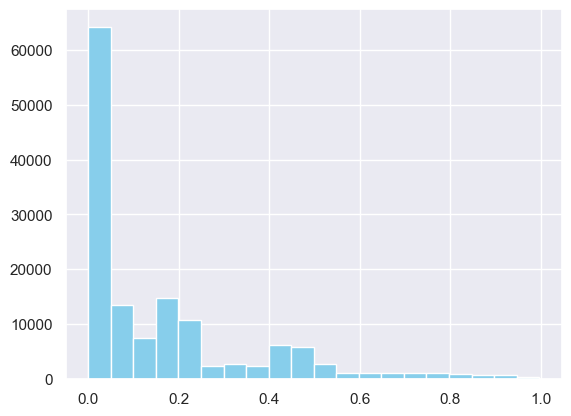

In [2004]:
result_submit_df[target_col].hist(bins=20)

In [2005]:
# result_submit_df['target_1'].hist()

<Axes: >

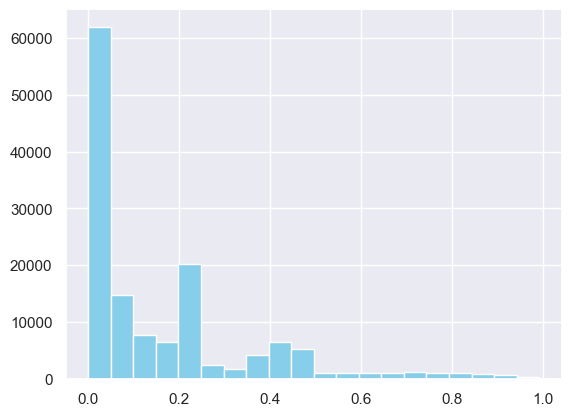

In [2006]:
tmp_df = pd.read_csv(f'submission/40_submission.csv')
tmp_df[target_col].hist(bins=20)

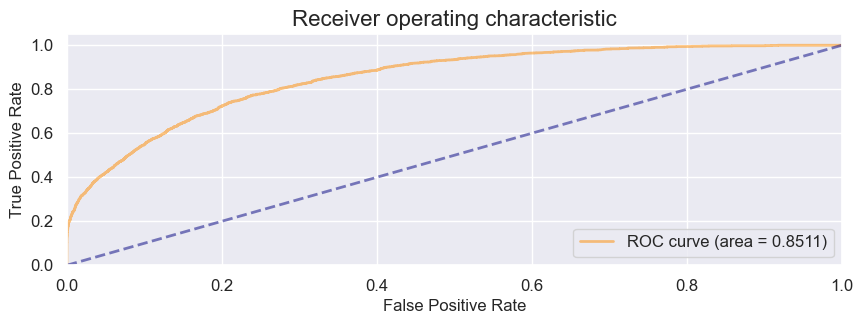

ROC-AUC: 0.8510541839694605, Gini: 0.7021083679389211


In [1947]:
# Делаем предсказание на тестовых данных
y_pred_default = model_target_1.predict_proba(X_test)[:,1]
# Строим график ROC-AUC
roc_auc = plot_roc_auc(y_true=y_test, y_pred=y_pred_default)
print(f"ROC-AUC: {roc_auc}, Gini: {calc_gini(roc_auc)}")

In [1645]:
# tmp_X_test_df = X_test_df.copy()
# tmp_X_test_df

In [2007]:
from sklearn.metrics import precision_recall_curve, auc
precision, recall, thrs = precision_recall_curve(y_test, y_pred_default)
pr_auc = auc(recall, precision)
print(pr_auc)
# fig, ax1 = plt.subplots(1, figsize=(15, 7))

# ax1.plot(recall, precision)
# ax1.axhline(y=0.75, color='grey', linestyle='-');

0.11410580615524796


Распределение исходного таргета: 0.13740851458612513
Распределение предсказанного таргета: 0.3940830842181218


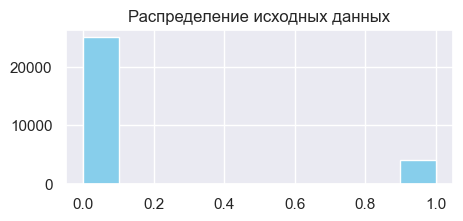

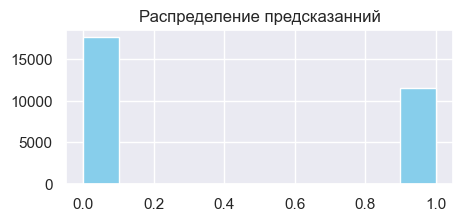

In [2008]:
# Переводим вероятностные предсказания в класс
threshold = 0.5
y_pred_default_class = (y_pred_default > threshold).astype(int) 

print(f"Распределение исходного таргета: {sum(y_test)/len(y_test)}")
print(f"Распределение предсказанного таргета: {sum(y_pred_default_class)/len(y_pred_default_class)}")

fig = plt.figure(figsize=(5,2))
pd.DataFrame(y_test).hist(ax=fig.gca())
plt.title("Распределение исходных данных")

fig = plt.figure(figsize=(5,2))
pd.DataFrame(y_pred_default_class).hist(ax=fig.gca())
plt.title("Распределение предсказанний")

plt.show()

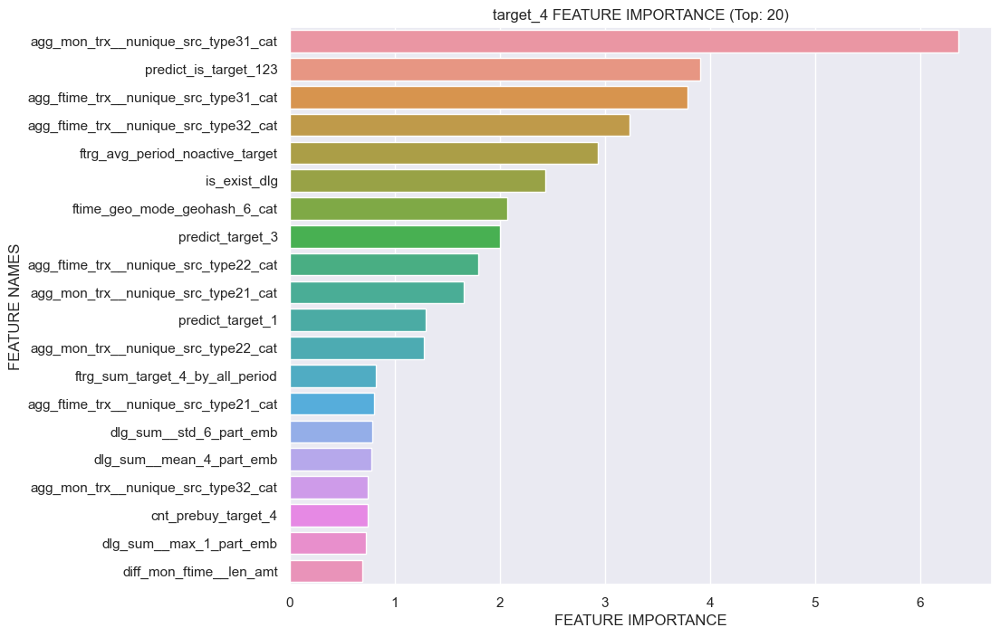

In [2009]:
# Важность признаков
fi_df = plot_feature_importance(model_target_1.get_feature_importance(), X_test.columns, model_name=target_col, top_n=20)  

In [1822]:
# fi_df

In [2010]:
fi_df_target_4 = fi_df.copy()
fi_target_4 = list(fi_df.sort_values(by='feature_importance', ascending=False)['feature_names'][:50])
# fi_target_4
# fi_target_1
# ptls

In [2015]:
fi_target_4

['agg_mon_trx__nunique_src_type31_cat',
 'predict_is_target_123',
 'agg_ftime_trx__nunique_src_type31_cat',
 'agg_ftime_trx__nunique_src_type32_cat',
 'ftrg_avg_period_noactive_target',
 'is_exist_dlg',
 'ftime_geo_mode_geohash_6_cat',
 'predict_target_3',
 'agg_ftime_trx__nunique_src_type22_cat',
 'agg_mon_trx__nunique_src_type21_cat',
 'predict_target_1',
 'agg_mon_trx__nunique_src_type22_cat',
 'ftrg_sum_target_4_by_all_period',
 'agg_ftime_trx__nunique_src_type21_cat',
 'dlg_sum__std_6_part_emb',
 'dlg_sum__mean_4_part_emb',
 'agg_mon_trx__nunique_src_type32_cat',
 'cnt_prebuy_target_4',
 'dlg_sum__max_1_part_emb',
 'diff_mon_ftime__len_amt',
 'ftrg_agg_prepremon_sum_target_1',
 'ftrg_agg_prepremon_sum_is_target_2_4',
 'agg_ftime_trx__nunique_src_type12_cat',
 'agg_dst_type12_30836__std_amt',
 'ftime_geo_mode_geohash_4_cat',
 'ftrg_sum_target_4_by_4_mon',
 'ptls_geo_12_part_embsum_12_part_emb__geo',
 'dlg_sum__max_6_part_emb',
 'diff_mon_ftime__sum_amt_norm',
 'ftrg_prc_target_4by_

In [2016]:
fi_target_3

['predict_target_1',
 'ftrg_agg_premon_sum_target_1',
 'is_exist_dlg',
 'agg_mon_trx__nunique_src_type32_cat',
 'ftime_geo_mode_geohash_6_cat',
 'agg_ftime_trx__nunique_src_type21_cat',
 'rel_mon_ftime__len_amt_norm',
 'predict_is_target_124',
 'predict_target_4',
 'agg_ftime_trx__nunique_src_type31_cat',
 'agg_mon_trx__nunique_src_type31_cat',
 'dlg_std_neg_credits_emb',
 'ftime_dlg_std_posneg_payments_emb',
 'agg_ftime_trx__nunique_src_type22_cat',
 'ftrg_avg_period_noactive_target',
 'agg_event_subtype_18__max_amt',
 'ftime_dlg_std_posneg_mean_current_acc_emb',
 'mode_geohash_6_cat',
 'agg_ftime_trx__nunique_src_type32_cat',
 'rel_mon_ftime__len_amt',
 'agg_event_subtype_49__sum_amt',
 'agg_ftime_trx__min_amt_norm',
 'agg_mon_trx__nunique_src_type21_cat',
 'agg_mon_trx__sum_amt',
 'agg_mon_trx__nunique_src_type22_cat',
 'ftrg_days_last_buy_target_3',
 'rel_bad_good',
 'ftime_dlg_std_posneg_bank_app_emb',
 'ftrg_days_last_buy_is_target',
 'ftrg_agg_premon_sum_is_target_1_and_4',
 'ag

In [2017]:
fi_target_2

['predict_target_1',
 'predict_target_4',
 'ftime_dlg_sum_pos_credit_cards_emb',
 'agg_ftime_trx__nunique_src_type12_cat',
 'agg_src_type12_344__max_amt',
 'agg_ftime_trx__nunique_src_type12',
 'agg_src_type12_344__nunique_src_type32',
 'ftime_geo_mode_geohash_6_cat',
 'agg_ftime_trx__nunique_src_type22_cat',
 'agg_mon_trx__nunique_src_type22_cat',
 'agg_ftime_trx__nunique_src_type32_cat',
 'agg_ftime_trx__median_amt',
 'agg_src_type12_344__median_amt',
 'agg_src_type12_902__median_type31',
 'agg_ftime_trx__nunique_src_type22',
 'agg_src_type22_70__sum_type31',
 'predict_target_3',
 'is_exist_dlg',
 'ftrg_agg_premon_sum_is_target_2_and_3',
 'predict_is_target_134',
 'ftrg_agg_prepremon_sum_is_target_1_and_3',
 'agg_ftime_trx__max_amt',
 'ptls_trx_1_part_embsum_1_part_emb',
 'diff_mon_ftime__sum_amt',
 'pre_ftime_cur_sum_target_4__by_clients',
 'agg_ftime_trx__std_amt_norm',
 'trx_emb__diff_bad_good',
 'fullt_mean_consecutive_distance',
 'ftime_geo_prc_visit_geohash_5',
 'ftime_geo_cnt_

In [2018]:
fi_target_1 # fi_df_target_1

['ftrg_avg_period_noactive_target',
 'is_exist_dlg',
 'predict_target_3',
 'predict_is_target_234',
 'ftime_geo_mode_geohash_6_cat',
 'fullt_sum_embedding',
 'dlg_sum__min_1_part_emb',
 'agg_ftime_trx__nunique_src_type31_cat',
 'agg_event_subtype_18__nunique_src_type11',
 'agg_ftime_trx__nunique_src_type21_cat',
 'predict_target_4',
 'ftrg_agg_premon_sum_target_1',
 'diff_mon_ftime__len_amt_norm',
 'agg_src_type11_149__nunique_src_type32',
 'agg_ftime_trx__nunique_src_type12_cat',
 'agg_mon_trx__nunique_src_type31_cat',
 'agg_ftime_trx__nunique_src_type11_cat',
 'agg_ftime_trx__nunique_src_type22_cat',
 'ftime_dlg_std_posneg_mean_current_acc_emb',
 'dlg_sum__min_11_part_emb',
 'agg_mon_trx__nunique_src_type21_cat',
 'mode_geohash_6_cat',
 'diff_mon_ftime__len_amt',
 'ftrg_mean_target_1_by_per_mon',
 'ftime_dlg_std_neg_cashback_emb',
 'ftrg_days_first_buy_is_target',
 'agg_mon_trx__nunique_src_type32_cat',
 'ftime_dlg_std_neg_credit_cards_emb',
 'agg_mon_trx__nunique_src_type12_cat',
 '

In [667]:
# X_train.shape
# fi_drop_list[500:]
fi_df_target_2

,feature_names,feature_importance
555,agg_src_type12_344__max_amt,4.499956
3067,agg_ftime_trx__nunique_src_type12_cat,3.462416
3077,predict_target_4,3.154338
3075,predict_target_1,2.277770
3050,ftime_geo_mode_geohash_6_cat,1.396045
...,...,...
1134,agg_src_type32_26__min_amt,0.000000
1135,agg_src_type32_26__max_amt,0.000000
1136,agg_src_type32_26__sum_type21,0.000000
1137,agg_src_type32_26__sum_type31,0.000000


In [2032]:
fi_drop_list_16_06_v1 = ['dlg_mean_posneg_car_loans_emb', 'dlg_sum__min_8_part_emb', 'agg_mon_trx__median_amt', 'dlg_max_pos_garant_emb', 'agg_src_type31_1235__std_amt', 'ftime_dlg_mean_pos_cashback_emb', 'trx_emb__min_good_cossim', 'dlg_max__min_12_part_emb', 'agg_src_type32_67__max_amt', 'pre_mon_cur_sum_target_3__by_clients', 'ftime_dlg_mean__mean_12_part_emb', 'dlg_mean_neg_garant_emb', 'agg_src_type12_1081__nunique_src_type21', 'agg_src_type12_45__sum_type31', 'agg_event_subtype_55__len_amt', 'dlg_max_posneg_mean_credit_cards_emb', 'dlg_mean__sum_11_part_emb', 'dlg_sum_pos_garant_emb', 'agg_src_type21_42507__nunique_dst_type12', 'dlg_min__sum_12_part_emb', 'dlg_sum_posneg_mean_deposits_emb', 'agg_dst_type11_1302__nunique_src_type21', 'dlg_max_neg_current_acc_emb', 'ptls_geo_11_part_embmedian_11_part_emb__geo', 'dlg_max__mean_10_part_emb', 'ftime_dlg_mean__sum_10_part_emb', 'ftime_dlg_sum_posneg_current_acc_emb', 'dlg_std_posneg_mean_current_acc_emb', 'ftime_dlg_max_neg_cashback_emb', 'agg_dst_type12_22548__nunique_src_type22', 'ptls_trx_min_ptls_embedding', 'ftime_dlg_max__sum_5_part_emb', 'agg_src_type12_45__nunique_dst_type11', 'agg_src_type11_128__nunique_dst_type11', 'embedding_path_length', 'dlg_mean__max_9_part_emb', 'agg_dst_type12_17340__median_amt', 'dlg_mean__max_6_part_emb', 'ftime_dlg_max_pos_credits_emb', 'agg_dst_type11_869__nunique_dst_type11', 'trx_emb__cosine_pos_target_4', 'ptls_trx_16_part_embstd_16_part_emb', 'agg_dst_type11_869__median_type31', 'agg_src_type32_17__median_amt', 'ftime_dlg_max__max_2_part_emb', 'agg_src_type21_6272__std_amt', 'agg_src_type32_4__nunique_src_type12', 'ftime_dlg_min_pos_debit_cards_emb', 'agg_src_type32_4__nunique_event_subtype', 'cnt_prebuy_is_target_1_3', 'agg_dst_type12_31488__sum_type31', 'ftime_dlg_mean__sum_7_part_emb', 'ftime_geo_prc_visit_geohash_4', 'dlg_std_neg_cashback_emb', 'prebuy_is_target_1_and_4', 'trx_emb__max_good_cossim', 'dlg_sum_posneg_garant_emb', 'dlg_std_pos_investments_emb', 'geo_emb__cityblock_neg_target_4', 'ptls_geo_8_part_embmedian_8_part_emb__geo', 'agg_src_type22_87__nunique_src_type22', 'ftime_dlg_mean__min_3_part_emb', 'agg_src_type22_48__nunique_event_type', 'dlg_min_pos_cashback_emb', 'prebuy_is_target_124', 'agg_src_type11_19__sum_type31', 'dlg_min_posneg_garant_emb', 'agg_event_subtype_47__nunique_event_type', 'dlg_max__sum_6_part_emb', 'agg_src_type32_4__median_type21', 'dlg_min__max_6_part_emb', 'diff_mon_ftime__nunique_src_type11', 'trx_emb__cityblock_pos_target_2', 'dlg_mean__sum_10_part_emb', 'agg_src_type22_41__min_amt', 'ftime_dlg_min__mean_12_part_emb', 'agg_src_type22_87__nunique_dst_type12', 'agg_event_subtype_9__nunique_src_type22', 'ftime_dlg_sum__min_6_part_emb', 'agg_mon_trx__nunique_src_type12', 'agg_event_subtype_18__nunique_src_type22', 'agg_src_type21_8099__len_amt', 'ftime_dlg_max__min_11_part_emb', 'agg_src_type32_77__len_amt', 'agg_ftime_trx__nunique_src_type21', 'agg_src_type31_148__sum_amt', 'dlg_std_posneg_mean_salary_emb', 'dlg_sum__sum_12_part_emb', 'rel_mon_ftime__max_amt_norm', 'agg_dst_type12_22548__nunique_dst_type12', 'agg_dst_type11_364__nunique_src_type11', 'agg_src_type22_48__median_type31', 'agg_event_subtype_29__min_amt', 'dlg_sum_posneg_mean_investments_emb', 'agg_src_type21_42507__nunique_dst_type11', 'agg_src_type21_6272__nunique_src_type22', 'agg_src_type31_148__sum_type21', 'dlg_std_posneg_salary_emb', 'agg_src_type32_4__nunique_src_type11', 'agg_dst_type12_14606__nunique_dst_type12', 'agg_src_type32_81__nunique_src_type21', 'agg_src_type12_45__nunique_src_type22', 'dlg_min__max_8_part_emb', 'ftime_dlg_max__mean_5_part_emb', 'ftime_dlg_min__sum_9_part_emb', 'ftime_dlg_max_posneg_mean_credits_emb', 'dlg_sum_neg_credit_cards_emb', 'ftrg_max_period_noactive_target', 'agg_dst_type12_22548__std_amt', 'ftime_dlg_max__max_1_part_emb', 'agg_event_subtype_51__median_type21', 'ptls_geo_1_part_embmean_1_part_emb__geo', 'ftime_dlg_sum__sum_10_part_emb', 'rel_mon_ftime__std_amt', 'agg_src_type32_67__nunique_src_type22', 'agg_src_type22_87__min_amt', 'ptls_geo_6_part_embstd_6_part_emb__geo', 'mean_consecutive_distance', 'agg_event_type_25__nunique_dst_type12', 'dlg_sum__min_2_part_emb', 'agg_src_type32_81__nunique_src_type11', 'agg_src_type31_2486__nunique_src_type31', 'prebuy_is_target_1_3', 'trx_emb__rel_bad_good', 'agg_src_type22_70__min_amt', 'agg_src_type11_122__nunique_dst_type12', 'agg_dst_type11_1166__min_amt', 'ftime_dlg_min__mean_7_part_emb', 'ftime_dlg_sum__mean_6_part_emb', 'agg_event_subtype_9__median_amt', 'agg_src_type11_149__nunique_event_subtype', 'ftime_dlg_max__std_12_part_emb', 'dlg_min__sum_9_part_emb', 'dlg_sum_neg_payments_emb', 'dlg_sum_pos_payments_emb', 'dlg_sum_posneg_debit_cards_emb', 'agg_src_type31_148__nunique_src_type12', 'ftime_dlg_sum__std_12_part_emb', 'agg_dst_type11_869__std_amt', 'dlg_mean_posneg_mean_deposits_emb', 'agg_event_type_25__len_amt', 'dlg_mean_neg_car_loans_emb', 'dlg_mean_posneg_salary_emb', 'ptls_geo_16_part_embstd_16_part_emb__geo', 'trx_emb__euclidean_neg_target_4', 'dlg_mean_posneg_debit_cards_emb', 'dlg_std_posneg_cashback_emb', 'agg_src_type22_41__nunique_src_type21', 'agg_src_type21_6272__min_amt', 'agg_dst_type12_14606__median_type31', 'agg_src_type32_67__median_amt', 'agg_src_type11_122__std_amt', 'agg_src_type21_13013__sum_type21', 'dlg_max_neg_debit_cards_emb', 'agg_src_type11_70__nunique_src_type11', 'agg_src_type12_344__nunique_dst_type12', 'ftime_dlg_sum__min_8_part_emb', 'agg_dst_type11_852__nunique_src_type12', 'agg_dst_type12_31488__sum_amt', 'agg_src_type22_87__len_amt', 'agg_dst_type12_30836__min_amt', 'agg_src_type21_25721__median_type31', 'agg_src_type22_87__std_amt', 'ftime_dlg_min__min_8_part_emb', 'agg_src_type32_4__len_amt', 'dlg_mean_posneg_garant_emb', 'agg_dst_type12_10049__nunique_src_type21', 'dlg_sum__sum_10_part_emb', 'ftime_dlg_sum__sum_11_part_emb', 'agg_src_type11_72__nunique_src_type32', 'ptls_geo_9_part_embmin_9_part_emb__geo', 'agg_src_type32_17__sum_type21', 'ftime_dlg_mean_neg_salary_emb', 'ptls_trx_12_part_embmin_12_part_emb', 'ftime_dlg_max__std_8_part_emb', 'agg_event_subtype_9__std_amt', 'dlg_mean_posneg_credit_cards_emb', 'agg_src_type32_77__nunique_src_type32', 'dlg_mean_posneg_mean_cashback_emb', 'dlg_min_pos_garant_emb', 'agg_src_type21_19370__max_amt', 'agg_src_type12_201__median_amt', 'ftime_dlg_std_neg_colect_serv_emb', 'dlg_min_pos_deposits_emb', 'cos_sim_target_1_good', 'dlg_min__mean_4_part_emb', 'dlg_min__mean_11_part_emb', 'agg_src_type21_32995__sum_type31', 'agg_event_subtype_49__nunique_dst_type12', 'agg_mon_trx__nunique_event_type', 'ftime_dlg_sum__std_3_part_emb', 'agg_src_type11_1__nunique_dst_type12', 'agg_src_type11_70__median_type21', 'dlg_mean_posneg_current_acc_emb', 'agg_src_type21_32995__nunique_src_type31', 'agg_event_subtype_9__nunique_dst_type11', 'agg_event_type_25__median_amt', 'agg_src_type21_42507__median_amt', 'ftime_dlg_min_neg_debit_cards_emb', 'agg_src_type31_1553__sum_type31', 'ftime_dlg_min_posneg_cashback_emb', 'ptls_geo_2_part_embsum_2_part_emb__geo', 'dlg_mean__std_1_part_emb', 'geo_emb__euclidean_neg_target_1', 'ftime_dlg_mean__mean_4_part_emb', 'geo_emb__cos_sim_target_3_bad', 'dlg_mean__sum_2_part_emb', 'ftime_dlg_max__max_6_part_emb', 'agg_dst_type11_1302__nunique_src_type32', 'ftime_dlg_max_neg_salary_emb', 'agg_event_type_40__nunique_src_type32', 'ptls_geo_10_part_embmax_10_part_emb__geo', 'trx_emb__cos_sim_target_3_bad', 'ftime_dlg_mean_posneg_mean_credit_cards_emb', 'ftime_dlg_std_posneg_mean_payments_emb', 'agg_event_subtype_18__sum_type21', 'agg_src_type31_1235__sum_amt', 'agg_src_type11_149__sum_type21', 'dlg_max__mean_4_part_emb', 'agg_src_type22_48__sum_type31', 'ftime_dlg_min__min_9_part_emb', 'agg_src_type31_1553__median_amt', 'ftime_dlg_min__sum_1_part_emb', 'dlg_sum_neg_bank_app_emb', 'agg_src_type11_122__median_amt', 'agg_event_subtype_29__nunique_src_type31', 'ftime_dlg_min__min_2_part_emb', 'agg_src_type21_32995__std_amt', 'agg_event_type_56__std_amt', 'geo_emb__cityblock_pos_target_4', 'agg_event_subtype_47__len_amt', 'dlg_mean_posneg_mean_salary_emb', 'dlg_min_neg_car_loans_emb', 'agg_dst_type12_31488__nunique_dst_type11', 'agg_src_type22_48__sum_type21', 'agg_mon_trx__median_type31', 'ftime_dlg_sum_neg_debit_cards_emb', 'agg_src_type11_72__nunique_dst_type11', 'dlg_std_posneg_mean_credit_cards_emb', 'ftime_dlg_min__mean_8_part_emb', 'dlg_max_pos_payments_emb', 'agg_event_type_56__nunique_dst_type12', 'ftime_dlg_max_negative_emb', 'dlg_max__max_4_part_emb', 'agg_src_type21_25721__std_amt', 'ptls_geo_14_part_embmin_14_part_emb__geo', 'agg_src_type32_26__nunique_src_type32', 'ptls_trx_median_ptls_embedding', 'agg_event_subtype_55__nunique_dst_type12', 'prebuy_is_target_1_and_3', 'agg_dst_type11_852__median_type31', 'dlg_std_pos_colect_serv_emb', 'dlg_sum_posneg_mean_payments_emb', 'agg_src_type32_25__nunique_src_type21', 'agg_src_type12_370__nunique_event_subtype', 'dlg_mean_posneg_mean_credits_emb', 'ptls_trx_2_part_embsum_2_part_emb', 'dlg_min_pos_debit_cards_emb', 'ftime_dlg_std_posneg_colect_serv_emb', 'agg_event_type_56__sum_type31', 'agg_src_type21_25721__sum_amt', 'cnt_geohash_5', 'ptls_geo_9_part_embsum_9_part_emb__geo', 'agg_event_subtype_55__nunique_src_type12', 'agg_src_type12_370__sum_amt', 'ptls_trx_11_part_embmedian_11_part_emb', 'dlg_sum_posneg_credits_emb', 'dlg_mean_pos_investments_emb', 'agg_src_type21_6272__sum_type31', 'agg_event_subtype_47__std_amt', 'agg_src_type21_19370__nunique_src_type12', 'agg_dst_type12_10049__sum_type21', 'dlg_max__sum_1_part_emb', 'agg_dst_type12_22652__nunique_src_type12', 'agg_dst_type12_30836__nunique_src_type11', 'agg_dst_type11_364__nunique_event_type', 'ptls_trx_10_part_embsum_10_part_emb', 'agg_event_type_37__nunique_src_type22', 'agg_src_type32_25__max_amt', 'ftime_dlg_std_neg_car_loans_emb', 'agg_src_type32_81__sum_type21', 'trx_emb__cityblock_pos_target_3', 'trx_emb__cityblock_neg_target_4', 'agg_event_subtype_55__sum_type21', 'geo_emb__cityblock_pos_target_1', 'agg_src_type21_25721__nunique_src_type11', 'ftime_dlg_mean_pos_bank_app_emb', 'agg_src_type21_42507__nunique_src_type21', 'agg_src_type22_85__std_amt', 'dlg_sum_posneg_salary_emb', 'ftime_dlg_sum_posneg_mean_debit_cards_emb', 'agg_src_type22_87__nunique_src_type31', 'dlg_mean_pos_car_loans_emb', 'agg_event_subtype_18__nunique_src_type12', 'agg_src_type21_19370__len_amt', 'agg_src_type22_70__nunique_src_type32', 'agg_dst_type11_1302__sum_type21', 'agg_event_subtype_51__nunique_dst_type12', 'ftime_dlg_sum__max_4_part_emb', 'ftime_dlg_std_posneg_mean_deposits_emb', 'max_good_cossim', 'ptls_trx_15_part_embstd_15_part_emb', 'ftime_dlg_max__std_10_part_emb', 'dlg_min_posneg_mean_garant_emb', 'agg_event_subtype_18__min_amt', 'agg_src_type11_70__nunique_src_type21', 'ptls_geo_5_part_embmedian_5_part_emb__geo', 'ptls_trx_2_part_embmean_2_part_emb', 'agg_dst_type12_31488__median_type21', 'trx_emb__cos_sim_target_2_bad', 'dlg_max__max_3_part_emb', 'agg_dst_type12_22548__median_type21', 'agg_src_type12_370__len_amt', 'agg_dst_type12_31488__len_amt', 'ptls_geo_15_part_embmax_15_part_emb__geo', 'agg_dst_type11_1302__sum_type31', 'dlg_sum_posneg_mean_credits_emb', 'dlg_min_pos_credit_cards_emb', 'dlg_mean__min_2_part_emb', 'agg_src_type12_370__nunique_src_type12', 'agg_src_type31_2486__nunique_src_type21', 'dlg_min__max_1_part_emb', 'dlg_mean__min_9_part_emb', 'agg_event_type_51__nunique_event_type', 'pre_ftime_cur_sum_target_1', 'ftime_dlg_mean__std_11_part_emb', 'agg_src_type31_500__sum_type21', 'agg_src_type21_13013__nunique_src_type11', 'ftrg_agg_premon_sum_is_target_234', 'agg_src_type22_48__nunique_dst_type11', 'agg_src_type21_13013__std_amt', 'agg_src_type31_148__median_amt', 'agg_src_type31_2128__nunique_event_type', 'agg_src_type31_2486__median_type21', 'agg_src_type31_2486__nunique_src_type12', 'agg_event_type_56__nunique_dst_type11', 'dlg_min_neg_credits_emb', 'agg_event_type_37__nunique_src_type12', 'agg_src_type22_20__sum_type31', 'agg_src_type32_17__nunique_dst_type12', 'ftrg_agg_prepremon_sum_is_target_3_and_4', 'agg_dst_type12_30836__nunique_src_type21', 'dlg_mean_pos_bank_app_emb', 'agg_src_type31_1235__sum_type31', 'agg_src_type21_42507__min_amt', 'dlg_max__sum_7_part_emb', 'fullt_embedding_variance', 'ftrg_sum_target_2_by_2_mon', 'agg_src_type31_1323__sum_amt', 'geo_emb__max_good_cossim', 'dlg_mean_pos_garant_emb', 'geo_emb__cos_sim_target_2_bad', 'geo_emb__cosine_neg_target_2', 'dlg_mean__mean_2_part_emb', 'agg_src_type11_70__sum_type31', 'dlg_mean_posneg_investments_emb', 'agg_event_subtype_55__max_amt', 'agg_src_type22_48__nunique_src_type22', 'ftrg_sum_target_2_by_5_mon', 'ftrg_agg_premon_sum_is_target_2_3', 'agg_src_type21_25721__max_amt', 'agg_event_type_40__nunique_event_type', 'ftime_dlg_min_pos_current_acc_emb', 'agg_src_type21_42507__median_type21', 'agg_src_type11_72__nunique_src_type11', 'agg_event_type_38__nunique_event_subtype', 'agg_dst_type12_31488__nunique_src_type31', 'dlg_mean__max_4_part_emb', 'ftime_dlg_max_pos_salary_emb', 'agg_src_type21_19370__nunique_src_type11', 'ftrg_days_first_buy_target_1', 'agg_dst_type11_869__max_amt', 'agg_src_type22_70__len_amt', 'agg_src_type32_17__nunique_event_type', 'agg_src_type32_67__sum_type31', 'cnt_mode_geohash_6', 'agg_src_type32_26__min_amt', 'dlg_max_posneg_mean_payments_emb', 'ftime_dlg_min_posneg_mean_bank_app_emb', 'dlg_min__min_7_part_emb', 'ftime_dlg_sum__sum_4_part_emb', 'agg_dst_type11_1302__median_type31', 'ptls_trx_5_part_embmax_5_part_emb', 'agg_src_type12_45__nunique_src_type12', 'agg_event_type_51__median_amt', 'agg_src_type21_13013__min_amt', 'agg_src_type11_19__nunique_dst_type12', 'ftrg_agg_prepremon_sum_is_target_234', 'agg_src_type21_6272__nunique_src_type11', 'dlg_max_positive_emb', 'ftime_dlg_mean_neg_payments_emb', 'agg_event_subtype_47__nunique_event_subtype', 'agg_src_type32_81__nunique_src_type31', 'agg_src_type12_344__nunique_src_type22', 'prebuy_target_3', 'agg_event_subtype_9__sum_type31', 'agg_event_type_51__nunique_src_type12', 'agg_src_type31_148__median_type31', 'agg_src_type11_72__max_amt', 'dlg_min__min_3_part_emb', 'dlg_min__mean_9_part_emb', 'dlg_max__std_9_part_emb', 'agg_dst_type12_31488__nunique_src_type11', 'agg_dst_type11_988__nunique_dst_type12', 'ftime_dlg_min_posneg_mean_car_loans_emb', 'agg_src_type12_201__nunique_src_type12', 'agg_dst_type12_22652__sum_type31', 'ftime_dlg_mean__max_8_part_emb', 'geo_emb__cosine_pos_target_3', 'agg_dst_type12_14606__nunique_dst_type11', 'dlg_max_posneg_mean_salary_emb', 'dlg_max__sum_11_part_emb', 'dlg_min__std_12_part_emb', 'agg_src_type31_1323__nunique_event_subtype', 'agg_src_type12_201__nunique_event_type', 'agg_src_type21_42507__len_amt', 'ftime_dlg_mean__max_12_part_emb', 'ftrg_agg_prepremon_sum_is_target_cnt', 'agg_event_subtype_51__sum_amt', 'ftime_dlg_max_neg_bank_app_emb', 'agg_src_type12_201__max_amt', 'dlg_sum__max_8_part_emb', 'agg_dst_type11_1302__nunique_src_type31', 'agg_src_type31_2128__std_amt', 'dlg_std_posneg_mean_credits_emb', 'ftime_dlg_mean__mean_5_part_emb', 'agg_dst_type11_869__nunique_dst_type12', 'agg_event_type_51__len_amt', 'rel_mon_ftime__median_amt_norm', 'cnt_prebuy_is_target_2_and_3', 'agg_src_type11_70__max_amt', 'ftime_geo_sum_geohash_4', 'prebuy_is_target_3_4', 'ftime_dlg_sum_pos_investments_emb', 'agg_src_type31_1323__nunique_src_type31', 'cnt_prebuy_is_target_1_and_2', 'cnt_prebuy_is_target_1_4', 'agg_src_type32_77__sum_amt', 'agg_src_type12_902__median_amt', 'dlg_sum__std_2_part_emb', 'agg_src_type32_67__len_amt', 'dlg_sum_posneg_payments_emb', 'ftime_dlg_min__std_11_part_emb', 'agg_src_type11_70__min_amt', 'agg_src_type22_20__nunique_event_type', 'agg_dst_type12_22652__nunique_dst_type12', 'agg_src_type21_25721__nunique_event_subtype', 'agg_dst_type11_988__median_type31', 'agg_src_type12_682__nunique_src_type31', 'ptls_geo_8_part_embmin_8_part_emb__geo', 'geo_emb__euclidean_neg_target_3', 'dlg_sum__min_6_part_emb', 'geo_emb__max_bad_cossim', 'ftime_dlg_min_posneg_colect_serv_emb', 'agg_src_type32_77__median_amt', 'agg_event_type_37__sum_type31', 'agg_dst_type11_988__std_amt', 'ftime_dlg_min_neg_deposits_emb', 'ftime_dlg_mean__mean_11_part_emb', 'trx_emb__cos_sim_is_target_good', 'agg_src_type11_1__nunique_src_type32', 'agg_src_type21_42507__median_type31', 'agg_src_type31_500__nunique_dst_type12', 'agg_src_type11_19__nunique_dst_type11', 'agg_src_type11_1__sum_amt', 'ptls_trx_14_part_embstd_14_part_emb', 'ftime_dlg_sum__max_5_part_emb', 'agg_src_type32_67__min_amt', 'geo_emb__cos_sim_target_4_bad', 'agg_src_type12_902__sum_type31', 'agg_src_type22_87__sum_amt', 'agg_src_type31_2486__nunique_event_type', 'ptls_trx_16_part_embmin_16_part_emb', 'ftrg_sum_target_1_by_2_mon', 'ftime_dlg_max__sum_8_part_emb', 'trx_emb__mean_good_cossim', 'ftime_dlg_mean_negative_emb', 'ftime_dlg_sum_posneg_credits_emb', 'agg_src_type31_1553__nunique_event_type', 'dlg_mean__std_8_part_emb', 'agg_mon_trx__nunique_src_type31', 'ftime_dlg_min__max_3_part_emb', 'ftime_dlg_mean_posneg_credit_cards_emb', 'agg_src_type12_682__nunique_dst_type12', 'agg_dst_type12_17340__nunique_dst_type12', 'dlg_max_posneg_cashback_emb', 'dlg_max__mean_3_part_emb', 'agg_event_type_54__max_amt', 'dlg_mean__mean_1_part_emb', 'dlg_sum__std_5_part_emb', 'ftime_dlg_mean__max_10_part_emb', 'ftime_dlg_min_posneg_mean_credit_cards_emb', 'min_bad_cossim', 'agg_src_type32_67__median_type21', 'agg_src_type12_682__nunique_dst_type11', 'agg_src_type22_20__median_amt', 'trx_emb__euclidean_neg_target_3', 'agg_dst_type11_1302__nunique_src_type22', 'agg_event_subtype_49__median_amt', 'agg_event_subtype_49__median_type31', 'agg_src_type11_1__nunique_src_type11', 'agg_dst_type11_1166__nunique_src_type21', 'agg_src_type21_6272__nunique_src_type31', 'ptls_geo_5_part_embmean_5_part_emb__geo', 'dlg_mean_posneg_mean_current_acc_emb', 'agg_src_type32_25__nunique_dst_type12', 'agg_src_type21_42507__nunique_src_type32', 'ftime_dlg_min_posneg_credit_cards_emb', 'min_good_cossim', 'agg_src_type12_1081__nunique_src_type31', 'dlg_min__std_11_part_emb', 'agg_src_type31_500__sum_type31', 'ftime_dlg_max_pos_investments_emb', 'agg_event_subtype_51__sum_type21', 'dlg_min__mean_8_part_emb', 'pre_ftime_cur_sum_target_2', 'ptls_geo_16_part_embsum_16_part_emb__geo', 'agg_dst_type12_14606__nunique_src_type22', 'prebuy_is_target_2_4', 'agg_src_type32_26__max_amt', 'agg_src_type12_682__max_amt', 'agg_src_type11_122__nunique_event_subtype', 'agg_src_type32_77__nunique_dst_type12', 'agg_src_type31_1323__len_amt', 'ptls_geo_1_part_embmax_1_part_emb__geo', 'agg_src_type22_56__nunique_src_type11', 'agg_src_type31_2486__nunique_src_type22', 'ftime_dlg_mean__std_4_part_emb', 'ptls_geo_15_part_embmin_15_part_emb__geo', 'agg_src_type31_1323__min_amt', 'agg_dst_type11_852__nunique_src_type22', 'ftime_dlg_mean__mean_10_part_emb', 'agg_src_type31_500__nunique_src_type31', 'ftime_geo_sum_geohash_5', 'dlg_mean_neg_salary_emb', 'ptls_trx_11_part_embmean_11_part_emb', 'dlg_min_neg_colect_serv_emb', 'agg_src_type31_1323__std_amt', 'agg_src_type32_81__median_amt', 'dlg_min__max_12_part_emb', 'dlg_min__sum_5_part_emb', 'ftime_dlg_mean_pos_salary_emb', 'agg_src_type21_6272__sum_type21', 'dlg_min__sum_1_part_emb', 'agg_dst_type11_1302__nunique_event_type', 'agg_src_type21_6272__median_type31', 'agg_src_type32_26__sum_type21', 'dlg_sum__max_5_part_emb', 'ptls_trx_sum_ptls_embedding__geo', 'ptls_trx_9_part_embmax_9_part_emb', 'dlg_min_posneg_car_loans_emb', 'agg_dst_type12_22652__median_type21', 'ftime_dlg_mean__sum_2_part_emb', 'agg_src_type21_32995__min_amt', 'dlg_max__mean_11_part_emb', 'agg_dst_type12_22548__sum_type21', 'agg_src_type22_20__std_amt', 'ptls_trx_13_part_embmax_13_part_emb', 'agg_src_type31_2486__sum_type31', 'ftime_dlg_sum_posneg_car_loans_emb', 'agg_src_type22_20__nunique_src_type22', 'dlg_min__mean_5_part_emb', 'agg_src_type32_67__std_amt', 'rel_mon_ftime__nunique_src_type12', 'agg_src_type31_1553__nunique_src_type21', 'ftime_dlg_mean_posneg_mean_car_loans_emb', 'prebuy_target_1', 'dlg_max_pos_debit_cards_emb', 'ftime_dlg_sum_posneg_investments_emb', 'ftime_dlg_std_neg_payments_emb', 'agg_src_type31_2128__nunique_src_type11', 'geo_emb__sum_good_cossim', 'agg_src_type11_70__nunique_event_subtype', 'ftime_dlg_mean_posneg_debit_cards_emb', 'agg_src_type31_1235__sum_type21', 'agg_event_type_56__nunique_event_subtype', 'agg_dst_type11_433__nunique_event_subtype', 'agg_dst_type11_988__nunique_src_type21', 'dlg_std_posneg_mean_car_loans_emb', 'ptls_geo_6_part_embmin_6_part_emb__geo', 'agg_event_type_25__min_amt', 'ftime_geo_cnt_geohash_6', 'agg_event_subtype_9__len_amt', 'agg_src_type22_41__std_amt', 'ptls_geo_8_part_embmax_8_part_emb__geo', 'ptls_geo_16_part_embmin_16_part_emb__geo', 'agg_src_type31_2128__median_amt', 'agg_dst_type11_869__nunique_src_type11', 'agg_src_type31_2486__nunique_event_subtype', 'ftime_dlg_max__max_4_part_emb', 'ftime_dlg_min__mean_4_part_emb', 'agg_src_type21_19370__nunique_dst_type11', 'agg_src_type11_72__median_type21', 'agg_dst_type11_1166__nunique_src_type12', 'dlg_sum_neg_investments_emb', 'dlg_mean__min_12_part_emb', 'dlg_min_posneg_mean_bank_app_emb', 'agg_src_type31_1553__nunique_src_type32', 'agg_src_type21_19370__sum_type21', 'agg_event_type_37__std_amt', 'agg_src_type11_70__sum_type21', 'agg_dst_type12_30836__nunique_src_type32', 'dlg_mean_positive_emb', 'dlg_max__mean_6_part_emb', 'ptls_trx_10_part_embmax_10_part_emb', 'trx_emb__max_bad_cossim', 'ftime_dlg_min_posneg_investments_emb', 'dlg_mean_pos_credits_emb', 'agg_src_type22_56__sum_type31', 'dlg_mean__min_7_part_emb', 'dlg_mean__max_2_part_emb', 'agg_dst_type12_31488__nunique_event_type', 'agg_src_type22_48__nunique_dst_type12', 'dlg_sum__min_7_part_emb', 'dlg_sum_posneg_mean_cashback_emb', 'agg_src_type31_148__nunique_src_type21', 'dlg_min_posneg_mean_debit_cards_emb', 'ftime_dlg_min_posneg_mean_investments_emb', 'ftime_dlg_mean_posneg_credits_emb', 'rel_mon_ftime__nunique_dst_type12', 'dlg_sum__sum_11_part_emb', 'agg_src_type32_17__sum_type31', 'agg_event_subtype_29__median_type21', 'ftime_dlg_max_neg_debit_cards_emb', 'agg_dst_type12_22652__sum_type21', 'dlg_mean__max_5_part_emb', 'agg_src_type11_128__nunique_src_type32', 'agg_src_type12_344__median_type31', 'agg_src_type32_81__std_amt', 'dlg_max__min_6_part_emb', 'ftrg_sum_target_3_by_1_mon', 'agg_src_type12_201__std_amt', 'agg_event_subtype_49__nunique_dst_type11', 'agg_src_type12_344__nunique_dst_type11', 'ftime_dlg_sum_neg_bank_app_emb', 'agg_dst_type12_22652__median_type31', 'ftime_dlg_sum__mean_2_part_emb', 'pre_ftime_cur_sum_target_3', 'agg_src_type32_26__median_type21', 'dlg_std_posneg_credit_cards_emb', 'agg_src_type12_201__median_type21', 'dlg_std_posneg_mean_cashback_emb', 'agg_src_type32_17__std_amt', 'agg_dst_type11_433__nunique_event_type', 'ftime_dlg_mean_posneg_mean_garant_emb', 'mean_good_cossim', 'ftime_dlg_mean_posneg_mean_debit_cards_emb', 'agg_event_type_56__nunique_src_type21', 'ftime_dlg_std_posneg_mean_credits_emb', 'ftime_dlg_max__min_5_part_emb', 'ftime_dlg_min_pos_deposits_emb', 'agg_src_type12_45__sum_type21', 'agg_event_type_25__nunique_event_type', 'ftime_dlg_std_pos_garant_emb', 'agg_event_type_54__nunique_src_type21', 'ptls_geo_3_part_embstd_3_part_emb__geo', 'dlg_sum__sum_3_part_emb', 'ftime_dlg_min__min_12_part_emb', 'agg_src_type31_1235__median_type31', 'agg_src_type32_67__nunique_src_type11', 'dlg_min_pos_bank_app_emb', 'agg_event_subtype_51__median_type31', 'agg_src_type21_6272__nunique_src_type21', 'agg_src_type32_81__median_type21', 'dlg_std_neg_credit_cards_emb', 'agg_dst_type12_17340__max_amt', 'agg_src_type32_26__nunique_src_type21', 'dlg_sum_posneg_mean_garant_emb', 'agg_src_type31_2486__sum_amt', 'ptls_trx_12_part_embsum_12_part_emb', 'agg_src_type32_25__nunique_src_type12', 'ftime_dlg_std_pos_car_loans_emb', 'agg_src_type32_81__nunique_src_type12', 'agg_event_subtype_29__sum_type21', 'pre_mon_cur_sum_target_3', 'prc_visit_geohash_4', 'ptls_trx_12_part_embstd_12_part_emb', 'ftime_dlg_max_neg_credit_cards_emb', 'agg_src_type32_81__nunique_event_subtype', 'ftime_dlg_min__min_11_part_emb', 'agg_event_subtype_18__nunique_event_type', 'dlg_min__sum_4_part_emb', 'agg_event_subtype_47__nunique_src_type31', 'agg_src_type11_149__nunique_dst_type11', 'dlg_mean__sum_9_part_emb', 'agg_src_type21_25721__nunique_src_type21', 'agg_src_type21_19370__nunique_src_type22', 'agg_src_type12_344__nunique_src_type12', 'agg_src_type22_87__nunique_src_type11', 'dlg_sum_pos_colect_serv_emb', 'ftime_dlg_mean__min_10_part_emb', 'agg_dst_type11_852__sum_amt', 'agg_src_type31_1235__nunique_dst_type11', 'agg_dst_type12_30836__nunique_src_type12', 'agg_src_type32_77__sum_type31', 'dlg_max__sum_9_part_emb', 'agg_event_subtype_29__sum_amt', 'dlg_min__mean_10_part_emb', 'geo_emb__euclidean_pos_target_2', 'trx_emb__cityblock_neg_target_3', 'agg_src_type21_8099__sum_amt', 'dlg_min_pos_car_loans_emb', 'dlg_mean__std_4_part_emb', 'ftime_dlg_sum__mean_5_part_emb', 'ftime_dlg_min__max_1_part_emb', 'dlg_min__min_9_part_emb', 'dlg_min_pos_current_acc_emb', 'min_embedding_distance', 'agg_dst_type11_988__sum_type31', 'agg_event_type_37__len_amt', 'agg_src_type32_25__nunique_event_subtype', 'agg_src_type21_32995__median_amt', 'agg_src_type31_2128__nunique_src_type31', 'ftime_dlg_min_posneg_mean_debit_cards_emb', 'agg_src_type12_682__nunique_src_type12', 'ftime_dlg_mean_pos_payments_emb', 'agg_dst_type11_364__nunique_src_type12', 'agg_event_subtype_18__sum_type31', 'trx_emb__cityblock_pos_target_1', 'dlg_sum_neg_debit_cards_emb', 'ptls_trx_6_part_embmean_6_part_emb', 'ftime_dlg_sum__sum_5_part_emb', 'cnt_geohash_4', 'agg_dst_type11_364__nunique_dst_type12', 'ftrg_sum_target_3_by_2_mon', 'dlg_sum_posneg_investments_emb', 'ftime_dlg_sum_pos_salary_emb', 'agg_src_type31_1323__nunique_src_type22', 'agg_dst_type12_30836__nunique_event_type', 'ftime_dlg_mean__min_2_part_emb', 'agg_src_type21_8099__sum_type31', 'dlg_mean_posneg_mean_payments_emb', 'agg_event_subtype_29__nunique_event_subtype', 'pre_ftime_count_trx', 'agg_src_type11_1__nunique_src_type22', 'agg_src_type12_902__nunique_src_type12', 'agg_src_type12_682__std_amt', 'agg_src_type12_902__sum_type21', 'ptls_trx_14_part_embsum_14_part_emb', 'ftime_dlg_mean_neg_colect_serv_emb', 'ftime_dlg_mean__min_11_part_emb', 'agg_src_type21_6272__nunique_src_type12', 'agg_dst_type12_22548__sum_amt', 'dlg_sum__sum_1_part_emb', 'dlg_min_posneg_credits_emb', 'agg_src_type11_149__sum_type31', 'ftime_dlg_mean__min_6_part_emb', 'agg_src_type31_1235__median_type21', 'agg_src_type11_122__nunique_src_type32', 'dlg_mean__sum_4_part_emb', 'agg_dst_type12_30836__median_type21', 'agg_dst_type12_10049__median_type31', 'agg_dst_type12_14606__std_amt', 'agg_event_subtype_9__nunique_src_type32', 'dlg_sum__std_11_part_emb', 'agg_src_type32_77__nunique_src_type11', 'agg_event_type_38__nunique_src_type22', 'agg_event_type_40__nunique_src_type22', 'agg_src_type31_2486__len_amt', 'agg_src_type22_70__median_type31', 'dlg_max__mean_5_part_emb', 'ptls_trx_9_part_embmedian_9_part_emb', 'cos_sim_is_target_bad', 'agg_src_type12_902__max_amt', 'agg_dst_type12_14606__nunique_event_type', 'ftime_dlg_mean__sum_6_part_emb', 'agg_src_type31_1235__nunique_src_type32', 'ptls_trx_8_part_embsum_8_part_emb', 'agg_src_type31_148__nunique_dst_type11', 'ptls_trx_10_part_embmean_10_part_emb', 'agg_src_type12_201__sum_type21', 'agg_src_type32_17__nunique_src_type31', 'agg_dst_type12_10049__median_type21', 'dlg_mean__mean_9_part_emb', 'agg_event_subtype_47__nunique_src_type32', 'agg_event_type_37__nunique_src_type21', 'agg_dst_type12_17340__sum_type31', 'dlg_min__mean_1_part_emb', 'agg_dst_type11_1302__nunique_dst_type12', 'ftime_dlg_mean_posneg_mean_investments_emb', 'agg_dst_type11_1166__sum_type21', 'agg_src_type32_81__min_amt', 'geo_emb__cosine_neg_target_3', 'agg_src_type12_902__nunique_src_type31', 'agg_event_type_25__max_amt', 'agg_src_type22_56__median_type21', 'ptls_trx_7_part_embmax_7_part_emb', 'ptls_trx_5_part_embstd_5_part_emb', 'agg_src_type12_201__nunique_src_type22', 'ftime_dlg_max__min_4_part_emb', 'trx_emb__cos_sim_is_target_bad', 'agg_src_type31_2128__nunique_src_type12', 'agg_src_type12_201__len_amt', 'agg_src_type12_45__median_type21', 'agg_mon_trx__nunique_src_type11', 'ftime_dlg_mean__max_1_part_emb', 'diff_mon_ftime__nunique_src_type31', 'agg_src_type21_13013__max_amt', 'agg_dst_type11_1302__median_type21', 'prebuy_target_4', 'agg_dst_type11_433__nunique_src_type31', 'agg_event_type_56__nunique_src_type31', 'agg_event_subtype_49__sum_type31', 'ftime_dlg_min__sum_6_part_emb', 'agg_dst_type11_869__nunique_src_type21', 'cos_sim_target_2_bad', 'ftime_dlg_min__min_3_part_emb', 'agg_event_type_38__nunique_src_type12', 'agg_src_type21_13013__len_amt', 'ftime_dlg_sum__std_5_part_emb', 'agg_event_subtype_29__nunique_event_type', 'ftime_dlg_min__sum_7_part_emb', 'dlg_mean__mean_12_part_emb', 'agg_dst_type12_22548__nunique_src_type32', 'ftime_dlg_sum__max_6_part_emb', 'agg_event_type_25__sum_amt', 'ftime_dlg_max_pos_payments_emb', 'agg_src_type21_19370__nunique_event_subtype', 'agg_src_type22_41__max_amt', 'agg_dst_type12_17340__std_amt', 'dlg_min_pos_colect_serv_emb', 'agg_event_type_54__nunique_event_type', 'ftime_dlg_min__sum_10_part_emb', 'agg_src_type31_1323__median_type31', 'agg_dst_type12_10049__nunique_src_type22', 'agg_src_type32_25__nunique_event_type', 'ftime_dlg_mean__std_2_part_emb', 'agg_src_type32_77__median_type31', 'ftime_dlg_min_pos_payments_emb', 'agg_src_type32_26__nunique_event_subtype', 'dlg_min__sum_6_part_emb', 'agg_event_type_56__median_amt', 'ftrg_sum_target_4_by_3_mon', 'agg_src_type11_149__nunique_src_type11', 'ftime_dlg_min__max_4_part_emb', 'agg_dst_type12_17340__len_amt', 'diff_mon_ftime__median_amt_norm', 'ftime_dlg_min__min_7_part_emb', 'ptls_trx_4_part_embmax_4_part_emb', 'agg_src_type31_1235__nunique_event_subtype', 'ftrg_agg_prepremon_sum_is_target_2_3', 'ftime_dlg_mean_posneg_car_loans_emb', 'agg_src_type22_85__median_amt', 'ftime_dlg_sum__std_8_part_emb', 'agg_src_type11_149__median_amt', 'dlg_mean_posneg_payments_emb', 'agg_src_type22_85__nunique_src_type32', 'dlg_min_neg_debit_cards_emb', 'agg_event_subtype_18__nunique_dst_type12', 'prebuy_is_target_2_and_3', 'agg_src_type11_128__nunique_dst_type12', 'dlg_mean_pos_payments_emb', 'agg_event_type_51__nunique_src_type31', 'agg_src_type11_19__median_type31', 'agg_src_type31_2128__median_type21', 'agg_dst_type11_869__nunique_event_type', 'agg_event_subtype_47__median_type31', 'dlg_mean_neg_investments_emb', 'agg_event_type_51__nunique_dst_type11', 'agg_src_type22_48__nunique_src_type21', 'dlg_mean__std_11_part_emb', 'agg_event_type_51__sum_amt', 'agg_src_type12_1081__nunique_dst_type12', 'ftime_dlg_min_posneg_car_loans_emb', 'dlg_max_pos_credits_emb', 'cnt_prebuy_is_target_2_4', 'agg_event_type_51__sum_type31', 'ptls_trx_7_part_embmean_7_part_emb', 'agg_src_type32_81__nunique_src_type32', 'mode_geohash_4_cat', 'dlg_min_neg_credit_cards_emb', 'dlg_min__sum_11_part_emb', 'agg_dst_type11_1166__len_amt', 'prebuy_is_target_1_2', 'agg_src_type32_17__nunique_src_type32', 'dlg_min__max_9_part_emb', 'ptls_trx_8_part_embmean_8_part_emb', 'dlg_sum_posneg_mean_bank_app_emb', 'agg_src_type12_902__nunique_src_type22', 'ftime_dlg_max__mean_7_part_emb', 'ftime_dlg_min__std_2_part_emb', 'agg_src_type12_902__nunique_src_type11', 'agg_src_type32_81__median_type31', 'ftime_dlg_max_posneg_garant_emb', 'ftime_dlg_sum__sum_2_part_emb', 'agg_src_type31_500__median_amt', 'agg_dst_type11_1166__sum_type31', 'ptls_trx_13_part_embsum_13_part_emb', 'agg_src_type21_32995__len_amt', 'dlg_mean_neg_cashback_emb', 'agg_src_type31_500__len_amt', 'ptls_geo_1_part_embstd_1_part_emb__geo', 'dlg_max_pos_colect_serv_emb', 'agg_event_subtype_51__std_amt', 'agg_src_type31_2486__nunique_src_type32', 'ftime_dlg_max__mean_6_part_emb', 'agg_src_type11_70__nunique_src_type31', 'cnt_prebuy_is_target_2_and_4', 'ptls_trx_6_part_embsum_6_part_emb', 'agg_src_type22_20__nunique_event_subtype', 'ftime_dlg_max_pos_current_acc_emb', 'agg_dst_type11_869__sum_amt', 'agg_dst_type12_22548__max_amt', 'dlg_sum_posneg_cashback_emb', 'agg_src_type22_41__nunique_src_type11', 'agg_src_type12_201__nunique_src_type11', 'agg_event_type_54__median_type21', 'agg_src_type21_13013__sum_amt', 'ptls_geo_1_part_embmin_1_part_emb__geo', 'embedding_entropy', 'ftime_dlg_max_pos_car_loans_emb', 'agg_src_type32_17__nunique_src_type22', 'agg_dst_type11_364__nunique_dst_type11', 'rel_mon_ftime__nunique_src_type32', 'dlg_min__min_2_part_emb', 'ftime_dlg_min_neg_garant_emb', 'ftime_dlg_min__mean_3_part_emb', 'ptls_trx_5_part_embmedian_5_part_emb', 'agg_dst_type12_22548__nunique_src_type21', 'dlg_max_posneg_mean_colect_serv_emb', 'agg_src_type11_72__nunique_src_type22', 'agg_src_type21_25721__nunique_dst_type11', 'ptls_geo_5_part_embstd_5_part_emb__geo', 'agg_src_type21_25721__sum_type21', 'agg_src_type12_45__median_type31', 'agg_dst_type12_14606__nunique_src_type12', 'geo_emb__cos_sim_target_3_good', 'ftime_dlg_std_pos_salary_emb', 'agg_src_type11_1__nunique_dst_type11', 'agg_event_subtype_47__nunique_dst_type11', 'agg_src_type11_1__min_amt', 'agg_src_type21_8099__median_amt', 'agg_src_type32_4__nunique_src_type21', 'dlg_mean_neg_bank_app_emb', 'ftime_dlg_std_pos_credits_emb', 'agg_src_type22_56__sum_type21', 'ftime_dlg_mean_posneg_colect_serv_emb', 'agg_src_type21_8099__nunique_dst_type12', 'agg_src_type11_72__nunique_dst_type12', 'agg_dst_type12_31488__nunique_src_type22', 'agg_src_type21_32995__median_type21', 'ftime_dlg_mean_neg_current_acc_emb', 'diff_mon_ftime__nunique_src_type21', 'ftime_geo_mode_geohash_6', 'dlg_max_posneg_mean_current_acc_emb', 'ftime_dlg_sum__min_5_part_emb', 'agg_event_type_25__median_type31', 'agg_dst_type12_10049__nunique_src_type31', 'dlg_min_posneg_salary_emb', 'ftime_dlg_sum__std_4_part_emb', 'agg_event_type_38__sum_type31', 'agg_src_type21_42507__std_amt', 'ftime_dlg_sum__min_11_part_emb', 'geo_emb__sum_bad_cossim', 'agg_event_type_56__min_amt', 'dlg_sum_neg_garant_emb', 'dlg_mean__mean_8_part_emb', 'agg_src_type22_41__len_amt', 'dlg_std_posneg_garant_emb', 'geo_emb__cos_sim_target_1_good', 'is_exist_trx', 'dlg_max_posneg_car_loans_emb', 'agg_src_type11_128__len_amt', 'ftime_dlg_min_posneg_credits_emb', 'dlg_min__min_11_part_emb', 'ptls_geo_13_part_embmin_13_part_emb__geo', 'agg_src_type31_1553__nunique_src_type31', 'dlg_sum__max_9_part_emb', 'agg_dst_type12_10049__len_amt', 'agg_dst_type12_22652__nunique_src_type32', 'agg_src_type31_1235__nunique_src_type22', 'trx_emb__cos_sim_target_1_bad', 'agg_dst_type11_364__sum_amt', 'ftime_dlg_min_pos_cashback_emb', 'agg_dst_type12_22548__nunique_src_type31', 'ftime_dlg_max_neg_garant_emb', 'agg_src_type32_4__nunique_dst_type12', 'agg_src_type31_2128__nunique_src_type32', 'agg_src_type11_1__sum_type21', 'agg_src_type22_70__nunique_dst_type11', 'agg_event_type_56__nunique_src_type32', 'ftime_dlg_max__min_12_part_emb', 'ftime_dlg_min__max_8_part_emb', 'agg_src_type12_1081__nunique_dst_type11', 'agg_src_type22_85__nunique_dst_type11', 'ftime_dlg_sum__sum_8_part_emb', 'ftime_geo_mode_geohash_4', 'agg_src_type31_500__nunique_event_subtype', 'agg_src_type31_500__nunique_dst_type11', 'agg_src_type31_1235__nunique_event_type', 'agg_src_type22_85__len_amt', 'dlg_max__max_7_part_emb', 'dlg_sum_neg_salary_emb', 'agg_src_type22_20__len_amt', 'dlg_min_posneg_credit_cards_emb', 'ftime_dlg_max__std_11_part_emb', 'agg_dst_type11_1166__nunique_event_subtype', 'agg_src_type11_128__median_amt', 'ftrg_sum_target_2_by_1_mon', 'ftime_dlg_std_pos_bank_app_emb', 'dlg_mean_negative_emb', 'diff_mon_ftime__median_type31', 'agg_dst_type12_30836__max_amt', 'agg_mon_trx__min_amt_norm', 'dlg_min_posneg_cashback_emb', 'trx_emb__cos_sim_target_4_good', 'dlg_std_posneg_mean_colect_serv_emb', 'prc_visit_geohash_5', 'ftime_dlg_std_posneg_salary_emb', 'agg_src_type31_2128__nunique_event_subtype', 'agg_dst_type12_10049__nunique_event_subtype', 'ftime_dlg_mean_neg_bank_app_emb', 'dlg_max__sum_12_part_emb', 'agg_dst_type12_17340__nunique_event_type', 'agg_dst_type11_433__sum_type21', 'cnt_prebuy_is_target_3_and_4', 'agg_event_type_56__nunique_src_type12', 'agg_event_type_40__nunique_src_type31', 'agg_mon_trx__nunique_dst_type11', 'dlg_mean_neg_payments_emb', 'agg_dst_type12_31488__std_amt', 'cos_sim_target_4_good', 'ftime_dlg_max_posneg_mean_salary_emb', 'agg_src_type11_72__median_type31', 'agg_src_type31_2486__max_amt', 'agg_dst_type11_1166__nunique_dst_type12', 'ftime_dlg_sum_posneg_mean_colect_serv_emb', 'agg_src_type21_6272__len_amt', 'ftime_dlg_min__max_2_part_emb', 'agg_src_type31_500__max_amt', 'ftime_dlg_max_posneg_mean_credit_cards_emb', 'agg_src_type21_13013__median_amt', 'ftime_dlg_min_pos_garant_emb', 'agg_src_type12_45__median_amt', 'dlg_sum__mean_8_part_emb', 'ftime_dlg_sum__max_9_part_emb', 'agg_src_type22_56__nunique_event_type', 'agg_src_type31_2128__nunique_dst_type11', 'agg_src_type22_48__nunique_src_type31', 'agg_src_type22_70__median_type21', 'dlg_mean_pos_deposits_emb', 'agg_event_type_40__nunique_dst_type11', 'dlg_min__std_10_part_emb', 'ptls_geo_4_part_embmedian_4_part_emb__geo', 'agg_src_type31_500__nunique_event_type', 'agg_src_type12_1081__nunique_event_type', 'pre_ftime_cur_uniq_clients', 'agg_src_type11_70__std_amt', 'dlg_max_posneg_debit_cards_emb', 'agg_src_type32_26__len_amt', 'dlg_min_posneg_mean_colect_serv_emb', 'dlg_min_posneg_mean_credit_cards_emb', 'agg_src_type22_41__sum_amt', 'geo_emb__cosine_neg_target_4', 'agg_dst_type12_22652__nunique_dst_type11', 'agg_src_type12_682__sum_type31', 'agg_src_type22_85__nunique_event_subtype', 'dlg_min_posneg_bank_app_emb', 'agg_dst_type12_14606__nunique_src_type11', 'agg_src_type22_56__nunique_src_type31', 'ptls_trx_10_part_embmedian_10_part_emb', 'trx_emb__cos_sim_target_2_good', 'agg_src_type31_148__nunique_src_type31', 'rel_mon_ftime__median_type21', 'dlg_max_neg_payments_emb', 'agg_src_type32_17__median_type31', 'agg_event_subtype_9__median_type31', 'ftime_dlg_max__sum_12_part_emb', 'prebuy_is_target_2_3', 'agg_src_type21_25721__nunique_src_type31', 'trx_emb__cosine_neg_target_3', 'dlg_sum__mean_3_part_emb', 'ptls_trx_4_part_embmin_4_part_emb', 'agg_src_type12_1081__nunique_src_type22', 'ptls_trx_4_part_embsum_4_part_emb', 'agg_src_type12_902__std_amt', 'agg_src_type32_26__nunique_event_type', 'agg_src_type31_500__min_amt', 'ptls_geo_3_part_embmin_3_part_emb__geo', 'ftime_dlg_max__min_3_part_emb', 'ptls_trx_1_part_embmean_1_part_emb', 'ftime_dlg_sum_posneg_mean_bank_app_emb', 'ftime_dlg_max_posneg_mean_cashback_emb', 'agg_event_type_38__median_type21', 'agg_src_type22_48__nunique_src_type11', 'agg_dst_type12_22548__nunique_src_type12', 'agg_src_type31_500__nunique_src_type12', 'agg_src_type21_13013__nunique_src_type32', 'agg_src_type21_8099__max_amt', 'agg_src_type11_122__nunique_src_type12', 'agg_src_type12_682__nunique_src_type21', 'agg_event_type_37__nunique_src_type32', 'dlg_sum_pos_cashback_emb', 'agg_src_type11_19__nunique_src_type12', 'agg_src_type31_500__nunique_src_type32', 'agg_dst_type12_31488__median_amt', 'agg_src_type12_370__min_amt', 'agg_event_type_40__sum_amt', 'ftime_geo_sum_geohash_6', 'ptls_geo_16_part_embmax_16_part_emb__geo', 'ftime_dlg_max_pos_cashback_emb', 'agg_event_type_51__nunique_src_type22', 'agg_src_type21_19370__median_type31', 'dlg_max_posneg_salary_emb', 'dlg_sum__std_3_part_emb', 'ftime_dlg_mean_neg_cashback_emb', 'ftrg_days_first_buy_target_2', 'dlg_max__min_11_part_emb', 'agg_event_type_51__min_amt', 'dlg_std_posneg_mean_payments_emb', 'ftime_dlg_mean__min_4_part_emb', 'ftime_dlg_mean_neg_debit_cards_emb', 'ptls_trx_3_part_embmean_3_part_emb', 'ptls_trx_16_part_embmean_16_part_emb', 'agg_src_type32_25__sum_type31', 'dlg_sum__mean_1_part_emb', 'agg_dst_type11_988__median_type21', 'agg_src_type21_32995__nunique_dst_type12', 'agg_src_type21_42507__nunique_src_type11', 'ftime_dlg_mean_pos_deposits_emb', 'agg_src_type31_1235__min_amt', 'ptls_trx_15_part_embmean_15_part_emb', 'agg_src_type32_81__sum_type31', 'agg_src_type21_25721__nunique_event_type', 'ftime_dlg_sum_pos_credits_emb', 'ftime_dlg_min__max_7_part_emb', 'ptls_geo_3_part_embmean_3_part_emb__geo', 'agg_dst_type11_1166__nunique_src_type11', 'agg_src_type11_19__nunique_event_subtype', 'ptls_trx_16_part_embsum_16_part_emb', 'ftime_dlg_std_neg_debit_cards_emb', 'ftime_dlg_sum__std_2_part_emb', 'agg_dst_type12_22652__nunique_src_type21', 'dlg_mean__sum_3_part_emb', 'dlg_mean__sum_5_part_emb', 'agg_src_type31_2128__max_amt', 'dlg_min__std_1_part_emb', 'ptls_geo_8_part_embsum_8_part_emb__geo', 'agg_event_type_25__nunique_src_type11', 'agg_dst_type12_22548__nunique_event_type', 'agg_event_type_38__sum_amt', 'ftime_dlg_max__mean_12_part_emb', 'agg_src_type12_1081__nunique_src_type12', 'dlg_sum__min_4_part_emb', 'agg_src_type22_48__sum_amt', 'ftime_dlg_min_neg_investments_emb', 'agg_src_type32_17__len_amt', 'agg_src_type12_45__nunique_event_type', 'agg_src_type11_72__len_amt', 'agg_src_type12_45__nunique_src_type21', 'ftime_dlg_max_pos_bank_app_emb', 'ftime_dlg_sum__max_1_part_emb', 'ftime_dlg_min__max_5_part_emb', 'geo_emb__cos_sim_is_target_good', 'ptls_geo_11_part_embmean_11_part_emb__geo', 'agg_dst_type12_22548__nunique_src_type11', 'agg_src_type32_81__nunique_event_type', 'agg_src_type12_45__min_amt', 'agg_src_type11_72__median_amt', 'dlg_mean_posneg_mean_investments_emb', 'agg_event_subtype_55__nunique_event_subtype', 'ftime_dlg_mean__mean_6_part_emb', 'ftime_dlg_std_posneg_mean_salary_emb', 'ftime_dlg_min_posneg_payments_emb', 'agg_src_type21_19370__sum_amt', 'agg_src_type11_149__median_type21', 'dlg_mean_posneg_mean_car_loans_emb', 'agg_src_type22_87__nunique_src_type12', 'ptls_trx_max_ptls_embedding', 'agg_src_type32_77__min_amt', 'ftime_dlg_sum_posneg_garant_emb', 'dlg_min__std_5_part_emb', 'agg_src_type32_26__nunique_dst_type11', 'cnt_prebuy_is_target_234', 'dlg_max_posneg_credit_cards_emb', 'agg_event_subtype_9__nunique_src_type12', 'agg_src_type22_48__nunique_event_subtype', 'agg_dst_type11_988__nunique_src_type31', 'ftime_dlg_sum__sum_7_part_emb', 'dlg_sum_posneg_mean_debit_cards_emb', 'agg_src_type32_17__nunique_event_subtype', 'ftime_dlg_sum_posneg_cashback_emb', 'ftrg_sum_target_1_by_4_mon', 'agg_event_type_51__median_type21', 'ftime_dlg_sum_neg_credit_cards_emb', 'agg_src_type21_6272__nunique_src_type32', 'dlg_sum_pos_debit_cards_emb', 'dlg_min_neg_cashback_emb', 'dlg_min_posneg_colect_serv_emb', 'agg_event_subtype_51__median_amt', 'ftime_dlg_max_posneg_mean_current_acc_emb', 'agg_dst_type12_22652__nunique_src_type31', 'dlg_mean_pos_current_acc_emb', 'agg_src_type21_8099__median_type31', 'agg_event_type_38__nunique_src_type31', 'agg_dst_type11_988__max_amt', 'agg_src_type21_25721__nunique_src_type12', 'ftime_dlg_max__sum_9_part_emb', 'ptls_geo_2_part_embmean_2_part_emb__geo', 'prebuy_is_target_1_and_2', 'agg_src_type22_41__median_type31', 'agg_dst_type12_14606__nunique_event_subtype', 'dlg_min_posneg_mean_deposits_emb', 'ftime_dlg_max__mean_9_part_emb', 'dlg_mean__sum_8_part_emb', 'dlg_mean__sum_7_part_emb', 'ftime_dlg_sum__max_10_part_emb', 'agg_src_type22_56__nunique_dst_type11', 'dlg_std_neg_colect_serv_emb', 'agg_src_type11_1__len_amt', 'ftime_dlg_max_posneg_mean_colect_serv_emb', 'agg_dst_type12_22652__sum_amt', 'agg_src_type32_26__nunique_src_type11', 'agg_event_subtype_51__nunique_src_type22', 'ftime_geo_cnt_mode_geohash_4', 'agg_dst_type11_433__nunique_src_type21', 'agg_dst_type12_14606__nunique_src_type31', 'ftime_dlg_mean_posneg_salary_emb', 'trx_emb__cosine_neg_target_1', 'agg_event_subtype_55__median_type31', 'agg_src_type32_25__std_amt', 'ftime_dlg_max_neg_deposits_emb', 'dlg_std_neg_investments_emb', 'agg_dst_type11_988__sum_amt', 'dlg_max__max_1_part_emb', 'agg_src_type21_25721__sum_type31', 'agg_src_type21_8099__nunique_src_type31', 'ftime_dlg_sum_posneg_credit_cards_emb', 'dlg_min__mean_12_part_emb', 'agg_src_type22_70__nunique_event_subtype', 'geo_emb__cityblock_pos_target_2', 'ptls_trx_10_part_embstd_10_part_emb', 'dlg_sum__sum_4_part_emb', 'ftime_dlg_min__mean_11_part_emb', 'ptls_trx_14_part_embmean_14_part_emb', 'dlg_max_posneg_mean_garant_emb', 'agg_event_subtype_51__nunique_dst_type11', 'agg_src_type11_1__nunique_event_type', 'dlg_mean__max_7_part_emb', 'agg_src_type21_32995__nunique_event_subtype', 'ftime_dlg_max_posneg_current_acc_emb', 'agg_src_type21_25721__nunique_src_type32', 'trx_emb__euclidean_neg_target_1', 'agg_dst_type12_14606__sum_amt', 'agg_dst_type12_22548__min_amt', 'dlg_max__min_8_part_emb', 'dlg_max_posneg_mean_investments_emb', 'ftime_dlg_std_posneg_mean_colect_serv_emb', 'agg_dst_type11_433__sum_type31', 'agg_src_type22_41__nunique_dst_type12', 'ftime_dlg_min_pos_car_loans_emb', 'agg_dst_type11_988__nunique_src_type12', 'dlg_mean_pos_debit_cards_emb', 'agg_src_type32_25__min_amt', 'agg_src_type22_56__nunique_src_type22', 'ptls_trx_max_ptls_embedding__geo', 'agg_event_subtype_55__nunique_src_type31', 'ftime_dlg_max__sum_11_part_emb', 'agg_src_type31_2128__sum_type31', 'dlg_min_posneg_current_acc_emb', 'ftime_dlg_mean_posneg_mean_current_acc_emb', 'prc_visit_geohash_6', 'dlg_std_pos_credit_cards_emb', 'agg_src_type12_45__sum_amt', 'agg_src_type31_1235__nunique_src_type12', 'agg_event_subtype_47__nunique_dst_type12', 'ftime_dlg_max__mean_10_part_emb', 'dlg_std_neg_car_loans_emb', 'agg_src_type22_87__nunique_event_subtype', 'ftime_dlg_std_posneg_mean_cashback_emb', 'dlg_max__std_7_part_emb', 'agg_src_type31_1553__median_type21', 'ftime_dlg_max__sum_2_part_emb', 'agg_dst_type11_852__nunique_dst_type11', 'cos_sim_is_target_good', 'ftime_dlg_min_posneg_mean_deposits_emb', 'ftime_dlg_sum__min_12_part_emb', 'agg_src_type11_1__max_amt', 'diff_mon_ftime__median_type21', 'agg_src_type32_67__nunique_dst_type12', 'dlg_std_pos_garant_emb', 'ftime_dlg_sum__sum_1_part_emb', 'dlg_min__std_2_part_emb', 'ftime_dlg_mean__sum_9_part_emb', 'agg_src_type12_370__median_type21', 'agg_event_type_38__nunique_event_type', 'diff_mon_ftime__nunique_dst_type12', 'agg_src_type12_201__nunique_src_type32', 'dlg_sum__mean_9_part_emb', 'ptls_trx_9_part_embmean_9_part_emb', 'agg_src_type31_1323__nunique_dst_type12', 'dlg_max__max_12_part_emb', 'fullt_embedding_entropy', 'agg_src_type21_6272__max_amt', 'agg_src_type21_42507__sum_type31', 'ftime_dlg_min__min_10_part_emb', 'dlg_min__std_9_part_emb', 'agg_src_type22_70__sum_type21', 'agg_src_type31_148__nunique_event_type', 'ftime_dlg_mean_pos_credit_cards_emb', 'agg_src_type22_48__nunique_src_type32', 'agg_event_subtype_29__nunique_dst_type12', 'agg_event_subtype_49__nunique_src_type32', 'agg_src_type12_201__min_amt', 'ftime_dlg_max_pos_credit_cards_emb', 'ftime_dlg_std_posneg_debit_cards_emb', 'agg_src_type21_8099__nunique_dst_type11', 'agg_src_type22_70__max_amt', 'geo_emb__cos_sim_target_4_good', 'ftime_dlg_mean__std_3_part_emb', 'ftime_dlg_mean__sum_8_part_emb', 'agg_src_type21_6272__nunique_dst_type12', 'ftime_dlg_max__sum_10_part_emb', 'agg_event_subtype_51__nunique_src_type12', 'ptls_trx_15_part_embmin_15_part_emb', 'agg_event_subtype_29__nunique_src_type21', 'dlg_sum_posneg_credit_cards_emb', 'dlg_sum_neg_cashback_emb', 'agg_dst_type12_31488__max_amt', 'agg_src_type22_48__median_amt', 'ftime_dlg_std_posneg_current_acc_emb', 'agg_event_subtype_18__std_amt', 'dlg_mean_posneg_deposits_emb', 'agg_dst_type12_10049__sum_amt', 'dlg_min__mean_3_part_emb', 'ftime_dlg_sum_pos_current_acc_emb', 'agg_event_subtype_29__nunique_src_type12', 'dlg_mean_neg_debit_cards_emb', 'dlg_min_neg_deposits_emb', 'ftime_dlg_mean__max_7_part_emb', 'dlg_min__max_3_part_emb', 'cnt_prebuy_is_target_cnt', 'dlg_mean_posneg_mean_credit_cards_emb', 'ftime_dlg_min__mean_6_part_emb', 'ptls_trx_11_part_embsum_11_part_emb', 'dlg_min__sum_10_part_emb', 'agg_dst_type11_364__nunique_src_type31', 'agg_src_type32_25__median_type21', 'ftime_dlg_max__min_1_part_emb', 'ptls_geo_5_part_embsum_5_part_emb__geo', 'agg_src_type21_6272__nunique_event_subtype', 'dlg_max_neg_credits_emb', 'agg_src_type22_48__min_amt', 'diff_mon_ftime__min_amt', 'ftime_dlg_sum_neg_salary_emb', 'dlg_min_posneg_mean_credits_emb', 'agg_src_type32_4__nunique_src_type32', 'agg_event_subtype_9__sum_amt', 'ftime_dlg_mean__std_9_part_emb', 'agg_src_type31_1323__sum_type31', 'agg_event_type_25__nunique_src_type22', 'cnt_prebuy_target_1', 'agg_dst_type11_988__nunique_dst_type11', 'agg_src_type22_41__nunique_src_type12', 'agg_dst_type12_14606__median_type21', 'ftime_dlg_min__max_6_part_emb', 'dlg_sum_pos_current_acc_emb', 'agg_src_type11_70__len_amt', 'agg_src_type32_25__nunique_dst_type11', 'dlg_sum_posneg_mean_salary_emb', 'cnt_prebuy_is_target_124', 'agg_src_type11_70__nunique_src_type12', 'dlg_min__min_1_part_emb', 'agg_src_type21_25721__median_amt', 'agg_src_type11_70__nunique_src_type32', 'trx_emb__dist_bad_good', 'dlg_std_posneg_debit_cards_emb', 'agg_event_subtype_47__sum_amt', 'agg_src_type31_1323__nunique_src_type21', 'agg_src_type21_8099__median_type21', 'dlg_mean__mean_11_part_emb', 'agg_src_type22_87__median_amt', 'agg_src_type21_32995__sum_type21', 'dlg_max_posneg_colect_serv_emb', 'ftime_dlg_min__sum_4_part_emb', 'ftime_dlg_sum_pos_bank_app_emb', 'agg_event_type_54__median_type31', 'agg_dst_type12_22652__nunique_event_subtype', 'ftrg_agg_prepremon_sum_is_target_2_and_4', 'ftime_dlg_min_posneg_mean_garant_emb', 'ftime_dlg_max__sum_3_part_emb', 'dlg_max_posneg_mean_cashback_emb', 'agg_src_type31_2128__nunique_dst_type12', 'agg_event_type_37__nunique_dst_type11', 'ftime_dlg_min_neg_bank_app_emb', 'ftime_dlg_sum_pos_car_loans_emb', 'agg_event_subtype_29__len_amt', 'ptls_geo_4_part_embmin_4_part_emb__geo', 'agg_src_type12_1081__nunique_src_type32', 'cnt_mode_geohash_5', 'trx_emb__min_bad_cossim', 'ftime_dlg_sum__max_2_part_emb', 'agg_src_type22_87__nunique_src_type32', 'ftime_dlg_max_neg_car_loans_emb', 'ftime_dlg_sum__std_10_part_emb', 'agg_event_subtype_55__std_amt', 'agg_event_type_37__median_amt', 'ftime_dlg_min__mean_9_part_emb', 'sum_embedding', 'ftrg_prc_target_3by_all_trgs', 'ftime_dlg_min__min_1_part_emb', 'ftime_dlg_min__sum_12_part_emb', 'geo_emb__diff_bad_good', 'dlg_sum__min_12_part_emb', 'ftime_dlg_max__std_5_part_emb', 'agg_src_type31_1553__min_amt', 'dlg_sum__min_5_part_emb', 'pre_mon_count_trx', 'agg_src_type12_1081__median_type21', 'agg_src_type22_41__nunique_dst_type11', 'agg_src_type31_1235__nunique_src_type21', 'dlg_max_neg_deposits_emb', 'dlg_mean_posneg_mean_debit_cards_emb', 'cnt_prebuy_is_target', 'ftime_dlg_sum_posneg_debit_cards_emb', 'ftime_dlg_max_pos_deposits_emb', 'agg_src_type22_20__sum_amt', 'dlg_max__min_5_part_emb', 'agg_src_type21_6272__median_type21', 'agg_src_type22_56__len_amt', 'dlg_max__std_1_part_emb', 'agg_src_type32_67__sum_type21', 'agg_dst_type11_1166__median_type31', 'dlg_sum_posneg_current_acc_emb', 'agg_src_type11_128__nunique_src_type11', 'dlg_max_neg_credit_cards_emb', 'ftime_dlg_mean__max_4_part_emb', 'ftime_dlg_std_pos_credit_cards_emb', 'dlg_sum_posneg_mean_car_loans_emb', 'dlg_max__sum_5_part_emb', 'dlg_std_posneg_payments_emb', 'ftime_dlg_min_posneg_mean_current_acc_emb', 'agg_dst_type12_17340__nunique_src_type31', 'agg_src_type11_149__nunique_dst_type12', 'mode_geohash_6', 'ptls_trx_14_part_embmin_14_part_emb', 'ptls_geo_4_part_embstd_4_part_emb__geo', 'ptls_geo_4_part_embmean_4_part_emb__geo', 'diff_mon_ftime__nunique_src_type22', 'ftime_dlg_std_pos_payments_emb', 'dlg_max__min_1_part_emb', 'ftime_dlg_min__std_10_part_emb', 'dlg_min_pos_salary_emb', 'agg_src_type11_70__median_type31', 'dlg_std_neg_bank_app_emb', 'ftime_dlg_min__mean_1_part_emb', 'dlg_std_pos_deposits_emb', 'agg_src_type12_682__nunique_src_type11', 'dlg_mean_posneg_mean_colect_serv_emb', 'cnt_prebuy_is_target_123', 'agg_src_type12_682__len_amt', 'agg_src_type12_344__median_type21', 'agg_src_type12_902__min_amt', 'ftime_dlg_max_positive_emb', 'ftime_dlg_sum_pos_payments_emb', 'dlg_std_pos_cashback_emb', 'agg_src_type11_70__nunique_event_type', 'ftime_dlg_sum__mean_10_part_emb', 'agg_dst_type12_10049__nunique_dst_type12', 'agg_src_type11_122__nunique_src_type21', 'agg_dst_type11_1302__len_amt', 'agg_dst_type12_17340__median_type31', 'agg_mon_trx__max_amt', 'agg_src_type21_25721__median_type21', 'agg_src_type11_122__sum_amt', 'ftime_dlg_min__std_4_part_emb', 'agg_dst_type12_31488__nunique_dst_type12', 'cnt_prebuy_is_target_1_and_3', 'dlg_sum__std_1_part_emb', 'agg_src_type31_2486__nunique_src_type11', 'agg_src_type21_32995__max_amt', 'agg_src_type22_87__nunique_src_type21', 'ftime_dlg_mean__std_1_part_emb', 'agg_src_type31_1235__len_amt', 'agg_src_type22_20__nunique_src_type12', 'agg_dst_type12_30836__median_type31', 'ftime_dlg_max_neg_payments_emb', 'ftime_dlg_sum__std_7_part_emb', 'agg_dst_type11_364__median_type21', 'geo_emb__min_bad_cossim', 'agg_src_type11_19__nunique_src_type11', 'dlg_min__std_6_part_emb', 'ftime_dlg_min__std_12_part_emb', 'dlg_max_neg_salary_emb', 'dlg_std_pos_bank_app_emb', 'agg_src_type12_370__nunique_src_type11', 'dlg_mean_neg_current_acc_emb', 'agg_dst_type11_852__max_amt', 'dlg_min__std_3_part_emb', 'agg_src_type32_17__sum_amt', 'ftime_dlg_max__sum_4_part_emb', 'agg_src_type31_2128__sum_type21', 'agg_src_type12_1081__sum_amt', 'dlg_std_pos_current_acc_emb', 'agg_dst_type11_852__nunique_src_type21', 'dlg_mean_posneg_mean_bank_app_emb', 'agg_src_type11_70__median_amt', 'agg_dst_type11_1166__nunique_dst_type11', 'agg_src_type31_148__nunique_src_type11', 'rel_mon_ftime__median_type31', 'agg_src_type11_19__std_amt', 'agg_dst_type12_22548__nunique_event_subtype', 'agg_dst_type11_1166__sum_amt', 'ftrg_agg_prepremon_sum_is_target_124', 'agg_dst_type12_10049__min_amt', 'agg_event_type_54__nunique_dst_type12', 'trx_emb__sum_good_cossim', 'dlg_mean__sum_12_part_emb', 'dlg_sum_pos_salary_emb', 'ftrg_sum_target_2_by_3_mon', 'ftime_dlg_std_posneg_mean_bank_app_emb', 'ftime_dlg_mean_neg_car_loans_emb', 'agg_event_type_51__sum_type21', 'ftime_dlg_sum__max_7_part_emb', 'agg_event_subtype_18__nunique_src_type21', 'agg_event_subtype_29__nunique_src_type32', 'agg_src_type32_4__median_type31', 'ftime_dlg_mean__min_1_part_emb', 'agg_event_type_40__nunique_dst_type12', 'dlg_sum__max_11_part_emb', 'agg_dst_type12_10049__nunique_src_type11', 'agg_src_type31_2128__nunique_src_type21', 'agg_src_type31_500__sum_amt', 'ftime_dlg_max__std_2_part_emb', 'ftrg_sum_target_4_by_2_mon', 'agg_src_type12_344__nunique_event_subtype', 'dlg_mean__mean_6_part_emb', 'agg_src_type31_148__nunique_event_subtype', 'dlg_mean_posneg_colect_serv_emb', 'dlg_min__min_10_part_emb', 'agg_src_type22_85__sum_type21', 'agg_event_subtype_55__nunique_event_type', 'agg_src_type21_32995__nunique_dst_type11', 'ftime_dlg_mean__mean_2_part_emb', 'rel_mon_ftime__nunique_src_type21', 'trx_emb__cosine_pos_target_2', 'agg_dst_type12_17340__nunique_src_type22', 'dlg_max__std_10_part_emb', 'ftime_dlg_sum__sum_9_part_emb', 'agg_event_type_51__nunique_dst_type12', 'agg_src_type11_149__std_amt', 'agg_src_type21_6272__sum_amt', 'ftime_dlg_max__std_3_part_emb', 'agg_src_type32_67__nunique_event_subtype', 'cnt_prebuy_is_target_2_3', 'agg_src_type32_17__median_type21', 'ptls_trx_8_part_embmin_8_part_emb', 'ptls_geo_6_part_embmax_6_part_emb__geo', 'ftime_dlg_sum__sum_3_part_emb', 'agg_dst_type12_22548__median_type31', 'agg_dst_type11_1302__nunique_src_type12', 'agg_src_type11_1__nunique_src_type31', 'agg_dst_type11_869__nunique_src_type31', 'agg_src_type22_20__median_type31', 'trx_emb__euclidean_pos_target_2', 'dlg_max_posneg_garant_emb', 'agg_event_type_40__median_amt', 'agg_src_type21_42507__sum_amt', 'agg_src_type31_1235__max_amt', 'agg_dst_type12_10049__nunique_dst_type11', 'ptls_geo_13_part_embmax_13_part_emb__geo', 'ftime_dlg_sum__min_9_part_emb', 'agg_src_type12_370__sum_type21', 'agg_src_type11_128__median_type21', 'agg_dst_type12_31488__sum_type21', 'agg_event_subtype_55__nunique_dst_type11', 'agg_dst_type12_22548__len_amt', 'dlg_max_pos_current_acc_emb', 'agg_src_type12_201__sum_amt', 'ftime_dlg_min__std_5_part_emb', 'agg_src_type21_8099__nunique_src_type12', 'ftime_dlg_sum__mean_3_part_emb', 'ftime_dlg_min_neg_credit_cards_emb', 'agg_src_type12_902__median_type21', 'agg_src_type32_67__nunique_src_type31', 'agg_src_type32_81__nunique_dst_type11', 'ptls_trx_14_part_embmax_14_part_emb', 'dlg_min__min_8_part_emb', 'ftime_dlg_mean_posneg_mean_payments_emb', 'agg_src_type12_682__nunique_src_type32', 'agg_src_type12_682__nunique_event_subtype', 'ptls_geo_5_part_embmin_5_part_emb__geo', 'agg_src_type11_122__median_type21', 'agg_src_type21_32995__nunique_src_type21', 'agg_src_type31_1553__nunique_dst_type11', 'agg_event_subtype_49__min_amt', 'agg_src_type11_128__nunique_src_type31', 'dlg_max__min_4_part_emb', 'agg_src_type31_1553__sum_type21', 'agg_dst_type11_869__sum_type31', 'agg_dst_type12_22652__median_amt', 'agg_event_type_56__nunique_event_type', 'agg_src_type12_201__nunique_dst_type11', 'dlg_max__mean_7_part_emb', 'fullt_min_embedding_distance', 'dlg_max_neg_cashback_emb', 'ftime_dlg_max__sum_7_part_emb', 'dlg_sum_negative_emb', 'agg_src_type11_128__median_type31', 'agg_event_subtype_47__median_amt', 'agg_event_type_54__nunique_event_subtype', 'agg_event_type_54__nunique_src_type31', 'dlg_max_pos_credit_cards_emb', 'geo_emb__cityblock_neg_target_2', 'agg_src_type21_19370__nunique_dst_type12', 'agg_src_type21_8099__nunique_src_type22', 'dlg_max_posneg_mean_credits_emb', 'ftime_dlg_mean__mean_9_part_emb', 'trx_emb__euclidean_neg_target_2', 'agg_src_type21_6272__nunique_dst_type11', 'geo_emb__mean_good_cossim', 'dlg_mean__min_5_part_emb', 'agg_src_type11_128__sum_type21', 'agg_src_type11_149__nunique_src_type21', 'agg_src_type12_201__nunique_event_subtype', 'agg_src_type12_682__nunique_event_type', 'agg_dst_type12_30836__nunique_dst_type11', 'dlg_max__std_3_part_emb', 'agg_event_subtype_55__nunique_src_type32', 'ftime_dlg_max_posneg_mean_car_loans_emb', 'agg_src_type22_85__sum_amt', 'agg_src_type12_1081__median_amt', 'dlg_max__std_8_part_emb', 'agg_src_type12_344__nunique_event_type', 'agg_event_subtype_18__median_amt', 'dlg_std_posneg_mean_garant_emb', 'agg_event_type_56__max_amt', 'cos_sim_target_1_bad', 'ftrg_sum_target_1_by_3_mon', 'agg_src_type32_67__sum_amt', 'ptls_trx_mean_ptls_embedding__geo', 'agg_dst_type12_10049__nunique_src_type12', 'ptls_trx_1_part_embmin_1_part_emb', 'agg_event_type_54__sum_amt', 'ftime_dlg_sum__min_7_part_emb', 'ptls_geo_9_part_embmean_9_part_emb__geo', 'agg_src_type21_13013__nunique_dst_type11', 'agg_src_type11_122__median_type31', 'agg_src_type22_56__nunique_event_subtype', 'nunique_geohash_5', 'dlg_mean__max_11_part_emb', 'diff_mon_ftime__max_amt', 'agg_src_type32_4__nunique_src_type22', 'agg_src_type21_42507__nunique_src_type12', 'sum_geohash_4', 'agg_src_type22_56__nunique_src_type21', 'ptls_geo_7_part_embmin_7_part_emb__geo', 'agg_src_type11_128__nunique_event_type', 'prebuy_is_target_3_and_4', 'agg_src_type12_45__std_amt', 'agg_src_type21_19370__std_amt', 'ptls_trx_3_part_embmax_3_part_emb', 'agg_src_type22_48__std_amt', 'ftime_dlg_min__sum_8_part_emb', 'agg_src_type32_26__median_type31', 'agg_src_type32_25__nunique_src_type11', 'dlg_mean_pos_salary_emb', 'agg_src_type31_2486__median_amt', 'agg_src_type21_19370__min_amt', 'geo_emb__cos_sim_is_target_bad', 'ftime_dlg_max_posneg_deposits_emb', 'agg_src_type12_370__nunique_src_type22', 'agg_src_type31_1235__median_amt', 'ptls_geo_3_part_embmax_3_part_emb__geo', 'dlg_mean__mean_10_part_emb', 'dlg_std_posneg_colect_serv_emb', 'dlg_sum__max_7_part_emb', 'agg_src_type12_902__nunique_dst_type12', 'dlg_min_posneg_mean_investments_emb', 'agg_src_type21_42507__sum_type21', 'dlg_max_posneg_mean_debit_cards_emb', 'dlg_max__min_9_part_emb', 'agg_src_type11_1__median_amt', 'agg_src_type21_19370__median_type21', 'agg_src_type31_500__nunique_src_type21', 'max_embedding_distance', 'agg_src_type21_13013__nunique_src_type12', 'dlg_mean__std_2_part_emb', 'agg_src_type11_122__sum_type31', 'agg_src_type22_41__sum_type21', 'agg_dst_type12_30836__sum_amt', 'trx_emb__euclidean_pos_target_4', 'agg_src_type21_32995__nunique_src_type11', 'dlg_max__std_4_part_emb', 'agg_src_type12_902__nunique_src_type21', 'agg_src_type32_25__len_amt', 'agg_src_type11_128__nunique_src_type21', 'ftime_dlg_min_neg_cashback_emb', 'agg_src_type12_370__nunique_event_type', 'agg_src_type32_77__max_amt', 'agg_src_type22_41__median_type21', 'agg_src_type32_4__nunique_src_type31', 'agg_src_type22_70__nunique_src_type31', 'agg_dst_type11_1166__max_amt', 'ftime_dlg_sum__std_9_part_emb', 'dlg_max__mean_8_part_emb', 'agg_dst_type12_22548__nunique_dst_type11', 'ftrg_sum_target_1_by_6_mon', 'ftime_dlg_max_posneg_cashback_emb', 'dlg_max__max_11_part_emb', 'agg_dst_type11_988__len_amt', 'geo_emb__cosine_pos_target_2', 'agg_event_subtype_51__nunique_src_type31', 'agg_dst_type11_1166__std_amt', 'dlg_std_pos_salary_emb', 'ftime_dlg_min_neg_current_acc_emb', 'ftime_dlg_min_negative_emb', 'ftime_dlg_max__max_12_part_emb', 'dlg_min__sum_3_part_emb', 'ptls_geo_6_part_embmean_6_part_emb__geo', 'agg_src_type31_1553__nunique_dst_type12', 'trx_emb__cosine_pos_target_1', 'agg_src_type31_500__std_amt', 'agg_dst_type12_17340__sum_type21', 'geo_emb__cosine_pos_target_4', 'agg_event_type_56__nunique_src_type22', 'ftime_dlg_mean__max_9_part_emb', 'agg_src_type12_344__nunique_src_type21', 'agg_event_subtype_9__nunique_src_type11', 'agg_src_type11_19__nunique_src_type31', 'agg_src_type21_8099__nunique_src_type21', 'dlg_max__sum_4_part_emb', 'agg_src_type22_87__nunique_dst_type11', 'trx_emb__cityblock_neg_target_1', 'ftime_dlg_mean_neg_credit_cards_emb', 'dlg_mean__mean_4_part_emb', 'ftime_dlg_min__sum_11_part_emb', 'agg_src_type11_128__sum_type31', 'agg_src_type31_500__nunique_src_type11', 'dlg_sum__sum_7_part_emb', 'agg_src_type22_85__max_amt', 'agg_event_subtype_51__nunique_src_type32', 'rel_mon_ftime__nunique_event_type', 'agg_src_type21_42507__nunique_src_type31', 'cnt_prebuy_is_target_1_and_4', 'agg_src_type22_41__median_amt', 'dlg_min_posneg_deposits_emb', 'ptls_geo_11_part_embmin_11_part_emb__geo', 'agg_src_type31_2486__nunique_dst_type12', 'ftime_dlg_sum_pos_debit_cards_emb', 'cos_sim_target_4_bad', 'geo_emb__euclidean_neg_target_2', 'agg_event_type_25__sum_type21', 'ftrg_prc_target_1by_all_trgs', 'agg_src_type32_81__max_amt', 'geo_emb__min_good_cossim', 'dlg_std_neg_garant_emb', 'ftime_dlg_max_neg_investments_emb', 'agg_src_type12_1081__sum_type21', 'agg_event_subtype_9__nunique_event_subtype', 'agg_src_type32_77__nunique_src_type12', 'dlg_sum__mean_11_part_emb', 'agg_src_type12_201__nunique_dst_type12', 'agg_dst_type12_17340__nunique_src_type11', 'ftime_geo_cnt_mode_geohash_6', 'agg_src_type31_1323__sum_type21', 'ftime_dlg_max__std_9_part_emb', 'agg_src_type32_4__min_amt', 'ftime_dlg_sum__mean_1_part_emb', 'ftime_dlg_sum__min_2_part_emb', 'agg_src_type32_77__median_type21', 'ftime_dlg_std_neg_credits_emb', 'agg_dst_type12_17340__nunique_dst_type11', 'ftime_dlg_sum_neg_investments_emb', 'agg_dst_type12_10049__nunique_src_type32', 'ftime_dlg_sum__min_1_part_emb', 'agg_src_type11_72__sum_type31', 'agg_src_type12_45__nunique_src_type31', 'ftime_dlg_min_posneg_mean_colect_serv_emb', 'agg_event_type_25__nunique_src_type31', 'nunique_geohash_4', 'agg_dst_type11_988__nunique_event_subtype', 'agg_src_type11_1__nunique_event_subtype', 'agg_src_type31_1553__nunique_src_type12', 'dlg_sum__mean_6_part_emb', 'ftime_dlg_sum_positive_emb', 'agg_src_type22_85__nunique_event_type', 'ftime_dlg_mean__max_5_part_emb', 'agg_src_type11_70__nunique_src_type22', 'agg_dst_type11_364__median_type31', 'agg_src_type12_45__nunique_dst_type12', 'agg_dst_type11_433__nunique_src_type32', 'trx_emb__sum_bad_cossim', 'dlg_sum_pos_deposits_emb', 'ftime_dlg_sum__min_10_part_emb', 'ftime_dlg_max_neg_colect_serv_emb', 'ftime_dlg_mean__sum_3_part_emb', 'dlg_mean_posneg_credits_emb', 'dlg_max__sum_2_part_emb', 'geo_emb__K-Means Clusters', 'ftrg_agg_premon_sum_is_target_3_4', 'ftime_dlg_mean_pos_current_acc_emb', 'ftime_dlg_mean_posneg_mean_salary_emb', 'ftime_dlg_mean_pos_investments_emb', 'ftime_dlg_max_posneg_mean_garant_emb', 'rel_mon_ftime__min_amt_norm', 'ftime_dlg_mean_neg_investments_emb', 'agg_src_type31_2486__std_amt', 'dlg_min_posneg_debit_cards_emb', 'agg_event_type_56__median_type21', 'agg_event_subtype_47__median_type21', 'agg_src_type32_26__sum_type31', 'prebuy_target_2', 'dlg_std_neg_current_acc_emb', 'dlg_mean__max_10_part_emb', 'dlg_max__max_5_part_emb', 'agg_src_type21_19370__sum_type31', 'agg_src_type11_122__min_amt', 'agg_src_type31_148__sum_type31', 'ftime_dlg_mean_posneg_garant_emb', 'ftime_dlg_std_neg_bank_app_emb', 'agg_src_type12_344__nunique_src_type11', 'ftime_dlg_min__mean_10_part_emb', 'ftime_dlg_std_posneg_credit_cards_emb', 'dlg_mean__min_8_part_emb', 'ptls_trx_6_part_embstd_6_part_emb', 'agg_src_type11_1__nunique_src_type21', 'agg_src_type31_1235__nunique_src_type31', 'agg_src_type11_128__min_amt', 'agg_src_type21_42507__max_amt', 'agg_dst_type11_364__std_amt', 'agg_event_type_40__min_amt', 'agg_src_type31_1553__nunique_src_type22', 'agg_src_type11_19__median_type21', 'agg_src_type22_20__max_amt', 'dlg_mean__min_11_part_emb', 'ftime_dlg_max_posneg_mean_investments_emb', 'agg_dst_type11_852__sum_type31', 'ptls_geo_1_part_embsum_1_part_emb__geo', 'agg_src_type22_85__nunique_src_type21', 'agg_event_subtype_47__sum_type31', 'ftime_dlg_max__max_9_part_emb', 'ptls_geo_2_part_embmax_2_part_emb__geo', 'agg_src_type22_70__nunique_src_type22', 'agg_src_type12_1081__max_amt', 'trx_emb__mean_bad_cossim', 'ptls_geo_3_part_embsum_3_part_emb__geo', 'ftime_dlg_std_neg_garant_emb', 'ftrg_agg_prepremon_sum_is_target_1_4', 'agg_src_type21_8099__min_amt', 'agg_src_type21_13013__nunique_src_type31', 'geo_emb__euclidean_pos_target_3', 'ftime_dlg_sum__std_6_part_emb', 'dlg_sum_neg_car_loans_emb', 'agg_src_type12_370__std_amt', 'ftime_dlg_sum__mean_8_part_emb', 'dlg_std_posneg_current_acc_emb', 'agg_event_type_51__std_amt', 'agg_src_type32_81__sum_amt', 'dlg_mean__max_8_part_emb', 'ftime_dlg_min__std_9_part_emb', 'ftime_dlg_min__min_4_part_emb', 'ftime_dlg_sum__sum_6_part_emb', 'ptls_trx_8_part_embmax_8_part_emb', 'agg_event_type_25__nunique_dst_type11', 'agg_src_type32_4__median_amt', 'ptls_trx_13_part_embmean_13_part_emb', 'agg_src_type12_682__median_amt', 'ftime_dlg_min__min_6_part_emb', 'ftime_dlg_max__sum_1_part_emb', 'ftime_dlg_max_posneg_mean_deposits_emb', 'agg_src_type22_87__sum_type21', 'ftime_dlg_max_posneg_credits_emb', 'agg_event_type_56__sum_type21', 'agg_event_subtype_47__nunique_src_type21', 'geo_emb__cos_sim_target_1_bad', 'ftime_dlg_max__std_7_part_emb', 'ftime_dlg_sum_posneg_colect_serv_emb', 'ftime_dlg_max__min_9_part_emb', 'agg_src_type31_1323__max_amt', 'ftrg_sum_target_4_by_1_mon', 'trx_emb__K-Means Clusters', 'rel_mon_ftime__nunique_dst_type11', 'ptls_geo_12_part_embmedian_12_part_emb__geo', 'ptls_trx_12_part_embmean_12_part_emb', 'agg_src_type32_25__median_amt', 'dlg_min_posneg_mean_payments_emb', 'ftime_dlg_mean__std_7_part_emb', 'agg_src_type12_370__median_type31', 'agg_src_type21_8099__nunique_event_subtype', 'agg_dst_type11_433__nunique_dst_type11', 'agg_dst_type11_988__nunique_src_type11', 'agg_src_type12_902__sum_amt', 'agg_dst_type11_988__nunique_src_type22', 'agg_src_type11_19__sum_type21', 'ftime_dlg_mean__std_10_part_emb', 'dlg_sum_neg_credits_emb', 'agg_src_type12_682__median_type21', 'fullt_max_embedding_distance', 'ftime_dlg_sum__mean_7_part_emb', 'agg_dst_type12_14606__max_amt', 'agg_src_type22_20__sum_type21', 'agg_dst_type12_14606__median_amt', 'agg_dst_type11_869__len_amt', 'ftime_dlg_max_posneg_credit_cards_emb', 'ftime_dlg_mean__min_12_part_emb', 'agg_dst_type12_22652__std_amt', 'ftime_dlg_mean__min_9_part_emb', 'agg_event_type_38__nunique_src_type21', 'mean_bad_cossim', 'agg_src_type22_56__sum_amt', 'agg_src_type32_77__nunique_src_type22', 'max_bad_cossim', 'agg_src_type31_2128__min_amt', 'ftime_dlg_max_posneg_mean_debit_cards_emb', 'agg_src_type21_32995__nunique_src_type32', 'dlg_mean_pos_credit_cards_emb', 'agg_dst_type11_433__min_amt', 'dlg_sum__std_10_part_emb', 'dlg_min_neg_investments_emb', 'ftime_dlg_min_posneg_debit_cards_emb', 'agg_src_type11_128__max_amt', 'agg_src_type32_4__nunique_event_type', 'dlg_min_posneg_investments_emb', 'agg_dst_type11_364__nunique_src_type21', 'agg_src_type32_4__nunique_dst_type11', 'dlg_max__max_6_part_emb', 'agg_event_type_56__nunique_src_type11', 'ftime_dlg_std_pos_colect_serv_emb', 'agg_event_type_40__sum_type31', 'dlg_mean__mean_7_part_emb', 'dlg_sum__sum_6_part_emb', 'agg_dst_type11_852__nunique_src_type31', 'ftime_dlg_max_posneg_mean_bank_app_emb', 'embedding_variance', 'diff_mon_ftime__nunique_dst_type11', 'ftime_dlg_sum_pos_cashback_emb', 'agg_src_type21_42507__nunique_event_subtype', 'ftime_dlg_sum_neg_garant_emb', 'agg_src_type32_67__nunique_src_type32', 'ftime_dlg_mean_neg_credits_emb', 'ftime_geo_cnt_geohash_4', 'ptls_geo_13_part_embmedian_13_part_emb__geo', 'dlg_mean__min_4_part_emb', 'dlg_min_neg_garant_emb', 'rel_mon_ftime__nunique_src_type11', 'ftime_dlg_min_pos_credits_emb', 'ftime_geo_nunique_geohash_5', 'ftime_dlg_mean_posneg_cashback_emb', 'agg_dst_type11_852__sum_type21', 'agg_src_type21_19370__nunique_src_type31', 'agg_src_type32_17__nunique_src_type11', 'ftime_dlg_sum_posneg_mean_payments_emb', 'agg_src_type22_20__nunique_src_type32', 'agg_event_subtype_18__sum_amt', 'ptls_trx_14_part_embmedian_14_part_emb', 'ptls_trx_min_ptls_embedding__geo', 'agg_dst_type12_22548__sum_type31', 'dlg_min_posneg_payments_emb', 'agg_event_type_54__sum_type21', 'agg_src_type21_13013__sum_type31', 'agg_src_type11_1__median_type21', 'agg_src_type22_20__median_type21', 'ftime_dlg_sum__max_8_part_emb', 'ptls_trx_median_ptls_embedding__geo', 'ftime_dlg_mean__max_11_part_emb', 'cos_sim_target_3_good', 'ptls_geo_14_part_embmax_14_part_emb__geo', 'ftime_dlg_min__std_7_part_emb', 'agg_src_type22_56__nunique_dst_type12', 'geo_emb__cosine_pos_target_1', 'agg_event_type_54__nunique_src_type32', 'agg_src_type32_77__nunique_src_type21', 'ptls_geo_2_part_embmin_2_part_emb__geo', 'ftime_dlg_max_neg_current_acc_emb', 'agg_src_type31_2128__len_amt', 'agg_dst_type12_17340__nunique_src_type32', 'dlg_max_posneg_current_acc_emb', 'dlg_mean__mean_5_part_emb', 'agg_dst_type11_988__min_amt', 'agg_src_type22_41__nunique_event_type', 'dlg_min_neg_current_acc_emb', 'agg_event_subtype_9__median_type21', 'agg_src_type32_67__nunique_event_type', 'agg_ftime_trx__median_type21', 'agg_event_subtype_51__nunique_event_subtype', 'agg_src_type31_500__median_type31', 'ptls_geo_12_part_embmin_12_part_emb__geo', 'ftime_dlg_sum_posneg_mean_credits_emb', 'agg_event_subtype_49__sum_type21', 'agg_src_type21_32995__nunique_src_type12', 'dlg_max_posneg_mean_bank_app_emb', 'agg_event_subtype_51__sum_type31', 'ftime_dlg_mean__sum_1_part_emb', 'agg_src_type11_1__std_amt', 'dlg_min__max_11_part_emb', 'ptls_geo_13_part_embsum_13_part_emb__geo', 'agg_src_type31_2128__median_type31', 'dlg_max__mean_2_part_emb', 'agg_src_type31_2486__sum_type21', 'dlg_max_pos_cashback_emb', 'ptls_geo_11_part_embsum_11_part_emb__geo', 'agg_dst_type11_364__nunique_src_type22', 'agg_event_subtype_47__nunique_src_type11', 'agg_src_type12_370__nunique_src_type31', 'ftime_dlg_mean__max_6_part_emb', 'agg_src_type12_201__nunique_src_type21', 'ftrg_days_last_buy_target_2', 'agg_src_type22_70__nunique_src_type21', 'agg_src_type11_128__nunique_src_type12', 'agg_src_type12_370__sum_type31', 'agg_src_type12_370__nunique_src_type21', 'dlg_min_pos_payments_emb', 'agg_dst_type11_433__median_type31', 'agg_dst_type12_17340__nunique_event_subtype', 'agg_src_type12_902__nunique_src_type32', 'agg_src_type32_17__max_amt', 'ftrg_agg_premon_sum_is_target_cnt', 'agg_event_type_51__median_type31', 'agg_src_type21_25721__nunique_src_type22', 'agg_event_subtype_9__nunique_event_type', 'agg_event_subtype_29__nunique_src_type11', 'trx_emb__cosine_pos_target_3', 'ftime_dlg_max__std_6_part_emb', 'dlg_max__min_10_part_emb', 'agg_src_type12_201__sum_type31', 'dlg_sum__std_7_part_emb', 'dlg_sum_pos_credit_cards_emb', 'dlg_min__std_8_part_emb', 'ptls_trx_9_part_embstd_9_part_emb', 'agg_src_type31_1323__median_type21', 'dlg_sum__sum_2_part_emb', 'agg_src_type21_13013__median_type21', 'dlg_min_pos_credits_emb', 'agg_src_type32_67__nunique_dst_type11', 'agg_src_type21_8099__nunique_event_type', 'agg_dst_type12_31488__nunique_src_type32', 'diff_mon_ftime__nunique_src_type12', 'agg_src_type21_6272__median_amt', 'ftime_dlg_sum__mean_9_part_emb', 'agg_event_subtype_49__nunique_event_type', 'cnt_geohash_6', 'ftime_dlg_mean_pos_car_loans_emb', 'agg_event_subtype_47__nunique_src_type12', 'ftime_dlg_max__min_7_part_emb', 'agg_src_type12_1081__sum_type31', 'ftime_dlg_min_neg_payments_emb', 'ftime_dlg_sum_posneg_mean_current_acc_emb', 'dlg_mean_pos_colect_serv_emb', 'agg_src_type22_56__median_amt', 'agg_src_type21_42507__nunique_event_type', 'ftime_dlg_mean_posneg_mean_credits_emb', 'agg_event_subtype_47__max_amt', 'ftime_dlg_min_pos_bank_app_emb', 'agg_dst_type11_433__len_amt', 'ftime_dlg_min__max_11_part_emb', 'ftime_dlg_max__mean_11_part_emb', 'agg_src_type32_25__sum_amt', 'ftrg_sum_target_2_by_6_mon', 'dlg_sum_positive_emb', 'agg_dst_type11_1302__nunique_dst_type11', 'agg_src_type32_77__nunique_event_subtype', 'geo_emb__cos_sim_target_2_good', 'ftime_dlg_sum_posneg_bank_app_emb', 'agg_event_type_54__min_amt', 'agg_event_type_56__median_type31', 'agg_src_type12_370__nunique_src_type32', 'prebuy_is_target_234', 'agg_src_type31_2128__nunique_src_type22', 'ftime_dlg_std_posneg_garant_emb', 'ftime_dlg_max__mean_4_part_emb', 'ftime_dlg_mean__std_8_part_emb', 'agg_src_type22_48__max_amt', 'ftime_dlg_min__max_12_part_emb', 'ftime_dlg_mean__sum_12_part_emb', 'ftime_dlg_sum_posneg_mean_credit_cards_emb', 'agg_src_type31_500__median_type21', 'agg_src_type31_148__len_amt', 'ftime_dlg_min__sum_5_part_emb', 'agg_src_type31_1323__median_amt', 'dlg_min_posneg_mean_current_acc_emb', 'agg_src_type12_902__nunique_dst_type11', 'agg_src_type32_26__std_amt', 'agg_src_type22_41__nunique_src_type22', 'agg_event_type_56__len_amt', 'ftime_dlg_sum_negative_emb', 'agg_event_subtype_49__nunique_event_subtype', 'ftime_dlg_mean__mean_3_part_emb', 'agg_src_type22_48__nunique_src_type12', 'dlg_mean__min_10_part_emb', 'ftrg_min_period_noactive_target', 'agg_src_type31_500__nunique_src_type22', 'dlg_sum__max_12_part_emb', 'ftime_dlg_max__max_11_part_emb', 'agg_src_type22_85__median_type21', 'agg_src_type32_4__sum_type21', 'geo_emb__cityblock_neg_target_3', 'dlg_max_posneg_investments_emb', 'cos_sim_target_2_good', 'agg_src_type32_81__nunique_dst_type12', 'agg_dst_type12_30836__nunique_dst_type12', 'agg_src_type32_25__nunique_src_type22', 'ftime_dlg_max__max_10_part_emb', 'ptls_geo_16_part_embmedian_16_part_emb__geo', 'agg_dst_type11_869__nunique_event_subtype', 'ftime_dlg_max__max_5_part_emb', 'agg_src_type21_13013__nunique_dst_type12', 'agg_src_type32_4__std_amt', 'ftime_dlg_std_neg_deposits_emb', 'ptls_geo_2_part_embstd_2_part_emb__geo', 'agg_src_type32_17__nunique_dst_type11', 'ftime_dlg_sum_posneg_salary_emb', 'ftime_dlg_sum_neg_colect_serv_emb', 'ftime_dlg_std_pos_cashback_emb', 'agg_src_type31_1553__std_amt', 'agg_src_type21_19370__nunique_src_type32', 'dlg_max_posneg_bank_app_emb', 'ptls_trx_16_part_embmax_16_part_emb', 'dlg_max_pos_salary_emb', 'ftime_dlg_sum_posneg_mean_investments_emb', 'agg_event_type_51__nunique_event_subtype', 'agg_event_subtype_47__sum_type21', 'agg_src_type11_70__sum_amt', 'agg_src_type31_1323__nunique_dst_type11', 'agg_event_type_25__median_type21', 'ftrg_sum_target_1_by_1_mon', 'agg_src_type22_20__nunique_dst_type11', 'agg_dst_type11_1166__median_type21', 'ftime_dlg_min_posneg_mean_payments_emb', 'agg_src_type22_20__nunique_src_type11', 'agg_event_subtype_55__nunique_src_type11', 'dlg_max__mean_9_part_emb', 'agg_event_type_51__nunique_src_type21', 'agg_src_type12_682__nunique_src_type22', 'cnt_mode_geohash_4', 'agg_src_type31_2128__sum_amt', 'agg_src_type21_8099__sum_type21', 'agg_dst_type11_1302__median_amt', 'agg_src_type12_682__sum_amt', 'agg_src_type31_1553__sum_amt', 'agg_event_type_40__nunique_event_subtype', 'agg_dst_type12_31488__nunique_src_type12', 'agg_dst_type11_433__nunique_dst_type12', 'ftime_dlg_sum_posneg_deposits_emb', 'agg_src_type21_13013__nunique_event_subtype', 'agg_event_type_37__sum_amt', 'ptls_geo_8_part_embmean_8_part_emb__geo', 'agg_src_type12_370__nunique_dst_type12', 'ptls_geo_7_part_embmax_7_part_emb__geo', 'ftime_dlg_min__std_8_part_emb', 'ftime_dlg_min_neg_colect_serv_emb', 'agg_src_type32_77__nunique_dst_type11', 'agg_src_type11_19__nunique_src_type21', 'dlg_min__min_5_part_emb', 'ftime_dlg_min__std_3_part_emb', 'dlg_max__std_5_part_emb', 'dlg_max__max_9_part_emb', 'dlg_max__std_11_part_emb', 'agg_src_type11_70__nunique_dst_type12', 'agg_dst_type12_31488__min_amt', 'ftime_dlg_max_posneg_investments_emb', 'agg_src_type11_122__sum_type21', 'agg_event_subtype_29__max_amt', 'agg_src_type31_2486__nunique_dst_type11', 'ptls_trx_4_part_embmean_4_part_emb', 'dlg_max_posneg_deposits_emb', 'dlg_max__min_3_part_emb', 'ftime_dlg_sum__max_3_part_emb', 'agg_src_type12_370__nunique_dst_type11', 'agg_src_type22_48__median_type21', 'trx_emb__cos_sim_target_4_bad', 'agg_event_subtype_9__nunique_src_type31', 'agg_src_type32_4__sum_type31', 'agg_src_type32_25__median_type31', 'ftime_dlg_mean_pos_garant_emb', 'agg_src_type32_25__nunique_src_type31', 'ftime_dlg_sum_neg_payments_emb', 'geo_emb__euclidean_neg_target_4', 'agg_event_subtype_9__max_amt', 'agg_dst_type11_852__len_amt', 'agg_dst_type11_1302__nunique_src_type11', 'agg_dst_type12_14606__nunique_src_type32', 'agg_event_type_54__nunique_src_type12', 'agg_ftime_trx__nunique_event_type', 'agg_src_type31_1553__nunique_src_type11', 'agg_src_type22_85__nunique_src_type11', 'dlg_min__min_4_part_emb', 'agg_src_type11_19__nunique_event_type', 'agg_src_type21_13013__nunique_src_type21', 'dlg_mean_neg_credits_emb', 'rel_mon_ftime__nunique_src_type31', 'agg_src_type12_1081__std_amt', 'geo_emb__cosine_neg_target_1', 'agg_src_type12_344__len_amt', 'agg_dst_type11_433__sum_amt', 'agg_dst_type11_852__median_type21', 'dlg_sum_neg_deposits_emb', 'ftrg_agg_premon_sum_is_target_123', 'agg_src_type11_128__nunique_src_type22', 'agg_event_subtype_29__sum_type31', 'dlg_min_neg_bank_app_emb', 'agg_src_type31_1235__nunique_src_type11', 'ptls_geo_10_part_embmean_10_part_emb__geo', 'ftime_dlg_max_pos_garant_emb', 'agg_dst_type12_17340__nunique_src_type21', 'ptls_trx_std_ptls_embedding', 'agg_src_type12_1081__nunique_src_type11', 'agg_src_type12_370__max_amt', 'agg_event_subtype_29__nunique_src_type22', 'agg_src_type32_17__min_amt', 'dlg_sum_posneg_deposits_emb', 'ftime_dlg_min_posneg_mean_salary_emb', 'mode_geohash_5', 'agg_dst_type12_31488__nunique_event_subtype', 'ftime_dlg_min_posneg_deposits_emb', 'dlg_min_pos_investments_emb', 'dlg_max_negative_emb', 'ftime_dlg_max_neg_credits_emb', 'dlg_max__max_2_part_emb', 'dlg_mean_posneg_bank_app_emb', 'agg_src_type21_19370__nunique_src_type21', 'ptls_trx_13_part_embmin_13_part_emb', 'dlg_sum__sum_9_part_emb', 'ftime_dlg_mean_posneg_investments_emb', 'dlg_min__std_7_part_emb', 'ftime_dlg_sum__min_3_part_emb', 'agg_src_type31_148__nunique_src_type22', 'dlg_sum__max_2_part_emb', 'ftime_dlg_max__sum_6_part_emb', 'trx_emb__cos_sim_target_3_good', 'ftrg_sum_target_1_by_5_mon', 'agg_mon_trx__median_amt_norm', 'ftime_dlg_max__std_1_part_emb', 'agg_src_type22_85__nunique_src_type22', 'ptls_trx_2_part_embmax_2_part_emb', 'agg_src_type22_85__nunique_src_type31', 'agg_src_type22_41__nunique_src_type31', 'rel_mon_ftime__std_amt_norm', 'agg_src_type11_1__median_type31', 'dlg_sum_pos_bank_app_emb', 'ftime_dlg_sum_neg_current_acc_emb', 'ftime_dlg_max__max_7_part_emb', 'agg_src_type11_128__nunique_event_subtype', 'ptls_geo_4_part_embmax_4_part_emb__geo', 'agg_mon_trx__nunique_event_subtype', 'agg_src_type22_56__nunique_src_type32', 'agg_src_type31_2486__min_amt', 'agg_event_type_54__median_amt', 'dlg_max_neg_garant_emb', 'ftime_dlg_min_pos_investments_emb', 'agg_dst_type12_17340__sum_amt', 'agg_src_type21_32995__nunique_src_type22', 'ptls_geo_2_part_embmedian_2_part_emb__geo', 'agg_src_type22_87__median_type21', 'agg_dst_type11_988__sum_type21', 'agg_src_type12_902__nunique_event_type', 'ftime_dlg_max_posneg_colect_serv_emb', 'ptls_trx_3_part_embstd_3_part_emb', 'dlg_min__max_4_part_emb', 'agg_event_type_40__median_type31', 'dlg_max_pos_bank_app_emb', 'dlg_mean__min_1_part_emb', 'agg_src_type11_122__max_amt', 'ftime_dlg_mean_pos_colect_serv_emb', 'agg_src_type32_67__nunique_src_type12', 'ftime_dlg_sum_posneg_payments_emb', 'ptls_trx_1_part_embmax_1_part_emb', 'ftime_dlg_max_posneg_car_loans_emb', 'ptls_trx_1_part_embmedian_1_part_emb', 'sum_geohash_6', 'ptls_trx_1_part_embstd_1_part_emb', 'ftime_dlg_max__std_4_part_emb', 'agg_src_type31_148__min_amt', 'ftime_dlg_max__min_10_part_emb', 'dlg_min__mean_6_part_emb', 'dlg_min__sum_7_part_emb', 'dlg_mean__min_6_part_emb', 'pre_mon_cur_sum_target_1__by_clients', 'dlg_mean__std_9_part_emb', 'agg_event_subtype_9__min_amt', 'agg_src_type31_1323__nunique_src_type32', 'agg_src_type32_67__median_type31', 'ptls_geo_12_part_embstd_12_part_emb__geo', 'ftime_dlg_std_positive_emb', 'ftime_dlg_max_posneg_bank_app_emb', 'agg_src_type11_72__nunique_src_type21', 'geo_emb__euclidean_pos_target_4', 'dlg_std_posneg_bank_app_emb', 'ftime_dlg_min__max_9_part_emb', 'dlg_min_negative_emb', 'agg_src_type12_370__median_amt', 'ptls_geo_8_part_embstd_8_part_emb__geo', 'ftime_dlg_min_neg_car_loans_emb', 'agg_dst_type11_364__nunique_event_subtype', 'dlg_std_pos_credits_emb', 'ptls_geo_7_part_embstd_7_part_emb__geo', 'agg_src_type31_148__nunique_src_type32', 'agg_src_type21_25721__nunique_dst_type12', 'agg_src_type31_1553__max_amt', 'dlg_std_negative_emb', 'ptls_geo_15_part_embstd_15_part_emb__geo', 'agg_src_type32_77__sum_type21', 'trx_emb__cityblock_neg_target_2', 'ftime_dlg_std_pos_current_acc_emb', 'dlg_mean__std_3_part_emb', 'agg_src_type22_56__std_amt', 'dlg_sum_posneg_mean_credit_cards_emb', 'ftime_dlg_mean_pos_credits_emb', 'agg_src_type32_26__median_amt', 'agg_src_type12_682__median_type31', 'agg_src_type32_17__nunique_src_type12', 'ftime_dlg_mean__std_5_part_emb', 'ftime_dlg_sum_posneg_mean_car_loans_emb', 'ptls_trx_11_part_embmax_11_part_emb', 'nunique_geohash_6', 'ftrg_sum_target_3_by_all_period', 'agg_src_type32_17__nunique_src_type21', 'agg_src_type32_81__len_amt', 'ptls_geo_9_part_embmax_9_part_emb__geo', 'ftime_dlg_min_neg_credits_emb', 'dlg_max_pos_car_loans_emb', 'agg_event_subtype_55__median_type21', 'agg_src_type21_32995__median_type31', 'dlg_max__min_7_part_emb', 'ftime_dlg_std_posneg_investments_emb', 'ftime_dlg_mean__std_12_part_emb', 'agg_src_type21_32995__nunique_event_type', 'geo_emb__euclidean_pos_target_1', 'ftime_dlg_mean__sum_4_part_emb', 'agg_event_type_38__nunique_dst_type11', 'agg_src_type11_149__median_type31', 'ftime_dlg_std_posneg_mean_car_loans_emb', 'ptls_trx_7_part_embmin_7_part_emb', 'agg_src_type21_13013__nunique_src_type22', 'agg_event_subtype_9__nunique_src_type21', 'ftime_dlg_max__min_8_part_emb', 'dlg_min_posneg_mean_car_loans_emb', 'rel_mon_ftime__nunique_event_subtype', 'ptls_trx_7_part_embstd_7_part_emb', 'ptls_geo_6_part_embsum_6_part_emb__geo', 'dlg_max__sum_3_part_emb', 'ftime_dlg_std_posneg_mean_garant_emb', 'agg_dst_type11_433__median_type21', 'agg_event_type_38__sum_type21', 'dlg_std_posneg_mean_investments_emb', 'agg_event_type_38__nunique_dst_type12', 'pre_mon_cur_uniq_clients', 'ftime_dlg_max__max_3_part_emb', 'ftime_dlg_min__std_6_part_emb', 'ftime_dlg_sum__std_1_part_emb', 'ptls_trx_std_ptls_embedding__geo', 'ptls_trx_5_part_embsum_5_part_emb', 'agg_src_type11_149__nunique_src_type31', 'agg_event_subtype_29__std_amt', 'agg_dst_type12_17340__median_type21', 'agg_event_type_51__nunique_src_type11', 'agg_src_type12_1081__nunique_event_subtype', 'dlg_sum__mean_5_part_emb', 'agg_event_type_54__nunique_src_type11', 'agg_src_type31_1235__nunique_dst_type12', 'ftime_dlg_min_posneg_bank_app_emb', 'agg_src_type32_67__nunique_src_type21', 'ftrg_agg_prepremon_sum_is_target', 'ftime_dlg_sum_posneg_mean_garant_emb', 'agg_dst_type11_433__nunique_src_type11', 'dlg_max__mean_12_part_emb', 'ftime_dlg_min__sum_2_part_emb', 'ftime_dlg_sum__mean_4_part_emb', 'ftime_dlg_min__sum_3_part_emb', 'ftime_dlg_sum_pos_deposits_emb', 'dlg_max_neg_bank_app_emb', 'agg_src_type21_8099__nunique_src_type11', 'ftime_dlg_sum_neg_deposits_emb', 'dlg_max_neg_investments_emb', 'agg_dst_type11_852__nunique_src_type32', 'agg_dst_type12_10049__nunique_event_type', 'agg_src_type12_201__nunique_src_type31', 'ftime_dlg_min_neg_salary_emb', 'agg_src_type21_25721__min_amt', 'agg_src_type12_1081__median_type31', 'diff_mon_ftime__nunique_event_type', 'agg_src_type22_20__nunique_src_type31', 'ftrg_agg_prepremon_sum_is_target_1_3', 'agg_event_type_51__nunique_src_type32', 'agg_src_type11_1__sum_type31', 'agg_src_type22_70__nunique_event_type', 'ftime_dlg_max__mean_3_part_emb', 'ftime_dlg_mean_neg_garant_emb', 'agg_src_type11_128__std_amt', 'ftime_dlg_sum_posneg_mean_salary_emb', 'ftime_dlg_mean_posneg_mean_cashback_emb', 'ftime_dlg_min__mean_5_part_emb', 'ftime_dlg_mean__mean_8_part_emb', 'agg_src_type11_70__nunique_dst_type11', 'agg_src_type21_25721__len_amt', 'dlg_max_pos_deposits_emb', 'prebuy_is_target_2_and_4', 'ftime_dlg_mean_posneg_current_acc_emb', 'agg_event_type_40__nunique_src_type21', 'agg_src_type32_25__sum_type21', 'ptls_geo_12_part_embmean_12_part_emb__geo', 'ftime_dlg_mean_posneg_payments_emb', 'agg_src_type22_41__sum_type31', 'dlg_mean__sum_1_part_emb', 'ftime_dlg_min_posneg_mean_cashback_emb', 'agg_src_type12_45__len_amt', 'agg_src_type32_25__nunique_src_type32', 'ftime_dlg_std_neg_investments_emb', 'ftime_dlg_max_pos_colect_serv_emb', 'ftime_dlg_max_posneg_salary_emb', 'ftime_dlg_mean__mean_7_part_emb', 'agg_dst_type11_852__std_amt', 'agg_dst_type11_869__median_type21', 'ftime_dlg_min_posneg_garant_emb', 'dlg_sum__std_12_part_emb', 'ftime_dlg_max__mean_8_part_emb', 'agg_event_type_25__nunique_src_type12', 'agg_event_subtype_49__nunique_src_type21', 'dlg_min_neg_payments_emb', 'ftime_dlg_sum_neg_car_loans_emb', 'agg_src_type12_1081__len_amt', 'agg_src_type21_32995__sum_amt', 'ptls_geo_4_part_embsum_4_part_emb__geo', 'agg_event_type_25__nunique_event_subtype', 'agg_event_type_56__sum_amt', 'ptls_geo_15_part_embsum_15_part_emb__geo', 'dlg_min__mean_7_part_emb', 'agg_event_type_38__median_type31', 'agg_event_subtype_29__median_type31', 'trx_emb__euclidean_pos_target_1', 'agg_dst_type12_10049__max_amt', 'ptls_geo_14_part_embmedian_14_part_emb__geo', 'agg_src_type22_70__nunique_src_type11', 'dlg_mean__std_7_part_emb', 'agg_src_type31_1553__median_type31', 'ftime_dlg_max__min_6_part_emb', 'agg_src_type11_122__nunique_event_type', 'dlg_max_posneg_payments_emb', 'trx_emb__cosine_neg_target_4', 'ftime_dlg_max_posneg_mean_payments_emb', 'agg_dst_type12_17340__min_amt', 'agg_src_type22_85__sum_type31', 'agg_src_type11_122__len_amt', 'agg_event_type_54__sum_type31', 'agg_src_type11_122__nunique_src_type22', 'ftime_dlg_mean__sum_11_part_emb', 'agg_event_subtype_55__nunique_src_type21', 'agg_src_type12_902__len_amt', 'agg_src_type32_81__nunique_src_type22', 'agg_event_subtype_9__nunique_dst_type12', 'ftime_dlg_min_pos_credit_cards_emb', 'agg_src_type12_682__min_amt', 'agg_src_type11_19__len_amt', 'dlg_mean_pos_cashback_emb', 'ftrg_agg_prepremon_sum_is_target_1_and_4', 'ftime_dlg_sum_pos_colect_serv_emb', 'ftime_dlg_max__mean_2_part_emb', 'ftime_dlg_sum_posneg_mean_cashback_emb', 'agg_event_subtype_9__sum_type21', 'dlg_mean__std_12_part_emb', 'dlg_min__min_6_part_emb', 'ftime_dlg_std_negative_emb', 'dlg_std_posneg_car_loans_emb', 'agg_dst_type11_364__max_amt', 'agg_event_subtype_18__nunique_event_subtype', 'agg_src_type11_122__nunique_src_type31', 'ftime_dlg_std_pos_deposits_emb', 'agg_src_type12_45__nunique_src_type11', 'ftime_dlg_min_pos_salary_emb', 'trx_emb__cosine_neg_target_2', 'agg_dst_type12_30836__nunique_src_type31', 'ftime_dlg_max__max_8_part_emb', 'agg_src_type11_19__max_amt', 'ftime_dlg_mean__max_3_part_emb', 'ptls_trx_12_part_embmedian_12_part_emb', 'agg_src_type11_72__nunique_src_type31', 'ftime_dlg_sum_pos_garant_emb', 'agg_dst_type11_1166__nunique_src_type22', 'agg_event_type_54__nunique_dst_type11', 'ftime_dlg_sum__mean_12_part_emb', 'geo_emb__cityblock_neg_target_1', 'dlg_max__std_2_part_emb', 'ptls_geo_13_part_embmean_13_part_emb__geo', 'agg_src_type21_6272__nunique_event_type', 'agg_event_subtype_49__nunique_src_type31', 'ftime_dlg_min_positive_emb', 'agg_src_type12_45__max_amt', 'ftime_dlg_min_posneg_salary_emb', 'agg_src_type22_20__nunique_src_type21', 'ftime_dlg_std_pos_investments_emb', 'agg_src_type32_77__nunique_src_type31', 'agg_event_type_40__nunique_src_type11', 'ftime_dlg_min_posneg_mean_credits_emb', 'dlg_min__max_10_part_emb', 'dlg_std_pos_car_loans_emb', 'agg_src_type12_902__nunique_event_subtype', 'ptls_geo_7_part_embmedian_7_part_emb__geo', 'dlg_sum__max_3_part_emb', 'agg_dst_type11_988__nunique_event_type', 'rel_mon_ftime__nunique_src_type22', 'agg_event_type_25__std_amt', 'dlg_max_pos_investments_emb', 'agg_dst_type12_14606__sum_type21', 'agg_src_type11_122__nunique_dst_type11', 'ftime_dlg_std_neg_current_acc_emb', 'dlg_min_posneg_mean_salary_emb', 'agg_dst_type12_22652__nunique_src_type11', 'trx_emb__cityblock_pos_target_4', 'ftime_dlg_min_posneg_current_acc_emb', 'agg_src_type12_45__nunique_src_type32', 'ftime_dlg_sum_posneg_mean_deposits_emb', 'agg_src_type22_85__min_amt', 'agg_src_type11_122__nunique_src_type11', 'agg_src_type22_87__nunique_event_type', 'agg_src_type32_77__nunique_event_type', 'agg_src_type31_148__nunique_dst_type12', 'pre_mon_cur_sum_target_1', 'dlg_std_positive_emb', 'agg_dst_type12_10049__median_amt', 'dlg_min__mean_2_part_emb', 'ptls_geo_9_part_embstd_9_part_emb__geo', 'dlg_mean__max_1_part_emb', 'agg_src_type12_201__median_type31', 'agg_src_type12_45__nunique_event_subtype', 'agg_src_type31_1323__nunique_src_type11', 'dlg_mean_posneg_mean_garant_emb', 'agg_src_type31_1323__nunique_event_type', 'dlg_min_posneg_mean_cashback_emb', 'agg_src_type21_13013__nunique_event_type', 'dlg_mean__std_5_part_emb', 'agg_src_type31_1553__len_amt', 'agg_dst_type12_30836__nunique_src_type22', 'dlg_max_posneg_credits_emb', 'agg_src_type22_70__sum_amt', 'agg_event_subtype_51__nunique_src_type21', 'agg_dst_type12_30836__sum_type21', 'ftime_dlg_mean__mean_1_part_emb', 'agg_src_type31_1553__nunique_event_subtype', 'geo_emb__rel_bad_good', 'agg_src_type22_41__nunique_event_subtype', 'agg_event_type_51__max_amt', 'agg_src_type31_148__median_type21', 'ftrg_sum_target_3_by_3_mon', 'agg_src_type31_148__std_amt', 'ftime_dlg_sum__sum_12_part_emb', 'ftime_dlg_mean_posneg_mean_colect_serv_emb', 'agg_src_type21_8099__std_amt', 'ptls_geo_14_part_embmean_14_part_emb__geo', 'agg_src_type22_87__max_amt', 'ftime_dlg_sum__max_12_part_emb', 'ftrg_sum_target_3_by_4_mon', 'agg_dst_type12_22548__median_amt', 'agg_src_type21_8099__nunique_src_type32', 'geo_emb__dist_bad_good', 'dlg_mean_posneg_cashback_emb', 'ptls_trx_5_part_embmean_5_part_emb', 'rel_mon_ftime__median_amt', 'ptls_geo_10_part_embmedian_10_part_emb__geo', 'agg_src_type21_13013__median_type31', 'ftime_dlg_mean__min_5_part_emb', 'dlg_std_posneg_investments_emb', 'ftime_dlg_max_posneg_debit_cards_emb', 'dlg_max_neg_car_loans_emb', 'agg_src_type21_42507__nunique_src_type22', 'trx_emb__euclidean_pos_target_3', 'agg_src_type31_2486__median_type31', 'dlg_sum_neg_colect_serv_emb', 'agg_src_type32_4__sum_amt', 'ftime_dlg_min__std_1_part_emb', 'agg_src_type31_1323__nunique_src_type12', 'dlg_mean__sum_6_part_emb', 'agg_event_type_25__sum_type31', 'ftime_dlg_sum__std_11_part_emb', 'dlg_mean_neg_credit_cards_emb', 'ftrg_sum_target_2_by_all_period', 'agg_src_type31_148__max_amt', 'dlg_max_posneg_mean_deposits_emb', 'dlg_sum_pos_investments_emb']
fi_drop_list_16_06_v2 = ['dlg_sum_posneg_mean_colect_serv_emb',  'dlg_mean__mean_3_part_emb',  'dlg_std_neg_debit_cards_emb',  'geo_emb_v2__cosine_pos_target_2',  'dlg_std_posneg_mean_bank_app_emb',  'agg_mon_trx__std_amt',  'dlg_sum_pos_car_loans_emb',  'dlg_sum_posneg_bank_app_emb',  'cnt_prebuy_target_2',  'ftime_dlg_mean_neg_deposits_emb',  'geo_emb_v2__euclidean_neg_target_2',  'dlg_sum__min_9_part_emb',  'agg_mon_trx__std_amt_norm',  'geo_emb_v2__cosine_pos_target_1',  'agg_dst_type11_869__nunique_src_type12',  'geo_emb_v2__euclidean_neg_target_4',  'ftime_dlg_mean_positive_emb',  'agg_event_type_40__std_amt',  'geo_emb_v2__cityblock_neg_target_1',  'agg_event_type_38__nunique_src_type11',  'ftime_dlg_mean_posneg_mean_deposits_emb',  'agg_event_type_37__median_type21',  'ftime_dlg_std_posneg_mean_debit_cards_emb',  'ftime_dlg_mean_posneg_mean_bank_app_emb',  'agg_src_type22_70__nunique_dst_type12',  'geo_emb_v2__cityblock_neg_target_4',  'dlg_std_neg_deposits_emb',  'agg_event_type_37__nunique_src_type11',  'dlg_sum_neg_current_acc_emb',  'ftime_dlg_min_pos_colect_serv_emb',  'ftrg_mean_target_4_by_per_mon',  'agg_event_type_54__nunique_src_type22',  'agg_src_type11_149__nunique_src_type12',  'geo_emb_v2__cosine_neg_target_1',  'ptls_geo_7_part_embmean_7_part_emb__geo',  'dlg_min__std_4_part_emb',  'agg_mon_trx__nunique_src_type21',  'geo_emb_v2__cityblock_pos_target_1',  'prebuy_is_target',  'dist_bad_good',  'geo_emb_v2__cosine_neg_target_4',  'ftrg_agg_prepremon_sum_is_target_1_and_2',  'ftime_dlg_max_pos_debit_cards_emb',  'geo_emb_v2__cityblock_neg_target_2',  'prebuy_is_target_134',  'agg_dst_type12_22652__nunique_src_type22',  'dlg_std_posneg_deposits_emb',  'geo_emb_v2__cosine_pos_target_4',  'agg_dst_type11_433__std_amt',  'agg_src_type22_41__nunique_src_type32',  'agg_event_type_37__median_type31',  'geo_emb_v2__euclidean_pos_target_2',  'dlg_min_positive_emb',  'dlg_max__sum_10_part_emb',  'agg_dst_type12_22652__nunique_event_type',  'ftime_dlg_mean_posneg_deposits_emb',  'dlg_sum_posneg_colect_serv_emb',  'dlg_std_pos_debit_cards_emb',  'agg_dst_type12_22652__max_amt',  'agg_event_type_37__nunique_event_subtype',  'geo_emb_v2__cityblock_pos_target_2',  'geo_emb_v2__euclidean_neg_target_3',  'dlg_min_neg_salary_emb',  'agg_src_type12_344__sum_amt',  'agg_src_type22_87__median_type31',  'ftime_dlg_mean_pos_debit_cards_emb',  'agg_dst_type12_17340__nunique_src_type12',  'geo_emb_v2__cosine_neg_target_2',  'agg_event_subtype_18__nunique_src_type32',  'geo_emb_v2__cityblock_pos_target_3',  'geo_emb_v2__euclidean_pos_target_1',  'agg_src_type22_85__median_type31',  'dlg_sum_posneg_car_loans_emb',  'ftrg_agg_prepremon_sum_is_target_134',  'dlg_std_neg_salary_emb',  'geo_emb_v2__cityblock_pos_target_4',  'agg_src_type11_1__nunique_src_type12',  'agg_event_subtype_18__median_type21',  'geo_emb_v2__cosine_pos_target_3',  'agg_event_type_38__len_amt',  'ftime_dlg_std_neg_salary_emb',  'geo_emb_v2__cosine_neg_target_3',  'agg_event_subtype_51__nunique_src_type11',  'dlg_max__std_6_part_emb',  'dlg_min__max_7_part_emb',  'dlg_max__std_12_part_emb',  'geo_emb_v2__euclidean_neg_target_1',  'ftrg_sum_target_2_by_4_mon',  'geo_emb_v2__euclidean_pos_target_3',  'agg_src_type11_149__max_amt',  'agg_event_subtype_51__nunique_event_type',  'geo_emb_v2__euclidean_pos_target_4',  'ftrg_sum_target_4_by_5_mon',  'agg_dst_type11_869__nunique_src_type22'] 
# fi_drop_list[2000:]
len(fi_drop_list_16_06_v1 + fi_drop_list_16_06_v2)

2662

In [2033]:
# fi_drop_list

In [2028]:
eps = 1e-1
fi_1_drop = fi_df_target_1[fi_df_target_1['feature_importance'] < eps]['feature_names'].values
fi_2_drop = fi_df_target_2[fi_df_target_2['feature_importance'] < eps]['feature_names'].values
fi_3_drop = fi_df_target_3[fi_df_target_3['feature_importance'] < eps]['feature_names'].values
fi_4_drop = fi_df_target_4[fi_df_target_4['feature_importance'] < eps]['feature_names'].values
fi_1_drop.shape, fi_2_drop.shape, fi_3_drop.shape, fi_4_drop.shape, fi_df_target_1.shape

((351,), (281,), (296,), (281,), (535, 2))

In [2029]:
fi_drop_list = list(set(fi_1_drop) & set(fi_2_drop) & set(fi_3_drop) & set(fi_4_drop))
len(fi_drop_list), (len(fi_df_target_3) - len(fi_drop_list))

(94, 441)

# Дообучение 1ой модели
у продукта № 1 есть проблемы с уверенностью предсказаний. 
<img src="media/trouble_target_1.png" alt="trouble_target_1" style="height: 300px; width:300px;"/>

Значит в высокие по вероятности предсказания попадают и нулевые таргеты. Это может быть вызвано, например особенностью данных. Данную проблему можно попробовать решить через создание дополнительной модели, которая обучается только на тех данных, у которых прогноз по первому таргету > 0.5 

In [508]:
# Формируем датасеты на базе предсказаний модели (они есть как фича, полученные через кросс-валидацию)
# repeat_X_val_df
# X_submit_df['predict_target_1'].hist(bins=100)
# submit_with_predict['predict_target_1'].hist(bins=120)
# submit_with_predict['predict_target_1'].hist(bins=120)

In [501]:
# data_with_predict['agg_ftime_trx__nunique_src_type12'].hist(bins=20)

<Axes: >

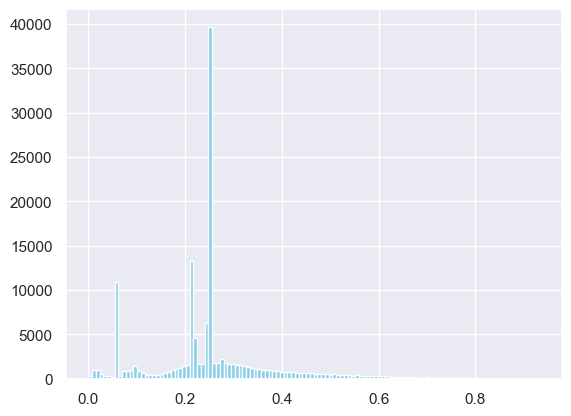

In [511]:
# data_with_predict['predict_target_4'].hist(bins=20)
submit_with_predict['predict_target_1'].hist(bins=120)

<Axes: >

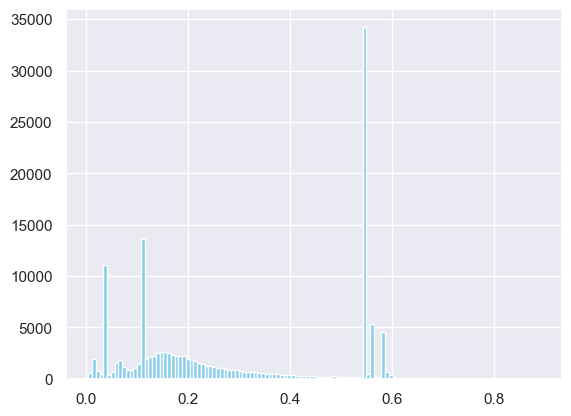

In [509]:
result_submit_df['target_1'].hist(bins=120)

<Axes: >

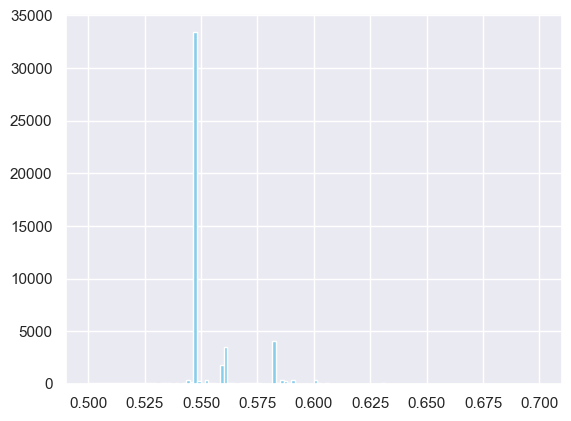

In [541]:

result_submit_df[result_submit_df[repeat_target_column].between(0.5, 0.7)]['target_1'].hist(bins=120)

<Axes: >

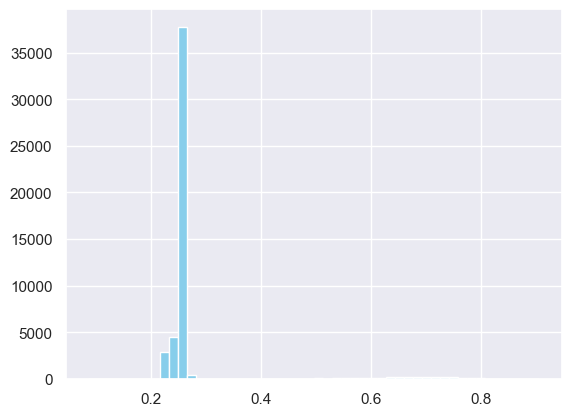

In [528]:
# Посмотрим какое распредление было у предсказаний 1го класса на этапе кросс-валидации
# repeat_submit_with_predict
repeat_target_column = 'target_1'
find_clients_with_bad_targets = result_submit_df[result_submit_df[repeat_target_column].between(0.5, 0.7)]['client_id'].values
repeat_submit_with_predict = submit_with_predict.reset_index()
repeat_submit_with_predict = repeat_submit_with_predict[repeat_submit_with_predict['client_id'].isin(find_clients_with_bad_targets)]
repeat_submit_with_predict[f'predict_{repeat_target_column}'].hist(bins=50)

In [530]:
# Это клиенты у которых было распредление предсказания на кросс-валиадции от 0.2 до 0.3
min_porog = 0.2
max_porog = 0.3
# Выбираем этих клиентов
repeat_submit_with_predict = repeat_submit_with_predict[repeat_submit_with_predict[f'predict_{repeat_target_column}'].between(min_porog, max_porog)]
repeat_submit_with_predict.shape

(45504, 1448)

In [526]:
# tmp_result_submit_df = result_submit_df['target_1']
# repeat_submit_with_predict = submit_with_predict[submit_with_predict['predict_target_1'].between(0.5, 0.7)]
# result_submit_df['target_1']
# repeat_submit_with_predict

In [531]:
# возьмем только те данные которые попадают в диапозон от 0.5 до 0.7 по предсказанию кросс-валиадции
# repeat_X_val_df
repeat_X_train_df = X_train_df[X_train_df[f'predict_{repeat_target_column}'].between(min_porog, max_porog)]
repeat_X_val_df = X_val_df[X_val_df[f'predict_{repeat_target_column}'].between(min_porog, max_porog)]
repeat_X_test_df = X_test_df[X_test_df[f'predict_{repeat_target_column}'].between(min_porog, max_porog)]
repeat_submit_with_predict = submit_with_predict[submit_with_predict[f'predict_{repeat_target_column}'].between(min_porog, max_porog)]

repeat_X_train_df.shape, repeat_X_val_df.shape, repeat_submit_with_predict.shape

((52379, 1449), (15228, 1449), (79248, 1446))

In [534]:
# Дообучение 1ой модели на части данных

ext_features_columns = features_columns + dict_allow_targets[repeat_target_column]

repeat_y_train = repeat_X_train_df[repeat_target_column]
repeat_X_train = repeat_X_train_df[ext_features_columns]

repeat_y_val = repeat_X_val_df[repeat_target_column]
repeat_X_val = repeat_X_val_df[ext_features_columns]

repeat_y_test = repeat_X_test_df[repeat_target_column]
repeat_X_test = repeat_X_test_df[ext_features_columns]


# Расчет дисбалнса классов
classes = np.unique(repeat_y_train)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=repeat_y_train)
class_weights = dict(zip(classes, weights))
class_weights

repeat_X_train.shape, repeat_y_train.shape, X_test.shape, repeat_X_val.shape, repeat_y_val.shape

repeat_model_target_1 = CatBoostClassifier(
                eval_metric="AUC", 
                early_stopping_rounds=50, 
                iterations=500,
                random_state=53, 
                cat_features=cat_columns, 
                ignored_features=list(set(drop_list) & set(repeat_X_train.columns)),
                class_weights=class_weights,
                )

train_pool = Pool(data=repeat_X_train, 
                  label=repeat_y_train, 
                  cat_features=cat_columns, 
                 weight=repeat_X_train_df['weights']
                 )
repeat_model_target_1.fit(train_pool, eval_set=(repeat_X_val, repeat_y_val), plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

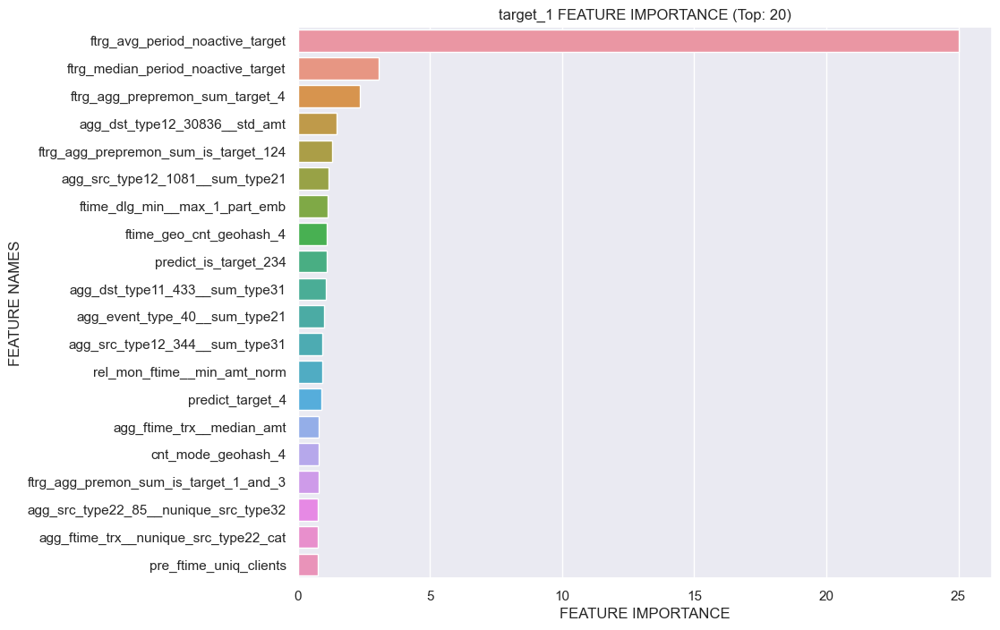

In [537]:
# Важность признаков
fi_df = plot_feature_importance(repeat_model_target_1.get_feature_importance(), repeat_X_test.columns, model_name=target_col, top_n=20)  

In [539]:
repeat_submit_with_predict[f'repeat_{repeat_target_column}'] = repeat_model_target_1.predict_proba(repeat_submit_with_predict[ext_features_columns])[:,1]

<Axes: >

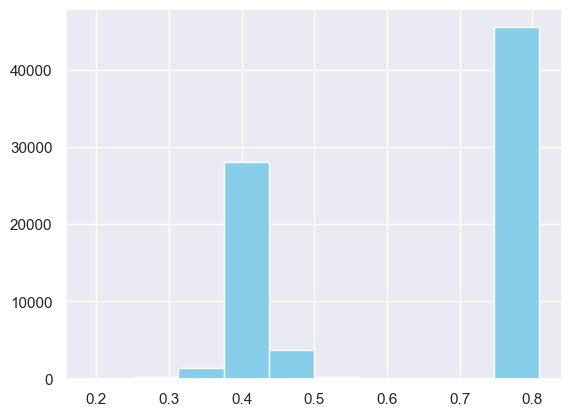

In [540]:
repeat_submit_with_predict[f'repeat_{repeat_target_column}'].hist()

In [330]:
# zip_filename = f'model_33_submission_{datetime.now().strftime("%d_%m_%Y__%H_%M")}'
# compression_options = dict(method='zip', archive_name=f'submission.csv')
# result_submit_df.to_csv(f'submission/{zip_filename}.zip', compression=compression_options)

In [944]:
# tmp_df = pd.DataFrame([y_test, y_pred_default], columns=[target_col, 'predict']).T


In [945]:
# tmp_df[tmp_df[target_col] == 0]['Unnamed 0'].median()

In [946]:
# tmp_df[tmp_df[target_col] == 1]['Unnamed 0'].median()

In [ ]:
print(tmp_df.sort_values(by=['Unnamed 0'], ascending=False)[:1000][target_col].sum())
print(tmp_df.sort_values(by=['Unnamed 0'], ascending=False)[:10_000][target_col].sum())
print(tmp_df.sort_values(by=['Unnamed 0'], ascending=False)[-1000:][target_col].sum())
print(tmp_df.sort_values(by=['Unnamed 0'], ascending=False)[-10_000:][target_col].sum())
# tmp_df.sort_values(by=['Unnamed 0'], ascending=False)[:200]

In [699]:
# X_train_df[X_train_df['target_1'] == 1]['client_id'][:1].item()

In [700]:
# # X_train_df[X_train_df['client_id'] == '44649bc6f086b70512b12c44c466528d6a8324880c3dcb83e7a99ed277485cd9'].shape
# # train_target_df[train_target_df['client_id'] == '44649bc6f086b70512b12c44c466528d6a8324880c3dcb83e7a99ed277485cd9'].shape
# # fi_df_target_4 = fi_df.copy()
# drop_features = fi_df_target_4[fi_df_target_4['feature_importance'] == 0]['feature_names'].values
# len(drop_features)

In [188]:
# list(drop_features[500:])

,feature_names,feature_importance
449,agg_src_type11_149__nunique_src_type31,8.285990
44,sum_embedding,8.075694
1638,ftrg_avg_period_noactive_target,7.518124
1640,ftrg_agg_premon_sum_target_1,2.125590
166,agg_event_type_38__nunique_src_type22,2.113057
...,...,...
807,agg_dst_type11_852__nunique_src_type32,0.000000
806,agg_dst_type11_852__nunique_src_type22,0.000000
805,agg_dst_type11_852__nunique_dst_type12,0.000000
804,agg_dst_type11_852__nunique_dst_type11,0.000000


In [178]:
fi_target_4

['agg_mon__median_type31',
 'agg_src_type12_344__median_type31',
 'agg_dst_type11_433__sum_type21',
 'agg_src_type32_4__sum_amt',
 'agg_dst_type11_433__median_type31',
 'agg_src_type11_19__median_type31',
 'agg_dst_type11_364__len_amt',
 'agg_mon__median_type21',
 'agg_src_type32_4__max_amt',
 'agg_src_type11_149__median_type31',
 'agg_dst_type12_22652__median_type31',
 'agg_src_type32_4__median_type31',
 'agg_event_type_54__median_type31',
 'agg_event_subtype_55__std_amt',
 'agg_dst_type11_364__median_type31',
 'agg_src_type32_26__median_type21',
 'agg_src_type32_4__sum_type31',
 'agg_event_type_54__sum_type31',
 'agg_src_type11_149__sum_type21',
 'agg_src_type32_17__median_type21']

In [300]:
fi_target_3

['agg_event_type_37__sum_type31',
 'agg_mon__min_amt',
 'agg_src_type11_149__sum_type31',
 'geo4_geohash_4_cat',
 'agg_event_subtype_49__max_amt',
 'agg_event_type_37__median_amt',
 'agg_dst_type12_30836__sum_type31',
 'agg_event_type_37__len_amt',
 'agg_event_subtype_49__len_amt',
 'agg_src_type11_19__min_amt',
 'agg_dst_type11_1166__median_amt',
 'agg_mon__std_amt',
 'cnt_prebuy_is_target_cnt',
 'agg_src_type32_4__median_type21',
 'agg_mon__sum_amt',
 'agg_event_subtype_49__sum_amt',
 'agg_src_type11_149__median_type31',
 'prebuy_is_target',
 'agg_mon__median_type31',
 'agg_mon__max_amt',
 'cnt_prebuy_target_4',
 'agg_dst_type11_1166__sum_amt',
 'agg_dst_type11_852__median_type31',
 'agg_event_type_54__median_type31',
 'agg_dst_type11_852__median_type21',
 'prebuy_is_target_2_4',
 'agg_dst_type11_433__len_amt',
 'agg_src_type32_81__min_amt',
 'cnt_prebuy_is_target_3_4',
 'agg_event_type_38__std_amt']

In [279]:
fi_target_2

['agg_src_type32_17__min_amt',
 'agg_src_type12_344__std_amt',
 'agg_src_type12_344__max_amt',
 'agg_src_type11_149__std_amt',
 'agg_src_type12_1081__len_amt',
 'agg_src_type12_344__median_type21',
 'agg_dst_type11_869__sum_type21',
 'agg_src_type12_344__sum_amt',
 'agg_src_type12_902__min_amt',
 'agg_src_type12_344__median_amt',
 'agg_src_type12_344__median_type31',
 'agg_mon__sum_amt',
 'agg_mon__min_amt',
 'geo5_geohash_5_cat',
 'agg_src_type11_149__min_amt',
 'agg_src_type22_70__sum_type31',
 'agg_mon__max_amt',
 'agg_src_type12_1081__max_amt',
 'agg_mon_rur__sum_amt',
 'agg_dst_type11_364__len_amt',
 'agg_event_subtype_47__median_amt',
 'agg_event_subtype_55__std_amt',
 'agg_dst_type12_10049__max_amt',
 'agg_dst_type12_10049__sum_amt',
 'agg_src_type12_344__len_amt',
 'agg_src_type11_19__median_type31',
 'agg_src_type32_4__median_type31',
 'agg_event_subtype_47__median_type31',
 'agg_dst_type11_433__max_amt',
 'agg_dst_type11_852__sum_amt']

In [258]:
# fi_target_1 = list(fi_df.sort_values(by='feature_importance', ascending=False)['feature_names'][:20])
fi_target_1

['agg_src_type11_149__sum_type31',
 'agg_src_type11_149__sum_type21',
 'agg_src_type11_149__len_amt',
 'agg_event_subtype_18__sum_type31',
 'prebuy_is_target_3_4',
 'geo4_geohash_4_cat',
 'agg_src_type11_149__max_amt',
 'agg_mon__min_amt',
 'agg_event_subtype_29__max_amt',
 'agg_dst_type11_852__sum_type31',
 'agg_src_type11_149__sum_amt',
 'agg_src_type11_149__median_type21',
 'agg_event_subtype_49__median_type31',
 'agg_event_type_37__sum_amt',
 'agg_src_type12_344__len_amt',
 'cnt_prebuy_target_4',
 'agg_dst_type11_852__median_amt',
 'agg_src_type11_19__max_amt',
 'agg_dst_type12_10049__sum_amt',
 'agg_dst_type11_852__median_type31',
 'agg_event_subtype_18__median_amt',
 'agg_src_type12_344__std_amt',
 'agg_mon__sum_amt',
 'geo6_cnt_geo',
 'agg_event_subtype_18__len_amt',
 'agg_mon__median_type31',
 'cnt_prebuy_target_1',
 'agg_dst_type11_852__len_amt',
 'agg_dst_type11_433__len_amt',
 'agg_dst_type11_852__min_amt']

In [193]:
fi_union = list(set(fi_target_1)|set(fi_target_2)|set(fi_target_3)|set(fi_target_4))
len(fi_union)

67

In [120]:
# fi_target_1 = list(fi_df.sort_values(by='feature_importance', ascending=False)['feature_names'][:20])

In [54]:
74695/6637433*100

1.1253597588103714

In [56]:
4125/367491*100

1.1224764688114812

In [ ]:
# tmp_df_2 = train_target_df.merge(tmp_df, how='right', left_on=['client_id','mon'], right_on = ['client_id','report_next_end'])
tmp_df_2

In [157]:
# target = 

In [60]:
X_test_df[
    (X_test_df['client_id'] == '525d7d67676e10d799a40762ab92594ce21beabd42541a14ce5dfecab344bc8c')&
    (X_test_df['report_next_end'] == '2022-02-28')
]

,client_id,report_next_end,report_end,agg_mon__len_amt,agg_mon__sum_amt,agg_mon__median_amt,agg_mon__std_amt,agg_mon__min_amt,agg_mon__max_amt,agg_mon__sum_type21,agg_mon__sum_type31,agg_mon__median_type21,agg_mon__median_type31,agg_mon_rur__len_amt,agg_mon_rur__sum_amt,agg_mon_rur__sum_type21,agg_mon_rur__sum_type31,prc_rur__len_amt,prc_rur__sum_amt,prc_rur__sum_type21,prc_rur__sum_type31,agg_event_type_54__len_amt,agg_event_type_54__sum_amt,agg_event_type_54__median_amt,agg_event_type_54__std_amt,agg_event_type_54__min_amt,agg_event_type_54__max_amt,agg_event_type_54__sum_type21,agg_event_type_54__sum_type31,agg_event_type_54__median_type21,agg_event_type_54__median_type31,agg_event_type_38__len_amt,agg_event_type_38__sum_amt,agg_event_type_38__median_amt,agg_event_type_38__std_amt,agg_event_type_38__min_amt,agg_event_type_38__max_amt,agg_event_type_38__sum_type21,agg_event_type_38__sum_type31,agg_event_type_38__median_type21,agg_event_type_38__median_type31,agg_event_type_37__len_amt,agg_event_type_37__sum_amt,agg_event_type_37__median_amt,agg_event_type_37__std_amt,agg_event_type_37__min_amt,agg_event_type_37__max_amt,agg_event_type_37__sum_type21,agg_event_type_37__sum_type31,agg_event_type_37__median_type21,agg_event_type_37__median_type31,agg_event_type_51__len_amt,agg_event_type_51__sum_amt,agg_event_type_51__median_amt,agg_event_type_51__std_amt,agg_event_type_51__min_amt,agg_event_type_51__max_amt,agg_event_type_51__sum_type21,agg_event_type_51__sum_type31,agg_event_type_51__median_type21,agg_event_type_51__median_type31,agg_event_type_25__len_amt,agg_event_type_25__sum_amt,agg_event_type_25__median_amt,agg_event_type_25__std_amt,agg_event_type_25__min_amt,agg_event_type_25__max_amt,agg_event_type_25__sum_type21,agg_event_type_25__sum_type31,agg_event_type_25__median_type21,agg_event_type_25__median_type31,agg_event_subtype_55__len_amt,agg_event_subtype_55__sum_amt,agg_event_subtype_55__median_amt,agg_event_subtype_55__std_amt,agg_event_subtype_55__min_amt,agg_event_subtype_55__max_amt,agg_event_subtype_55__sum_type21,agg_event_subtype_55__sum_type31,agg_event_subtype_55__median_type21,agg_event_subtype_55__median_type31,agg_event_subtype_49__len_amt,agg_event_subtype_49__sum_amt,agg_event_subtype_49__median_amt,agg_event_subtype_49__std_amt,agg_event_subtype_49__min_amt,agg_event_subtype_49__max_amt,agg_event_subtype_49__sum_type21,agg_event_subtype_49__sum_type31,agg_event_subtype_49__median_type21,agg_event_subtype_49__median_type31,agg_event_subtype_18__len_amt,agg_event_subtype_18__sum_amt,agg_event_subtype_18__median_amt,agg_event_subtype_18__std_amt,agg_event_subtype_18__min_amt,agg_event_subtype_18__max_amt,agg_event_subtype_18__sum_type21,agg_event_subtype_18__sum_type31,agg_event_subtype_18__median_type21,agg_event_subtype_18__median_type31,agg_event_subtype_29__len_amt,target_1,target_2,target_3,target_4
0,525d7d67676e10d799a40762ab92594ce21beabd42541a...,2022-02-28,2022-01-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0


In [36]:
# union_client_agg_df

In [181]:
# tmp_df['report_next_end']

In [ ]:
# new_df = pd.merge(A_df, B_df,  how='left', left_on=['A_c1','c2'], right_on = ['B_c1','c2'])

In [ ]:
from catboost import CatBoostClassifier, Pool

In [175]:
tmp_df = union_client_agg_df[:1000]
tmp_df.shape

(1000, 371)

In [184]:
# tmp_df_2 = train_target_df.merge(tmp_df, how='right', left_on=['client_id','mon'], right_on = ['client_id','report_next_end'])
tmp_df_2

,mon,target_1,target_2,target_3,target_4,client_id,report_end,report_next_end,agg_mon__len_amt,agg_mon__sum_amt,agg_mon__median_amt,agg_mon__std_amt,agg_mon__min_amt,agg_mon__max_amt,agg_mon__sum_type21,agg_mon__sum_type31,agg_mon__median_type21,agg_mon__median_type31,agg_mon_rur__len_amt,agg_mon_rur__sum_amt,agg_mon_rur__sum_type21,agg_mon_rur__sum_type31,prc_rur__len_amt,prc_rur__sum_amt,prc_rur__sum_type21,prc_rur__sum_type31,agg_event_type_54__len_amt,agg_event_type_54__sum_amt,agg_event_type_54__median_amt,agg_event_type_54__std_amt,agg_event_type_54__min_amt,agg_event_type_54__max_amt,agg_event_type_54__sum_type21,agg_event_type_54__sum_type31,agg_event_type_54__median_type21,agg_event_type_54__median_type31,agg_event_type_38__len_amt,agg_event_type_38__sum_amt,agg_event_type_38__median_amt,agg_event_type_38__std_amt,agg_event_type_38__min_amt,agg_event_type_38__max_amt,agg_event_type_38__sum_type21,agg_event_type_38__sum_type31,agg_event_type_38__median_type21,agg_event_type_38__median_type31,agg_event_type_37__len_amt,agg_event_type_37__sum_amt,agg_event_type_37__median_amt,agg_event_type_37__std_amt,agg_event_type_37__min_amt,agg_event_type_37__max_amt,agg_event_type_37__sum_type21,agg_event_type_37__sum_type31,agg_event_type_37__median_type21,agg_event_type_37__median_type31,agg_event_type_51__len_amt,agg_event_type_51__sum_amt,agg_event_type_51__median_amt,agg_event_type_51__std_amt,agg_event_type_51__min_amt,agg_event_type_51__max_amt,agg_event_type_51__sum_type21,agg_event_type_51__sum_type31,agg_event_type_51__median_type21,agg_event_type_51__median_type31,agg_event_type_25__len_amt,agg_event_type_25__sum_amt,agg_event_type_25__median_amt,agg_event_type_25__std_amt,agg_event_type_25__min_amt,agg_event_type_25__max_amt,agg_event_type_25__sum_type21,agg_event_type_25__sum_type31,agg_event_type_25__median_type21,agg_event_type_25__median_type31,agg_event_subtype_55__len_amt,agg_event_subtype_55__sum_amt,agg_event_subtype_55__median_amt,agg_event_subtype_55__std_amt,agg_event_subtype_55__min_amt,agg_event_subtype_55__max_amt,agg_event_subtype_55__sum_type21,agg_event_subtype_55__sum_type31,agg_event_subtype_55__median_type21,agg_event_subtype_55__median_type31,agg_event_subtype_49__len_amt,agg_event_subtype_49__sum_amt,agg_event_subtype_49__median_amt,agg_event_subtype_49__std_amt,agg_event_subtype_49__min_amt,agg_event_subtype_49__max_amt,agg_event_subtype_49__sum_type21,agg_event_subtype_49__sum_type31,agg_event_subtype_49__median_type21,agg_event_subtype_49__median_type31,agg_event_subtype_18__len_amt,agg_event_subtype_18__sum_amt,agg_event_subtype_18__median_amt,agg_event_subtype_18__std_amt,agg_event_subtype_18__min_amt,agg_event_subtype_18__max_amt,agg_event_subtype_18__sum_type21,agg_event_subtype_18__sum_type31,agg_event_subtype_18__median_type21,agg_event_subtype_18__median_type31,agg_event_subtype_29__len_amt,agg_event_subtype_29__sum_amt,agg_event_subtype_29__median_amt,agg_event_subtype_29__std_amt,agg_event_subtype_29__min_amt,agg_event_subtype_29__max_amt,agg_event_subtype_29__sum_type21,agg_event_subtype_29__sum_type31,agg_event_subtype_29__median_type21,agg_event_subtype_29__median_type31,agg_event_subtype_47__len_amt,agg_event_subtype_47__sum_amt,agg_event_subtype_47__median_amt,agg_event_subtype_47__std_amt,agg_event_subtype_47__min_amt,agg_event_subtype_47__max_amt,agg_event_subtype_47__sum_type21,agg_event_subtype_47__sum_type31,agg_event_subtype_47__median_type21,agg_event_subtype_47__median_type31,agg_src_type11_19__len_amt,agg_src_type11_19__sum_amt,agg_src_type11_19__median_amt,agg_src_type11_19__std_amt,agg_src_type11_19__min_amt,agg_src_type11_19__max_amt,agg_src_type11_19__sum_type21,agg_src_type11_19__sum_type31,agg_src_type11_19__median_type21,agg_src_type11_19__median_type31,agg_src_type11_149__len_amt,agg_src_type11_149__sum_amt,agg_src_type11_149__median_amt,agg_src_type11_149__std_amt,agg_src_type11_149__min_amt,agg_src_type11_149__max_amt,agg_src_type11_149__sum_type21,agg_src_type11

In [163]:
# client_agg_df['prc_rur__len_amt'] = client_agg_df['agg_mon_rur__len_amt'] / (client_agg_df['agg_mon__len_amt'] + eps)
# client_agg_df['prc_rur__sum_amt'] = client_agg_df['agg_mon_rur__sum_amt'] / (client_agg_df['agg_mon__sum_amt'] + eps)
# client_agg_df['prc_rur__sum_type21'] = client_agg_df['agg_mon_rur__sum_type21'] / (client_agg_df['agg_mon__sum_type21'] + eps)
# client_agg_df['prc_rur__sum_type31'] = client_agg_df['agg_mon_rur__sum_type31'] / (client_agg_df['agg_mon__sum_type31'] + eps)
# client_agg_df

In [165]:
# %%time

# client_sub_cat_agg_df = select_mon_trx_df.groupby('client_id').agg(
#                     len_amt = ('amount', len), 
#                     sum_amt = ('amount', sum), 
#                     median_amt = ('amount', np.median), 
#                     std_amt = ('amount', np.std),
#                     min_amt = ('amount', min),
#                     max_amt = ('amount', max),            
#                     sum_type21 = ('src_type21', sum), 
#                     sum_type31 = ('src_type31', sum), 
#                     median_type21 = ('src_type21', np.median), 
#                     median_type31 = ('src_type31', np.median),      

# ).add_prefix(f'agg_mon__')

# client_sub_cat_agg_df_2 = select_mon_trx_df[select_mon_trx_df['currency'] == 11].groupby('client_id').agg(
#                     len_amt = ('amount', len), 
#                     sum_amt = ('amount', sum), 
#                     sum_type21 = ('src_type21', sum), 
#                     sum_type31 = ('src_type31', sum), 
# ).add_prefix(f'agg_mon_rur__')

# client_sub_cat_agg_df.shape, client_sub_cat_agg_df_2.shape

In [140]:
client_sub_cat_agg_df_2

,agg_mon_rur__len_amt,agg_mon_rur__sum_amt,agg_mon_rur__sum_type21,agg_mon_rur__sum_type31
client_id,,,,
000006265d27d1166ed67506682be7380007a5bead4362f0a9795f7d97fb08e3,13,1.187614e+07,21437.0,15093.0
000006a0bf17ba6798dfd2d656690c54a9489ffdcdf030ca36d0bfa9375820dc,2,1.166523e+05,93142.0,1706.0
00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c8489fab384184d5ee,36,1.955276e+06,1020276.0,29880.0
000030a4067420da425d21ea72d5e647d26cf279e551796ca54d5c4385f1d476,4,5.480235e+05,61824.0,9944.0
0000474aa9bf8e794b4a3fe23e3143bb4a794523fddbce1db1937c4c54953664,8,1.511786e+06,226728.0,14680.0
...,...,...,...,...
ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cbbdef96c26116f04379,18,2.442391e+06,449010.0,44928.0
ffffab5f6ae1c8d04d83ef12e2ad803298737992698079e8b615bcf7410eb10d,14,8.131472e+05,36120.0,25340.0
ffffc7318bcad1435917639e46013c340756d54474a10275b8d72b91f903e761,22,8.890092e+06,335698.0,11000.0


In [139]:
# Определение популярной currency у клиента currency = 11 - рубли, остальное не рубли. 
# Можно посчитать долю рублевых платежей относительно других валют, как в кол-ве, так и в сумме  
# select_mon_trx_df['currency'] == 11
client_sub_cat_agg_df


,agg_mon__len_amt,agg_mon__sum_amt,agg_mon__median_amt,agg_mon__std_amt,agg_mon__min_amt,agg_mon__max_amt,agg_mon__sum_type21,agg_mon__sum_type31,agg_mon__median_type21,agg_mon__median_type31
client_id,,,,,,,,,,
000006265d27d1166ed67506682be7380007a5bead4362f0a9795f7d97fb08e3,13,1.187614e+07,10022.515625,3.206537e+06,3.500211,1.158495e+07,21437.0,15093.0,1649.0,1161.0
000006a0bf17ba6798dfd2d656690c54a9489ffdcdf030ca36d0bfa9375820dc,2,1.166523e+05,58326.169434,7.598755e+04,4594.854492,1.120575e+05,93142.0,1706.0,46571.0,853.0
00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c8489fab384184d5ee,36,1.955276e+06,41786.011719,7.692468e+04,344.444153,4.401062e+05,1020276.0,29880.0,28341.0,830.0
000030a4067420da425d21ea72d5e647d26cf279e551796ca54d5c4385f1d476,4,5.480235e+05,103807.063477,1.545740e+05,8892.844727,3.315165e+05,61824.0,9944.0,15456.0,2486.0
0000474aa9bf8e794b4a3fe23e3143bb4a794523fddbce1db1937c4c54953664,8,1.511786e+06,146428.085938,2.173190e+05,117.115845,6.730502e+05,226728.0,14680.0,28341.0,1835.0
...,...,...,...,...,...,...,...,...,...,...
ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cbbdef96c26116f04379,18,2.442391e+06,3751.878540,3.018217e+05,256.965240,9.871221e+05,449010.0,44928.0,24945.0,2496.0
ffffab5f6ae1c8d04d83ef12e2ad803298737992698079e8b615bcf7410eb10d,14,8.131472e+05,6046.936890,1.295826e+05,197.703629,4.916178e+05,36120.0,25340.0,2580.0,1810.0
ffffc7318bcad1435917639e46013c340756d54474a10275b8d72b91f903e761,22,8.890092e+06,93506.035156,6.258419e+05,1912.112671,2.204179e+06,335698.0,11000.0,15259.0,500.0


In [42]:
# cols = ['event_type', 'event_subtype', 'currency', 'src_type11', 'src_type12', 'dst_type11', 'dst_type12', 'src_type21', 'src_type22', 'src_type31', 'src_type32', ]
# length = len(all_trx_train_df)
# for col in cols:
#     print(col)
#     uniq_cnt = len(all_trx_train_df[col].unique())
    
#     print(f'{uniq_cnt} / {length} => {uniq_cnt/length*100}')
# #     break

In [90]:
len([54, 38, 37, 51, 25, 55, 49, 18, 29, 47, 19, 149, 344, 902, 1081, 364, 869, 433, 1166, 988, 852, 22652, 17340, 10049, 30836, 31488, 70, 41, 85, 81, 26, 4, 17, 25, 67])

35

In [75]:
# 19.0     162855385
# 149.0     23611777
(27919376 + 16752123 + 16544471 + 15009397 + 13586532 + 11384002)/len(all_trx_train_df)*100

47.05114989368822

In [82]:
# cat_cols = ['event_type', 'event_subtype', 'currency', 'src_type11', 'src_type12', 'dst_type11', 'dst_type12', 'src_type22', 'src_type32', ]
# # all_trx_train_df['event_subtype'].hist(bins=100)
# all_trx_train_df['src_type32'].value_counts().nlargest(20)

In [48]:
%%time
# 1. Общее количество транзакций клиента
select_mon_trx_df['total_transactions'] = select_mon_trx_df.groupby('client_id')['amount'].transform('count')
# 2. Общая сумма транзакций клиента
select_mon_trx_df['total_amount'] = select_mon_trx_df.groupby('client_id')['amount'].transform('sum')

<timed exec>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


CPU times: total: 5.2 s
Wall time: 5.19 s


<timed exec>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [112]:
%%time

client_sub_cat_agg_df = select_mon_trx_df.groupby('client_id').agg(
                   len_amt = ('amount', len), 
                    sum_amt = ('amount', sum), 
                    median_amt = ('amount', np.median), 
                    std_amt = ('amount', np.std),
                    min_amt = ('amount', min),
                    max_amt = ('amount', max),            
                    sum_type21 = ('src_type21', sum), 
                    sum_type31 = ('src_type31', sum), 
                    median_type21 = ('src_type21', np.median), 
                    median_type31 = ('src_type31', np.median),      
    
).add_prefix(f'agg_mon__')
client_agg_df = client_agg_df.merge(client_sub_cat_agg_df, on='client_id', how='left').fillna(0)
client_agg_df.shape

CPU times: total: 12.5 s
Wall time: 12.4 s


(1081371, 23)

In [113]:
client_agg_df

,client_id,report_end,report_next_end,agr_event_type_54__len_amt,agr_event_type_54__sum_amt,agr_event_type_54__median_amt,agr_event_type_54__std_amt,agr_event_type_54__min_amt,agr_event_type_54__max_amt,agr_event_type_54__sum_type21,agr_event_type_54__sum_type31,agr_event_type_54__median_type21,agr_event_type_54__median_type31,agg_mon__len_amt,agg_mon__sum_amt,agg_mon__median_amt,agg_mon__std_amt,agg_mon__min_amt,agg_mon__max_amt,agg_mon__sum_type21,agg_mon__sum_type31,agg_mon__median_type21,agg_mon__median_type31
0,51f88b707d9c8766cdbdfe799ba0fafd8f5b8034b08c46...,2022-01-31,2022-02-28,1.0,6.311323e+04,63113.226562,0.000000,63113.226562,63113.226562,46339.0,2423.0,46339.0,2423.0,2.0,6.660388e+04,33301.937500,42159.529304,3490.648438,63113.226562,92678.0,4846.0,46339.0,2423.0
1,522256f58adeaf13fbf098859fe5627f663ab586cb71e7...,2022-01-31,2022-02-28,0.0,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,8.0,6.852730e+04,4163.892456,11297.509734,1.222030,31682.630859,237720.0,6512.0,29715.0,814.0
2,522ff0793af20dff019519fddea3117f8858c9823ba364...,2022-01-31,2022-02-28,0.0,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
3,523bbf480e65912fac332549b46d5ccec8a17ddc65b85f...,2022-01-31,2022-02-28,1.0,9.647572e+04,96475.718750,0.000000,96475.718750,96475.718750,3191.0,2240.0,3191.0,2240.0,1.0,9.647572e+04,96475.718750,0.000000,96475.718750,96475.718750,3191.0,2240.0,3191.0,2240.0
4,5247a0d6e2ebcfb51b2bd2d3dbcf2706dd4d372189bf0a...,2022-01-31,2022-02-28,2.0,4.185159e+05,209257.976562,148916.986429,103957.765625,314558.187500,44238.0,2592.0,22119.0,1296.0,22.0,1.345999e+06,45354.976562,65826.651270,9.290074,314558.187500,486618.0,28512.0,22119.0,1296.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1081366,f41b2858ce384d7d7553ef97ff55a4e4d07e6f4cd9e267...,2022-01-31,2022-02-28,4.0,2.140642e+04,3326.920776,5700.025017,1022.791626,13729.784180,36320.0,2288.0,9080.0,572.0,6.0,3.261866e+04,3422.848633,4691.517495,1022.791626,13729.784180,54480.0,3432.0,9080.0,572.0
1081367,f7bb22dd3ebf85c89b933100638b3a4270afe3cc62b82b...,2022-01-31,2022-02-28,42.0,2.742567e+06,48997.238281,55385.139316,493.240814,223931.656250,1109934.0,7938.0,26427.0,189.0,56.0,2.785992e+06,41868.404297,55061.232254,22.239765,223931.656250,1479912.0,10584.0,26427.0,189.0
1081368,f842d320bfc1ab5276d9e39e2e961b2be560d9405f717b...,2022-01-31,2022-02-28,4.0,8.743654e+05,269105.898438,120654.790710,40189.128906,295964.406250,42160.0,6696.0,10540.0,1674.0,4.0,8.743654e+05,269105.898438,120654.790710,40189.128906,295964.406250,42160.0,6696.0,10540.0,1674.0
1081369,f84b6af02d3b3f3f79742df549a00c36c347dc3f227bb5...,2022-01-31,2022-02-28,0.0,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0


In [92]:
%%time
# Формируем фичи по транзакциям с группировкой по категориям
for cat_name in tqdm(cat_pop_items):
    for item in tqdm(cat_pop_items[cat_name]):
        # Выбираем данные только с указанным значением для выбранной категории
        sub_cat_df = select_mon_trx_df[select_mon_trx_df[cat_name] == item][['client_id', 'amount', 'src_type21', 'src_type31']]
        print(sub_cat_df.shape)
        # Расчитываем агрегаты по численным значениям 
        tmp_df = sub_cat_df.groupby('client_id').agg(
                len_amt = ('amount', len), 
                sum_amt = ('amount', sum), 
                median_amt = ('amount', np.median), 
                std_amt = ('amount', np.std),
                min_amt = ('amount', min),
                max_amt = ('amount', max),            
                sum_type21 = ('src_type21', sum), 
                sum_type31 = ('src_type31', sum), 
                median_type21 = ('src_type21', np.median), 
                median_type31 = ('src_type31', np.median), 
        ).add_prefix(f'agr_{cat_name}_{item}__')
        break
    break

  0%|          | 0/5 [00:00<?, ?it/s]

(6475074, 4)


  0%|          | 0/8 [00:08<?, ?it/s]

CPU times: total: 8.22 s
Wall time: 8.24 s


In [94]:
tmp_df.reset_index()

,client_id,agr_event_type_54__len_amt,agr_event_type_54__sum_amt,agr_event_type_54__median_amt,agr_event_type_54__std_amt,agr_event_type_54__min_amt,agr_event_type_54__max_amt,agr_event_type_54__sum_type21,agr_event_type_54__sum_type31,agr_event_type_54__median_type21,agr_event_type_54__median_type31
0,000006265d27d1166ed67506682be7380007a5bead4362...,4,1.166051e+07,32770.053711,5.779917e+06,10022.515625,1.158495e+07,6596.0,4644.0,1649.0,1161.0
1,000006a0bf17ba6798dfd2d656690c54a9489ffdcdf030...,1,4.594854e+03,4594.854492,NaN,4594.854492,4.594854e+03,46571.0,853.0,46571.0,853.0
2,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,10,5.691508e+05,41841.775391,6.759132e+04,344.444153,2.329585e+05,283410.0,8300.0,28341.0,830.0
3,00011c01bb22d8f62d9655f32d123dcca5ae55179f8266...,5,1.056790e+06,9876.702148,4.554978e+05,2001.510986,1.026145e+06,20030.0,12480.0,4006.0,2496.0
4,000120ff37fb0179d54e94c6e7266c92f3e3c3c630223f...,1,8.233294e+03,8233.293945,NaN,8233.293945,8.233294e+03,7358.0,1683.0,7358.0,1683.0
...,...,...,...,...,...,...,...,...,...,...,...
690586,ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cb...,7,2.333109e+06,19145.498047,4.278388e+05,1108.579590,9.871221e+05,174615.0,17472.0,24945.0,2496.0
690587,ffffab5f6ae1c8d04d83ef12e2ad803298737992698079...,3,1.999243e+05,85907.789062,5.165182e+04,8125.599609,1.058910e+05,7740.0,5430.0,2580.0,1810.0
690588,ffffc7318bcad1435917639e46013c340756d54474a102...,17,5.694862e+06,48175.414062,5.222197e+05,1912.112671,1.819630e+06,259403.0,8500.0,15259.0,500.0
690589,ffffd4051d83a66a3dd0047c4f3c79902a4ef5df0878ef...,2,1.463661e+06,731830.667969,9.675999e+05,47634.210938,1.416027e+06,87268.0,1490.0,43634.0,745.0


In [52]:
%%time
# 18. Количество транзакций по подкатегории 1 для клиента
# transactions_df['event_subtype_transactions'] = transactions_df.groupby(['client_id', 'event_subtype'])['amount'].transform('count')
tmp_df_2 = select_mon_trx_df.groupby(['client_id', 'event_subtype']).agg(
    cnt_trx_event_subtype = ('amount', len), 
    sum_trx_event_subtype = ('amount', sum), 
)
tmp_df_2.shape

<timed exec>:3: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.


CPU times: total: 27.5 s
Wall time: 27.5 s


(3124869, 2)

In [50]:
select_mon_trx_df['client_id'].unique().shape

(844295,)

In [ ]:
# 1. Общее количество транзакций клиента
transactions_df['total_transactions'] = transactions_df.groupby('client_id')['amount'].transform('count')
# 2. Общая сумма транзакций клиента
transactions_df['total_amount'] = transactions_df.groupby('client_id')['amount'].transform('sum')
# 3. Средняя сумма транзакции клиента
transactions_df['average_amount'] = transactions_df.groupby('client_id')['amount'].transform('mean')
# 4. Количество уникальных категорий 1 для клиента
transactions_df['unique_categories_1'] = transactions_df.groupby('client_id')['event_type'].transform('nunique')
# 5. Количество уникальных подкатегорий 1 для клиента
transactions_df['unique_subcategories_1'] = transactions_df.groupby('client_id')['event_subtype'].transform('nunique')

# 6. Количество уникальных категорий 2 для клиента
transactions_df['unique_categories_2'] = transactions_df.groupby('client_id')['src_type11'].transform('nunique')

# 7. Количество уникальных подкатегорий 2 для клиента
transactions_df['unique_subcategories_2'] = transactions_df.groupby('client_id')['src_type12'].transform('nunique')

# 8. Максимальная сумма транзакции клиента
transactions_df['max_amount'] = transactions_df.groupby('client_id')['amount'].transform('max')

# 9. Минимальная сумма транзакции клиента
transactions_df['min_amount'] = transactions_df.groupby('client_id')['amount'].transform('min')

# 10. Количество дней между первой и последней транзакцией клиента
transactions_df['days_between_first_last'] = (transactions_df.groupby('client_id')['event_time'].transform('max') - transactions_df.groupby('client_id')['event_time'].transform('min')).dt.days

# 11. Количество транзакций за последние 7 дней для клиента
transactions_df['last_7_days_transactions'] = transactions_df.groupby('client_id')['event_time'].rolling('7D').count().reset_index(0, drop=True)

# 12. Количество транзакций за последние 30 дней для клиента
transactions_df['last_30_days_transactions'] = transactions_df.groupby('client_id')['event_time'].rolling('30D').count().reset_index(0, drop=True)

# 13. Сумма транзакций за последние 7 дней для клиента
transactions_df['last_7_days_amount'] = transactions_df.groupby('client_id')['amount'].rolling('7D').sum().reset_index(0, drop=True)

# 14. Сумма транзакций за последние 30 дней для клиента
transactions_df['last_30_days_amount'] = transactions_df.groupby('client_id')['amount'].rolling('30D').sum().reset_index(0, drop=True)

# 15. Средняя сумма транзакции за последние 7 дней для клиента
transactions_df['last_7_days_average_amount'] = transactions_df.groupby('client_id')['amount'].rolling('7D').mean().reset_index(0, drop=True)

# 16. Средняя сумма транзакции за последние 30 дней для клиента
transactions_df['last_30_days_average_amount'] = transactions_df.groupby('client_id')['amount'].rolling('30D').mean().reset_index(0, drop=True)

# 17. Количество транзакций по категории 1 для клиента
transactions_df['event_type_transactions'] = transactions_df.groupby(['client_id', 'event_type'])['amount'].transform('count')

# 18. Количество транзакций по подкатегории 1 для клиента
transactions_df['event_subtype_transactions'] = transactions_df.groupby(['client_id', 'event_subtype'])['amount'].transform('count')

# 19. Количество транзакций по категории 2 для клиента
transactions_df['src_type11_transactions'] = transactions_df.groupby(['client_id', 'src_type11'])['amount'].transform('count')

# 20. Количество транзакций по подкатегории 2 для клиента
transactions_df['src_type12_transactions'] = transactions_df.groupby(['client_id', 'src_type12'])['amount'].transform('count')

# 21. Сумма транзакций по категории 1 для клиента
transactions_df['event_type_amount'] = transactions_df.groupby(['client_id', 'event_type'])['amount'].transform('sum')

# 22. Сумма транзакций по подкатегории 1 для клиента
transactions_df['event_subtype_amount'] = transactions_df.groupby(['client_id', 'event_subtype'])['amount'].transform('sum')

# 23. Сумма транзакций по категории 2 для клиента
transactions_df['src_type11_amount'] = transactions_df.groupby(['client_id', 'src_type11'])['amount'].transform('sum')

# 24. Сумма транзакций по подкатегории 2 для клиента
transactions_df['src_type12_amount'] = transactions_df.groupby(['client_id', 'src_type12'])['amount'].transform('sum')

# 25. Средняя сумма транзакции по категории 1 для клиента
transactions_df['event_type_average_amount'] = transactions_df.groupby(['client_id', 'event_type'])['amount'].transform('mean')

# 26. Средняя сумма транзакции по подкатегории 1 для клиента
transactions_df['event_subtype_average_amount'] = transactions_df.groupby(['client_id', 'event_subtype'])['amount'].transform('mean')

# 27. Средняя сумма транзакции по категории 2 для клиента
transactions_df['src_type11_average_amount'] = transactions_df.groupby(['client_id', 'src_type11'])['amount'].transform('mean')

# 28. Средняя сумма транзакции по подкатегории 2 для клиента
transactions_df['src_type12_average_amount'] = transactions_df.groupby(['client_id', 'src_type12'])['amount'].transform('mean')

# 29. День недели с наибольшим количеством транзакций для клиента
transactions_df['busiest_day'] = transactions_df.groupby('client_id')['event_time'].apply(lambda x: x.dt.day_name().mode()[0])


In [ ]:
# # Формируем статистику посещений каждого терминала уникальными клиентами и общее кол-во посещений
# start_date = datetime(2022, 1, 1, 0, 0, 0)
# end_date = datetime(2023, 1, 1, 0, 0, 0)
# union_geohash_4_df = pd.DataFrame()
# union_geohash_5_df = pd.DataFrame()
# union_geohash_6_df = pd.DataFrame()

# for i in trange(13):
#     end_date = start_date + relativedelta(months=1) - relativedelta(days=1)
#     print(f'start: {start_date}, end: {end_date}')
    
#     select_mon_geo_df = all_geo_train_df[all_geo_train_df['event_time'].between(start_date, end_date)]
#     print(select_mon_geo_df.shape)

In [10]:
# %%time
# geo_train_df = load_df_by_files(train_geo_files)
# geo_train_df.shape

In [11]:
# %%time
# geo_test_df = load_df_by_files(test_geo_files)
# geo_test_df.shape

In [12]:
# %%time
# Объединяем все известные данные по геообъектам
# all_geo_train_df = pd.concat([geo_train_df, geo_test_df])
# del geo_train_df
# del geo_test_df
# all_geo_train_df.shape

In [13]:
# min_date = all_geo_train_df['event_time'].min()
# max_date = all_geo_train_df['event_time'].max()
# min_date, max_date

In [15]:
%%time
# Формируем статистику посещений каждого терминала уникальными клиентами и общее кол-во посещений
start_date = datetime(2022, 1, 1, 0, 0, 0)
end_date = datetime(2023, 1, 1, 0, 0, 0)
union_geohash_4_df = pd.DataFrame()
union_geohash_5_df = pd.DataFrame()
union_geohash_6_df = pd.DataFrame()

for i in trange(13):
    end_date = start_date + relativedelta(months=1) - relativedelta(days=1)
    print(f'start: {start_date}, end: {end_date}')
    
    select_mon_geo_df = all_geo_train_df[all_geo_train_df['event_time'].between(start_date, end_date)]
    print(select_mon_geo_df.shape)
    
    def calc_aggregate_by_geohash(geo_index:str='geohash_4'):
        geohash_df = select_mon_geo_df.groupby(geo_index).agg(
                                        count_trx = ('client_id', len),
                                        uniq_clients = ('client_id', pd.Series.nunique),
                                              )
        geohash_df['report_end'] = end_date
        geohash_df['report_next_end'] = start_date + relativedelta(months=2) - relativedelta(days=1)
        
        # Рассчитываем уровень "продоваемости продукта" относительно геопозиции
        train_client_by_cur_mon_df = train_target_df[pd.to_datetime(train_target_df['mon']).between(start_date, start_date + relativedelta(months=1) - relativedelta(days=1))]
        current_mon_train_df = train_client_by_cur_mon_df.rename(columns={'mon':'mon_report'}).add_prefix('cur_mon_')
        
        client_geo_df = select_mon_geo_df[['client_id', geo_index]].drop_duplicates()
        cur_mon_select_geo_target_df = client_geo_df.merge(current_mon_train_df, left_on='client_id', right_on='cur_mon_client_id', how='left').fillna(0)
    
    
        popular_product_by_geohash_df = cur_mon_select_geo_target_df.groupby(geo_index).agg(
                                        cur_sum_target_1 = ('cur_mon_target_1', sum),
                                        cur_sum_target_2 = ('cur_mon_target_2', sum),
                                        cur_sum_target_3 = ('cur_mon_target_3', sum),
                                        cur_sum_target_4 = ('cur_mon_target_4', sum),

                                        cur_median_target_1 = ('cur_mon_target_1', np.median),
                                        cur_median_target_2 = ('cur_mon_target_2', np.median),
                                        cur_median_target_3 = ('cur_mon_target_3', np.median),
                                        cur_median_target_4 = ('cur_mon_target_4', np.median),

                                        cur_var_target_1 = ('cur_mon_target_1', 'var'),
                                        cur_var_target_2 = ('cur_mon_target_2', 'var'),
                                        cur_var_target_3 = ('cur_mon_target_3', 'var'),
                                        cur_var_target_4 = ('cur_mon_target_4', 'var'),

                                        uniq_clients = ('client_id', pd.Series.nunique),
        )
        
        # Расчитываем значение "популярности" геохешей относительно кол-ва клиентов
        columns = ['cur_sum_target_1', 'cur_sum_target_2', 'cur_sum_target_3', 'cur_sum_target_4', 'cur_median_target_1', 'cur_median_target_2', 'cur_median_target_3', 'cur_median_target_4', 'cur_var_target_1', 'cur_var_target_2', 'cur_var_target_3', 'cur_var_target_4', ]
        for col in columns:
            popular_product_by_geohash_df[f'{col}__by_clients'] = popular_product_by_geohash_df[col] / popular_product_by_geohash_df['uniq_clients']

        geohash_df = geohash_df.reset_index().merge(popular_product_by_geohash_df.reset_index(), on=geo_index, how='left')
        return geohash_df
    
    geohash_4_df = calc_aggregate_by_geohash(geo_index='geohash_4').fillna(0)
    union_geohash_4_df = pd.concat([union_geohash_4_df, geohash_4_df])

    geohash_5_df = calc_aggregate_by_geohash(geo_index='geohash_5').fillna(0)
    union_geohash_5_df = pd.concat([union_geohash_5_df, geohash_5_df])

    geohash_6_df = calc_aggregate_by_geohash(geo_index='geohash_6').fillna(0)
    union_geohash_6_df = pd.concat([union_geohash_6_df, geohash_6_df])

    start_date = start_date + relativedelta(months=1)
    
union_geohash_4_df.shape, union_geohash_5_df.shape, union_geohash_6_df.shape

  0%|          | 0/13 [00:00<?, ?it/s]

start: 2022-01-01 00:00:00, end: 2022-01-31 00:00:00
(46236373, 5)


<timed exec>:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to

start: 2022-02-01 00:00:00, end: 2022-02-28 00:00:00
(56463257, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

start: 2022-03-01 00:00:00, end: 2022-03-31 00:00:00
(67114247, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

start: 2022-04-01 00:00:00, end: 2022-04-30 00:00:00
(59103493, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

start: 2022-05-01 00:00:00, end: 2022-05-31 00:00:00
(61546843, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

start: 2022-06-01 00:00:00, end: 2022-06-30 00:00:00
(61781089, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

start: 2022-07-01 00:00:00, end: 2022-07-31 00:00:00
(65913203, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

start: 2022-08-01 00:00:00, end: 2022-08-31 00:00:00
(67921454, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

start: 2022-09-01 00:00:00, end: 2022-09-30 00:00:00
(53479282, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

start: 2022-10-01 00:00:00, end: 2022-10-31 00:00:00
(52287223, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

start: 2022-11-01 00:00:00, end: 2022-11-30 00:00:00
(44756291, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

start: 2022-12-01 00:00:00, end: 2022-12-31 00:00:00
(9262981, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

start: 2023-01-01 00:00:00, end: 2023-01-31 00:00:00
(0, 5)


<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
<timed exec>:31: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:31: FutureWarning: The provided callable <function median at 0x000001E5D84C4EA0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavio

CPU times: total: 23min 32s
Wall time: 23min 30s


((239479, 30), (1592930, 30), (7865072, 30))

In [18]:
%%time
union_geohash_4_df.to_csv(PATH_DATASET_OUTPUT + 'union_geohash_4_df.csv', index=False)
union_geohash_5_df.to_csv(PATH_DATASET_OUTPUT + 'union_geohash_5_df.csv', index=False)
union_geohash_6_df.to_csv(PATH_DATASET_OUTPUT + 'union_geohash_6_df.csv', index=False)

CPU times: total: 1min 28s
Wall time: 1min 30s


In [110]:
%%time
# Популярные геохеши у клиентов
# Расчет топ-5 популярных хешей для каждого клиента, и также расчет процента посещения этих топ-5 относительно всех посещаемых геохешей (по аналогии с софтмакс)
start_date = datetime(2022, 1, 1, 0, 0, 0)
end_date = datetime(2023, 1, 1, 0, 0, 0)

union_geo_by_clients_4_df = pd.DataFrame()
union_geo_by_clients_5_df = pd.DataFrame()
union_geo_by_clients_6_df = pd.DataFrame()

clients_top_geohash_4_df = pd.DataFrame()
clients_top_geohash_5_df = pd.DataFrame()
clients_top_geohash_6_df = pd.DataFrame()


for i in trange(13):
    end_date = start_date + relativedelta(months=1) - relativedelta(days=1)
    print(f'start: {start_date}, end: {end_date}')
    
    select_mon_geo_df = all_geo_train_df[all_geo_train_df['event_time'].between(start_date, end_date)]
    print(select_mon_geo_df.shape)
    
    def calc_aggregate_client_by_geohash(geo_index:str='geohash_4'):
        client_geo_df = select_mon_geo_df.groupby(['client_id',geo_index]).size().reset_index(name='freq')

        geohash_df = client_geo_df.groupby(['client_id']).agg(
            cnt_geo = ('freq', len),
            sum_geo_trx = ('freq', sum),
        )

        geo_by_clients = geohash_df.reset_index().merge(client_geo_df, on='client_id', how='left')
        geo_by_clients['prc_use'] = geo_by_clients['freq'] / geo_by_clients['sum_geo_trx']

        geo_by_clients['report_end'] = end_date
        geo_by_clients['report_next_end'] = start_date + relativedelta(months=2) - relativedelta(days=1)
        
        popular_geo_by_clients = geo_by_clients.loc[geo_by_clients.groupby('client_id')['prc_use'].transform('max').eq(geo_by_clients['prc_use'])]
        # Могут быть ситуации когда одинаковые геохеши имеют одинаковый вес, тогда выбираем первый
        popular_geo_by_clients = popular_geo_by_clients.drop_duplicates(subset=['client_id', 'prc_use'])
        
        popular_geo_by_clients['report_end'] = end_date
        popular_geo_by_clients['report_next_end'] = start_date + relativedelta(months=2) - relativedelta(days=1)
        
        return geo_by_clients.fillna(0), popular_geo_by_clients.fillna(0)
    
    geo_by_clients_4_df, pop_geo_by_clients_4_df = calc_aggregate_client_by_geohash(geo_index='geohash_4')
    union_geo_by_clients_4_df = pd.concat([union_geo_by_clients_4_df, geo_by_clients_4_df])
    clients_top_geohash_4_df = pd.concat([clients_top_geohash_4_df, pop_geo_by_clients_4_df])

    geo_by_clients_5_df, pop_geo_by_clients_5_df = calc_aggregate_client_by_geohash(geo_index='geohash_5')
    union_geo_by_clients_5_df = pd.concat([union_geo_by_clients_5_df, geo_by_clients_5_df])
    clients_top_geohash_5_df = pd.concat([clients_top_geohash_5_df, pop_geo_by_clients_5_df])

    geo_by_clients_6_df, pop_geo_by_clients_6_df = calc_aggregate_client_by_geohash(geo_index='geohash_6')
    union_geo_by_clients_6_df = pd.concat([union_geo_by_clients_6_df, geo_by_clients_6_df])
    clients_top_geohash_6_df = pd.concat([clients_top_geohash_6_df, pop_geo_by_clients_6_df])

    start_date = start_date + relativedelta(months=1)
    
union_geo_by_clients_4_df.shape, union_geo_by_clients_5_df.shape, union_geo_by_clients_6_df.shape, clients_top_geohash_4_df.shape, clients_top_geohash_5_df.shape, clients_top_geohash_6_df.shape, 

  0%|          | 0/13 [00:00<?, ?it/s]

start: 2022-01-01 00:00:00, end: 2022-01-31 00:00:00
(46236373, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  8%|▊         | 1/13 [00:58<11:46, 58.89s/it]

start: 2022-02-01 00:00:00, end: 2022-02-28 00:00:00
(56463257, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
 15%|█▌        | 2/13 [02:04<11:29, 62.70s/it]

start: 2022-03-01 00:00:00, end: 2022-03-31 00:00:00
(67114247, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
 23%|██▎       | 3/13 [03:17<11:15, 67.57s/it]

start: 2022-04-01 00:00:00, end: 2022-04-30 00:00:00
(59103493, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
 31%|███       | 4/13 [04:28<10:18, 68.69s/it]

start: 2022-05-01 00:00:00, end: 2022-05-31 00:00:00
(61546843, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
 38%|███▊      | 5/13 [05:42<09:26, 70.87s/it]

start: 2022-06-01 00:00:00, end: 2022-06-30 00:00:00
(61781089, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
 46%|████▌     | 6/13 [06:59<08:29, 72.83s/it]

start: 2022-07-01 00:00:00, end: 2022-07-31 00:00:00
(65913203, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
 54%|█████▍    | 7/13 [08:18<07:28, 74.79s/it]

start: 2022-08-01 00:00:00, end: 2022-08-31 00:00:00
(67921454, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
 62%|██████▏   | 8/13 [09:39<06:24, 76.83s/it]

start: 2022-09-01 00:00:00, end: 2022-09-30 00:00:00
(53479282, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
 69%|██████▉   | 9/13 [10:51<05:01, 75.42s/it]

start: 2022-10-01 00:00:00, end: 2022-10-31 00:00:00
(52287223, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
 77%|███████▋  | 10/13 [12:07<03:46, 75.64s/it]

start: 2022-11-01 00:00:00, end: 2022-11-30 00:00:00
(44756291, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
 85%|████████▍ | 11/13 [13:12<02:24, 72.19s/it]

start: 2022-12-01 00:00:00, end: 2022-12-31 00:00:00
(9262981, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
 92%|█████████▏| 12/13 [13:47<01:00, 60.88s/it]

start: 2023-01-01 00:00:00, end: 2023-01-31 00:00:00
(0, 5)


<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:25: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
100%|██████████| 13/13 [13:58<00:00, 64.49s/it]

CPU times: total: 13min 59s
Wall time: 13min 58s


((31130494, 8),
 (65577394, 8),
 (130019962, 8),
 (7472391, 8),
 (7472391, 8),
 (7472391, 8))

In [112]:
%%time
union_geo_by_clients_4_df.to_csv(PATH_DATASET_OUTPUT + 'union_geo_by_clients_4_df.csv', index=False)
union_geo_by_clients_5_df.to_csv(PATH_DATASET_OUTPUT + 'union_geo_by_clients_5_df.csv', index=False)
union_geo_by_clients_6_df.to_csv(PATH_DATASET_OUTPUT + 'union_geo_by_clients_6_df.csv', index=False)

clients_top_geohash_4_df.to_csv(PATH_DATASET_OUTPUT + 'clients_top_geohash_4_df.csv', index=False)
clients_top_geohash_5_df.to_csv(PATH_DATASET_OUTPUT + 'clients_top_geohash_5_df.csv', index=False)
clients_top_geohash_6_df.to_csv(PATH_DATASET_OUTPUT + 'clients_top_geohash_6_df.csv', index=False)

CPU times: total: 14min 50s
Wall time: 15min 4s


# Подвал

In [38]:
%%time
# geohash_df = select_mon_geo_df.groupby('client_id').agg(
#                                 count_trx = ('client_id', len),
#                                 uniq_clients = ('client_id', pd.Series.nunique),
#     geohash_4
#                                       )
tmp_df = select_mon_geo_df.groupby(['client_id','geohash_4']).size().reset_index(name='freq')
tmp_df

CPU times: total: 9 s
Wall time: 9.02 s


,client_id,geohash_4,freq
0,000006265d27d1166ed67506682be7380007a5bead4362...,36164,1
1,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,3531,97
2,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,17663,9
3,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,21721,4
4,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,22008,2
...,...,...,...
2452602,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,5038,2
2452603,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,8780,3
2452604,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,13471,7
2452605,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,17708,22


In [39]:
# tmp_df['client_id'][-1:].item()
tmp_df[tmp_df['client_id'] == 'fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053ab70fb6c7e740a70300']

,client_id,geohash_4,freq
2452601,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,4465,1
2452602,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,5038,2
2452603,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,8780,3
2452604,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,13471,7
2452605,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,17708,22
2452606,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,24250,151


In [47]:
tmp_df_2 = tmp_df.groupby(['client_id']).agg(
    cnt_geo = ('freq', len),
    sum_geo_trx = ('freq', sum),
)
tmp_df_2

C:\Users\Profit77\AppData\Local\Temp\ipykernel_19912\1892987954.py:1: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  tmp_df_2 = tmp_df.groupby(['client_id']).agg(


,cnt_geo,sum_geo_trx
client_id,,
000006265d27d1166ed67506682be7380007a5bead4362f0a9795f7d97fb08e3,1,1
00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c8489fab384184d5ee,8,153
00011c01bb22d8f62d9655f32d123dcca5ae55179f8266bdb8676e25321e8477,4,57
000120ff37fb0179d54e94c6e7266c92f3e3c3c630223fb480807226e6024101,4,55
000128505752a589529a45682553d457fe827dc5250f8664b94354c6ecc7f6f6,1,3
...,...,...
ffffa99ee602d379ea65e0fbdbfb0c82ed074e28cd3adac2978cd07d26fb8bf4,1,32
ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cbbdef96c26116f04379,3,28
ffffd4051d83a66a3dd0047c4f3c79902a4ef5df0878efdcefc1381f9907d993,1,7


In [54]:
tmp_df_3 = tmp_df.merge(tmp_df_2.reset_index(), on='client_id', how='left')
tmp_df_3['prc_use'] = tmp_df_3['freq'] / tmp_df_3['sum_geo_trx']
tmp_df_3

,client_id,geohash_4,freq,cnt_geo,sum_geo_trx,prc_use
0,000006265d27d1166ed67506682be7380007a5bead4362...,36164,1,1,1,1.000000
1,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,3531,97,8,153,0.633987
2,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,17663,9,8,153,0.058824
3,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,21721,4,8,153,0.026144
4,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,22008,2,8,153,0.013072
...,...,...,...,...,...,...
2452602,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,5038,2,6,186,0.010753
2452603,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,8780,3,6,186,0.016129
2452604,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,13471,7,6,186,0.037634
2452605,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,17708,22,6,186,0.118280


In [55]:
# tmp_df_3.iloc[2]['client_id']
tmp_df_3[tmp_df_3['client_id'] == '00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3c8489fab384184d5ee']

,client_id,geohash_4,freq,cnt_geo,sum_geo_trx,prc_use
1,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,3531,97,8,153,0.633987
2,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,17663,9,8,153,0.058824
3,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,21721,4,8,153,0.026144
4,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,22008,2,8,153,0.013072
5,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,24286,7,8,153,0.045752
6,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,41582,14,8,153,0.091503
7,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,46370,13,8,153,0.084967
8,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,50130,7,8,153,0.045752


In [106]:
%%time
client_geo_df = select_mon_geo_df.groupby(['client_id','geohash_4']).size().reset_index(name='freq')

geohash_4_df = client_geo_df.groupby(['client_id']).agg(
    cnt_geo = ('freq', len),
    sum_geo_trx = ('freq', sum),
)

geo_4_by_clients = geohash_4_df.reset_index().merge(client_geo_df, on='client_id', how='left')
geo_4_by_clients['prc_use'] = geo_4_by_clients['freq'] / geo_4_by_clients['sum_geo_trx']

popular_geo_4_by_clients = geo_4_by_clients.loc[geo_4_by_clients.groupby('client_id')['prc_use'].transform('max').eq(geo_4_by_clients['prc_use'])]
# Могут быть ситуации когда одинаковые геохеши имеют одинаковый вес, тогда выбираем первый
popular_geo_4_by_clients = popular_geo_4_by_clients.drop_duplicates(subset=['client_id', 'prc_use'])
popular_geo_4_by_clients.shape

<timed exec>:3: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.


CPU times: total: 16.6 s
Wall time: 16.6 s


(661187, 6)

In [107]:
# geo_4_by_clients = geohash_4_df.reset_index().merge(client_geo_df, on='client_id', how='left')
# geo_4_by_clients['prc_use'] = geo_4_by_clients['freq'] / geo_4_by_clients['sum_geo_trx']

# popular_geo_4_by_clients = geo_4_by_clients.loc[geo_4_by_clients.groupby('client_id')['prc_use'].transform('max').eq(geo_4_by_clients['prc_use'])]
# # # Могут быть ситуации когда одинаковые геохеши имеют одинаковый вес, тогда выбираем первый
# # popular_geo_4_by_clients = popular_geo_4_by_clients.drop_duplicates(subset=['client_id', 'prc_use'])
# # popular_geo_4_by_clients.shape

In [90]:
# popular_geo_4_by_clients = geo_4_by_clients.loc[geo_4_by_clients.groupby('client_id')['prc_use'].transform('max').eq(geo_4_by_clients['prc_use'])]
# popular_geo_4_by_clients.shape

(678469, 6)

In [65]:
popular_geo_4_by_clients['client_id'].shape, popular_geo_4_by_clients['client_id'].unique().shape

((678469,), (661187,))

In [81]:
# geo_4_by_clients.shape
geo_4_by_clients = geohash_4_df.reset_index().merge(client_geo_df, on='client_id', how='left')
geohash_4_df.shape, client_geo_df.shape, geo_4_by_clients.shape
# geohash_4_df.reset_index()['client_id'].unique().shape

((661187, 2), (2452607, 3), (2452607, 5))

In [75]:
client_geo_df = select_mon_geo_df.groupby(['client_id','geohash_4']).size().reset_index(name='freq')
geohash_4_df = client_geo_df.groupby(['client_id']).agg(
    cnt_geo = ('freq', len),
    sum_geo_trx = ('freq', sum),
)
geohash_4_df.shape

C:\Users\Profit77\AppData\Local\Temp\ipykernel_19912\1311765844.py:2: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  geohash_4_df = client_geo_df.groupby(['client_id']).agg(


(661187, 2)

In [98]:
popular_geo_4_by_clients[popular_geo_4_by_clients.duplicated(subset=['client_id', 'prc_use'])]['client_id'][:1].item()

'000336c3931ed18c3f7802910502fc0d5f00b0befa48f47e33c7e04e9a6babde'

In [101]:
popular_geo_4_by_clients[popular_geo_4_by_clients['client_id'] == '000336c3931ed18c3f7802910502fc0d5f00b0befa48f47e33c7e04e9a6babde']

,client_id,cnt_geo,sum_geo_trx,geohash_4,freq,prc_use
98,000336c3931ed18c3f7802910502fc0d5f00b0befa48f4...,2,2,3531,1,0.5
99,000336c3931ed18c3f7802910502fc0d5f00b0befa48f4...,2,2,16410,1,0.5


In [100]:
ttt = popular_geo_4_by_clients.drop_duplicates(subset=['client_id', 'prc_use'])
ttt[ttt['client_id'] == '000336c3931ed18c3f7802910502fc0d5f00b0befa48f47e33c7e04e9a6babde']

,client_id,cnt_geo,sum_geo_trx,geohash_4,freq,prc_use
98,000336c3931ed18c3f7802910502fc0d5f00b0befa48f4...,2,2,3531,1,0.5


In [40]:
tmp_df_2 = tmp_df.groupby(['client_id']).size().reset_index(name='cnt_geo')
tmp_df_2

,client_id,cnt_geo
0,000006265d27d1166ed67506682be7380007a5bead4362...,1
1,00002ba5d2cf0fe2e9ad4a4397f4634f26e84f58ed48e3...,8
2,00011c01bb22d8f62d9655f32d123dcca5ae55179f8266...,4
3,000120ff37fb0179d54e94c6e7266c92f3e3c3c630223f...,4
4,000128505752a589529a45682553d457fe827dc5250f86...,1
...,...,...
661182,ffffa99ee602d379ea65e0fbdbfb0c82ed074e28cd3ada...,1
661183,ffffa9af8a057b55b18af946e157391cd9f5a5fd9b61cb...,3
661184,ffffd4051d83a66a3dd0047c4f3c79902a4ef5df0878ef...,1
661185,ffffda41a92ae10c8ae3920828129ef09c1517ba7c74cb...,1


In [ ]:
tmp_df_2

In [41]:
# tmp_df['client_id'][-1:].item()
tmp_df_2[tmp_df_2['client_id'] == 'fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053ab70fb6c7e740a70300']

,client_id,cnt_geo
661186,fffff598cd1a947b8ce0b86d56fd356729ec7bacb7053a...,6


In [43]:
# tmp_df_2[tmp_df_2['cnt_geo'] < 10].hist(bins=100)
tmp_df_2['cnt_geo'].median()

3.0

In [46]:
tmp_df['freq'].median()

5.0

In [101]:
# start_date = start_date + relativedelta(months=1)
# end_date = start_date + relativedelta(months=1) - relativedelta(days=1)
print(f'start: {start_date}, end: {end_date}')
print(f'start: {start_date  + relativedelta(months=1)}, end: {end_date  + relativedelta(months=1)}')

start: 2022-02-01 00:00:00, end: 2022-02-28 00:00:00
start: 2022-03-01 00:00:00, end: 2022-03-28 00:00:00


In [ ]:
select_mon_geo_df

In [108]:
train_client_by_cur_mon_df = train_target_df[pd.to_datetime(train_target_df['mon']).between(start_date, start_date + relativedelta(months=1) - relativedelta(days=1))]
train_client_by_next_mon_df = train_target_df[pd.to_datetime(train_target_df['mon']).between(start_date + relativedelta(months=1) , start_date + relativedelta(months=2) - relativedelta(days=1) )]
current_mon_train_df = train_client_by_cur_mon_df.rename(columns={'mon':'mon_report'}).add_prefix('cur_mon_')
next_mon_train_df = train_client_by_next_mon_df.rename(columns={'mon':'mon_report'}).add_prefix('next_mon_')

train_client_by_cur_mon_df.shape, train_client_by_next_mon_df.shape

((853892, 6), (853892, 6))

In [162]:
start_date, start_date + relativedelta(months=1) - relativedelta(days=1)

(datetime.datetime(2022, 2, 1, 0, 0), datetime.datetime(2022, 2, 28, 0, 0))

In [121]:
# Рассчитываем уровень "продоваемости продукта" относительно геопозиции
# Связываем
client_geo_4_df = select_mon_geo_df[['client_id', 'geohash_4']].drop_duplicates()
cur_mon_select_geo4__target_df = client_geo_4_df.merge(current_mon_train_df, left_on='client_id', right_on='cur_mon_client_id', how='left')
cur_mon_select_geo4__target_df = cur_mon_select_geo4__target_df.fillna(0)
client_geo_4_df.shape, cur_mon_select_geo4__target_df.shape

((2452607, 2), (2452607, 8))

In [169]:
cur_mon_select_geo4__target_df[cur_mon_select_geo4__target_df['geohash_4'] == 50183]['cur_mon_target_1'].sum()

8.0

In [173]:
uniq_list = cur_mon_select_geo4__target_df[cur_mon_select_geo4__target_df['geohash_4'] == 50183]['client_id'].unique()
len(uniq_list)

764

In [183]:
%%time
tmp_df = cur_mon_select_geo4__target_df.groupby('geohash_4').agg(
                                    cur_sum_target_1 = ('cur_mon_target_1', sum),
                                    cur_sum_target_2 = ('cur_mon_target_2', sum),
                                    cur_sum_target_3 = ('cur_mon_target_3', sum),
                                    cur_sum_target_4 = ('cur_mon_target_4', sum),
    
                                    cur_median_target_1 = ('cur_mon_target_1', np.median),
                                    cur_median_target_2 = ('cur_mon_target_2', np.median),
                                    cur_median_target_3 = ('cur_mon_target_3', np.median),
                                    cur_median_target_4 = ('cur_mon_target_4', np.median),
    
                                    cur_var_target_1 = ('cur_mon_target_1', 'var'),
                                    cur_var_target_2 = ('cur_mon_target_2', 'var'),
                                    cur_var_target_3 = ('cur_mon_target_3', 'var'),
                                    cur_var_target_4 = ('cur_mon_target_4', 'var'),
                                    
                                    uniq_clients = ('client_id', pd.Series.nunique),
)
tmp_df = tmp_df.reset_index()
tmp_df = tmp_df.fillna(0)
# Расчитываем значение "популярности" геохешей относительно кол-ва клиентов
columns = ['cur_sum_target_1', 'cur_sum_target_2', 'cur_sum_target_3', 'cur_sum_target_4', 'cur_median_target_1', 'cur_median_target_2', 'cur_median_target_3', 'cur_median_target_4', 'cur_var_target_1', 'cur_var_target_2', 'cur_var_target_3', 'cur_var_target_4', ]
for col in columns:
    tmp_df[f'{col}__by_clients'] = tmp_df[col] / tmp_df['uniq_clients']
    
tmp_df.shape

<timed exec>:1: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
<timed exec>:1: FutureWarning: The provided callable <function median at 0x000001B6A72BD760> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.


CPU times: total: 1.33 s
Wall time: 1.35 s


(19728, 26)

In [191]:
union_geohash_4_df.reset_index().merge(tmp_df, on='geohash_4', how='left')

,geohash_4,count_trx,uniq_clients_x,report_end,report_next_end,cur_sum_target_1,cur_sum_target_2,cur_sum_target_3,cur_sum_target_4,cur_median_target_1,cur_median_target_2,cur_median_target_3,cur_median_target_4,cur_var_target_1,cur_var_target_2,cur_var_target_3,cur_var_target_4,uniq_clients_y,cur_sum_target_1__by_clients,cur_sum_target_2__by_clients,cur_sum_target_3__by_clients,cur_sum_target_4__by_clients,cur_median_target_1__by_clients,cur_median_target_2__by_clients,cur_median_target_3__by_clients,cur_median_target_4__by_clients,cur_var_target_1__by_clients,cur_var_target_2__by_clients,cur_var_target_3__by_clients,cur_var_target_4__by_clients
0,2,26,11,2022-02-28,2022-03-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,11,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
1,3,64,29,2022-02-28,2022-03-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,29,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
2,4,34,3,2022-02-28,2022-03-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
3,6,17,1,2022-02-28,2022-03-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
4,11,28,3,2022-02-28,2022-03-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19723,50180,1918,123,2022-02-28,2022-03-31,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.008130,0.000000,0.000000,0.000000,123,0.008130,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000066,0.000000,0.000000,0.000000
19724,50183,5135,764,2022-02-28,2022-03-31,8.0,2.0,8.0,2.0,0.0,0.0,0.0,0.0,0.010375,0.002614,0.010375,0.002614,764,0.010471,0.002618,0.010471,0.002618,0.0,0.0,0.0,0.0,0.000014,0.000003,0.000014,0.000003
19725,50184,2,1,2022-02-28,2022-03-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
19726,50185,143,3,2022-02-28,2022-03-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000


In [189]:
tmp_df

,geohash_4,cur_sum_target_1,cur_sum_target_2,cur_sum_target_3,cur_sum_target_4,cur_median_target_1,cur_median_target_2,cur_median_target_3,cur_median_target_4,cur_var_target_1,cur_var_target_2,cur_var_target_3,cur_var_target_4,uniq_clients,cur_sum_target_1__by_clients,cur_sum_target_2__by_clients,cur_sum_target_3__by_clients,cur_sum_target_4__by_clients,cur_median_target_1__by_clients,cur_median_target_2__by_clients,cur_median_target_3__by_clients,cur_median_target_4__by_clients,cur_var_target_1__by_clients,cur_var_target_2__by_clients,cur_var_target_3__by_clients,cur_var_target_4__by_clients
0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,11,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
1,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,29,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
2,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
3,6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
4,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19723,50180,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.008130,0.000000,0.000000,0.000000,123,0.008130,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000066,0.000000,0.000000,0.000000
19724,50183,8.0,2.0,8.0,2.0,0.0,0.0,0.0,0.0,0.010375,0.002614,0.010375,0.002614,764,0.010471,0.002618,0.010471,0.002618,0.0,0.0,0.0,0.0,0.000014,0.000003,0.000014,0.000003
19725,50184,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
19726,50185,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000


In [181]:
columns = ['cur_sum_target_1', 'cur_sum_target_2', 'cur_sum_target_3', 'cur_sum_target_4', 'cur_median_target_1', 'cur_median_target_2', 'cur_median_target_3', 'cur_median_target_4', 'cur_var_target_1', 'cur_var_target_2', 'cur_var_target_3', 'cur_var_target_4', ]
for col in columns:
    tmp_df[f'{col}__by_clients'] = tmp_df[col] / tmp_df['uniq_clients']

In [133]:
# client_geo_4_df['geohash_4'].unique()#.shape

array([22879, 39879, 21721, ..., 23719, 30793,  6675])

In [178]:
# tmp_df[tmp_df['geohash_4'] == 21721]
# 50183

select_mon_geo_df.loc[50183]['client_id'].values

array(['b36b56a54f0523659354b074803721616fc4653a0726ca0b2af9b34c5d48ec9d',
       '4470eb7942a777492c724e49d65d43359aa952414d8892f8b0e4e19a5340dc0f',
       'c7d48ecc5c1316a998a4703305d840456d9570ed6a31ca836b5c9aad44bf885a',
       '149e6e0908465d21b5fe7bf91b4716b5503fcd9dec0ae1052d8f865a2af69232',
       'c14c25caab4b5996315ca6c4d0220d2eb461006f43bd462220668be75c341cef',
       'db476883253d903704f932c9be597da3dcbad32871cac2df220b8df6bc6f1833',
       '6dfd8527f394794dd185af835857c5ad39d711ae1542ca5c7f6357ac07d93bb8'],
      dtype=object)

In [176]:
train_target_df[
    (train_target_df['mon'] == '2022-02-28')&
    (train_target_df['client_id'].isin(uniq_list))]['target_1'].sum()

8

In [182]:
tmp_df.fillna(0)

,geohash_4,cur_sum_target_1,cur_sum_target_2,cur_sum_target_3,cur_sum_target_4,cur_median_target_1,cur_median_target_2,cur_median_target_3,cur_median_target_4,cur_var_target_1,cur_var_target_2,cur_var_target_3,cur_var_target_4,count_trx,uniq_clients,cur_sum_target_1__by_clients,cur_sum_target_2__by_clients,cur_sum_target_3__by_clients,cur_sum_target_4__by_clients,cur_median_target_1__by_clients,cur_median_target_2__by_clients,cur_median_target_3__by_clients,cur_median_target_4__by_clients,cur_var_target_1__by_clients,cur_var_target_2__by_clients,cur_var_target_3__by_clients,cur_var_target_4__by_clients
0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,11,11,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
1,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,29,29,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
2,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,3,3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
3,6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1,1,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
4,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,3,3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19723,50180,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.008130,0.000000,0.000000,0.000000,123,123,0.008130,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000066,0.000000,0.000000,0.000000
19724,50183,8.0,2.0,8.0,2.0,0.0,0.0,0.0,0.0,0.010375,0.002614,0.010375,0.002614,764,764,0.010471,0.002618,0.010471,0.002618,0.0,0.0,0.0,0.0,0.000014,0.000003,0.000014,0.000003
19725,50184,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1,1,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
19726,50185,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,3,3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000


In [93]:
train_client_by_mon_df

,mon,target_1,target_2,target_3,target_4,client_id
8,2022-02-28,0,0,0,0,1d55174bce3ef488233380aca206ca2fb51661b1c46495...
20,2022-02-28,0,0,0,0,1d5d052f87d6bd22a30b5df160fffdcdd11014feffe75c...
32,2022-02-28,0,0,0,0,1d68b588164639d64879b33da867818ea7401b6eb7caff...
44,2022-02-28,0,0,0,0,1d817e82e1cc594e32e10217b716faa3ad079261975097...
56,2022-02-28,0,0,0,0,1d87528929da4c0107c498bbac5bec8bf43d0b99440097...
...,...,...,...,...,...,...
1024614,2022-02-28,0,0,0,0,ffade23e54114463d2271842ab88b38c0225cbe934f365...
1024626,2022-02-28,0,0,0,0,ffbba08772b67a2a7b057a3f616f90b0601c34d5032757...
1024638,2022-02-28,0,0,0,0,ffc09c3decd0f53763e4737accf686bade81f1fc86da94...
1024650,2022-02-28,0,0,0,0,ffc0a010061b30747ae785141ba9cba2f149f331a48f7f...


In [92]:
geohash_4_df

,count_trx,uniq_clients,report_end,report_next_end
geohash_4,,,,
2,10,8,2022-01-31,2022-02-28
3,58,26,2022-01-31,2022-02-28
4,80,2,2022-01-31,2022-02-28
5,1,1,2022-01-31,2022-02-28
6,12,2,2022-01-31,2022-02-28
...,...,...,...,...
50180,1345,143,2022-01-31,2022-02-28
50183,4472,734,2022-01-31,2022-02-28
50185,160,2,2022-01-31,2022-02-28


In [ ]:
train_target_df

In [214]:
union_geohash_4_df.to_csv('union_geohash_4_df.csv')
union_geohash_5_df.to_csv('union_geohash_5_df.csv')
union_geohash_6_df.to_csv('union_geohash_6_df.csv')

In [209]:
%%time
# select_mon_geo_df.shape


CPU times: total: 9.25 s
Wall time: 9.26 s


In [210]:
geohash_4

,count_trx,uniq_clients,report_end,report_next_end
geohash_4,,,,
2,10,8,2022-01-31,2022-03-31
3,58,26,2022-01-31,2022-03-31
4,80,2,2022-01-31,2022-03-31
5,1,1,2022-01-31,2022-03-31
6,12,2,2022-01-31,2022-03-31
...,...,...,...,...
50180,1345,143,2022-01-31,2022-03-31
50183,4472,734,2022-01-31,2022-03-31
50185,160,2,2022-01-31,2022-03-31


In [ ]:
19642 

In [207]:
select_mon_geo_df['geohash_4'].unique().shape

(19642,)

In [205]:
select_mon_geo_df

,client_id,event_time,geohash_4,geohash_5,geohash_6
62,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-01-28 06:43:46.598910,39879,144891,1959174
198,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-01-17 18:54:27.214346,21721,317754,616291
199,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-01-13 19:48:49.476810,21721,317754,616291
202,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-01-16 14:17:40.073260,21721,317754,616291
203,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-01-29 13:29:11.601840,21721,317754,616291
...,...,...,...,...,...
3523308,6957505c29fb2ad50eec3512e9fc416527a3b1844d6d39...,2022-01-24 10:31:17.144302,22879,88678,1466484
3523381,6957505c29fb2ad50eec3512e9fc416527a3b1844d6d39...,2022-01-18 12:14:23.198445,21721,365300,9079
3523382,6957505c29fb2ad50eec3512e9fc416527a3b1844d6d39...,2022-01-21 14:48:50.397522,22879,88678,1466484
3523568,6957505c29fb2ad50eec3512e9fc416527a3b1844d6d39...,2022-01-24 11:12:30.132430,22879,88678,1466484


In [121]:
len(set(test_target_df['client_id']) & set(train_target_df['client_id']))

0

In [123]:
test_target_df['mon'].min(), test_target_df['mon'].max()

('2022-02-28', '2022-12-31')

In [124]:
train_target_df['mon'].min(), train_target_df['mon'].max()

('2022-02-28', '2023-01-31')

In [132]:
# train_0_df

In [126]:
train_0_df = pq.read_table(train_geo_files[0]).to_pandas()
train_1_df = pq.read_table(train_geo_files[1]).to_pandas()
train_0_df.shape, train_1_df.shape

((17331967, 5), (17331967, 5))

In [135]:
set(train_0_df['client_id'].values) & set(train_1_df['client_id'].values)

{'154eb088f55cad189cb2e1ef24cd37b5948e18da74fba9693f5282659a90975f',
 'b0b0254cbf57319bf956e9c1fee69f21e8be624876305f7b99decb51d528bb3c',
 'c973ab601639ae5abca8140ca1ed7db84138c43e3bdf3c8b37e76951e2e5ef59'}

In [145]:
# %%time
# geo_target_test_df = load_df_by_files(train_geo_files)
# geo_target_test_df.shape

In [88]:
528_278_383
geo_target_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 528278383 entries, 0 to 17331966
Data columns (total 5 columns):
 #   Column      Dtype         
---  ------      -----         
 0   client_id   object        
 1   event_time  datetime64[us]
 2   geohash_4   int32         
 3   geohash_5   int32         
 4   geohash_6   int32         
dtypes: datetime64[us](1), int32(3), object(1)
memory usage: 17.7+ GB


In [89]:
geo_target_df

,client_id,event_time,geohash_4,geohash_5,geohash_6
0,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-08-27 09:56:36.271169,39879,144891,1959174
1,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-08-14 07:13:23.011804,39879,144891,1959174
2,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-08-02 07:46:18.278369,39879,144891,1959174
3,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-08-19 08:47:39.973788,39879,144891,1959174
4,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-08-19 10:15:14.676360,39879,144891,1959174
...,...,...,...,...,...
17331962,3ec6d4ae2429af5415106045c48d0794bb28980167260c...,2022-03-14 16:55:11.458273,14052,217129,363467
17331963,3ec6d4ae2429af5415106045c48d0794bb28980167260c...,2022-02-28 14:11:40.768307,14052,217129,363467
17331964,3ec6d4ae2429af5415106045c48d0794bb28980167260c...,2022-03-18 17:35:14.064008,14052,217129,363467
17331965,3ec6d4ae2429af5415106045c48d0794bb28980167260c...,2022-09-20 14:15:09.265986,14052,217129,363467


In [90]:
geo_target_df['geohash_4'].unique().shape

(35302,)

In [86]:
train_target_df['mon'].min()

'2022-02-28'

In [ ]:
train_0_df

In [ ]:
# target_df


In [11]:
train_0_df = pq.read_table(train_geo_files[0]).to_pandas()
train_1_df = pq.read_table(train_geo_files[1]).to_pandas()
train_0_df.shape, train_1_df.shape

((17331967, 5), (17331967, 5))

In [13]:
train_0_df['client_id'].unique().shape, train_1_df['client_id'].unique().shape

((20393,), (20324,))

In [32]:
select_client_geo_df = train_0_df[train_0_df['client_id'] == '309c0e909835757db908884e80f28f2fc76b803904b4b57299b5a5c1bed2c572']
# int('309c0e909835757db908884e80f28f2fc76b803904b4b5', 16)
# train_0_df[0:1]['client_id'].item()
select_client_geo_df['geohash_4'].value_counts()

geohash_4
21721    2513
39879     312
22879     186
25679     152
17663      87
13692      61
7289       52
3531       44
46512      42
25447      25
8026       18
22008      17
23039      17
41370      16
20350      13
21434      13
38599      11
49191      10
31142       9
15361       8
3162        8
11163       7
45178       6
33405       6
46370       4
28756       4
29254       3
41797       2
8119        2
14950       2
29025       2
25933       1
6632        1
Name: count, dtype: int64

In [41]:
select_client_geo_df['geohash_4'].value_counts()

geohash_4
21721    2513
39879     312
22879     186
25679     152
17663      87
13692      61
7289       52
3531       44
46512      42
25447      25
8026       18
22008      17
23039      17
41370      16
20350      13
21434      13
38599      11
49191      10
31142       9
15361       8
3162        8
11163       7
45178       6
33405       6
46370       4
28756       4
29254       3
41797       2
8119        2
14950       2
29025       2
25933       1
6632        1
Name: count, dtype: int64

In [46]:
select_client_geo_df[select_client_geo_df['geohash_5'] == 257065].sort_values(by='event_time')

,client_id,event_time,geohash_4,geohash_5,geohash_6
292753,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-01-12 12:19:29.404373,7289,257065,991114
292751,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-01-17 13:11:31.912387,7289,257065,991114
292380,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-01-23 12:27:04.631470,7289,257065,1162282
292757,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-01-25 14:53:16.784231,7289,257065,991114
292755,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-02-03 14:30:49.753075,7289,257065,991114
292785,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-03-10 08:14:59.524077,7289,257065,991114
292807,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-03-24 10:23:01.589790,7289,257065,991114
292801,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-03-29 10:06:25.562505,7289,257065,991114
292805,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-04-06 09:29:14.411359,7289,257065,991114
292797,309c0e909835757db908884e80f28f2fc76b803904b4b5...,2022-04-06 10:00:46.380238,7289,257065,991114


In [19]:
select_client_geo_df['geohash_4'].hist()

NameError: name 'select_client_geo_df' is not defined

In [ ]:
select_client_geo_df['geohash_5'].hist()

In [ ]:
select_client_geo_df['geohash_6'].hist()

In [34]:
select_client_geo_df['geohash_6'].value_counts()

geohash_6
159536     894
444951     438
2746097    164
1959174    115
1445334    113
          ... 
605872       1
2233635      1
1272303      1
2159809      1
625622       1
Name: count, Length: 251, dtype: int64

In [15]:
import Geohash

ModuleNotFoundError: No module named 'Geohash'

In [ ]:
print 'Geohash for 42.6, -5.6:', Geohash.encode(42.6, -5.6)

In [37]:
# compress_trx_df[
#     (compress_trx_df['target_1'] == 1)|
#     (compress_trx_df['target_2'] == 1)|
#     (compress_trx_df['target_3'] == 1)|
#     (compress_trx_df['target_4'] == 1)
# ]
compress_trx_df['is_target'] = compress_trx_df[['target_1', 'target_2', 'target_3', 'target_4']].max(axis=1)

In [42]:
compress_trx_df[compress_trx_df['is_target'] == 1]#.sum(axis=1)

TypeError: can only concatenate str (not "Timestamp") to str

In [90]:
test_columns = ['agg_mon__len_amt', 'agg_mon__sum_amt', 'agg_mon__median_amt', 'agg_mon__std_amt', 'agg_mon__min_amt', 'agg_mon__max_amt', 'agg_mon__median_type21', 'agg_mon__median_type31', 'agg_mon_rur__len_amt', 'agg_mon_rur__sum_amt', 'agg_mon_rur__sum_type21', 'agg_mon_rur__sum_type31', 'prc_rur__len_amt', 'prc_rur__sum_amt', 'prc_rur__sum_type21', 'prc_rur__sum_type31', 'agg_event_type_54__len_amt', 'agg_event_type_54__sum_amt', 'agg_event_type_54__median_amt', 'agg_event_type_54__std_amt', 'agg_event_type_54__min_amt', 'agg_event_type_54__max_amt', 'agg_event_type_54__sum_type21', 'agg_event_type_54__sum_type31', 'agg_event_type_54__median_type21', 'agg_event_type_54__median_type31', 'agg_event_type_38__len_amt', 'agg_event_type_38__sum_amt', 'agg_event_type_38__median_amt', 'agg_event_type_38__std_amt', 'agg_event_type_38__min_amt', 'agg_event_type_38__max_amt', 'agg_event_type_38__sum_type21', 'agg_event_type_38__sum_type31', 'agg_event_type_38__median_type21', 'agg_event_type_38__median_type31', 'agg_event_type_37__len_amt', 'agg_event_type_37__sum_amt', 'agg_event_type_37__median_amt', 'agg_event_type_37__std_amt', 'agg_event_type_37__min_amt', 'agg_event_type_37__max_amt', 'agg_event_type_37__sum_type21', 'agg_event_type_37__sum_type31', 'agg_event_type_37__median_type21', 'agg_event_type_37__median_type31', 'agg_event_type_51__len_amt', 'agg_event_type_51__sum_amt', 'agg_event_type_51__median_amt', 'agg_event_type_51__std_amt', 'agg_event_type_51__min_amt', 'agg_event_type_51__max_amt', 'agg_event_type_51__sum_type21', 'agg_event_type_51__sum_type31', 'agg_event_type_51__median_type21', 'agg_event_type_51__median_type31', 'agg_event_type_25__len_amt', 'agg_event_type_25__sum_amt', 'agg_event_type_25__median_amt', 'agg_event_type_25__std_amt', 'agg_event_type_25__min_amt', 'agg_event_type_25__max_amt', 'agg_event_type_25__sum_type21', 'agg_event_type_25__sum_type31', 'agg_event_type_25__median_type21', 'agg_event_type_25__median_type31', 'agg_event_subtype_55__len_amt', 'agg_event_subtype_55__sum_amt', 'agg_event_subtype_55__median_amt', 'agg_event_subtype_55__std_amt', 'agg_event_subtype_55__min_amt', 'agg_event_subtype_55__max_amt', 'agg_event_subtype_55__sum_type21', 'agg_event_subtype_55__sum_type31', 'agg_event_subtype_55__median_type21', 'agg_event_subtype_55__median_type31', 'agg_event_subtype_49__len_amt', 'agg_event_subtype_49__sum_amt', 'agg_event_subtype_49__median_amt', 'agg_event_subtype_49__std_amt', 'agg_event_subtype_49__min_amt', 'agg_event_subtype_49__max_amt', 'agg_event_subtype_49__sum_type21', 'agg_event_subtype_49__sum_type31', 'agg_event_subtype_49__median_type21', 'agg_event_subtype_49__median_type31', 'agg_event_subtype_18__len_amt', 'agg_event_subtype_18__sum_amt', 'agg_event_subtype_18__median_amt', 'agg_event_subtype_18__std_amt', 'agg_event_subtype_18__min_amt', 'agg_event_subtype_18__max_amt', 'agg_event_subtype_18__sum_type21', 'agg_event_subtype_18__sum_type31', 'agg_event_subtype_18__median_type21', 'agg_event_subtype_18__median_type31', 'agg_event_subtype_29__len_amt', 'agg_event_subtype_29__sum_amt', 'agg_event_subtype_29__median_amt', 'agg_event_subtype_29__std_amt', 'agg_event_subtype_29__min_amt', 'agg_event_subtype_29__max_amt', 'agg_event_subtype_29__sum_type21', 'agg_event_subtype_29__sum_type31', 'agg_event_subtype_29__median_type21', 'agg_event_subtype_29__median_type31', 'agg_event_subtype_47__len_amt', 'agg_event_subtype_47__sum_amt', 'agg_event_subtype_47__median_amt', 'agg_event_subtype_47__std_amt', 'agg_event_subtype_47__min_amt', 'agg_event_subtype_47__max_amt', 'agg_event_subtype_47__sum_type21', 'agg_event_subtype_47__sum_type31', 'agg_event_subtype_47__median_type21', 'agg_event_subtype_47__median_type31', 'agg_src_type11_19__len_amt', 'agg_src_type11_19__sum_amt', 'agg_src_type11_19__median_amt', 'agg_src_type11_19__std_amt', 'agg_src_type11_19__min_amt', 'agg_src_type11_19__max_amt', 'agg_src_type11_19__sum_type21', 'agg_src_type11_19__sum_type31', 'agg_src_type11_19__median_type21', 'agg_src_type11_19__median_type31', 'agg_src_type11_149__len_amt', 'agg_src_type11_149__sum_amt', 'agg_src_type11_149__median_amt', 'agg_src_type11_149__std_amt', 'agg_src_type11_149__min_amt', 'agg_src_type11_149__max_amt', 'agg_src_type11_149__sum_type21', 'agg_src_type11_149__sum_type31', 'agg_src_type11_149__median_type21', 'agg_src_type11_149__median_type31', 'agg_src_type12_344__len_amt', 'agg_src_type12_344__sum_amt', 'agg_src_type12_344__median_amt', 'agg_src_type12_344__std_amt', 'agg_src_type12_344__min_amt', 'agg_src_type12_344__max_amt', 'agg_src_type12_344__sum_type21', 'agg_src_type12_344__sum_type31', 'agg_src_type12_344__median_type21', 'agg_src_type12_344__median_type31', 'agg_src_type12_902__len_amt', 'agg_src_type12_902__sum_amt', 'agg_src_type12_902__median_amt', 'agg_src_type12_902__std_amt', 'agg_src_type12_902__min_amt', 'agg_src_type12_902__max_amt', 'agg_src_type12_902__sum_type21', 'agg_src_type12_902__sum_type31', 'agg_src_type12_902__median_type21', 'agg_src_type12_902__median_type31', 'agg_src_type12_1081__len_amt', 'agg_src_type12_1081__sum_amt', 'agg_src_type12_1081__median_amt', 'agg_src_type12_1081__std_amt', 'agg_src_type12_1081__min_amt', 'agg_src_type12_1081__max_amt', 'agg_src_type12_1081__sum_type21', 'agg_src_type12_1081__sum_type31', 'agg_src_type12_1081__median_type21', 'agg_src_type12_1081__median_type31', 'agg_dst_type11_364__len_amt', 'agg_dst_type11_364__sum_amt', 'agg_dst_type11_364__median_amt', 'agg_dst_type11_364__std_amt', 'agg_dst_type11_364__min_amt', 'agg_dst_type11_364__max_amt', 'agg_dst_type11_364__sum_type21', 'agg_dst_type11_364__sum_type31', 'agg_dst_type11_364__median_type21', 'agg_dst_type11_364__median_type31', 'agg_dst_type11_869__len_amt', 'agg_dst_type11_869__sum_amt', 'agg_dst_type11_869__median_amt', 'agg_dst_type11_869__std_amt', 'agg_dst_type11_869__min_amt', 'agg_dst_type11_869__max_amt', 'agg_dst_type11_869__sum_type21', 'agg_dst_type11_869__sum_type31', 'agg_dst_type11_869__median_type21', 'agg_dst_type11_869__median_type31', 'agg_dst_type11_433__len_amt', 'agg_dst_type11_433__sum_amt', 'agg_dst_type11_433__median_amt', 'agg_dst_type11_433__std_amt', 'agg_dst_type11_433__min_amt', 'agg_dst_type11_433__max_amt', 'agg_dst_type11_433__sum_type21', 'agg_dst_type11_433__sum_type31', 'agg_dst_type11_433__median_type21', 'agg_dst_type11_433__median_type31', 'agg_dst_type11_1166__len_amt', 'agg_dst_type11_1166__sum_amt', 'agg_dst_type11_1166__median_amt', 'agg_dst_type11_1166__std_amt', 'agg_dst_type11_1166__min_amt', 'agg_dst_type11_1166__max_amt', 'agg_dst_type11_1166__sum_type21', 'agg_dst_type11_1166__sum_type31', 'agg_dst_type11_1166__median_type21', 'agg_dst_type11_1166__median_type31', 'agg_dst_type11_988__len_amt', 'agg_dst_type11_988__sum_amt', 'agg_dst_type11_988__median_amt', 'agg_dst_type11_988__std_amt', 'agg_dst_type11_988__min_amt', 'agg_dst_type11_988__max_amt', 'agg_dst_type11_988__sum_type21', 'agg_dst_type11_988__sum_type31', 'agg_dst_type11_988__median_type21', 'agg_dst_type11_988__median_type31', 'agg_dst_type11_852__len_amt', 'agg_dst_type11_852__sum_amt', 'agg_dst_type11_852__median_amt', 'agg_dst_type11_852__std_amt', 'agg_dst_type11_852__min_amt', 'agg_dst_type11_852__max_amt', 'agg_dst_type11_852__sum_type21', 'agg_dst_type11_852__sum_type31', 'agg_dst_type11_852__median_type21', 'agg_dst_type11_852__median_type31', 'agg_dst_type12_22652__len_amt', 'agg_dst_type12_22652__sum_amt', 'agg_dst_type12_22652__median_amt', 'agg_dst_type12_22652__std_amt', 'agg_dst_type12_22652__min_amt', 'agg_dst_type12_22652__max_amt', 'agg_dst_type12_22652__sum_type21', 'agg_dst_type12_22652__sum_type31', 'agg_dst_type12_22652__median_type21', 'agg_dst_type12_22652__median_type31', 'agg_dst_type12_17340__len_amt', 'agg_dst_type12_17340__sum_amt', 'agg_dst_type12_17340__median_amt', 'agg_dst_type12_17340__std_amt', 'agg_dst_type12_17340__min_amt', 'agg_dst_type12_17340__max_amt', 'agg_dst_type12_17340__sum_type21', 'agg_dst_type12_17340__sum_type31', 'agg_dst_type12_17340__median_type21', 'agg_dst_type12_17340__median_type31', 'agg_dst_type12_10049__len_amt', 'agg_dst_type12_10049__sum_amt', 'agg_dst_type12_10049__median_amt', 'agg_dst_type12_10049__std_amt', 'agg_dst_type12_10049__min_amt', 'agg_dst_type12_10049__max_amt', 'agg_dst_type12_10049__sum_type21', 'agg_dst_type12_10049__sum_type31', 'agg_dst_type12_10049__median_type21', 'agg_dst_type12_10049__median_type31', 'agg_dst_type12_30836__len_amt', 'agg_dst_type12_30836__sum_amt', 'agg_dst_type12_30836__median_amt', 'agg_dst_type12_30836__std_amt', 'agg_dst_type12_30836__min_amt', 'agg_dst_type12_30836__max_amt', 'agg_dst_type12_30836__sum_type21', 'agg_dst_type12_30836__sum_type31', 'agg_dst_type12_30836__median_type21', 'agg_dst_type12_30836__median_type31', 'agg_dst_type12_31488__len_amt', 'agg_dst_type12_31488__sum_amt', 'agg_dst_type12_31488__median_amt', 'agg_dst_type12_31488__std_amt', 'agg_dst_type12_31488__min_amt', 'agg_dst_type12_31488__max_amt', 'agg_dst_type12_31488__sum_type21', 'agg_dst_type12_31488__sum_type31', 'agg_dst_type12_31488__median_type21', 'agg_dst_type12_31488__median_type31', 'agg_src_type22_70__len_amt', 'agg_src_type22_70__sum_amt', 'agg_src_type22_70__median_amt', 'agg_src_type22_70__std_amt', 'agg_src_type22_70__min_amt', 'agg_src_type22_70__max_amt', 'agg_src_type22_70__sum_type21', 'agg_src_type22_70__sum_type31', 'agg_src_type22_70__median_type21', 'agg_src_type22_70__median_type31', 'agg_src_type22_41__len_amt', 'agg_src_type22_41__sum_amt', 'agg_src_type22_41__median_amt', 'agg_src_type22_41__std_amt', 'agg_src_type22_41__min_amt', 'agg_src_type22_41__max_amt', 'agg_src_type22_41__sum_type21', 'agg_src_type22_41__sum_type31', 'agg_src_type22_41__median_type21', 'agg_src_type22_41__median_type31', 'agg_src_type22_85__len_amt', 'agg_src_type22_85__sum_amt', 'agg_src_type22_85__median_amt', 'agg_src_type22_85__std_amt', 'agg_src_type22_85__min_amt', 'agg_src_type22_85__max_amt', 'agg_src_type22_85__sum_type21', 'agg_src_type22_85__sum_type31', 'agg_src_type22_85__median_type21', 'agg_src_type22_85__median_type31', 'agg_src_type32_81__len_amt', 'agg_src_type32_81__sum_amt', 'agg_src_type32_81__median_amt', 'agg_src_type32_81__std_amt', 'agg_src_type32_81__min_amt', 'agg_src_type32_81__max_amt', 'agg_src_type32_81__sum_type21', 'agg_src_type32_81__sum_type31', 'agg_src_type32_81__median_type21', 'agg_src_type32_81__median_type31', 'agg_src_type32_26__len_amt', 'agg_src_type32_26__sum_amt', 'agg_src_type32_26__median_amt', 'agg_src_type32_26__std_amt', 'agg_src_type32_26__min_amt', 'agg_src_type32_26__max_amt', 'agg_src_type32_26__sum_type21', 'agg_src_type32_26__sum_type31', 'agg_src_type32_26__median_type21', 'agg_src_type32_26__median_type31', 'agg_src_type32_4__len_amt', 'agg_src_type32_4__sum_amt', 'agg_src_type32_4__median_amt', 'agg_src_type32_4__std_amt', 'agg_src_type32_4__min_amt', 'agg_src_type32_4__max_amt', 'agg_src_type32_4__sum_type21', 'agg_src_type32_4__sum_type31', 'agg_src_type32_4__median_type21', 'agg_src_type32_4__median_type31', 'agg_src_type32_17__len_amt', 'agg_src_type32_17__sum_amt', 'agg_src_type32_17__median_amt', 'agg_src_type32_17__std_amt', 'agg_src_type32_17__min_amt', 'agg_src_type32_17__max_amt', 'agg_src_type32_17__sum_type21', 'agg_src_type32_17__sum_type31', 'agg_src_type32_17__median_type21', 'agg_src_type32_17__median_type31', 'agg_src_type32_25__len_amt', 'agg_src_type32_25__sum_amt', 'agg_src_type32_25__median_amt', 'agg_src_type32_25__std_amt', 'agg_src_type32_25__min_amt', 'agg_src_type32_25__max_amt', 'agg_src_type32_25__sum_type21', 'agg_src_type32_25__sum_type31', 'agg_src_type32_25__median_type21', 'agg_src_type32_25__median_type31', 'agg_src_type32_67__len_amt', 'agg_src_type32_67__sum_amt', 'agg_src_type32_67__median_amt', 'agg_src_type32_67__std_amt', 'agg_src_type32_67__min_amt', 'agg_src_type32_67__max_amt', 'agg_src_type32_67__sum_type21', 'agg_src_type32_67__sum_type31', 'agg_src_type32_67__median_type21', 'agg_src_type32_67__median_type31', 'geo4_cnt_geo', 'geo4_sum_geo_trx', 'geo4_geohash_4', 'geo4_freq', 'geo4_prc_use', 'geo5_cnt_geo', 'geo5_sum_geo_trx', 'geo5_geohash_5', 'geo5_freq', 'geo5_prc_use', 'geo6_cnt_geo', 'geo6_sum_geo_trx', 'geo6_geohash_6', 'geo6_freq', 'geo6_prc_use', ]
# 'agg_mon__sum_type21', 'agg_mon__sum_type31',

In [91]:
%%time
test_sum_all = compress_trx_df[test_columns].sum()
test_sum_1 = compress_trx_df[compress_trx_df['is_target'] == 1][test_columns].mean()
test_sum_0 = compress_trx_df[compress_trx_df['is_target'] == 0][test_columns].mean()

CPU times: total: 15.6 s
Wall time: 15.7 s


In [92]:
test_sum_df = pd.concat([test_sum_all, test_sum_1, test_sum_0], axis=1)
test_sum_df['rel'] = test_sum_df[2] / (test_sum_df[1] + eps)
test_sum_df.shape

(381, 4)

In [96]:
# compress_trx_df = compress_trx_df[(compress_trx_df['agg_mon__sum_type21'] != 0)&(compress_trx_df['agg_mon__sum_type31'] != 0)]
compress_trx_df.shape

(5879635, 391)

In [97]:
compress_trx_df.shape

(5879635, 391)

In [106]:
# # Поиск признаков которые маловероятно встречаются на 1 класс.
# # Необходмио для очистки данных от 0 класса и борьбы с дисбалансом
# for col in tqdm(test_columns):
#     zero_col = len(compress_trx_df[(compress_trx_df['is_target'] == 1)&(compress_trx_df[col] == 0)])
#     non_zero_col = len(compress_trx_df[(compress_trx_df['is_target'] == 1)&(compress_trx_df[col] != 0)])
#     if min(zero_col, non_zero_col) == 0 or min(zero_col, non_zero_col) > 1000:
#         continue
#     print(col)    
#     print(non_zero_col/zero_col)
#     print(zero_col/non_zero_col)
#     print(non_zero_col, zero_col)
#     print()    

In [86]:
# agg_mon__sum_type21
# agg_mon__sum_type31


(5879635, 391)

In [89]:
# (111+52)/(5892994 - 5879635)

0.012201512089228235

In [99]:
# compress_trx_df[compress_trx_df['is_target'] == 1]['agg_event_subtype_18__sum_type21'].sum(), compress_trx_df[compress_trx_df['is_target'] == 0]['agg_event_subtype_18__sum_type21'].sum()
test_column = 'agg_mon__sum_type21'
test_column = 'agg_mon__sum_type31'
test_column = 'agg_src_type32_25__std_amt'

print(
compress_trx_df[
                (compress_trx_df['is_target'] == 1)&
                (compress_trx_df[test_column] == 0)
].shape,
compress_trx_df[
                (compress_trx_df['is_target'] == 1)&
                (compress_trx_df[test_column] != 0)
].shape,
compress_trx_df[
                (compress_trx_df['is_target'] == 0)&
                (compress_trx_df[test_column] == 0)
].shape,
compress_trx_df[
                (compress_trx_df['is_target'] == 0)&
                (compress_trx_df[test_column] != 0)
].shape
)


(174311, 391) (944, 391) (5665665, 391) (38715, 391)


In [104]:
# 52/6451, 175357/5711134
111/11897, 175298/5705688
# 944/38715, 174311/5665665

(0.009330083214255694, 0.030723376392119583)

In [69]:
compress_trx_df[compress_trx_df['is_target'] == 1].shape

(175409, 391)

In [70]:
58678 + 116731 + 3452108 + 2265477

5892994

In [ ]:
58678, 391) (116731, 391) (3452108, 391) (2265477,

In [ ]:
348183556309
21364847005

In [105]:
test_sum_df.sort_values(by='rel')[:30]

,0,1,2,rel
agg_dst_type11_852__median_amt,2.336341e+11,3.694271e+05,2.952876e+04,0.079931
agg_dst_type12_10049__std_amt,2.397426e+11,2.342770e+05,3.474339e+04,0.148300
agg_dst_type11_433__std_amt,2.842131e+11,2.493475e+05,4.205886e+04,0.168676
agg_dst_type11_852__std_amt,6.733285e+11,5.568631e+05,1.006805e+05,0.180799
agg_dst_type12_10049__max_amt,9.885522e+11,7.150144e+05,1.509611e+05,0.211130
agg_src_type32_25__len_amt,2.953726e+06,2.026954e+00,4.544191e-01,0.224188
agg_dst_type11_433__max_amt,1.417280e+12,9.460266e+05,2.188577e+05,0.231344
agg_src_type32_25__sum_type31,4.080675e+09,2.709950e+03,6.305678e+02,0.232686
agg_dst_type12_10049__sum_amt,1.768941e+12,1.048819e+06,2.772095e+05,0.264306
agg_dst_type11_433__sum_amt,3.268369e+12,1.867735e+06,5.143350e+05,0.275379
